# Introduction

Airbnb is one of the most popular online community marketplace for people ('hosts) to list properties, book experiences and discover places. Hosts are reponsible for setting prices for the listings. It is hard for newcomers to set an accurate price to compete with other experience hosts. 

As one of the most popular cities in Europe, London has over 80,000 listings as of May 2019. In such fierce competition environments, it is important to know which factors driving the price of listings. In this post, we will perform data analysis to extract useful insights about rental landscape in London. And applying machine learning models to predict the price for listings in London. 


## Dataset

[Inside Airbnb](http://insideairbnb.com/get-the-data.html) has provided data that is sourced from public available infomration from Airbnb webiste. The data we used for this project is compiled on 05 May, 2019. The dataset comprised of three tables and a geojson file of London boroughs:
* `listings` - Deatailed listings data for London
* `calendar` - Deatailed bookings for the next calendar year of listings
* `reviews` - Detailed reviews data for listings in London.
* `neigbourhoods` - geojson file of boroughs of London.

### Imports
Import libraries and write settings here.

In [196]:
# Data manipulation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import dates
import seaborn as sns
import folium
from pprint import pprint
import datetime


from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

from catboost import CatBoostRegressor

# Options for pandas
pd.options.display.max_columns = 50
pd.options.display.max_rows = 100

sns.set()

# Graphics in SVG format are more sharp and legible
%config InlineBackend.figure_format = 'svg' 
%matplotlib inline
# Display all cell outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

from IPython import get_ipython
ipython = get_ipython()

# Analysis/Modeling

##  Review data

In [265]:
df_reviews = pd.read_csv('data/reviews.csv.gz', low_memory=False)

In [266]:
df_reviews['datnum'] = dates.datestr2num(df_reviews['date'])

In [267]:
num_reviews = df_reviews.groupby(['datnum'])['listing_id'].count()
num_reviews_df = num_reviews.to_frame().reset_index()

In [274]:
num_reviews_2017 = num_reviews_df[(num_reviews_df.datnum >= 736330) &
                                  (num_reviews_df.datnum <= 736695)]

In [283]:
num_reviews_2018 = num_reviews_df[(num_reviews_df.datnum >= 736695) &
                                  (num_reviews_df.datnum <= 737060)]

**How is the demand for Airbnb changing in London?**

* There is no available data on the number of bookings over the years. Instead we estimate the demand by looking at the number of reviews across years. According to [Inside Airbnb](http://insideairbnb.com/about.html), around 50% of the guests leave reviews to listings, so the number of reviews is a good estimator of the demand.
* The "Number of reviews across years" graph shows an upward trend of the number of reviews. It also shows seasonal pattern with some months has reviews less than the others. The other two graphs show monthly reviews in 2017 and 2018. Both graphs show deamand peaked at around August and slowly decreasing until the end of the year.  

In [272]:
@plt.FuncFormatter
def fake_month(x, pos):
    """ Custom formater to turn floats into Month"""
    return dates.num2date(x).strftime("%B")

@plt.FuncFormatter
def fake_year(x, pos):
    """ Custom formater to turn floats into Year"""
    return dates.num2date(x).strftime("%Y")

def review_plot(data, major_format, filename, xlabel, title, xlim=None, figsize=(8,5)):
    """Plot the number of reviews for listings and save the figure
    
    Argument:
    =========
        data: pandas dataframe
        major_format: func object, formattor function
        filename: str, to save the graph
        xlabel: str
        title: str
        xlim: the x-axis ticks limits
    """

    fig, ax = plt.subplots(figsize=(8, 5))
    sns.regplot(x='datnum', y='listing_id', data=data, ax=ax, lowess=True,
            scatter_kws={"color": "#43a2ca", "alpha": 0.4},
            line_kws={"color": "red"})
    ax.set_xlim(xlim)
    ax.xaxis.set_major_formatter(major_format)
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel('Number of reviews for unqiue listings')
    fig.tight_layout()

    reviews_plot.figure.savefig(filename, dpi=800);

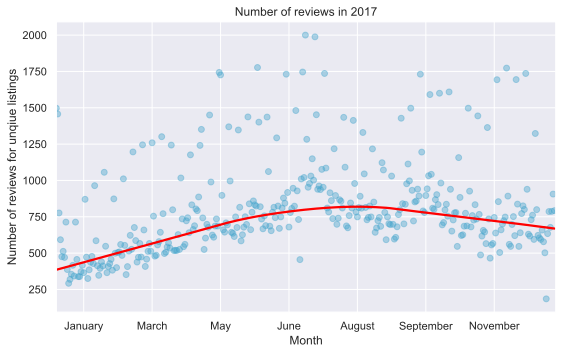

In [273]:
review_plot(num_reviews_2017, fake_month, 'review_2017', 'Month', 
            'Number of reviews in 2017', xlim=(736330, 736695))

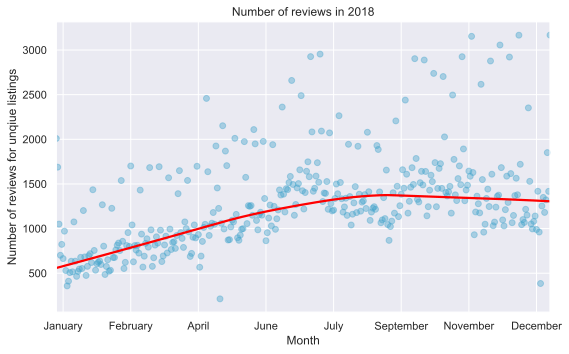

In [284]:
review_plot(num_reviews_2018, fake_month, 'review_2018', 'Month', 
            'Number of reviews in 2018', xlim=(736695, 737060))

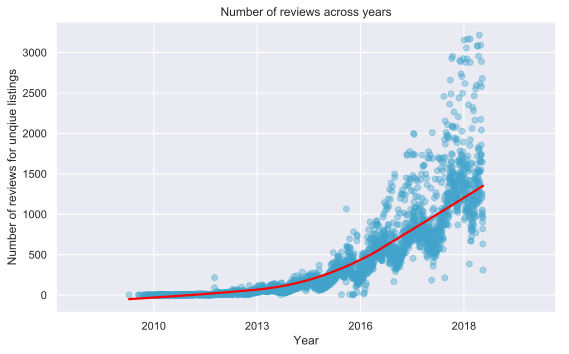

In [264]:
review_plot(num_reviews_df, fake_year, 'total_reviews', 'Year', 
            'Number of reviews across years')

## Calendar data

In [130]:
df_calendar = pd.read_csv('data/calendar.csv.gz', low_memory=False)

In [131]:
print(f"There are {df_calendar.listing_id.nunique()} of unique listings")


There are 80767 of unique listings


In [132]:
df_calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29480811 entries, 0 to 29480810
Data columns (total 7 columns):
listing_id        int64
date              object
available         object
price             object
adjusted_price    object
minimum_nights    float64
maximum_nights    float64
dtypes: float64(2), int64(1), object(4)
memory usage: 1.5+ GB


In [133]:
def clean_df(df):
    """Remove the dollar sign in front of price and adjusted_price, Convert the categorical varaible into binary variable,
       and turn date to datetime object.

       inputs:
           df: A pandas dataframe object
       returns:
           df: A cleaned version of dataframe
    """
    df1 = df.copy()
    
    df1['price'] = df1['price'].str.replace(',', '')
    df1['price'] = df1['price'].str.replace('$', '').astype(float)
    
    df1['adjusted_price'] = df1['adjusted_price'].str.replace(',', '')
    df1['adjusted_price'] = df1['adjusted_price'].str.replace('$', '').astype(float)
    
    
    df1['bookings'] = df1['available'].map(lambda x: 0 if x == 't' else 1)
    
    df1['date'] = pd.to_datetime(df1['date'])
    
    return df1
    

In [134]:
cleaned_calendar = clean_df(df_calendar)

In [135]:
num_bookings = cleaned_calendar.groupby(['listing_id']).bookings.count()
num_bookings[num_bookings > 365].head()

listing_id
41712     366
83308     366
98541     366
127652    366
139142    366
Name: bookings, dtype: int64

In [136]:
cleaned_calendar = cleaned_calendar[cleaned_calendar.date != '2020-05-05']

In [137]:
avg_booked_rate = cleaned_calendar.groupby('date')['bookings'].mean()

In [138]:
avg_booked_rate.tail()

date
2020-04-30    0.711603
2020-05-01    0.711107
2020-05-02    0.710934
2020-05-03    0.710154
2020-05-04    0.691769
Name: bookings, dtype: float64

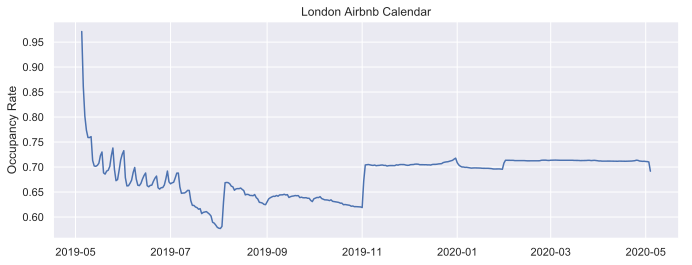

In [139]:
fig, ax = plt.subplots(figsize=(10,4))
lineplot = sns.lineplot(color='b',
             ax=ax,
             data = avg_booked_rate)
ax.set_title('London Airbnb Calendar')
ax.set_ylabel('Occupancy Rate')

lineplot.figure.savefig('calendar.png', dpi=800);

In [253]:
cleaned_calendar['month'] = cleaned_calendar['date'].dt.strftime('%B')


In [286]:
monthly_price = cleaned_calendar.groupby(['date'], sort=False)['price'].mean()
monthly_price_df = monthly_price.to_frame().reset_index()
monthly_price_df['month'] = monthly_price_df['date'].dt.strftime('%B')
#monthly_price_df['day'] = monthly_price_df['date'].dt.strftime('%A')

In [287]:
monthly_price_df = monthly_price_df[monthly_price_df.price > 105]

In [288]:
monthly_price_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 365 entries, 0 to 364
Data columns (total 3 columns):
date     365 non-null datetime64[ns]
price    365 non-null float64
month    365 non-null object
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 11.4+ KB


**Which month is more expensive to travel on?**

* The average prices tends to increases along the year except for May which is signifactly lower than the other months. In comparsion to the 'Number of reviews' plots in previous sections, the pattern is similar except for May and December. 
* December is more expensive compared to the other months. This may be because december is the holiday season and people are more likely to travel. May is the cheapest month to make a booking in Airbnb, maybe because it's closer to exam period. 

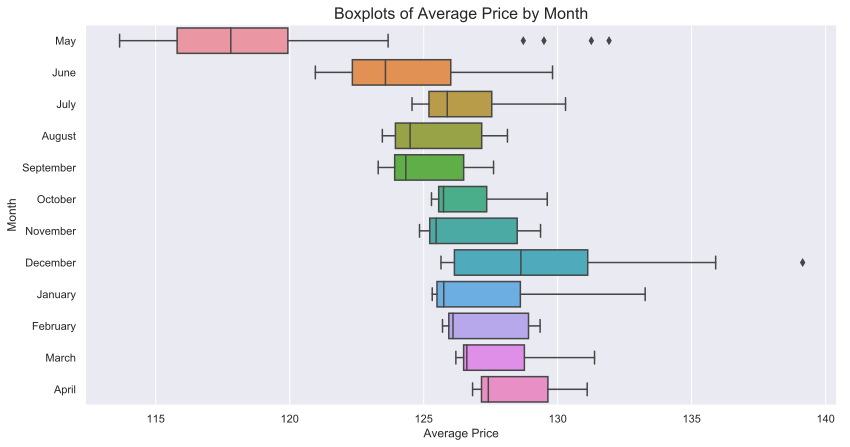

In [290]:
fig, ax = plt.subplots(figsize=(12, 7))
monthly_boxplot = sns.boxplot(monthly_price_df.price, monthly_price_df.month)
ax.set_xlabel('Average Price', fontsize=12)
ax.set_ylabel('Month', fontsize=12)
ax.set_title('Boxplots of Average Price by Month', fontsize=16);


## Listings Data

In [2]:
df_listings = pd.read_csv('data/listings.csv.gz', low_memory=False)

In [3]:
print(f'There are {df_listings.shape[0]} number of listings in London as of {df_listings.last_scraped.max()}')

There are 80767 number of listings in London as of 2019-05-07


In [4]:
df_listings.isna().mean().sort_values(ascending=False)[:60]

jurisdiction_names              1.000000
neighbourhood_group_cleansed    1.000000
xl_picture_url                  1.000000
host_acceptance_rate            1.000000
medium_url                      1.000000
thumbnail_url                   1.000000
license                         0.997920
square_feet                     0.994503
monthly_price                   0.931643
weekly_price                    0.903946
notes                           0.609791
access                          0.436701
interaction                     0.425260
house_rules                     0.416160
host_about                      0.416098
neighborhood_overview           0.371761
transit                         0.371600
security_deposit                0.353857
host_response_rate              0.314510
host_response_time              0.314510
space                           0.308567
review_scores_checkin           0.276895
review_scores_location          0.276895
review_scores_value             0.276895
review_scores_ac

### EDA and Feature Selection

* Clearly, we have to drop columns that have over 90% of missing values. This include `jurisdiction_names`, `neighbourhood_group_cleansed`, `xl_picture_url`, `host_acceptance_rate`, `medium_url`, `thumbnail_url`, `license`, `square_feet`, `monthly_price and weekly_price`.
* `listing_url`, `scrape_id`, `last_scraped`, `calendar_updated`, `host_since` can also be dropped because it does not contribute to price prediction.
* `is_location_exact` , `host_neighbourhood`, `street`, `neighbourhood`, `city`, `state`, `zipcode`, `market`, `smart_location`, `country_code` `country`, `latitude` and `longitude` will also be dropped. Most of these infomrations are overlapped. We only retain the `neighbourhood_cleansed` column which contains the borough of each listings.                       
* In this project, we are not using NLP to predict price, so text columns such as `name`, `summary`, `space`, `description`, `host_verifications`, `house_rules` can be dropped.
* `first_reviews` and `last_reviews` will also be dropped because not many people look at the time of the reviews. People are more concerned with the number of reviews when they looking for listings.
* `number_of_reviews` is highly correlated with `number_of_reviews_ltm` and `reviews_per_month` and thus can be dropped.
*

In [5]:
def annotated_heatmap(df, col, figsize=(11, 15)):
    """Return annotated heatmap of specific columns

       Arguments
       =========
       col - a list of quantative columns
    """
    corr = df[col].corr()
    # mask to hide upper triangle
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    f, ax = plt.subplots(figsize=figsize)

    heatmap = sns.heatmap(corr,
                          mask=mask,
                          square=True,
                          linewidths=.5,
                          cmap='coolwarm',
                          cbar_kws={'shrink': .5,
                                    'ticks': [-1, -.5, 0, 0.5, 1]},
                          vmin=-1,
                          vmax=1,
                          annot=True,
                          annot_kws={'size': 10})
    # add the column names as labels
    ax.set_yticklabels(corr.columns, rotation=0)
    ax.set_xticklabels(corr.columns)
    sns.set_style({'xtick.bottom': True}, {'ytick.left': True})


def plot_categorical(df, x, filename, hue=None, palette='Set1', figsize=(10, 4)):
    """
    Function that plot categorical column

    Argument
    =======
    df: pandas dataframe
    x: str. horizontal axis to plot the categorical column, y would be the count
    filename: str
    hue: seaborn hue argument. Grouping variable that will produce bars with different colors.
    palette: array, color of the plot
    figsize: the size of the figure


    Returns
    =======
    A count plot for categorical column
    """
    fig, ax = plt.subplots(figsize=figsize)
    countplot = sns.countplot(x=x, hue=hue, data=df, palette=palette)
    ax.set_title(f'Count plot for {x}')
    ax.grid(False)

    countplot.figure.savefig(f'{filename}.png', dpi=800)

In [6]:
df_listings = df_listings.drop(['jurisdiction_names', 'neighbourhood_group_cleansed', 'xl_picture_url', 'host_acceptance_rate',
                               'medium_url', 'thumbnail_url', 'license', 'square_feet', 'monthly_price', 'weekly_price',
                               'listing_url', 'scrape_id', 'last_scraped', 'calendar_updated', 'house_rules'], axis=1)

In [7]:
df_listings = df_listings.drop(['name', 'summary', 'space', 'description', 'neighborhood_overview', 'notes', 'transit', 'access', 'interaction',
                                'picture_url', 'host_id', 'host_url', 'host_name', 'host_location', 'host_about', 'host_thumbnail_url', 'host_picture_url',
                                'host_neighbourhood', 'city', 'street', 'neighbourhood', 'state', 'zipcode', 'market', 'smart_location', 'country_code', 'country',
                                'longitude', 'latitude', 'calendar_last_scraped', 'host_verifications', 'is_location_exact', 'host_since', 'first_review',
                                'last_review', 'bed_type', 'number_of_reviews_ltm', 'reviews_per_month'], axis=1)

* Minimum nights is highly correlated with `minimum_minimum_nights`, `maximum_minum_nights` and `minimum_nights_avg_ntm`. Likewise, Maximum nights is highly correlated with `minimum_maximum_nights`, `maximum_maximum_nights` and `maximum_nights_avg_ntm`. Thus we can keep only the `minimum_nights` and `maximum_nights` columns

* `host_listings_count` is highly correlated with `host_total_listings_count`, `calculated_host_listings_count`, and `calculated_host_listings_count_entire_homes`. so we only need to keep `host_listings_count`.

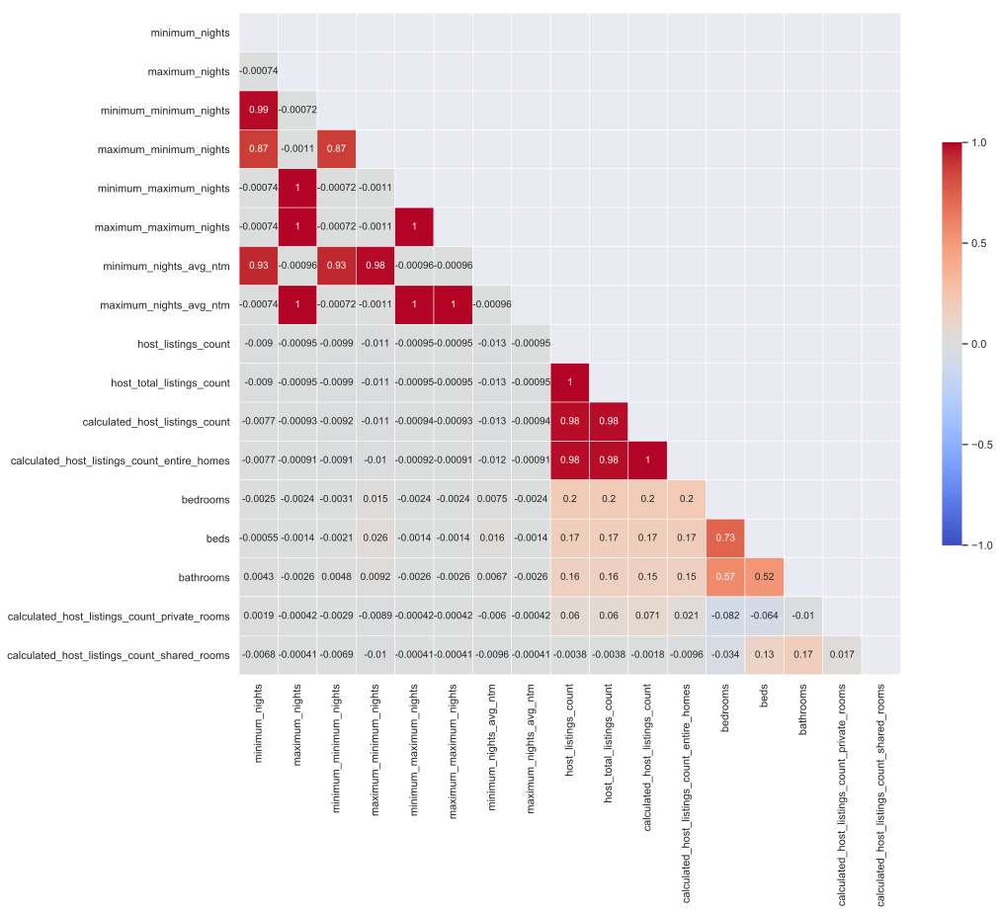

In [8]:
filtered_col = ['minimum_nights', 'maximum_nights',
              'minimum_minimum_nights', 'maximum_minimum_nights',
              'minimum_maximum_nights', 'maximum_maximum_nights',
              'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm',
              'host_listings_count', 'host_total_listings_count',
              'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes', 
              'bedrooms', 'beds', 'bathrooms', 'calculated_host_listings_count_private_rooms',
              'calculated_host_listings_count_shared_rooms',
              ]
annotated_heatmap(df_listings, filtered_col, (15, 15))

In [9]:
df_listings = df_listings.drop(['minimum_minimum_nights', 'maximum_minimum_nights',
                                'minimum_maximum_nights', 'maximum_maximum_nights',
                                'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm',
                                'host_total_listings_count', 'calculated_host_listings_count',
                                'calculated_host_listings_count_entire_homes', 'beds',
                                'calculated_host_listings_count_private_rooms',
                                'calculated_host_listings_count_shared_rooms'], axis=1)

#### Has Availability

* The has availability column has contain only one category, thus it is reducdant and can be dropped.
* `availability_30`, `availability_60`, `availability_90` and `availability_365` are highly correlated and thus we only need to keep one column. Moreover, Airbnb impose a 90-day renting limit to all listings across London. So `availability_90` is kept in this case

In [10]:
df_listings['has_availability'].value_counts()

t    80767
Name: has_availability, dtype: int64

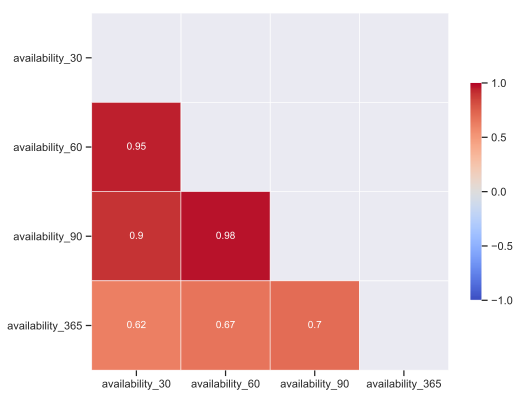

In [11]:
availability_col = ['availability_30', 'availability_60', 'availability_90', 'availability_365' ]
annotated_heatmap(df_listings, availability_col, figsize=(8, 8))

In [12]:
df_listings = df_listings.drop(['has_availability', 'availability_30', 'availability_60', 'availability_365'], axis=1)

#### Experience offered

* Most of the listings have no experience offered and thus can be dropped

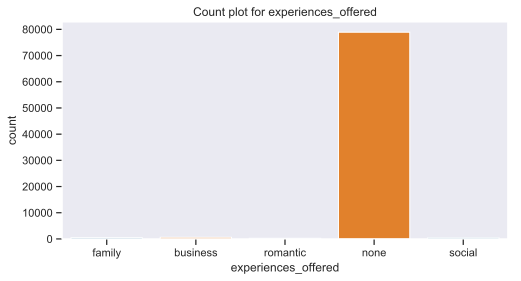

In [13]:
c_palette = ['tab:blue', 'tab:orange']
plot_categorical(df_listings, x='experiences_offered', filename='experience_count', palette=c_palette, figsize=(8,4))

In [14]:
df_listings = df_listings.drop(['experiences_offered'], axis=1)

#### host related features

* About a third of the listings have nan value which means these listings have not yet be reviewed. 65% of the listings response within a day. This is good enough for most people. Moreover, `host_response_rate` is pretty similar to `host_response_time` and people often look at `host_response_rate` when they consider to make the bookings. Thus, this measure can be dropped.

* About 31.5% of listings have not yet provided `host_reponse_rate`. It may not be appropiate to remove these listings or filling them with median or mean. We instead turing this column into discrete chunks to be used as ordinal categorical variables.

* There are 49 rows lacking values for `host_is_superhost`, `host_identity_verified`, `host_has_profile_pic`, `host_listings_count` features. It is misleading to fill the missing value for these columns and it only accounts for small proportion of listings thus it will be dropped.

In [15]:
df_listings.host_response_time.fillna("unknown", inplace=True)
df_listings.host_response_time.value_counts(normalize=True)

within an hour        0.422834
unknown               0.314510
within a few hours    0.138831
within a day          0.100821
a few days or more    0.023004
Name: host_response_time, dtype: float64

In [16]:
df_listings = df_listings.drop(['host_response_time'], axis=1)

In [17]:
print(f"The proportion of nan values in host_response rate column is around "
      f"{round(df_listings.host_response_rate.isna().sum() / len(df_listings) * 100, 1)}%")

The proportion of nan values in host_response rate column is around 31.5%


In [18]:
def bin_column(df, col, bins, labels, na_label='unknown'):
    """
    Takes a column, and segment continuous data into discrete bins with group of 
    labels and fill the na value of the column according to na_label
    
    Argument
    ========
    df: pandas dataframe
    col: str, column of dataframe
    bins: int, the criteria to bin by
    labels: arrays, specify labels for the returned bins
    na_label: values to replace missing values in col
    
    Returns
    """
    
    if df[col].dtype == 'O':
        df[col] = df[col].str[:-1].astype('float64')
        
    df[col] = pd.cut(df[col], bins=bins, labels=labels, include_lowest=True)
    df[col] = df[col].astype('str')
    df[col].replace('nan', 'unknown', inplace=True)
    df[col].fillna(na_label, inplace=True)
    

def clean_listings(df):
    """
    Remove the dollar size in the price col, fill nan value with 0 for price col
    and median for room_col, and drop rows for host_col

    Argument
    ========
    df: pandas dataframe

    Returns
    Cleaned dataframe

    """

    price_col = ['price', 'security_deposit', 'cleaning_fee', 'extra_people']
    room_col = ['bathrooms', 'bedrooms']
    host_col = ['host_is_superhost', 'host_identity_verified',
                'host_has_profile_pic', 'host_listings_count']

    df1 = df.copy()

    df1[price_col] = df1[price_col].apply(lambda x: x.str[1:], axis=0)
    df1[price_col] = df1[price_col].apply(
        lambda x: x.str.replace(",", '')).astype('float64')
    df1[price_col] = df1[price_col].fillna(value=0)

    df1[room_col] = df1[room_col].fillna(df1[room_col].median())
    df1.dropna(subset=host_col, inplace=True)

    return df1

In [19]:
df_listings[['host_is_superhost', 'host_identity_verified',
    'host_has_profile_pic', 'host_listings_count']].isna().sum()

host_is_superhost         49
host_identity_verified    49
host_has_profile_pic      49
host_listings_count       49
dtype: int64

In [20]:
bin_column(df_listings, 'host_response_rate',
          bins=[0, 50, 75, 90, 100], 
          labels=['0-49%', '50-74%',
                  '75-89%', '90-100%'],
          )

In [21]:
df_listings = clean_listings(df_listings)

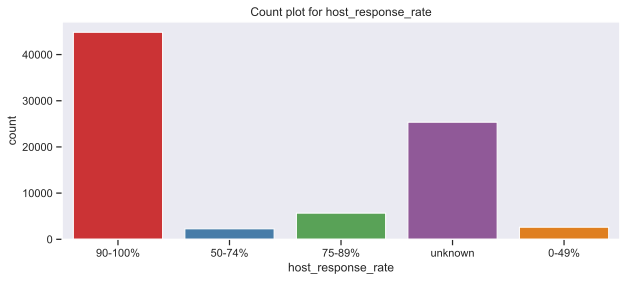

In [22]:
plot_categorical(df_listings, 'host_response_rate', 'host_response.png', hue=None, palette='Set1', figsize=(10,4))

#### Location


In [23]:
df_listings.neighbourhood_cleansed.value_counts()

Westminster               9059
Tower Hamlets             7749
Hackney                   5947
Kensington and Chelsea    5719
Camden                    5683
Islington                 4948
Southwark                 4746
Lambeth                   4670
Wandsworth                4082
Hammersmith and Fulham    4039
Brent                     2370
Lewisham                  2246
Haringey                  2073
Newham                    1887
Ealing                    1599
Greenwich                 1590
Barnet                    1532
Merton                    1326
Waltham Forest            1324
Richmond upon Thames      1147
Croydon                   1067
Hounslow                   998
Bromley                    650
Redbridge                  646
Enfield                    587
Hillingdon                 586
Kingston upon Thames       526
Harrow                     451
City of London             436
Barking and Dagenham       315
Sutton                     259
Bexley                     242
Havering

In [24]:
def london_map(geo_data, df, col, key_on, legend, marker=True):
    
    """
    Return an Interactive choropleth map of London boroughs with some of the top london attractions mark on the map
    
    Argument
    ========
    geo_data: geojson coordinate data
    df: pandas dataframe of London borough data
    col: the columns of data to be bound.
    key_on: Variable in the geo_data GeoJSON file to bind the data to.
    legend: str, Title for data legend.
    Returns
    ========
    folium map object

    """

    m = folium.Map(location=[51.4982, -0.1215], zoom_start=11.5)

    folium.Choropleth(
        geo_data=geo_data,
        name='choropleth',
        data= df,
        columns=col,
        key_on=key_on,
        fill_color='BuPu',
        fill_opacity=0.6,
        line_opacity=0.3,
        legend_name=legend,
    ).add_to(m)

    folium.LayerControl().add_to(m)
    if marker:
        folium.Marker([51.50777, -0.08771], popup='London Bridge').add_to(m)
        folium.Marker([51.50067, -0.12459], popup='Big Ben').add_to(m)
        folium.Marker([51.50331, -0.11965], popup='London Eye').add_to(m)
        folium.Marker([51.4993, -0.12731], popup='Westminster Abbey').add_to(m)
        folium.Marker([51.50019, -0.14237], popup='Buckingham Palace').add_to(m)
        folium.Marker([51.50441, -0.08647], popup='The Shard').add_to(m)
    
    return m

In [25]:
borough_geo = 'data/neighbourhoods.geojson'
borough_df = pd.DataFrame(df_listings.groupby('neighbourhood_cleansed')['review_scores_rating'].mean())
borough_df.rename(columns={0: 'review_scores_rating'}, inplace=True)
borough_df['median_price'] = df_listings.groupby('neighbourhood_cleansed').price.median()
borough_df = borough_df.reset_index()

In [293]:
borough_df.sort_values(by='median_price', ascending=False)

,neighbourhood_cleansed,review_scores_rating,median_price
19,Kensington and Chelsea,91.764254,145.0
6,City of London,91.142857,143.0
32,Westminster,90.704166,130.0
5,Camden,91.874067,100.0
18,Islington,93.112554,90.0
12,Hammersmith and Fulham,92.715480,90.0
26,Richmond upon Thames,95.203242,89.0
31,Wandsworth,94.494277,84.0
27,Southwark,93.090658,79.0
11,Hackney,94.324152,72.0


In [294]:
borough_df.sort_values(by='review_scores_rating', ascending=False).head(5)

,neighbourhood_cleansed,review_scores_rating,median_price
26,Richmond upon Thames,95.203242,89.0
15,Havering,95.007407,46.0
20,Kingston upon Thames,94.778976,54.0
23,Merton,94.773148,65.0
28,Sutton,94.623596,45.0


**Whcih boroughs are more expensive, and which areas have the best reviews?**

* It is not surprised that Kensington and Chelsea borough is the most expensive borough to book a property. This borough is closed to many of the museums and department stores such as Harrods, Peter Jones and Harvey Nichols. Moreover, many of the most expensive residential properties in the world lie in this brough. The second one is the City of Westminster. This borough closes to many of the famous London landmarks, shopping areas and night-time entertainment area Soho. In general, inner london has much higher than than outer london area.

* All of the london boroughs has average score ratings higher than 90 out of 100. As opposed to the price, outer london has higher review score ratings than inner london. Richmond upon Thames is the highest scores rating borough. The borough is home to open space such as Richmond Park, Kew Gardens, Bushy Park and Old Deer Park. 

In [26]:
price_col = ['neighbourhood_cleansed', 'median_price']
price_london_map = london_map(borough_geo, borough_df, price_col, key_on='feature.properties.neighbourhood', 
                              legend='Median Price')
price_london_map

In [27]:
review_col = ['neighbourhood_cleansed', 'review_scores_rating']
review_london_map = london_map(borough_geo, borough_df, review_col, key_on='feature.properties.neighbourhood', 
                              legend='Average review scores', marker=False)
review_london_map

In [28]:
borough_df.sort_values('review_scores_rating', ascending=False)

,neighbourhood_cleansed,review_scores_rating,median_price
26,Richmond upon Thames,95.203242,89.0
15,Havering,95.007407,46.0
20,Kingston upon Thames,94.778976,54.0
23,Merton,94.773148,65.0
28,Sutton,94.623596,45.0
13,Haringey,94.520464,50.0
31,Wandsworth,94.494277,84.0
11,Hackney,94.324152,72.0
1,Barnet,94.041372,55.0
21,Lambeth,94.011255,70.0


#### Property type

* There are large number of property type that only has a few listings. We grouped similar property types into five categroies: House, Apartment, Guesthouse, Hotel, Other

* As expected, Hotel has the highest median price. Both Apartments and houses price varies a lot.

In [29]:
# group similar property type together
df_listings.property_type.replace({
    'Townhouse': 'House',
    'Serviced apartment': 'Apartment',
    'Condominium': 'Apartment',
    'Bed and breakfast': 'Guesthouse',
    'Loft': 'Apartment',
    'Guest suite': 'Guesthouse',
    'Hostel': 'Guesthouse',
    'Boutique hotel': 'Hotel',
    'Bungalow': 'House',
    'Cottage': 'House',
    'Aparthotel': 'Hotel',
    'Cottage': 'House',
    'Aparthotel': 'Hotel',
    'Villa': 'House',
    'Tiny house': 'House',
    'Chalet': 'House',
    'Earth house': 'House',
    'Dome house': 'House'
}, inplace=True)


In [30]:
df_listings.loc[~df_listings.property_type.isin(['House', 'Apartment', 'Guesthouse', 'Hotel']), 'property_type'] = 'Other'

In [31]:
df_listings.property_type.value_counts()

Apartment     58402
House         19828
Guesthouse     1697
Other           407
Hotel           384
Name: property_type, dtype: int64

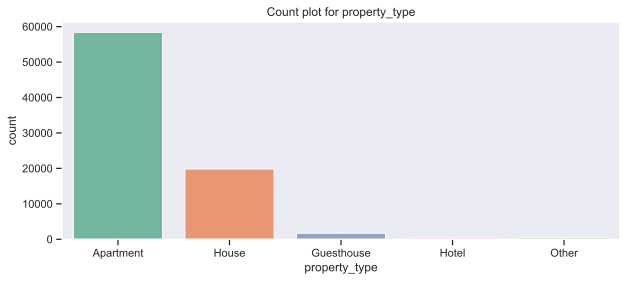

In [32]:
plot_categorical(df_listings, 'property_type', 'property_type.png', hue=None, palette='Set2', figsize=(10,4))

In [33]:
df_listings.loc[(df_listings.price <= 600) & (df_listings.price > 0)]

,id,host_response_rate,host_is_superhost,host_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,property_type,room_type,accommodates,bathrooms,bedrooms,amenities,price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_90,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
0,11551,90-100%,f,3.0,t,t,Lambeth,Apartment,Entire home/apt,4,1.0,1.0,"{TV,""Cable TV"",Internet,Wifi,Kitchen,""Paid par...",88.0,350.0,50.0,2,20.0,2,180,20,183,92.0,9.0,9.0,10.0,10.0,9.0,9.0,f,f,f,strict_14_with_grace_period,f,t
1,13913,50-74%,f,4.0,t,f,Islington,Apartment,Private room,2,1.0,1.0,"{TV,""Cable TV"",Wifi,Kitchen,""Paid parking off ...",65.0,100.0,15.0,1,15.0,1,29,87,14,95.0,9.0,10.0,9.0,10.0,9.0,9.0,f,f,f,moderate,f,f
2,15400,90-100%,f,1.0,t,t,Kensington and Chelsea,Apartment,Entire home/apt,2,1.0,1.0,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",100.0,150.0,50.0,2,0.0,3,50,1,84,95.0,10.0,10.0,10.0,10.0,10.0,9.0,f,f,f,strict_14_with_grace_period,t,t
3,17402,75-89%,t,16.0,t,t,Westminster,Apartment,Entire home/apt,6,2.0,3.0,"{TV,Wifi,Kitchen,""Paid parking off premises"",E...",300.0,350.0,65.0,4,10.0,3,365,17,40,93.0,10.0,9.0,9.0,9.0,10.0,9.0,f,t,f,strict_14_with_grace_period,f,f
4,24328,90-100%,t,2.0,t,t,Wandsworth,House,Entire home/apt,2,1.5,1.0,"{TV,""Cable TV"",Internet,Wifi,Kitchen,""Free par...",175.0,250.0,70.0,2,0.0,30,1125,57,92,98.0,10.0,10.0,10.0,10.0,9.0,9.0,f,f,f,moderate,t,t
5,25023,90-100%,t,1.0,t,f,Wandsworth,Apartment,Entire home/apt,4,1.0,2.0,"{TV,Wifi,Kitchen,""Free parking on premises"",El...",65.0,250.0,50.0,2,11.0,4,100,9,27,91.0,10.0,9.0,9.0,9.0,9.0,9.0,f,f,f,moderate,f,f
6,25123,90-100%,t,3.0,t,f,Barnet,House,Private room,2,1.5,1.0,"{Wifi,Kitchen,""Buzzer/wireless intercom"",Heati...",29.0,100.0,0.0,1,8.0,10,1120,1,119,95.0,10.0,10.0,10.0,10.0,9.0,10.0,f,t,f,strict_14_with_grace_period,f,f
7,26223,90-100%,f,4.0,t,t,Islington,Apartment,Entire home/apt,4,1.0,1.0,"{TV,""Cable TV"",Internet,Wifi,Kitchen,""Paid par...",147.0,100.0,75.0,3,15.0,3,365,72,61,85.0,8.0,9.0,9.0,9.0,9.0,8.0,f,t,f,strict_14_with_grace_period,f,f
8,26682,unknown,f,1.0,t,t,Kensington and Chelsea,Apartment,Private room,1,1.0,1.0,"{TV,Internet,Wifi,Kitchen,""Pets allowed"",Break...",75.0,200.0,25.0,1,0.0,1,90,88,5,76.0,8.0,8.0,8.0,8.0,9.0,9.0,f,f,f,moderate,f,f
9,31361,90-100%,t,2.0,t,t,Newham,House,Private room,2,1.5,1.0,"{TV,Wifi,Kitchen,""Paid parking off premises"",B...",34.0,0.0,10.0,1,12.0,1,30,72,110,97.0,10.0,10.0,10.0,10.0,9.0,10.0,f,f,f,strict_14_with_grace_period,t,t


In [34]:
def box_plot_price(x, figsize=(10, 5)):
    """
    Return ordered box plots with differet categories
    
    Arguments
    =========
        x: categorical variable
        figsize: tuple, size of the figure
    
    """
    filtered_df = df_listings.loc[(df_listings.price <= 600) & (df_listings.price > 0)]
    sort_price = filtered_df.groupby(x)['price'].median()\
                 .sort_values(ascending=False).index
    
    fig, ax = plt.subplots(figsize=figsize)
    sns.boxplot(y='price', x=x, data=filtered_df, order=sort_price)
    ax.set_xticklabels(ax.get_xticklabels())
    

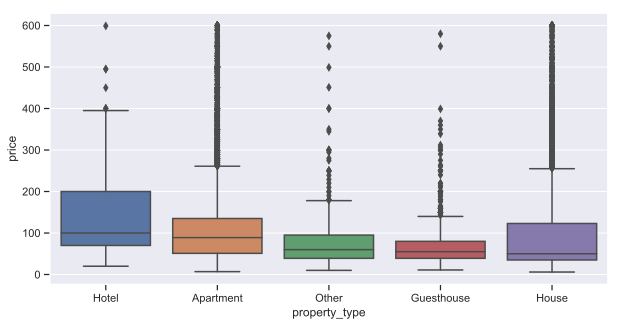

In [35]:
box_plot_price('property_type')

#### Room Type

In [36]:
df_listings.room_type.value_counts()

Entire home/apt    45046
Private room       34934
Shared room          738
Name: room_type, dtype: int64

* Entire home/apt has much higher median price than the other room types
* As expected, many of the private room has price lower than £100. Also, Entire home/apt has the most number of listings. 

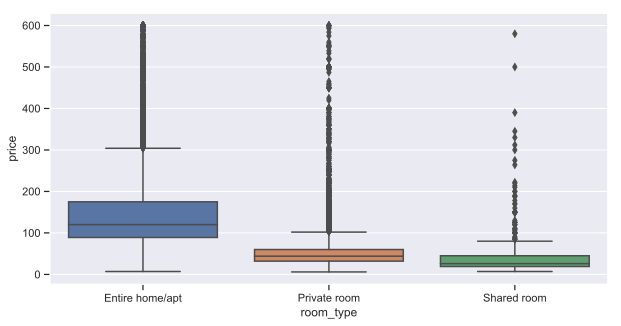

In [37]:
box_plot_price('room_type')

Text(0.5,0,'Listing price in $')

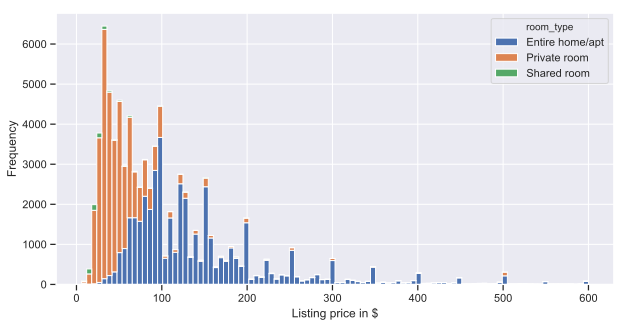

In [38]:
fig, ax = plt.subplots(figsize=(10, 5))
df_listings.loc[(df_listings.price <= 600) & (df_listings.price > 0)]\
    .pivot(columns='room_type', values='price')\
    .plot.hist(stacked=True, bins=100, ax=ax)
plt.xlabel('Listing price in $')

#### Amenities

* Wifi, heating, essential, Washer are most common ammenities.
* We use count vectorizer to turn text into word count vectors that can be used in machine learning models.
* There are 201 features for amenities. We have to reduce the number of features. It can be done by removing categories that appear fewer than 15% of listings.


In [39]:
df_listings.amenities = df_listings.amenities.str.replace("[{}]", "").str.replace('"', "")

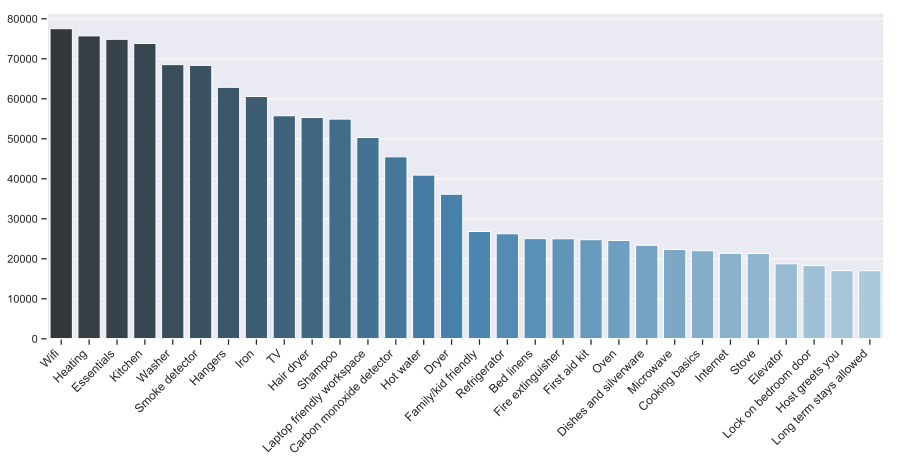

In [40]:
fig, ax = plt.subplots(figsize=(15, 6))
color = next(ax._get_lines.prop_cycler)['color']
top_30_amenities = pd.Series(np.concatenate(np.array(df_listings['amenities'].map(lambda amns: amns.split(",")))))\
          .value_counts().head(30)

sns.barplot(top_30_amenities.index, top_30_amenities.values, palette=("Blues_d"))
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=12);


In [41]:
df_listings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80718 entries, 0 to 80766
Data columns (total 35 columns):
id                                  80718 non-null int64
host_response_rate                  80718 non-null object
host_is_superhost                   80718 non-null object
host_listings_count                 80718 non-null float64
host_has_profile_pic                80718 non-null object
host_identity_verified              80718 non-null object
neighbourhood_cleansed              80718 non-null object
property_type                       80718 non-null object
room_type                           80718 non-null object
accommodates                        80718 non-null int64
bathrooms                           80718 non-null float64
bedrooms                            80718 non-null float64
amenities                           80718 non-null object
price                               80718 non-null float64
security_deposit                    80718 non-null float64
cleaning_fee      

#### Review scores columns

* review_scores columns are highly coorelated with each other, thus we can keep only one column
*


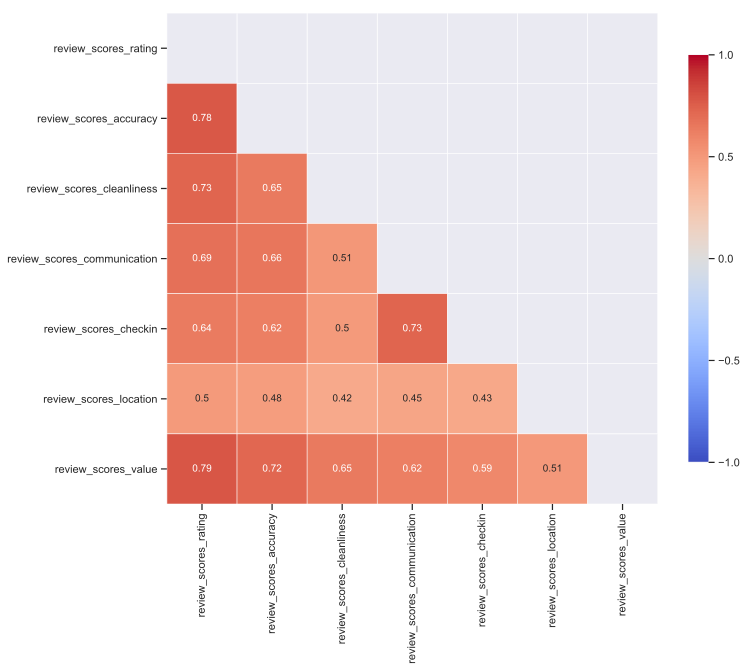

In [42]:
review_columns = ['review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness',
                  'review_scores_communication', 'review_scores_checkin', 'review_scores_location', 'review_scores_value']
annotated_heatmap(df_listings, review_columns, figsize=(11, 15))

In [43]:
review_col_drop = ['review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_value',
                   'review_scores_communication', 'review_scores_checkin', 'review_scores_location']
df_listings = df_listings.drop(review_col_drop, axis=1)

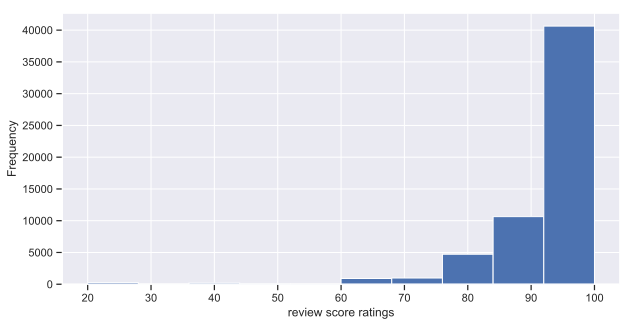

In [44]:
fig, ax = plt.subplots(figsize=(10, 5))
df_listings.review_scores_rating.hist(bins=10, ax=ax)
ax.set_xlabel('review score ratings')
ax.set_ylabel('Frequency');

In [45]:
bin_column(df_listings, 'review_scores_rating', 
          bins=[0, 80, 95, 100],
          labels=['0-79', '80-94', '95-100'],
          na_label='no reviews')

In [46]:
df_listings.cancellation_policy.value_counts()

strict_14_with_grace_period    34226
flexible                       26340
moderate                       19298
super_strict_30                  425
super_strict_60                  411
luxury_moderate                    9
strict                             9
Name: cancellation_policy, dtype: int64

###  Modelling Listing price

In this section, we first prepare data for machine learning algorithms. Count vectorizer will be used for amenities columns which contains text. One-hot encoding will be applied for categorical variables.  Next, we use random forest regressions and XGBoost to predict the listing's price. The evaluation metrics used will be RMSE and r squared.

In [47]:
df_listings.amenities = df_listings.amenities.str.replace("[{}]", "").str.replace('"', "").str.strip()

In [48]:
count_vectorizer =  CountVectorizer(tokenizer=lambda x: x.split(','))
amenities = count_vectorizer.fit_transform(df_listings['amenities'])
df_amenities = pd.DataFrame(amenities.toarray(), columns=count_vectorizer.get_feature_names())
df_amenities = df_amenities.drop('', axis=1)

In [49]:
amenities_to_remove = []
for col in df_amenities.columns:
    if (df_amenities[col].sum() / len(df_listings) * 100) < 15:
        amenities_to_remove.append(col)

df_amenities = df_amenities.drop(amenities_to_remove, axis=1)


In [50]:
df_listings.drop('amenities', axis=1, inplace=True)

In [51]:
# Replace True False into 1 and 0
df_listings = df_listings.replace({'f': 0, 't': 1})

In [52]:
new_listings = pd.get_dummies(df_listings)

In [53]:
# concatenate amenities feautres
new_listings = pd.concat([new_listings, df_amenities], axis=1, join='inner')

In [114]:
# log transform price:
new_listings['price'] = new_listings['price'].astype('float64').replace(0.0, 0.01)
new_listings['price'] = np.log(new_listings['price'])

export_csv = new_listings.to_csv (r'preprocessed_data/listing.csv', index = None, header=True)

In [116]:
df_listings_cat = pd.concat([df_listings, df_amenities], axis=1, join='inner')
df_listings_cat['price'] =  df_listings_cat['price'].astype('float64').replace(0.0, 0.01)
df_listings_cat['price'] = np.log(df_listings_cat['price'])
export_csv_cat = df_listings_cat.to_csv(r'preprocessed_data/listing_cat.csv', 
                                        index = None, header=True)

In [56]:
X = new_listings.drop('price', axis=1)
y = new_listings.price
X_cat = df_listings_cat.drop('price', axis=1)
y_cat = df_listings_cat.price

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
X_train_cat, X_test_cat, y_train_cat, y_test_cat = train_test_split(X_cat, y_cat, test_size=0.25, random_state=42)

####  Random Forest Regressor

In [58]:
print('Training set shape', X_train.shape)
print('Training labels shape', y_train.shape)
print('Testing set shape', X_test.shape)
print('Testing labels shape', y_test.shape)

Training set shape (60501, 116)
Training labels shape (60501,)
Testing set shape (20168, 116)
Testing labels shape (20168,)


In [67]:
# Instantiate model
rf = RandomForestRegressor(n_estimators=500, 
                           random_state=42,
                           n_jobs=-1)
rf.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
           oob_score=False, random_state=42, verbose=0, warm_start=False)

In [69]:
print('Parameters currently in use: \n')
pprint(rf.get_params())

Parameters currently in use: 

{'bootstrap': True,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 500,
 'n_jobs': -1,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


#### Random Search with Cross Validation

In [70]:
# Numbe of trees in random forest
n_estimators = [int(x) for x in np.linspace(200, 2000, num=5)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(20, 100, num = 5)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [20, 40, 60, 80, 100, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [200, 650, 1100, 1550, 2000]}


In [71]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor(random_state = 42)
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores

rf_random = RandomizedSearchCV(estimator=rf, param_distributions=random_grid,
                              n_iter = 20, scoring='neg_mean_squared_error', 
                              cv = 3, verbose=2, random_state=42, n_jobs=-1,
                              return_train_score=True)

# Fit the random search model
rf_random.fit(X_train, y_train);

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed: 46.1min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed: 164.3min finished


In [72]:
rf_random.best_params_

{'n_estimators': 1550,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': None,
 'bootstrap': False}

In [103]:
def evaluate(model, X_test, y_test):
    y_test_pred = model.predict(X_test)
    rmse_rf = (mean_squared_error(y_test, y_test_pred))**0.5
    r2score = r2_score(y_test, y_test_pred)
    
    print(f'RMSE test: {rmse_rf}')
    print(f'R2 score test: {r2score}')
    
    return rmse_rf, r2score

In [79]:
base_model = RandomForestRegressor(n_estimators=500, 
                           random_state=42,
                           n_jobs=-1)

base_model.fit(X_train, y_train)
base_rmse, base_r2 = evaluate(base_model, X_test, y_test)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
           oob_score=False, random_state=42, verbose=0, warm_start=False)

RMSE test: 0.1737647029434023
R2 score test: 0.7255018998606462


In [110]:
best_random = RandomForestRegressor(n_estimators=1550,
                                    min_samples_split=10,
                                    min_samples_leaf=1,
                                    max_features='sqrt',
                                    max_depth=None,
                                    bootstrap=False)
best_random.fit(X_train, y_train)
best_rmse, best_r2 = evaluate(best_random, X_test, y_test)

RandomForestRegressor(bootstrap=False, criterion='mse', max_depth=None,
           max_features='sqrt', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=10,
           min_weight_fraction_leaf=0.0, n_estimators=1550, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)

RMSE test: 0.4143680682673386
R2 score test: 0.7287621194307339


In [86]:
print(f"The model after using RandomizedSearchCV improve the RMSE by " 
      f"{100 * (base_rmse - best_rmse) / base_rmse:.2f}%")

print(f"The model after using RandomizedSearchCV improve the r2 score by " 
      f"{100 * (best_r2 - base_r2) / base_r2:.2f}%")

The model after using RandomizedSearchCV improve the RMSE by 1.08%
The model after using RandomizedSearchCV improve the r2 score by 0.41%


#### CatBoost

* Without hyperparameter tuning, the out-of-box algorithm is already better than the tuned random forest model

In [63]:
def column_index(df, query_cols):
    cols = df.columns.values
    sidx = np.argsort(cols)
    return sidx[np.searchsorted(cols, query_cols, sorter=sidx)]

categorical = ['host_response_rate', 'neighbourhood_cleansed', 'property_type', 'room_type',
               'review_scores_rating', 'cancellation_policy']

categorical_features_indices = column_index(X_cat, categorical)

In [92]:
model=CatBoostRegressor(loss_function='RMSE')
model.fit(X_train_cat, y_train_cat,cat_features=categorical_features_indices,eval_set=(X_test_cat, y_test_cat),plot=True);

A Jupyter Widget

0:	learn: 4.3461433	test: 4.3433184	best: 4.3433184 (0)	total: 70.2ms	remaining: 1m 10s
1:	learn: 4.2193005	test: 4.2165714	best: 4.2165714 (1)	total: 138ms	remaining: 1m 8s
2:	learn: 4.0952365	test: 4.0926687	best: 4.0926687 (2)	total: 219ms	remaining: 1m 12s
3:	learn: 3.9751386	test: 3.9728028	best: 3.9728028 (3)	total: 311ms	remaining: 1m 17s
4:	learn: 3.8584877	test: 3.8563088	best: 3.8563088 (4)	total: 383ms	remaining: 1m 16s
5:	learn: 3.7454998	test: 3.7435348	best: 3.7435348 (5)	total: 470ms	remaining: 1m 17s
6:	learn: 3.6359900	test: 3.6341655	best: 3.6341655 (6)	total: 571ms	remaining: 1m 20s
7:	learn: 3.5296635	test: 3.5279218	best: 3.5279218 (7)	total: 672ms	remaining: 1m 23s
8:	learn: 3.4266017	test: 3.4250918	best: 3.4250918 (8)	total: 781ms	remaining: 1m 25s
9:	learn: 3.3268777	test: 3.3255523	best: 3.3255523 (9)	total: 856ms	remaining: 1m 24s
10:	learn: 3.2302368	test: 3.2290490	best: 3.2290490 (10)	total: 944ms	remaining: 1m 24s
11:	learn: 3.1364018	test: 3.1353501	best

94:	learn: 0.5428862	test: 0.5473726	best: 0.5473726 (94)	total: 6.82s	remaining: 1m 4s
95:	learn: 0.5387549	test: 0.5432727	best: 0.5432727 (95)	total: 6.91s	remaining: 1m 5s
96:	learn: 0.5344507	test: 0.5388808	best: 0.5388808 (96)	total: 7s	remaining: 1m 5s
97:	learn: 0.5306860	test: 0.5350850	best: 0.5350850 (97)	total: 7.07s	remaining: 1m 5s
98:	learn: 0.5270346	test: 0.5314593	best: 0.5314593 (98)	total: 7.14s	remaining: 1m 4s
99:	learn: 0.5234360	test: 0.5279125	best: 0.5279125 (99)	total: 7.21s	remaining: 1m 4s
100:	learn: 0.5200285	test: 0.5244553	best: 0.5244553 (100)	total: 7.27s	remaining: 1m 4s
101:	learn: 0.5168756	test: 0.5212989	best: 0.5212989 (101)	total: 7.34s	remaining: 1m 4s
102:	learn: 0.5139358	test: 0.5183825	best: 0.5183825 (102)	total: 7.4s	remaining: 1m 4s
103:	learn: 0.5108420	test: 0.5152763	best: 0.5152763 (103)	total: 7.47s	remaining: 1m 4s
104:	learn: 0.5079681	test: 0.5124684	best: 0.5124684 (104)	total: 7.54s	remaining: 1m 4s
105:	learn: 0.5052960	test

188:	learn: 0.4398584	test: 0.4453228	best: 0.4453228 (188)	total: 13.5s	remaining: 57.9s
189:	learn: 0.4395298	test: 0.4450132	best: 0.4450132 (189)	total: 13.6s	remaining: 57.8s
190:	learn: 0.4392964	test: 0.4447743	best: 0.4447743 (190)	total: 13.6s	remaining: 57.7s
191:	learn: 0.4391149	test: 0.4446418	best: 0.4446418 (191)	total: 13.7s	remaining: 57.6s
192:	learn: 0.4388289	test: 0.4443778	best: 0.4443778 (192)	total: 13.8s	remaining: 57.6s
193:	learn: 0.4386361	test: 0.4442155	best: 0.4442155 (193)	total: 13.8s	remaining: 57.5s
194:	learn: 0.4384175	test: 0.4440677	best: 0.4440677 (194)	total: 13.9s	remaining: 57.4s
195:	learn: 0.4382100	test: 0.4438633	best: 0.4438633 (195)	total: 14s	remaining: 57.3s
196:	learn: 0.4380264	test: 0.4436683	best: 0.4436683 (196)	total: 14.1s	remaining: 57.3s
197:	learn: 0.4377968	test: 0.4434825	best: 0.4434825 (197)	total: 14.1s	remaining: 57.2s
198:	learn: 0.4376728	test: 0.4433723	best: 0.4433723 (198)	total: 14.2s	remaining: 57.1s
199:	learn: 

282:	learn: 0.4255515	test: 0.4320101	best: 0.4320101 (282)	total: 20.2s	remaining: 51.1s
283:	learn: 0.4254835	test: 0.4319627	best: 0.4319627 (283)	total: 20.2s	remaining: 51s
284:	learn: 0.4253693	test: 0.4318662	best: 0.4318662 (284)	total: 20.3s	remaining: 50.9s
285:	learn: 0.4253107	test: 0.4318162	best: 0.4318162 (285)	total: 20.4s	remaining: 50.9s
286:	learn: 0.4252195	test: 0.4317535	best: 0.4317535 (286)	total: 20.5s	remaining: 50.9s
287:	learn: 0.4250330	test: 0.4315254	best: 0.4315254 (287)	total: 20.5s	remaining: 50.8s
288:	learn: 0.4249686	test: 0.4314727	best: 0.4314727 (288)	total: 20.6s	remaining: 50.7s
289:	learn: 0.4247955	test: 0.4313067	best: 0.4313067 (289)	total: 20.7s	remaining: 50.6s
290:	learn: 0.4247410	test: 0.4312693	best: 0.4312693 (290)	total: 20.8s	remaining: 50.6s
291:	learn: 0.4246946	test: 0.4312397	best: 0.4312397 (291)	total: 20.9s	remaining: 50.6s
292:	learn: 0.4245832	test: 0.4311752	best: 0.4311752 (292)	total: 21s	remaining: 50.6s
293:	learn: 0.

376:	learn: 0.4173951	test: 0.4251925	best: 0.4251925 (376)	total: 26.8s	remaining: 44.2s
377:	learn: 0.4173210	test: 0.4251084	best: 0.4251084 (377)	total: 26.8s	remaining: 44.2s
378:	learn: 0.4172266	test: 0.4250111	best: 0.4250111 (378)	total: 26.9s	remaining: 44.1s
379:	learn: 0.4171142	test: 0.4249568	best: 0.4249568 (379)	total: 27s	remaining: 44s
380:	learn: 0.4170792	test: 0.4249424	best: 0.4249424 (380)	total: 27s	remaining: 43.9s
381:	learn: 0.4170153	test: 0.4248866	best: 0.4248866 (381)	total: 27.1s	remaining: 43.8s
382:	learn: 0.4169395	test: 0.4248372	best: 0.4248372 (382)	total: 27.2s	remaining: 43.8s
383:	learn: 0.4168754	test: 0.4248083	best: 0.4248083 (383)	total: 27.2s	remaining: 43.7s
384:	learn: 0.4168578	test: 0.4247982	best: 0.4247982 (384)	total: 27.3s	remaining: 43.6s
385:	learn: 0.4167754	test: 0.4247526	best: 0.4247526 (385)	total: 27.4s	remaining: 43.5s
386:	learn: 0.4167498	test: 0.4247393	best: 0.4247393 (386)	total: 27.4s	remaining: 43.5s
387:	learn: 0.41

468:	learn: 0.4119247	test: 0.4212185	best: 0.4212185 (468)	total: 33.3s	remaining: 37.7s
469:	learn: 0.4119071	test: 0.4212073	best: 0.4212073 (469)	total: 33.4s	remaining: 37.7s
470:	learn: 0.4118452	test: 0.4211722	best: 0.4211722 (470)	total: 33.5s	remaining: 37.6s
471:	learn: 0.4117648	test: 0.4211121	best: 0.4211121 (471)	total: 33.5s	remaining: 37.5s
472:	learn: 0.4116845	test: 0.4210384	best: 0.4210384 (472)	total: 33.6s	remaining: 37.4s
473:	learn: 0.4116472	test: 0.4210056	best: 0.4210056 (473)	total: 33.7s	remaining: 37.4s
474:	learn: 0.4116159	test: 0.4209911	best: 0.4209911 (474)	total: 33.8s	remaining: 37.3s
475:	learn: 0.4115852	test: 0.4209793	best: 0.4209793 (475)	total: 33.8s	remaining: 37.2s
476:	learn: 0.4115488	test: 0.4209576	best: 0.4209576 (476)	total: 33.9s	remaining: 37.2s
477:	learn: 0.4115073	test: 0.4209196	best: 0.4209196 (477)	total: 34s	remaining: 37.1s
478:	learn: 0.4114576	test: 0.4208966	best: 0.4208966 (478)	total: 34s	remaining: 37s
479:	learn: 0.41

560:	learn: 0.4079360	test: 0.4184009	best: 0.4184009 (560)	total: 39.8s	remaining: 31.1s
561:	learn: 0.4079061	test: 0.4184005	best: 0.4184005 (561)	total: 39.8s	remaining: 31.1s
562:	learn: 0.4078411	test: 0.4183643	best: 0.4183643 (562)	total: 39.9s	remaining: 31s
563:	learn: 0.4077805	test: 0.4183325	best: 0.4183325 (563)	total: 40s	remaining: 30.9s
564:	learn: 0.4077692	test: 0.4183236	best: 0.4183236 (564)	total: 40.1s	remaining: 30.8s
565:	learn: 0.4077400	test: 0.4183071	best: 0.4183071 (565)	total: 40.1s	remaining: 30.8s
566:	learn: 0.4076763	test: 0.4182539	best: 0.4182539 (566)	total: 40.2s	remaining: 30.7s
567:	learn: 0.4075975	test: 0.4181723	best: 0.4181723 (567)	total: 40.3s	remaining: 30.6s
568:	learn: 0.4075245	test: 0.4181180	best: 0.4181180 (568)	total: 40.3s	remaining: 30.5s
569:	learn: 0.4074965	test: 0.4181018	best: 0.4181018 (569)	total: 40.4s	remaining: 30.5s
570:	learn: 0.4074557	test: 0.4180723	best: 0.4180723 (570)	total: 40.5s	remaining: 30.4s
571:	learn: 0.

654:	learn: 0.4042613	test: 0.4159754	best: 0.4159754 (654)	total: 47.3s	remaining: 24.9s
655:	learn: 0.4041595	test: 0.4158384	best: 0.4158384 (655)	total: 47.4s	remaining: 24.9s
656:	learn: 0.4041348	test: 0.4158340	best: 0.4158340 (656)	total: 47.5s	remaining: 24.8s
657:	learn: 0.4041014	test: 0.4158228	best: 0.4158228 (657)	total: 47.5s	remaining: 24.7s
658:	learn: 0.4040604	test: 0.4157830	best: 0.4157830 (658)	total: 47.6s	remaining: 24.6s
659:	learn: 0.4040303	test: 0.4157685	best: 0.4157685 (659)	total: 47.7s	remaining: 24.6s
660:	learn: 0.4039773	test: 0.4157562	best: 0.4157562 (660)	total: 47.7s	remaining: 24.5s
661:	learn: 0.4039611	test: 0.4157468	best: 0.4157468 (661)	total: 47.8s	remaining: 24.4s
662:	learn: 0.4039495	test: 0.4157411	best: 0.4157411 (662)	total: 47.9s	remaining: 24.3s
663:	learn: 0.4039139	test: 0.4157234	best: 0.4157234 (663)	total: 47.9s	remaining: 24.3s
664:	learn: 0.4038697	test: 0.4157006	best: 0.4157006 (664)	total: 48s	remaining: 24.2s
665:	learn: 

746:	learn: 0.4013804	test: 0.4143427	best: 0.4143427 (746)	total: 54.3s	remaining: 18.4s
747:	learn: 0.4013739	test: 0.4143409	best: 0.4143409 (747)	total: 54.3s	remaining: 18.3s
748:	learn: 0.4013455	test: 0.4143290	best: 0.4143290 (748)	total: 54.4s	remaining: 18.2s
749:	learn: 0.4013301	test: 0.4143231	best: 0.4143231 (749)	total: 54.5s	remaining: 18.2s
750:	learn: 0.4013067	test: 0.4143122	best: 0.4143122 (750)	total: 54.6s	remaining: 18.1s
751:	learn: 0.4012711	test: 0.4142946	best: 0.4142946 (751)	total: 54.6s	remaining: 18s
752:	learn: 0.4012066	test: 0.4142410	best: 0.4142410 (752)	total: 54.7s	remaining: 17.9s
753:	learn: 0.4011911	test: 0.4142373	best: 0.4142373 (753)	total: 54.8s	remaining: 17.9s
754:	learn: 0.4011615	test: 0.4142076	best: 0.4142076 (754)	total: 54.8s	remaining: 17.8s
755:	learn: 0.4011528	test: 0.4142059	best: 0.4142059 (755)	total: 54.9s	remaining: 17.7s
756:	learn: 0.4011051	test: 0.4141621	best: 0.4141621 (756)	total: 54.9s	remaining: 17.6s
757:	learn: 

840:	learn: 0.3985860	test: 0.4126215	best: 0.4126215 (840)	total: 1m	remaining: 11.5s
841:	learn: 0.3985564	test: 0.4126171	best: 0.4126171 (841)	total: 1m	remaining: 11.4s
842:	learn: 0.3985337	test: 0.4126129	best: 0.4126129 (842)	total: 1m	remaining: 11.3s
843:	learn: 0.3985098	test: 0.4126020	best: 0.4126020 (843)	total: 1m	remaining: 11.3s
844:	learn: 0.3984587	test: 0.4125839	best: 0.4125839 (844)	total: 1m 1s	remaining: 11.2s
845:	learn: 0.3984445	test: 0.4125801	best: 0.4125801 (845)	total: 1m 1s	remaining: 11.1s
846:	learn: 0.3983911	test: 0.4125577	best: 0.4125577 (846)	total: 1m 1s	remaining: 11s
847:	learn: 0.3983719	test: 0.4125450	best: 0.4125450 (847)	total: 1m 1s	remaining: 11s
848:	learn: 0.3983579	test: 0.4125362	best: 0.4125362 (848)	total: 1m 1s	remaining: 10.9s
849:	learn: 0.3983299	test: 0.4125302	best: 0.4125302 (849)	total: 1m 1s	remaining: 10.8s
850:	learn: 0.3982833	test: 0.4124926	best: 0.4124926 (850)	total: 1m 1s	remaining: 10.8s
851:	learn: 0.3982663	test

932:	learn: 0.3963668	test: 0.4115259	best: 0.4115257 (931)	total: 1m 7s	remaining: 4.83s
933:	learn: 0.3963569	test: 0.4115223	best: 0.4115223 (933)	total: 1m 7s	remaining: 4.76s
934:	learn: 0.3962943	test: 0.4114644	best: 0.4114644 (934)	total: 1m 7s	remaining: 4.69s
935:	learn: 0.3962832	test: 0.4114588	best: 0.4114588 (935)	total: 1m 7s	remaining: 4.62s
936:	learn: 0.3962726	test: 0.4114577	best: 0.4114577 (936)	total: 1m 7s	remaining: 4.54s
937:	learn: 0.3962623	test: 0.4114558	best: 0.4114558 (937)	total: 1m 7s	remaining: 4.47s
938:	learn: 0.3962390	test: 0.4114480	best: 0.4114480 (938)	total: 1m 7s	remaining: 4.4s
939:	learn: 0.3962190	test: 0.4114377	best: 0.4114377 (939)	total: 1m 7s	remaining: 4.33s
940:	learn: 0.3961980	test: 0.4114236	best: 0.4114236 (940)	total: 1m 7s	remaining: 4.25s
941:	learn: 0.3961805	test: 0.4114165	best: 0.4114165 (941)	total: 1m 7s	remaining: 4.18s
942:	learn: 0.3961630	test: 0.4114081	best: 0.4114081 (942)	total: 1m 8s	remaining: 4.11s
943:	learn:

In [93]:
evaluate(model, X_test_cat, y_test_cat)

MSE test: 0.4108010385808124
R2 score test: 0.7334118465361525


(0.4108010385808124, 0.7334118465361525)

In [101]:

# The maximum number of trees
iterations = [int(x) for x in np.linspace(500, 2000, num=5)]
# Learning rate
learning_rate = [0.03, 0.1, 0.15]


# Create the random grid
params = {'iterations': [int(x) for x in np.linspace(500, 2000, num=5)],
          'learning_rate': [0.03, 0.1, 0.15],
          'depth': [4, 8, 10],
          'l2_leaf_reg': [1, 4],
         }
cb_reg = CatBoostRegressor()
cb_grid = RandomizedSearchCV(estimator=cb_reg, param_distributions=params,
                            n_iter=10, scoring='neg_mean_squared_error',
                            cv=3, verbose=2, random_state=42,
                            return_train_score=True)
cb_grid.fit(X_train_cat, y_train_cat, cat_features=categorical_features_indices,
            eval_set=(X_test_cat, y_test_cat))

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] learning_rate=0.1, l2_leaf_reg=4, iterations=875, depth=8 .......


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0:	learn: 4.0429634	test: 4.0386331	best: 4.0386331 (0)	total: 116ms	remaining: 1m 41s
1:	learn: 3.6501763	test: 3.6462359	best: 3.6462359 (1)	total: 268ms	remaining: 1m 57s
2:	learn: 3.2982631	test: 3.2947771	best: 3.2947771 (2)	total: 429ms	remaining: 2m 4s
3:	learn: 2.9802179	test: 2.9769091	best: 2.9769091 (3)	total: 467ms	remaining: 1m 41s
4:	learn: 2.6978380	test: 2.6943995	best: 2.6943995 (4)	total: 587ms	remaining: 1m 42s
5:	learn: 2.4437757	test: 2.4402953	best: 2.4402953 (5)	total: 722ms	remaining: 1m 44s
6:	learn: 2.2124300	test: 2.2095409	best: 2.2095409 (6)	total: 862ms	remaining: 1m 46s
7:	learn: 2.0055532	test: 2.0031239	best: 2.0031239 (7)	total: 1.02s	remaining: 1m 50s
8:	learn: 1.8205671	test: 1.8188001	best: 1.8188001 (8)	total: 1.19s	remaining: 1m 54s
9:	learn: 1.6553436	test: 1.6540497	best: 1.6540497 (9)	total: 1.34s	remaining: 1m 56s
10:	learn: 1.5084209	test: 1.5074552	best: 1.5074552 (10)	total: 1.49s	remaining: 1m 56s
11:	learn: 1.3771851	test: 1.3767288	best:

95:	learn: 0.4288423	test: 0.4368846	best: 0.4368846 (95)	total: 11.9s	remaining: 1m 36s
96:	learn: 0.4288327	test: 0.4368845	best: 0.4368845 (96)	total: 12s	remaining: 1m 36s
97:	learn: 0.4286598	test: 0.4367342	best: 0.4367342 (97)	total: 12s	remaining: 1m 35s
98:	learn: 0.4286556	test: 0.4367304	best: 0.4367304 (98)	total: 12.1s	remaining: 1m 34s
99:	learn: 0.4286503	test: 0.4367291	best: 0.4367291 (99)	total: 12.1s	remaining: 1m 33s
100:	learn: 0.4286421	test: 0.4367287	best: 0.4367287 (100)	total: 12.2s	remaining: 1m 33s
101:	learn: 0.4286421	test: 0.4367287	best: 0.4367287 (101)	total: 12.2s	remaining: 1m 32s
102:	learn: 0.4285864	test: 0.4367117	best: 0.4367117 (102)	total: 12.3s	remaining: 1m 32s
103:	learn: 0.4277760	test: 0.4359634	best: 0.4359634 (103)	total: 12.4s	remaining: 1m 32s
104:	learn: 0.4277705	test: 0.4359649	best: 0.4359634 (103)	total: 12.5s	remaining: 1m 31s
105:	learn: 0.4277635	test: 0.4359592	best: 0.4359592 (105)	total: 12.5s	remaining: 1m 30s
106:	learn: 0

186:	learn: 0.4233370	test: 0.4329082	best: 0.4328728 (168)	total: 21.2s	remaining: 1m 18s
187:	learn: 0.4233337	test: 0.4329117	best: 0.4328728 (168)	total: 21.4s	remaining: 1m 18s
188:	learn: 0.4233242	test: 0.4329078	best: 0.4328728 (168)	total: 21.5s	remaining: 1m 18s
189:	learn: 0.4233208	test: 0.4329091	best: 0.4328728 (168)	total: 21.7s	remaining: 1m 18s
190:	learn: 0.4233207	test: 0.4329091	best: 0.4328728 (168)	total: 21.7s	remaining: 1m 17s
191:	learn: 0.4233179	test: 0.4329141	best: 0.4328728 (168)	total: 21.8s	remaining: 1m 17s
192:	learn: 0.4233144	test: 0.4329209	best: 0.4328728 (168)	total: 21.9s	remaining: 1m 17s
193:	learn: 0.4230877	test: 0.4328795	best: 0.4328728 (168)	total: 22.1s	remaining: 1m 17s
194:	learn: 0.4230864	test: 0.4328845	best: 0.4328728 (168)	total: 22.1s	remaining: 1m 17s
195:	learn: 0.4230859	test: 0.4328845	best: 0.4328728 (168)	total: 22.2s	remaining: 1m 16s
196:	learn: 0.4230841	test: 0.4328869	best: 0.4328728 (168)	total: 22.3s	remaining: 1m 16s

278:	learn: 0.4212892	test: 0.4318637	best: 0.4318637 (278)	total: 32.5s	remaining: 1m 9s
279:	learn: 0.4212886	test: 0.4318643	best: 0.4318637 (278)	total: 32.7s	remaining: 1m 9s
280:	learn: 0.4212885	test: 0.4318630	best: 0.4318630 (280)	total: 32.7s	remaining: 1m 9s
281:	learn: 0.4212874	test: 0.4318619	best: 0.4318619 (281)	total: 32.8s	remaining: 1m 9s
282:	learn: 0.4212868	test: 0.4318601	best: 0.4318601 (282)	total: 33s	remaining: 1m 8s
283:	learn: 0.4212860	test: 0.4318638	best: 0.4318601 (282)	total: 33.1s	remaining: 1m 8s
284:	learn: 0.4212813	test: 0.4318653	best: 0.4318601 (282)	total: 33.2s	remaining: 1m 8s
285:	learn: 0.4212733	test: 0.4318676	best: 0.4318601 (282)	total: 33.4s	remaining: 1m 8s
286:	learn: 0.4212676	test: 0.4318667	best: 0.4318601 (282)	total: 33.5s	remaining: 1m 8s
287:	learn: 0.4212564	test: 0.4318714	best: 0.4318601 (282)	total: 33.7s	remaining: 1m 8s
288:	learn: 0.4212333	test: 0.4318762	best: 0.4318601 (282)	total: 33.8s	remaining: 1m 8s
289:	learn: 

371:	learn: 0.4200200	test: 0.4310358	best: 0.4310257 (354)	total: 44s	remaining: 59.4s
372:	learn: 0.4200198	test: 0.4310358	best: 0.4310257 (354)	total: 44s	remaining: 59.3s
373:	learn: 0.4200197	test: 0.4310385	best: 0.4310257 (354)	total: 44.1s	remaining: 59s
374:	learn: 0.4200197	test: 0.4310384	best: 0.4310257 (354)	total: 44.1s	remaining: 58.9s
375:	learn: 0.4200192	test: 0.4310392	best: 0.4310257 (354)	total: 44.3s	remaining: 58.8s
376:	learn: 0.4200185	test: 0.4310393	best: 0.4310257 (354)	total: 44.5s	remaining: 58.7s
377:	learn: 0.4200165	test: 0.4310398	best: 0.4310257 (354)	total: 44.6s	remaining: 58.6s
378:	learn: 0.4200161	test: 0.4310402	best: 0.4310257 (354)	total: 44.7s	remaining: 58.6s
379:	learn: 0.4200146	test: 0.4310428	best: 0.4310257 (354)	total: 44.9s	remaining: 58.5s
380:	learn: 0.4200143	test: 0.4310388	best: 0.4310257 (354)	total: 45.1s	remaining: 58.4s
381:	learn: 0.4200120	test: 0.4310391	best: 0.4310257 (354)	total: 45.2s	remaining: 58.4s
382:	learn: 0.42

463:	learn: 0.4191134	test: 0.4304332	best: 0.4304309 (458)	total: 56.1s	remaining: 49.7s
464:	learn: 0.4191130	test: 0.4304305	best: 0.4304305 (464)	total: 56.2s	remaining: 49.6s
465:	learn: 0.4191119	test: 0.4304301	best: 0.4304301 (465)	total: 56.4s	remaining: 49.5s
466:	learn: 0.4191116	test: 0.4304302	best: 0.4304301 (465)	total: 56.5s	remaining: 49.4s
467:	learn: 0.4191113	test: 0.4304302	best: 0.4304301 (465)	total: 56.7s	remaining: 49.3s
468:	learn: 0.4191111	test: 0.4304318	best: 0.4304301 (465)	total: 56.8s	remaining: 49.2s
469:	learn: 0.4191108	test: 0.4304335	best: 0.4304301 (465)	total: 56.9s	remaining: 49.1s
470:	learn: 0.4191107	test: 0.4304351	best: 0.4304301 (465)	total: 57s	remaining: 48.9s
471:	learn: 0.4191097	test: 0.4304356	best: 0.4304301 (465)	total: 57.1s	remaining: 48.8s
472:	learn: 0.4191094	test: 0.4304354	best: 0.4304301 (465)	total: 57.3s	remaining: 48.7s
473:	learn: 0.4191092	test: 0.4304354	best: 0.4304301 (465)	total: 57.3s	remaining: 48.5s
474:	learn: 

556:	learn: 0.4168453	test: 0.4287338	best: 0.4287324 (549)	total: 1m 8s	remaining: 39s
557:	learn: 0.4168448	test: 0.4287338	best: 0.4287324 (549)	total: 1m 8s	remaining: 38.9s
558:	learn: 0.4165084	test: 0.4284708	best: 0.4284708 (558)	total: 1m 8s	remaining: 38.8s
559:	learn: 0.4165045	test: 0.4284707	best: 0.4284707 (559)	total: 1m 8s	remaining: 38.6s
560:	learn: 0.4165044	test: 0.4284707	best: 0.4284707 (560)	total: 1m 8s	remaining: 38.5s
561:	learn: 0.4165032	test: 0.4284700	best: 0.4284700 (561)	total: 1m 8s	remaining: 38.4s
562:	learn: 0.4165025	test: 0.4284695	best: 0.4284695 (562)	total: 1m 9s	remaining: 38.3s
563:	learn: 0.4165022	test: 0.4284711	best: 0.4284695 (562)	total: 1m 9s	remaining: 38.2s
564:	learn: 0.4164989	test: 0.4284750	best: 0.4284695 (562)	total: 1m 9s	remaining: 38.1s
565:	learn: 0.4164987	test: 0.4284745	best: 0.4284695 (562)	total: 1m 9s	remaining: 38s
566:	learn: 0.4164985	test: 0.4284756	best: 0.4284695 (562)	total: 1m 9s	remaining: 37.9s
567:	learn: 0.

648:	learn: 0.4164673	test: 0.4284864	best: 0.4284695 (562)	total: 1m 20s	remaining: 28.1s
649:	learn: 0.4164673	test: 0.4284863	best: 0.4284695 (562)	total: 1m 20s	remaining: 28s
650:	learn: 0.4164672	test: 0.4284870	best: 0.4284695 (562)	total: 1m 20s	remaining: 27.8s
651:	learn: 0.4164670	test: 0.4284877	best: 0.4284695 (562)	total: 1m 21s	remaining: 27.7s
652:	learn: 0.4164670	test: 0.4284879	best: 0.4284695 (562)	total: 1m 21s	remaining: 27.6s
653:	learn: 0.4164665	test: 0.4284878	best: 0.4284695 (562)	total: 1m 21s	remaining: 27.5s
654:	learn: 0.4164664	test: 0.4284878	best: 0.4284695 (562)	total: 1m 21s	remaining: 27.4s
655:	learn: 0.4164660	test: 0.4284875	best: 0.4284695 (562)	total: 1m 21s	remaining: 27.2s
656:	learn: 0.4164659	test: 0.4284882	best: 0.4284695 (562)	total: 1m 21s	remaining: 27.1s
657:	learn: 0.4164658	test: 0.4284890	best: 0.4284695 (562)	total: 1m 21s	remaining: 27s
658:	learn: 0.4164658	test: 0.4284897	best: 0.4284695 (562)	total: 1m 22s	remaining: 26.9s
659

739:	learn: 0.4158995	test: 0.4279433	best: 0.4279433 (739)	total: 1m 33s	remaining: 17s
740:	learn: 0.4158995	test: 0.4279432	best: 0.4279432 (740)	total: 1m 33s	remaining: 16.9s
741:	learn: 0.4158983	test: 0.4279431	best: 0.4279431 (741)	total: 1m 33s	remaining: 16.7s
742:	learn: 0.4158982	test: 0.4279431	best: 0.4279431 (742)	total: 1m 33s	remaining: 16.6s
743:	learn: 0.4158979	test: 0.4279436	best: 0.4279431 (742)	total: 1m 33s	remaining: 16.5s
744:	learn: 0.4158968	test: 0.4279406	best: 0.4279406 (744)	total: 1m 33s	remaining: 16.4s
745:	learn: 0.4158964	test: 0.4279406	best: 0.4279406 (745)	total: 1m 33s	remaining: 16.2s
746:	learn: 0.4158964	test: 0.4279411	best: 0.4279406 (745)	total: 1m 34s	remaining: 16.1s
747:	learn: 0.4158961	test: 0.4279410	best: 0.4279406 (745)	total: 1m 34s	remaining: 16s
748:	learn: 0.4158933	test: 0.4279395	best: 0.4279395 (748)	total: 1m 34s	remaining: 15.9s
749:	learn: 0.4158931	test: 0.4279397	best: 0.4279395 (748)	total: 1m 34s	remaining: 15.7s
750

830:	learn: 0.4158699	test: 0.4279257	best: 0.4279188 (796)	total: 1m 45s	remaining: 5.59s
831:	learn: 0.4158698	test: 0.4279257	best: 0.4279188 (796)	total: 1m 45s	remaining: 5.47s
832:	learn: 0.4158698	test: 0.4279260	best: 0.4279188 (796)	total: 1m 45s	remaining: 5.34s
833:	learn: 0.4158698	test: 0.4279262	best: 0.4279188 (796)	total: 1m 46s	remaining: 5.21s
834:	learn: 0.4158698	test: 0.4279264	best: 0.4279188 (796)	total: 1m 46s	remaining: 5.09s
835:	learn: 0.4158697	test: 0.4279267	best: 0.4279188 (796)	total: 1m 46s	remaining: 4.96s
836:	learn: 0.4158694	test: 0.4279271	best: 0.4279188 (796)	total: 1m 46s	remaining: 4.84s
837:	learn: 0.4158691	test: 0.4279271	best: 0.4279188 (796)	total: 1m 46s	remaining: 4.71s
838:	learn: 0.4158691	test: 0.4279273	best: 0.4279188 (796)	total: 1m 46s	remaining: 4.58s
839:	learn: 0.4158691	test: 0.4279276	best: 0.4279188 (796)	total: 1m 46s	remaining: 4.45s
840:	learn: 0.4158688	test: 0.4279276	best: 0.4279188 (796)	total: 1m 47s	remaining: 4.33s

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.9min remaining:    0.0s


0:	learn: 4.0432370	test: 4.0387359	best: 4.0387359 (0)	total: 145ms	remaining: 2m 6s
1:	learn: 3.6494999	test: 3.6460952	best: 3.6460952 (1)	total: 275ms	remaining: 1m 59s
2:	learn: 3.2937317	test: 3.2913101	best: 3.2913101 (2)	total: 341ms	remaining: 1m 38s
3:	learn: 2.9760483	test: 2.9742312	best: 2.9742312 (3)	total: 481ms	remaining: 1m 44s
4:	learn: 2.6912495	test: 2.6903985	best: 2.6903985 (4)	total: 616ms	remaining: 1m 47s
5:	learn: 2.4363485	test: 2.4363695	best: 2.4363695 (5)	total: 756ms	remaining: 1m 49s
6:	learn: 2.2078236	test: 2.2084893	best: 2.2084893 (6)	total: 895ms	remaining: 1m 51s
7:	learn: 2.0029659	test: 2.0042176	best: 2.0042176 (7)	total: 1.05s	remaining: 1m 54s
8:	learn: 1.8186035	test: 1.8204604	best: 1.8204604 (8)	total: 1.19s	remaining: 1m 54s
9:	learn: 1.6542051	test: 1.6566798	best: 1.6566798 (9)	total: 1.34s	remaining: 1m 55s
10:	learn: 1.5078928	test: 1.5109167	best: 1.5109167 (10)	total: 1.49s	remaining: 1m 57s
11:	learn: 1.3775224	test: 1.3810209	best:

98:	learn: 0.4243461	test: 0.4381461	best: 0.4381461 (98)	total: 12s	remaining: 1m 33s
99:	learn: 0.4233644	test: 0.4372879	best: 0.4372879 (99)	total: 12.1s	remaining: 1m 34s
100:	learn: 0.4233548	test: 0.4372865	best: 0.4372865 (100)	total: 12.2s	remaining: 1m 33s
101:	learn: 0.4233542	test: 0.4372860	best: 0.4372860 (101)	total: 12.2s	remaining: 1m 32s
102:	learn: 0.4233472	test: 0.4372846	best: 0.4372846 (102)	total: 12.3s	remaining: 1m 32s
103:	learn: 0.4226312	test: 0.4370106	best: 0.4370106 (103)	total: 12.5s	remaining: 1m 32s
104:	learn: 0.4226312	test: 0.4370106	best: 0.4370106 (103)	total: 12.5s	remaining: 1m 31s
105:	learn: 0.4226052	test: 0.4369995	best: 0.4369995 (105)	total: 12.5s	remaining: 1m 30s
106:	learn: 0.4225804	test: 0.4370007	best: 0.4369995 (105)	total: 12.6s	remaining: 1m 30s
107:	learn: 0.4225799	test: 0.4370007	best: 0.4369995 (105)	total: 12.7s	remaining: 1m 29s
108:	learn: 0.4225645	test: 0.4369985	best: 0.4369985 (108)	total: 12.7s	remaining: 1m 29s
109:	

189:	learn: 0.4139860	test: 0.4311026	best: 0.4311026 (189)	total: 23.4s	remaining: 1m 24s
190:	learn: 0.4139747	test: 0.4311027	best: 0.4311026 (189)	total: 23.5s	remaining: 1m 24s
191:	learn: 0.4139736	test: 0.4311034	best: 0.4311026 (189)	total: 23.7s	remaining: 1m 24s
192:	learn: 0.4137697	test: 0.4309209	best: 0.4309209 (192)	total: 23.8s	remaining: 1m 24s
193:	learn: 0.4137687	test: 0.4309216	best: 0.4309209 (192)	total: 24s	remaining: 1m 24s
194:	learn: 0.4137667	test: 0.4309184	best: 0.4309184 (194)	total: 24.1s	remaining: 1m 24s
195:	learn: 0.4137643	test: 0.4309230	best: 0.4309184 (194)	total: 24.3s	remaining: 1m 24s
196:	learn: 0.4136905	test: 0.4308616	best: 0.4308616 (196)	total: 24.4s	remaining: 1m 23s
197:	learn: 0.4128451	test: 0.4301131	best: 0.4301131 (197)	total: 24.5s	remaining: 1m 23s
198:	learn: 0.4128432	test: 0.4301102	best: 0.4301102 (198)	total: 24.7s	remaining: 1m 23s
199:	learn: 0.4128410	test: 0.4301143	best: 0.4301102 (198)	total: 24.8s	remaining: 1m 23s
2

281:	learn: 0.4103063	test: 0.4286153	best: 0.4286083 (269)	total: 36s	remaining: 1m 15s
282:	learn: 0.4103050	test: 0.4286182	best: 0.4286083 (269)	total: 36.2s	remaining: 1m 15s
283:	learn: 0.4103049	test: 0.4286183	best: 0.4286083 (269)	total: 36.4s	remaining: 1m 15s
284:	learn: 0.4103027	test: 0.4286183	best: 0.4286083 (269)	total: 36.6s	remaining: 1m 15s
285:	learn: 0.4102853	test: 0.4286122	best: 0.4286083 (269)	total: 36.7s	remaining: 1m 15s
286:	learn: 0.4102852	test: 0.4286123	best: 0.4286083 (269)	total: 36.9s	remaining: 1m 15s
287:	learn: 0.4102851	test: 0.4286126	best: 0.4286083 (269)	total: 37s	remaining: 1m 15s
288:	learn: 0.4102848	test: 0.4286128	best: 0.4286083 (269)	total: 37.1s	remaining: 1m 15s
289:	learn: 0.4102848	test: 0.4286131	best: 0.4286083 (269)	total: 37.2s	remaining: 1m 15s
290:	learn: 0.4102834	test: 0.4286131	best: 0.4286083 (269)	total: 37.3s	remaining: 1m 14s
291:	learn: 0.4102793	test: 0.4286130	best: 0.4286083 (269)	total: 37.4s	remaining: 1m 14s
292

372:	learn: 0.4087662	test: 0.4274771	best: 0.4274757 (370)	total: 50.4s	remaining: 1m 7s
373:	learn: 0.4087660	test: 0.4274771	best: 0.4274757 (370)	total: 50.6s	remaining: 1m 7s
374:	learn: 0.4087654	test: 0.4274745	best: 0.4274745 (374)	total: 50.7s	remaining: 1m 7s
375:	learn: 0.4087653	test: 0.4274745	best: 0.4274745 (375)	total: 50.9s	remaining: 1m 7s
376:	learn: 0.4087652	test: 0.4274745	best: 0.4274745 (375)	total: 51s	remaining: 1m 7s
377:	learn: 0.4086530	test: 0.4274393	best: 0.4274393 (377)	total: 51.2s	remaining: 1m 7s
378:	learn: 0.4086524	test: 0.4274409	best: 0.4274393 (377)	total: 51.3s	remaining: 1m 7s
379:	learn: 0.4085898	test: 0.4274385	best: 0.4274385 (379)	total: 51.5s	remaining: 1m 7s
380:	learn: 0.4085890	test: 0.4274385	best: 0.4274385 (380)	total: 51.6s	remaining: 1m 6s
381:	learn: 0.4085884	test: 0.4274414	best: 0.4274385 (380)	total: 51.8s	remaining: 1m 6s
382:	learn: 0.4085882	test: 0.4274417	best: 0.4274385 (380)	total: 51.9s	remaining: 1m 6s
383:	learn: 

464:	learn: 0.4072112	test: 0.4262984	best: 0.4262984 (464)	total: 1m 3s	remaining: 56.1s
465:	learn: 0.4072112	test: 0.4262983	best: 0.4262983 (465)	total: 1m 3s	remaining: 55.9s
466:	learn: 0.4072111	test: 0.4262985	best: 0.4262983 (465)	total: 1m 3s	remaining: 55.7s
467:	learn: 0.4072111	test: 0.4262985	best: 0.4262983 (465)	total: 1m 3s	remaining: 55.6s
468:	learn: 0.4071921	test: 0.4263000	best: 0.4262983 (465)	total: 1m 4s	remaining: 55.5s
469:	learn: 0.4071874	test: 0.4262911	best: 0.4262911 (469)	total: 1m 4s	remaining: 55.4s
470:	learn: 0.4071868	test: 0.4262900	best: 0.4262900 (470)	total: 1m 4s	remaining: 55.3s
471:	learn: 0.4071862	test: 0.4262874	best: 0.4262874 (471)	total: 1m 4s	remaining: 55.1s
472:	learn: 0.4067913	test: 0.4260052	best: 0.4260052 (472)	total: 1m 4s	remaining: 55s
473:	learn: 0.4067912	test: 0.4260055	best: 0.4260052 (472)	total: 1m 4s	remaining: 54.9s
474:	learn: 0.4067890	test: 0.4260055	best: 0.4260052 (472)	total: 1m 5s	remaining: 54.7s
475:	learn: 

556:	learn: 0.4050969	test: 0.4245920	best: 0.4245915 (545)	total: 1m 16s	remaining: 43.6s
557:	learn: 0.4050968	test: 0.4245934	best: 0.4245915 (545)	total: 1m 16s	remaining: 43.5s
558:	learn: 0.4050967	test: 0.4245934	best: 0.4245915 (545)	total: 1m 16s	remaining: 43.3s
559:	learn: 0.4050371	test: 0.4245890	best: 0.4245890 (559)	total: 1m 16s	remaining: 43.2s
560:	learn: 0.4050371	test: 0.4245890	best: 0.4245890 (559)	total: 1m 16s	remaining: 43.1s
561:	learn: 0.4050371	test: 0.4245891	best: 0.4245890 (559)	total: 1m 17s	remaining: 42.9s
562:	learn: 0.4050365	test: 0.4245889	best: 0.4245889 (562)	total: 1m 17s	remaining: 42.8s
563:	learn: 0.4050364	test: 0.4245888	best: 0.4245888 (563)	total: 1m 17s	remaining: 42.6s
564:	learn: 0.4050364	test: 0.4245888	best: 0.4245888 (563)	total: 1m 17s	remaining: 42.4s
565:	learn: 0.4050364	test: 0.4245889	best: 0.4245888 (563)	total: 1m 17s	remaining: 42.3s
566:	learn: 0.4043977	test: 0.4241993	best: 0.4241993 (566)	total: 1m 17s	remaining: 42.2s

647:	learn: 0.4029677	test: 0.4234267	best: 0.4234260 (642)	total: 1m 30s	remaining: 31.8s
648:	learn: 0.4029677	test: 0.4234267	best: 0.4234260 (642)	total: 1m 30s	remaining: 31.7s
649:	learn: 0.4028581	test: 0.4234096	best: 0.4234096 (649)	total: 1m 31s	remaining: 31.6s
650:	learn: 0.4028577	test: 0.4234097	best: 0.4234096 (649)	total: 1m 31s	remaining: 31.4s
651:	learn: 0.4028577	test: 0.4234098	best: 0.4234096 (649)	total: 1m 31s	remaining: 31.3s
652:	learn: 0.4028576	test: 0.4234101	best: 0.4234096 (649)	total: 1m 31s	remaining: 31.2s
653:	learn: 0.4028576	test: 0.4234102	best: 0.4234096 (649)	total: 1m 31s	remaining: 31s
654:	learn: 0.4028575	test: 0.4234108	best: 0.4234096 (649)	total: 1m 32s	remaining: 30.9s
655:	learn: 0.4028575	test: 0.4234108	best: 0.4234096 (649)	total: 1m 32s	remaining: 30.7s
656:	learn: 0.4028574	test: 0.4234114	best: 0.4234096 (649)	total: 1m 32s	remaining: 30.6s
657:	learn: 0.4028574	test: 0.4234114	best: 0.4234096 (649)	total: 1m 32s	remaining: 30.4s
6

738:	learn: 0.4020041	test: 0.4229641	best: 0.4229628 (730)	total: 1m 44s	remaining: 19.3s
739:	learn: 0.4020040	test: 0.4229643	best: 0.4229628 (730)	total: 1m 45s	remaining: 19.2s
740:	learn: 0.4020037	test: 0.4229647	best: 0.4229628 (730)	total: 1m 45s	remaining: 19s
741:	learn: 0.4020035	test: 0.4229647	best: 0.4229628 (730)	total: 1m 45s	remaining: 18.9s
742:	learn: 0.4020035	test: 0.4229651	best: 0.4229628 (730)	total: 1m 45s	remaining: 18.7s
743:	learn: 0.4020035	test: 0.4229653	best: 0.4229628 (730)	total: 1m 45s	remaining: 18.6s
744:	learn: 0.4020035	test: 0.4229653	best: 0.4229628 (730)	total: 1m 45s	remaining: 18.5s
745:	learn: 0.4020035	test: 0.4229653	best: 0.4229628 (730)	total: 1m 45s	remaining: 18.3s
746:	learn: 0.4019967	test: 0.4229646	best: 0.4229628 (730)	total: 1m 45s	remaining: 18.2s
747:	learn: 0.4019961	test: 0.4229646	best: 0.4229628 (730)	total: 1m 46s	remaining: 18s
748:	learn: 0.4019955	test: 0.4229646	best: 0.4229628 (730)	total: 1m 46s	remaining: 17.9s
749

830:	learn: 0.4015481	test: 0.4227638	best: 0.4227610 (817)	total: 1m 58s	remaining: 6.25s
831:	learn: 0.4015481	test: 0.4227638	best: 0.4227610 (817)	total: 1m 58s	remaining: 6.11s
832:	learn: 0.4015481	test: 0.4227638	best: 0.4227610 (817)	total: 1m 58s	remaining: 5.96s
833:	learn: 0.4015481	test: 0.4227638	best: 0.4227610 (817)	total: 1m 58s	remaining: 5.82s
834:	learn: 0.4015481	test: 0.4227638	best: 0.4227610 (817)	total: 1m 58s	remaining: 5.67s
835:	learn: 0.4015480	test: 0.4227638	best: 0.4227610 (817)	total: 1m 58s	remaining: 5.53s
836:	learn: 0.4013004	test: 0.4225549	best: 0.4225549 (836)	total: 1m 58s	remaining: 5.39s
837:	learn: 0.4013000	test: 0.4225551	best: 0.4225549 (836)	total: 1m 58s	remaining: 5.25s
838:	learn: 0.4012983	test: 0.4225549	best: 0.4225549 (836)	total: 1m 59s	remaining: 5.11s
839:	learn: 0.4012976	test: 0.4225550	best: 0.4225549 (836)	total: 1m 59s	remaining: 4.97s
840:	learn: 0.4012972	test: 0.4225546	best: 0.4225546 (840)	total: 1m 59s	remaining: 4.83s

45:	learn: 0.4550027	test: 0.4575085	best: 0.4575085 (45)	total: 7.21s	remaining: 2m 9s
46:	learn: 0.4541550	test: 0.4568389	best: 0.4568389 (46)	total: 7.37s	remaining: 2m 9s
47:	learn: 0.4527411	test: 0.4557443	best: 0.4557443 (47)	total: 7.52s	remaining: 2m 9s
48:	learn: 0.4514354	test: 0.4544243	best: 0.4544243 (48)	total: 7.66s	remaining: 2m 9s
49:	learn: 0.4502005	test: 0.4533390	best: 0.4533390 (49)	total: 7.79s	remaining: 2m 8s
50:	learn: 0.4495179	test: 0.4527143	best: 0.4527143 (50)	total: 7.94s	remaining: 2m 8s
51:	learn: 0.4489816	test: 0.4521508	best: 0.4521508 (51)	total: 8.09s	remaining: 2m 8s
52:	learn: 0.4474304	test: 0.4505057	best: 0.4505057 (52)	total: 8.27s	remaining: 2m 8s
53:	learn: 0.4467272	test: 0.4498202	best: 0.4498202 (53)	total: 8.43s	remaining: 2m 8s
54:	learn: 0.4464900	test: 0.4496401	best: 0.4496401 (54)	total: 8.59s	remaining: 2m 8s
55:	learn: 0.4461679	test: 0.4493104	best: 0.4493104 (55)	total: 8.65s	remaining: 2m 6s
56:	learn: 0.4458697	test: 0.448

138:	learn: 0.4299626	test: 0.4350246	best: 0.4350145 (137)	total: 17.4s	remaining: 1m 32s
139:	learn: 0.4292519	test: 0.4344056	best: 0.4344056 (139)	total: 17.6s	remaining: 1m 32s
140:	learn: 0.4292402	test: 0.4344040	best: 0.4344040 (140)	total: 17.8s	remaining: 1m 32s
141:	learn: 0.4286589	test: 0.4338220	best: 0.4338220 (141)	total: 18s	remaining: 1m 32s
142:	learn: 0.4285989	test: 0.4337879	best: 0.4337879 (142)	total: 18.2s	remaining: 1m 33s
143:	learn: 0.4285854	test: 0.4337871	best: 0.4337871 (143)	total: 18.3s	remaining: 1m 33s
144:	learn: 0.4285596	test: 0.4337935	best: 0.4337871 (143)	total: 18.6s	remaining: 1m 33s
145:	learn: 0.4285390	test: 0.4338064	best: 0.4337871 (143)	total: 18.8s	remaining: 1m 33s
146:	learn: 0.4285316	test: 0.4338142	best: 0.4337871 (143)	total: 18.8s	remaining: 1m 33s
147:	learn: 0.4285077	test: 0.4338230	best: 0.4337871 (143)	total: 19s	remaining: 1m 33s
148:	learn: 0.4284939	test: 0.4338308	best: 0.4337871 (143)	total: 19.1s	remaining: 1m 33s
149

229:	learn: 0.4233054	test: 0.4303855	best: 0.4301726 (212)	total: 33.9s	remaining: 1m 35s
230:	learn: 0.4232980	test: 0.4303860	best: 0.4301726 (212)	total: 34.2s	remaining: 1m 35s
231:	learn: 0.4232895	test: 0.4304012	best: 0.4301726 (212)	total: 34.4s	remaining: 1m 35s
232:	learn: 0.4229286	test: 0.4302680	best: 0.4301726 (212)	total: 34.6s	remaining: 1m 35s
233:	learn: 0.4229225	test: 0.4302645	best: 0.4301726 (212)	total: 34.9s	remaining: 1m 35s
234:	learn: 0.4229132	test: 0.4302618	best: 0.4301726 (212)	total: 35.1s	remaining: 1m 35s
235:	learn: 0.4229128	test: 0.4302620	best: 0.4301726 (212)	total: 35.3s	remaining: 1m 35s
236:	learn: 0.4229052	test: 0.4302734	best: 0.4301726 (212)	total: 35.5s	remaining: 1m 35s
237:	learn: 0.4229019	test: 0.4302744	best: 0.4301726 (212)	total: 35.7s	remaining: 1m 35s
238:	learn: 0.4228976	test: 0.4302853	best: 0.4301726 (212)	total: 35.9s	remaining: 1m 35s
239:	learn: 0.4228920	test: 0.4302826	best: 0.4301726 (212)	total: 36.1s	remaining: 1m 35s

321:	learn: 0.4196469	test: 0.4283029	best: 0.4282925 (320)	total: 49.9s	remaining: 1m 25s
322:	learn: 0.4189406	test: 0.4277463	best: 0.4277463 (322)	total: 50.1s	remaining: 1m 25s
323:	learn: 0.4189394	test: 0.4277443	best: 0.4277443 (323)	total: 50.2s	remaining: 1m 25s
324:	learn: 0.4186947	test: 0.4275422	best: 0.4275422 (324)	total: 50.4s	remaining: 1m 25s
325:	learn: 0.4186928	test: 0.4275526	best: 0.4275422 (324)	total: 50.6s	remaining: 1m 25s
326:	learn: 0.4186839	test: 0.4275972	best: 0.4275422 (324)	total: 50.7s	remaining: 1m 25s
327:	learn: 0.4186765	test: 0.4275932	best: 0.4275422 (324)	total: 50.9s	remaining: 1m 24s
328:	learn: 0.4186725	test: 0.4276027	best: 0.4275422 (324)	total: 51.1s	remaining: 1m 24s
329:	learn: 0.4186614	test: 0.4275963	best: 0.4275422 (324)	total: 51.2s	remaining: 1m 24s
330:	learn: 0.4186596	test: 0.4276087	best: 0.4275422 (324)	total: 51.4s	remaining: 1m 24s
331:	learn: 0.4183632	test: 0.4274798	best: 0.4274798 (331)	total: 51.5s	remaining: 1m 24s

413:	learn: 0.4157975	test: 0.4256273	best: 0.4256273 (413)	total: 1m 3s	remaining: 1m 10s
414:	learn: 0.4156699	test: 0.4255626	best: 0.4255626 (414)	total: 1m 3s	remaining: 1m 10s
415:	learn: 0.4156682	test: 0.4255631	best: 0.4255626 (414)	total: 1m 3s	remaining: 1m 10s
416:	learn: 0.4151758	test: 0.4251177	best: 0.4251177 (416)	total: 1m 4s	remaining: 1m 10s
417:	learn: 0.4151756	test: 0.4251213	best: 0.4251177 (416)	total: 1m 4s	remaining: 1m 10s
418:	learn: 0.4151668	test: 0.4251109	best: 0.4251109 (418)	total: 1m 4s	remaining: 1m 9s
419:	learn: 0.4151663	test: 0.4251110	best: 0.4251109 (418)	total: 1m 4s	remaining: 1m 9s
420:	learn: 0.4151640	test: 0.4251139	best: 0.4251109 (418)	total: 1m 4s	remaining: 1m 9s
421:	learn: 0.4151569	test: 0.4251037	best: 0.4251037 (421)	total: 1m 4s	remaining: 1m 9s
422:	learn: 0.4151547	test: 0.4251052	best: 0.4251037 (421)	total: 1m 4s	remaining: 1m 9s
423:	learn: 0.4151542	test: 0.4251077	best: 0.4251037 (421)	total: 1m 5s	remaining: 1m 9s
424:	

504:	learn: 0.4118389	test: 0.4227604	best: 0.4227573 (499)	total: 1m 17s	remaining: 56.4s
505:	learn: 0.4118386	test: 0.4227625	best: 0.4227573 (499)	total: 1m 17s	remaining: 56.3s
506:	learn: 0.4118385	test: 0.4227623	best: 0.4227573 (499)	total: 1m 17s	remaining: 56.1s
507:	learn: 0.4118052	test: 0.4227407	best: 0.4227407 (507)	total: 1m 17s	remaining: 55.9s
508:	learn: 0.4117536	test: 0.4227195	best: 0.4227195 (508)	total: 1m 17s	remaining: 55.8s
509:	learn: 0.4117531	test: 0.4227198	best: 0.4227195 (508)	total: 1m 17s	remaining: 55.6s
510:	learn: 0.4117498	test: 0.4227198	best: 0.4227195 (508)	total: 1m 17s	remaining: 55.5s
511:	learn: 0.4117325	test: 0.4227305	best: 0.4227195 (508)	total: 1m 18s	remaining: 55.3s
512:	learn: 0.4117323	test: 0.4227301	best: 0.4227195 (508)	total: 1m 18s	remaining: 55.1s
513:	learn: 0.4115163	test: 0.4226010	best: 0.4226010 (513)	total: 1m 18s	remaining: 55s
514:	learn: 0.4115040	test: 0.4225986	best: 0.4225986 (514)	total: 1m 18s	remaining: 54.8s
5

595:	learn: 0.4099712	test: 0.4217014	best: 0.4217014 (595)	total: 1m 30s	remaining: 42.2s
596:	learn: 0.4099623	test: 0.4217017	best: 0.4217014 (595)	total: 1m 30s	remaining: 42s
597:	learn: 0.4099599	test: 0.4217016	best: 0.4217014 (595)	total: 1m 30s	remaining: 41.8s
598:	learn: 0.4099598	test: 0.4217017	best: 0.4217014 (595)	total: 1m 30s	remaining: 41.7s
599:	learn: 0.4099573	test: 0.4216875	best: 0.4216875 (599)	total: 1m 30s	remaining: 41.5s
600:	learn: 0.4098572	test: 0.4216431	best: 0.4216431 (600)	total: 1m 30s	remaining: 41.4s
601:	learn: 0.4098560	test: 0.4216431	best: 0.4216431 (600)	total: 1m 30s	remaining: 41.2s
602:	learn: 0.4098551	test: 0.4216424	best: 0.4216424 (602)	total: 1m 31s	remaining: 41.1s
603:	learn: 0.4098529	test: 0.4216424	best: 0.4216424 (603)	total: 1m 31s	remaining: 40.9s
604:	learn: 0.4098517	test: 0.4216419	best: 0.4216419 (604)	total: 1m 31s	remaining: 40.8s
605:	learn: 0.4098513	test: 0.4216418	best: 0.4216418 (605)	total: 1m 31s	remaining: 40.6s
6

687:	learn: 0.4094339	test: 0.4217106	best: 0.4216246 (623)	total: 1m 43s	remaining: 28.1s
688:	learn: 0.4094338	test: 0.4217107	best: 0.4216246 (623)	total: 1m 43s	remaining: 27.9s
689:	learn: 0.4094337	test: 0.4217109	best: 0.4216246 (623)	total: 1m 43s	remaining: 27.8s
690:	learn: 0.4094229	test: 0.4217106	best: 0.4216246 (623)	total: 1m 43s	remaining: 27.6s
691:	learn: 0.4091801	test: 0.4215061	best: 0.4215061 (691)	total: 1m 43s	remaining: 27.5s
692:	learn: 0.4091798	test: 0.4215065	best: 0.4215061 (691)	total: 1m 43s	remaining: 27.3s
693:	learn: 0.4091797	test: 0.4215066	best: 0.4215061 (691)	total: 1m 44s	remaining: 27.2s
694:	learn: 0.4091739	test: 0.4215068	best: 0.4215061 (691)	total: 1m 44s	remaining: 27s
695:	learn: 0.4091684	test: 0.4215069	best: 0.4215061 (691)	total: 1m 44s	remaining: 26.8s
696:	learn: 0.4091649	test: 0.4215070	best: 0.4215061 (691)	total: 1m 44s	remaining: 26.7s
697:	learn: 0.4091639	test: 0.4215074	best: 0.4215061 (691)	total: 1m 44s	remaining: 26.6s
6

779:	learn: 0.4068521	test: 0.4199199	best: 0.4199121 (762)	total: 1m 56s	remaining: 14.2s
780:	learn: 0.4068520	test: 0.4199200	best: 0.4199121 (762)	total: 1m 56s	remaining: 14.1s
781:	learn: 0.4068517	test: 0.4199203	best: 0.4199121 (762)	total: 1m 56s	remaining: 13.9s
782:	learn: 0.4068514	test: 0.4199207	best: 0.4199121 (762)	total: 1m 57s	remaining: 13.8s
783:	learn: 0.4068497	test: 0.4199118	best: 0.4199118 (783)	total: 1m 57s	remaining: 13.6s
784:	learn: 0.4068490	test: 0.4199121	best: 0.4199118 (783)	total: 1m 57s	remaining: 13.5s
785:	learn: 0.4068488	test: 0.4199122	best: 0.4199118 (783)	total: 1m 57s	remaining: 13.3s
786:	learn: 0.4068479	test: 0.4199062	best: 0.4199062 (786)	total: 1m 57s	remaining: 13.2s
787:	learn: 0.4068477	test: 0.4199067	best: 0.4199062 (786)	total: 1m 57s	remaining: 13s
788:	learn: 0.4068475	test: 0.4199073	best: 0.4199062 (786)	total: 1m 57s	remaining: 12.9s
789:	learn: 0.4068475	test: 0.4199075	best: 0.4199062 (786)	total: 1m 58s	remaining: 12.7s
7

871:	learn: 0.4061767	test: 0.4196061	best: 0.4195749 (816)	total: 2m 10s	remaining: 448ms
872:	learn: 0.4061760	test: 0.4196077	best: 0.4195749 (816)	total: 2m 10s	remaining: 298ms
873:	learn: 0.4061757	test: 0.4196093	best: 0.4195749 (816)	total: 2m 10s	remaining: 149ms
874:	learn: 0.4061750	test: 0.4196076	best: 0.4195749 (816)	total: 2m 10s	remaining: 0us

bestTest = 0.4195749118
bestIteration = 816

Shrink model to first 817 iterations.
[CV]  learning_rate=0.1, l2_leaf_reg=4, iterations=875, depth=8, total= 2.2min
[CV] learning_rate=0.1, l2_leaf_reg=4, iterations=1625, depth=4 ......
0:	learn: 4.0436573	test: 4.0390672	best: 4.0390672 (0)	total: 46.4ms	remaining: 1m 15s
1:	learn: 3.6510562	test: 3.6468547	best: 3.6468547 (1)	total: 95.3ms	remaining: 1m 17s
2:	learn: 3.2957641	test: 3.2922110	best: 3.2922110 (2)	total: 145ms	remaining: 1m 18s
3:	learn: 2.9772140	test: 2.9742964	best: 2.9742964 (3)	total: 199ms	remaining: 1m 20s
4:	learn: 2.6907995	test: 2.6883240	best: 2.6883240 (4

87:	learn: 0.4438025	test: 0.4478508	best: 0.4478508 (87)	total: 4.11s	remaining: 1m 11s
88:	learn: 0.4434361	test: 0.4474974	best: 0.4474974 (88)	total: 4.16s	remaining: 1m 11s
89:	learn: 0.4431574	test: 0.4472577	best: 0.4472577 (89)	total: 4.21s	remaining: 1m 11s
90:	learn: 0.4426754	test: 0.4470302	best: 0.4470302 (90)	total: 4.26s	remaining: 1m 11s
91:	learn: 0.4426661	test: 0.4470166	best: 0.4470166 (91)	total: 4.3s	remaining: 1m 11s
92:	learn: 0.4421145	test: 0.4464612	best: 0.4464612 (92)	total: 4.36s	remaining: 1m 11s
93:	learn: 0.4418178	test: 0.4461919	best: 0.4461919 (93)	total: 4.43s	remaining: 1m 12s
94:	learn: 0.4417931	test: 0.4461761	best: 0.4461761 (94)	total: 4.48s	remaining: 1m 12s
95:	learn: 0.4412949	test: 0.4457532	best: 0.4457532 (95)	total: 4.53s	remaining: 1m 12s
96:	learn: 0.4403091	test: 0.4446184	best: 0.4446184 (96)	total: 4.59s	remaining: 1m 12s
97:	learn: 0.4399717	test: 0.4443435	best: 0.4443435 (97)	total: 4.64s	remaining: 1m 12s
98:	learn: 0.4395668	t

179:	learn: 0.4253286	test: 0.4319433	best: 0.4319433 (179)	total: 8.38s	remaining: 1m 7s
180:	learn: 0.4252256	test: 0.4319218	best: 0.4319218 (180)	total: 8.44s	remaining: 1m 7s
181:	learn: 0.4249574	test: 0.4317485	best: 0.4317485 (181)	total: 8.48s	remaining: 1m 7s
182:	learn: 0.4247472	test: 0.4315374	best: 0.4315374 (182)	total: 8.54s	remaining: 1m 7s
183:	learn: 0.4245599	test: 0.4314528	best: 0.4314528 (183)	total: 8.59s	remaining: 1m 7s
184:	learn: 0.4242600	test: 0.4309785	best: 0.4309785 (184)	total: 8.65s	remaining: 1m 7s
185:	learn: 0.4242356	test: 0.4309889	best: 0.4309785 (184)	total: 8.7s	remaining: 1m 7s
186:	learn: 0.4241790	test: 0.4309563	best: 0.4309563 (186)	total: 8.75s	remaining: 1m 7s
187:	learn: 0.4241741	test: 0.4309624	best: 0.4309563 (186)	total: 8.8s	remaining: 1m 7s
188:	learn: 0.4239964	test: 0.4308584	best: 0.4308584 (188)	total: 8.85s	remaining: 1m 7s
189:	learn: 0.4239212	test: 0.4307891	best: 0.4307891 (189)	total: 8.89s	remaining: 1m 7s
190:	learn: 

274:	learn: 0.4184943	test: 0.4263287	best: 0.4263118 (273)	total: 12.9s	remaining: 1m 3s
275:	learn: 0.4184928	test: 0.4263286	best: 0.4263118 (273)	total: 13s	remaining: 1m 3s
276:	learn: 0.4184570	test: 0.4263026	best: 0.4263026 (276)	total: 13s	remaining: 1m 3s
277:	learn: 0.4183621	test: 0.4262492	best: 0.4262492 (277)	total: 13.1s	remaining: 1m 3s
278:	learn: 0.4182294	test: 0.4261696	best: 0.4261696 (278)	total: 13.1s	remaining: 1m 3s
279:	learn: 0.4182007	test: 0.4261587	best: 0.4261587 (279)	total: 13.2s	remaining: 1m 3s
280:	learn: 0.4182003	test: 0.4261626	best: 0.4261587 (279)	total: 13.2s	remaining: 1m 3s
281:	learn: 0.4181973	test: 0.4261647	best: 0.4261587 (279)	total: 13.2s	remaining: 1m 3s
282:	learn: 0.4181960	test: 0.4261685	best: 0.4261587 (279)	total: 13.3s	remaining: 1m 2s
283:	learn: 0.4181300	test: 0.4260869	best: 0.4260869 (283)	total: 13.3s	remaining: 1m 2s
284:	learn: 0.4179077	test: 0.4258096	best: 0.4258096 (284)	total: 13.4s	remaining: 1m 2s
285:	learn: 0.

367:	learn: 0.4147489	test: 0.4238931	best: 0.4238866 (366)	total: 17.4s	remaining: 59.5s
368:	learn: 0.4147208	test: 0.4238813	best: 0.4238813 (368)	total: 17.5s	remaining: 59.5s
369:	learn: 0.4145769	test: 0.4237429	best: 0.4237429 (369)	total: 17.5s	remaining: 59.5s
370:	learn: 0.4145751	test: 0.4237452	best: 0.4237429 (369)	total: 17.6s	remaining: 59.5s
371:	learn: 0.4145732	test: 0.4237481	best: 0.4237429 (369)	total: 17.6s	remaining: 59.4s
372:	learn: 0.4145730	test: 0.4237483	best: 0.4237429 (369)	total: 17.7s	remaining: 59.4s
373:	learn: 0.4145714	test: 0.4237472	best: 0.4237429 (369)	total: 17.7s	remaining: 59.3s
374:	learn: 0.4145533	test: 0.4237334	best: 0.4237334 (374)	total: 17.8s	remaining: 59.3s
375:	learn: 0.4145393	test: 0.4237348	best: 0.4237334 (374)	total: 17.8s	remaining: 59.2s
376:	learn: 0.4145389	test: 0.4237358	best: 0.4237334 (374)	total: 17.9s	remaining: 59.2s
377:	learn: 0.4145312	test: 0.4237375	best: 0.4237334 (374)	total: 17.9s	remaining: 59.1s
378:	learn

463:	learn: 0.4121694	test: 0.4220943	best: 0.4220943 (463)	total: 21.8s	remaining: 54.7s
464:	learn: 0.4121693	test: 0.4220942	best: 0.4220942 (464)	total: 21.9s	remaining: 54.6s
465:	learn: 0.4121086	test: 0.4220472	best: 0.4220472 (465)	total: 21.9s	remaining: 54.5s
466:	learn: 0.4121074	test: 0.4220526	best: 0.4220472 (465)	total: 22s	remaining: 54.4s
467:	learn: 0.4120615	test: 0.4220395	best: 0.4220395 (467)	total: 22s	remaining: 54.4s
468:	learn: 0.4120614	test: 0.4220377	best: 0.4220377 (468)	total: 22s	remaining: 54.3s
469:	learn: 0.4120049	test: 0.4219917	best: 0.4219917 (469)	total: 22.1s	remaining: 54.2s
470:	learn: 0.4120044	test: 0.4219928	best: 0.4219917 (469)	total: 22.1s	remaining: 54.2s
471:	learn: 0.4120039	test: 0.4219926	best: 0.4219917 (469)	total: 22.1s	remaining: 54.1s
472:	learn: 0.4120033	test: 0.4219933	best: 0.4219917 (469)	total: 22.2s	remaining: 54s
473:	learn: 0.4119990	test: 0.4220043	best: 0.4219917 (469)	total: 22.2s	remaining: 54s
474:	learn: 0.411995

556:	learn: 0.4107105	test: 0.4212618	best: 0.4212565 (553)	total: 25.8s	remaining: 49.5s
557:	learn: 0.4107092	test: 0.4212622	best: 0.4212565 (553)	total: 25.9s	remaining: 49.5s
558:	learn: 0.4107041	test: 0.4212628	best: 0.4212565 (553)	total: 25.9s	remaining: 49.5s
559:	learn: 0.4107036	test: 0.4212631	best: 0.4212565 (553)	total: 26s	remaining: 49.4s
560:	learn: 0.4107031	test: 0.4212633	best: 0.4212565 (553)	total: 26s	remaining: 49.3s
561:	learn: 0.4107030	test: 0.4212636	best: 0.4212565 (553)	total: 26s	remaining: 49.3s
562:	learn: 0.4106806	test: 0.4212591	best: 0.4212565 (553)	total: 26.1s	remaining: 49.2s
563:	learn: 0.4106803	test: 0.4212561	best: 0.4212561 (563)	total: 26.1s	remaining: 49.1s
564:	learn: 0.4106216	test: 0.4212096	best: 0.4212096 (564)	total: 26.2s	remaining: 49.1s
565:	learn: 0.4106192	test: 0.4212099	best: 0.4212096 (564)	total: 26.2s	remaining: 49s
566:	learn: 0.4106187	test: 0.4212099	best: 0.4212096 (564)	total: 26.2s	remaining: 49s
567:	learn: 0.410618

652:	learn: 0.4094736	test: 0.4206076	best: 0.4206076 (652)	total: 30.3s	remaining: 45.1s
653:	learn: 0.4094731	test: 0.4206076	best: 0.4206076 (653)	total: 30.3s	remaining: 45s
654:	learn: 0.4094727	test: 0.4206079	best: 0.4206076 (653)	total: 30.4s	remaining: 45s
655:	learn: 0.4094460	test: 0.4206050	best: 0.4206050 (655)	total: 30.4s	remaining: 45s
656:	learn: 0.4094329	test: 0.4206019	best: 0.4206019 (656)	total: 30.5s	remaining: 44.9s
657:	learn: 0.4094329	test: 0.4206019	best: 0.4206019 (656)	total: 30.5s	remaining: 44.8s
658:	learn: 0.4094285	test: 0.4205831	best: 0.4205831 (658)	total: 30.6s	remaining: 44.8s
659:	learn: 0.4094239	test: 0.4205935	best: 0.4205831 (658)	total: 30.6s	remaining: 44.8s
660:	learn: 0.4094233	test: 0.4205931	best: 0.4205831 (658)	total: 30.7s	remaining: 44.7s
661:	learn: 0.4094162	test: 0.4205928	best: 0.4205831 (658)	total: 30.7s	remaining: 44.7s
662:	learn: 0.4094160	test: 0.4205957	best: 0.4205831 (658)	total: 30.8s	remaining: 44.6s
663:	learn: 0.40

746:	learn: 0.4083588	test: 0.4200502	best: 0.4200502 (746)	total: 34.5s	remaining: 40.5s
747:	learn: 0.4083571	test: 0.4200502	best: 0.4200502 (747)	total: 34.5s	remaining: 40.5s
748:	learn: 0.4083335	test: 0.4200401	best: 0.4200401 (748)	total: 34.5s	remaining: 40.4s
749:	learn: 0.4083328	test: 0.4200430	best: 0.4200401 (748)	total: 34.6s	remaining: 40.4s
750:	learn: 0.4083326	test: 0.4200430	best: 0.4200401 (748)	total: 34.6s	remaining: 40.3s
751:	learn: 0.4082697	test: 0.4200045	best: 0.4200045 (751)	total: 34.7s	remaining: 40.3s
752:	learn: 0.4082697	test: 0.4200045	best: 0.4200045 (751)	total: 34.7s	remaining: 40.2s
753:	learn: 0.4082610	test: 0.4200025	best: 0.4200025 (753)	total: 34.8s	remaining: 40.2s
754:	learn: 0.4082048	test: 0.4199549	best: 0.4199549 (754)	total: 34.8s	remaining: 40.1s
755:	learn: 0.4082048	test: 0.4199548	best: 0.4199548 (755)	total: 34.8s	remaining: 40s
756:	learn: 0.4081381	test: 0.4199061	best: 0.4199061 (756)	total: 34.9s	remaining: 40s
757:	learn: 0.

839:	learn: 0.4073394	test: 0.4193930	best: 0.4193832 (830)	total: 38.6s	remaining: 36.1s
840:	learn: 0.4073383	test: 0.4193919	best: 0.4193832 (830)	total: 38.7s	remaining: 36s
841:	learn: 0.4073378	test: 0.4193918	best: 0.4193832 (830)	total: 38.7s	remaining: 36s
842:	learn: 0.4073377	test: 0.4193918	best: 0.4193832 (830)	total: 38.8s	remaining: 36s
843:	learn: 0.4073207	test: 0.4193798	best: 0.4193798 (843)	total: 38.8s	remaining: 35.9s
844:	learn: 0.4072821	test: 0.4193777	best: 0.4193777 (844)	total: 38.9s	remaining: 35.9s
845:	learn: 0.4072173	test: 0.4193067	best: 0.4193067 (845)	total: 38.9s	remaining: 35.8s
846:	learn: 0.4072144	test: 0.4193078	best: 0.4193067 (845)	total: 39s	remaining: 35.8s
847:	learn: 0.4071202	test: 0.4192843	best: 0.4192843 (847)	total: 39s	remaining: 35.8s
848:	learn: 0.4071097	test: 0.4192835	best: 0.4192835 (848)	total: 39.1s	remaining: 35.7s
849:	learn: 0.4071091	test: 0.4192838	best: 0.4192835 (848)	total: 39.1s	remaining: 35.7s
850:	learn: 0.407109

933:	learn: 0.4055433	test: 0.4182563	best: 0.4182520 (929)	total: 44.6s	remaining: 33s
934:	learn: 0.4054597	test: 0.4181800	best: 0.4181800 (934)	total: 44.6s	remaining: 32.9s
935:	learn: 0.4054049	test: 0.4181397	best: 0.4181397 (935)	total: 44.6s	remaining: 32.9s
936:	learn: 0.4053763	test: 0.4181234	best: 0.4181234 (936)	total: 44.7s	remaining: 32.8s
937:	learn: 0.4053762	test: 0.4181256	best: 0.4181234 (936)	total: 44.7s	remaining: 32.8s
938:	learn: 0.4053756	test: 0.4181252	best: 0.4181234 (936)	total: 44.8s	remaining: 32.7s
939:	learn: 0.4053652	test: 0.4181238	best: 0.4181234 (936)	total: 44.8s	remaining: 32.7s
940:	learn: 0.4053650	test: 0.4181259	best: 0.4181234 (936)	total: 44.9s	remaining: 32.6s
941:	learn: 0.4053393	test: 0.4181122	best: 0.4181122 (941)	total: 44.9s	remaining: 32.6s
942:	learn: 0.4053385	test: 0.4181122	best: 0.4181122 (942)	total: 45s	remaining: 32.5s
943:	learn: 0.4053376	test: 0.4181127	best: 0.4181122 (942)	total: 45.1s	remaining: 32.5s
944:	learn: 0.

1027:	learn: 0.4043688	test: 0.4174314	best: 0.4174292 (1023)	total: 49.8s	remaining: 28.9s
1028:	learn: 0.4043493	test: 0.4174067	best: 0.4174067 (1028)	total: 49.9s	remaining: 28.9s
1029:	learn: 0.4043406	test: 0.4173906	best: 0.4173906 (1029)	total: 49.9s	remaining: 28.8s
1030:	learn: 0.4043402	test: 0.4173923	best: 0.4173906 (1029)	total: 50s	remaining: 28.8s
1031:	learn: 0.4043399	test: 0.4173940	best: 0.4173906 (1029)	total: 50s	remaining: 28.7s
1032:	learn: 0.4043398	test: 0.4173956	best: 0.4173906 (1029)	total: 50.1s	remaining: 28.7s
1033:	learn: 0.4043360	test: 0.4173857	best: 0.4173857 (1033)	total: 50.1s	remaining: 28.6s
1034:	learn: 0.4043304	test: 0.4173873	best: 0.4173857 (1033)	total: 50.2s	remaining: 28.6s
1035:	learn: 0.4042784	test: 0.4173432	best: 0.4173432 (1035)	total: 50.2s	remaining: 28.5s
1036:	learn: 0.4041552	test: 0.4172093	best: 0.4172093 (1036)	total: 50.3s	remaining: 28.5s
1037:	learn: 0.4041546	test: 0.4172093	best: 0.4172093 (1037)	total: 50.3s	remaining

1118:	learn: 0.4035790	test: 0.4168805	best: 0.4168757 (1113)	total: 54.8s	remaining: 24.8s
1119:	learn: 0.4035011	test: 0.4167991	best: 0.4167991 (1119)	total: 54.9s	remaining: 24.7s
1120:	learn: 0.4034970	test: 0.4168046	best: 0.4167991 (1119)	total: 54.9s	remaining: 24.7s
1121:	learn: 0.4034481	test: 0.4167937	best: 0.4167937 (1121)	total: 55s	remaining: 24.7s
1122:	learn: 0.4034413	test: 0.4167949	best: 0.4167937 (1121)	total: 55s	remaining: 24.6s
1123:	learn: 0.4034348	test: 0.4167900	best: 0.4167900 (1123)	total: 55.1s	remaining: 24.6s
1124:	learn: 0.4034238	test: 0.4167930	best: 0.4167900 (1123)	total: 55.1s	remaining: 24.5s
1125:	learn: 0.4034238	test: 0.4167941	best: 0.4167900 (1123)	total: 55.2s	remaining: 24.4s
1126:	learn: 0.4034187	test: 0.4167911	best: 0.4167900 (1123)	total: 55.2s	remaining: 24.4s
1127:	learn: 0.4033922	test: 0.4167768	best: 0.4167768 (1127)	total: 55.2s	remaining: 24.3s
1128:	learn: 0.4033915	test: 0.4167765	best: 0.4167765 (1128)	total: 55.3s	remaining

1209:	learn: 0.4027175	test: 0.4164893	best: 0.4164893 (1209)	total: 58.8s	remaining: 20.2s
1210:	learn: 0.4027173	test: 0.4164893	best: 0.4164893 (1209)	total: 58.9s	remaining: 20.1s
1211:	learn: 0.4027173	test: 0.4164898	best: 0.4164893 (1209)	total: 58.9s	remaining: 20.1s
1212:	learn: 0.4027173	test: 0.4164903	best: 0.4164893 (1209)	total: 59s	remaining: 20s
1213:	learn: 0.4027172	test: 0.4164903	best: 0.4164893 (1209)	total: 59s	remaining: 20s
1214:	learn: 0.4027168	test: 0.4164916	best: 0.4164893 (1209)	total: 59s	remaining: 19.9s
1215:	learn: 0.4027070	test: 0.4164893	best: 0.4164893 (1209)	total: 59.1s	remaining: 19.9s
1216:	learn: 0.4026820	test: 0.4164669	best: 0.4164669 (1216)	total: 59.1s	remaining: 19.8s
1217:	learn: 0.4026818	test: 0.4164669	best: 0.4164669 (1216)	total: 59.2s	remaining: 19.8s
1218:	learn: 0.4026818	test: 0.4164672	best: 0.4164669 (1216)	total: 59.2s	remaining: 19.7s
1219:	learn: 0.4026718	test: 0.4164581	best: 0.4164581 (1219)	total: 59.2s	remaining: 19.7

1300:	learn: 0.4018976	test: 0.4161891	best: 0.4161891 (1300)	total: 1m 2s	remaining: 15.6s
1301:	learn: 0.4018957	test: 0.4161893	best: 0.4161891 (1300)	total: 1m 2s	remaining: 15.6s
1302:	learn: 0.4018956	test: 0.4161888	best: 0.4161888 (1302)	total: 1m 2s	remaining: 15.5s
1303:	learn: 0.4018746	test: 0.4161618	best: 0.4161618 (1303)	total: 1m 2s	remaining: 15.5s
1304:	learn: 0.4018701	test: 0.4161690	best: 0.4161618 (1303)	total: 1m 2s	remaining: 15.4s
1305:	learn: 0.4018699	test: 0.4161691	best: 0.4161618 (1303)	total: 1m 2s	remaining: 15.4s
1306:	learn: 0.4018688	test: 0.4161706	best: 0.4161618 (1303)	total: 1m 3s	remaining: 15.3s
1307:	learn: 0.4018476	test: 0.4161528	best: 0.4161528 (1307)	total: 1m 3s	remaining: 15.3s
1308:	learn: 0.4018475	test: 0.4161530	best: 0.4161528 (1307)	total: 1m 3s	remaining: 15.2s
1309:	learn: 0.4018473	test: 0.4161529	best: 0.4161528 (1307)	total: 1m 3s	remaining: 15.2s
1310:	learn: 0.4018471	test: 0.4161531	best: 0.4161528 (1307)	total: 1m 3s	remai

1392:	learn: 0.4010298	test: 0.4155871	best: 0.4155843 (1389)	total: 1m 6s	remaining: 11.1s
1393:	learn: 0.4010296	test: 0.4155871	best: 0.4155843 (1389)	total: 1m 6s	remaining: 11.1s
1394:	learn: 0.4010258	test: 0.4155822	best: 0.4155822 (1394)	total: 1m 6s	remaining: 11s
1395:	learn: 0.4010204	test: 0.4155811	best: 0.4155811 (1395)	total: 1m 7s	remaining: 11s
1396:	learn: 0.4010127	test: 0.4155803	best: 0.4155803 (1396)	total: 1m 7s	remaining: 10.9s
1397:	learn: 0.4010124	test: 0.4155798	best: 0.4155798 (1397)	total: 1m 7s	remaining: 10.9s
1398:	learn: 0.4010089	test: 0.4155796	best: 0.4155796 (1398)	total: 1m 7s	remaining: 10.8s
1399:	learn: 0.4009641	test: 0.4155624	best: 0.4155624 (1399)	total: 1m 7s	remaining: 10.8s
1400:	learn: 0.4009636	test: 0.4155620	best: 0.4155620 (1400)	total: 1m 7s	remaining: 10.8s
1401:	learn: 0.4009532	test: 0.4155534	best: 0.4155534 (1401)	total: 1m 7s	remaining: 10.7s
1402:	learn: 0.4009161	test: 0.4155561	best: 0.4155534 (1401)	total: 1m 7s	remaining

1482:	learn: 0.4004607	test: 0.4153367	best: 0.4153367 (1482)	total: 1m 10s	remaining: 6.78s
1483:	learn: 0.4004456	test: 0.4153247	best: 0.4153247 (1483)	total: 1m 10s	remaining: 6.73s
1484:	learn: 0.4004449	test: 0.4153245	best: 0.4153245 (1484)	total: 1m 10s	remaining: 6.68s
1485:	learn: 0.4004424	test: 0.4153266	best: 0.4153245 (1484)	total: 1m 10s	remaining: 6.64s
1486:	learn: 0.4004421	test: 0.4153269	best: 0.4153245 (1484)	total: 1m 11s	remaining: 6.59s
1487:	learn: 0.4004420	test: 0.4153269	best: 0.4153245 (1484)	total: 1m 11s	remaining: 6.54s
1488:	learn: 0.4004420	test: 0.4153269	best: 0.4153245 (1484)	total: 1m 11s	remaining: 6.49s
1489:	learn: 0.4004415	test: 0.4153268	best: 0.4153245 (1484)	total: 1m 11s	remaining: 6.45s
1490:	learn: 0.4004382	test: 0.4153260	best: 0.4153245 (1484)	total: 1m 11s	remaining: 6.4s
1491:	learn: 0.4004268	test: 0.4153223	best: 0.4153223 (1491)	total: 1m 11s	remaining: 6.35s
1492:	learn: 0.4004267	test: 0.4153220	best: 0.4153220 (1492)	total: 1m

1573:	learn: 0.4001681	test: 0.4152902	best: 0.4152858 (1549)	total: 1m 14s	remaining: 2.42s
1574:	learn: 0.4001679	test: 0.4152902	best: 0.4152858 (1549)	total: 1m 14s	remaining: 2.38s
1575:	learn: 0.4001678	test: 0.4152897	best: 0.4152858 (1549)	total: 1m 14s	remaining: 2.33s
1576:	learn: 0.4001673	test: 0.4152899	best: 0.4152858 (1549)	total: 1m 14s	remaining: 2.28s
1577:	learn: 0.4001666	test: 0.4152900	best: 0.4152858 (1549)	total: 1m 14s	remaining: 2.23s
1578:	learn: 0.4001539	test: 0.4152902	best: 0.4152858 (1549)	total: 1m 15s	remaining: 2.19s
1579:	learn: 0.4001538	test: 0.4152902	best: 0.4152858 (1549)	total: 1m 15s	remaining: 2.14s
1580:	learn: 0.4001535	test: 0.4152902	best: 0.4152858 (1549)	total: 1m 15s	remaining: 2.09s
1581:	learn: 0.4001535	test: 0.4152906	best: 0.4152858 (1549)	total: 1m 15s	remaining: 2.04s
1582:	learn: 0.4001527	test: 0.4152906	best: 0.4152858 (1549)	total: 1m 15s	remaining: 2s
1583:	learn: 0.4001481	test: 0.4152867	best: 0.4152858 (1549)	total: 1m 1

38:	learn: 0.4771842	test: 0.4842701	best: 0.4842701 (38)	total: 1.8s	remaining: 1m 13s
39:	learn: 0.4748309	test: 0.4817828	best: 0.4817828 (39)	total: 1.84s	remaining: 1m 13s
40:	learn: 0.4727114	test: 0.4796878	best: 0.4796878 (40)	total: 1.88s	remaining: 1m 12s
41:	learn: 0.4706205	test: 0.4777528	best: 0.4777528 (41)	total: 1.93s	remaining: 1m 12s
42:	learn: 0.4683581	test: 0.4755923	best: 0.4755923 (42)	total: 1.97s	remaining: 1m 12s
43:	learn: 0.4669972	test: 0.4741462	best: 0.4741462 (43)	total: 2.02s	remaining: 1m 12s
44:	learn: 0.4653850	test: 0.4726135	best: 0.4726135 (44)	total: 2.08s	remaining: 1m 13s
45:	learn: 0.4640834	test: 0.4712133	best: 0.4712133 (45)	total: 2.12s	remaining: 1m 12s
46:	learn: 0.4626473	test: 0.4699192	best: 0.4699192 (46)	total: 2.16s	remaining: 1m 12s
47:	learn: 0.4615233	test: 0.4687306	best: 0.4687306 (47)	total: 2.2s	remaining: 1m 12s
48:	learn: 0.4605452	test: 0.4677832	best: 0.4677832 (48)	total: 2.25s	remaining: 1m 12s
49:	learn: 0.4594677	te

133:	learn: 0.4255035	test: 0.4375854	best: 0.4375854 (133)	total: 6.26s	remaining: 1m 9s
134:	learn: 0.4252808	test: 0.4373913	best: 0.4373913 (134)	total: 6.31s	remaining: 1m 9s
135:	learn: 0.4247347	test: 0.4367540	best: 0.4367540 (135)	total: 6.36s	remaining: 1m 9s
136:	learn: 0.4244688	test: 0.4364890	best: 0.4364890 (136)	total: 6.41s	remaining: 1m 9s
137:	learn: 0.4242640	test: 0.4364593	best: 0.4364593 (137)	total: 6.46s	remaining: 1m 9s
138:	learn: 0.4242068	test: 0.4364277	best: 0.4364277 (138)	total: 6.5s	remaining: 1m 9s
139:	learn: 0.4241600	test: 0.4363915	best: 0.4363915 (139)	total: 6.54s	remaining: 1m 9s
140:	learn: 0.4237985	test: 0.4360879	best: 0.4360879 (140)	total: 6.61s	remaining: 1m 9s
141:	learn: 0.4236892	test: 0.4359912	best: 0.4359912 (141)	total: 6.65s	remaining: 1m 9s
142:	learn: 0.4235521	test: 0.4358699	best: 0.4358699 (142)	total: 6.7s	remaining: 1m 9s
143:	learn: 0.4233935	test: 0.4357443	best: 0.4357443 (143)	total: 6.75s	remaining: 1m 9s
144:	learn: 

227:	learn: 0.4136466	test: 0.4279335	best: 0.4279335 (227)	total: 10.8s	remaining: 1m 5s
228:	learn: 0.4136348	test: 0.4279377	best: 0.4279335 (227)	total: 10.8s	remaining: 1m 5s
229:	learn: 0.4135073	test: 0.4278468	best: 0.4278468 (229)	total: 10.9s	remaining: 1m 5s
230:	learn: 0.4134835	test: 0.4278311	best: 0.4278311 (230)	total: 10.9s	remaining: 1m 5s
231:	learn: 0.4134712	test: 0.4278257	best: 0.4278257 (231)	total: 11s	remaining: 1m 5s
232:	learn: 0.4134038	test: 0.4277980	best: 0.4277980 (232)	total: 11s	remaining: 1m 5s
233:	learn: 0.4133996	test: 0.4278019	best: 0.4277980 (232)	total: 11s	remaining: 1m 5s
234:	learn: 0.4133185	test: 0.4277127	best: 0.4277127 (234)	total: 11.1s	remaining: 1m 5s
235:	learn: 0.4132793	test: 0.4276718	best: 0.4276718 (235)	total: 11.2s	remaining: 1m 5s
236:	learn: 0.4132372	test: 0.4276535	best: 0.4276535 (236)	total: 11.2s	remaining: 1m 5s
237:	learn: 0.4132247	test: 0.4276546	best: 0.4276535 (236)	total: 11.3s	remaining: 1m 5s
238:	learn: 0.41

320:	learn: 0.4093393	test: 0.4249482	best: 0.4249417 (318)	total: 15.5s	remaining: 1m 2s
321:	learn: 0.4092403	test: 0.4249381	best: 0.4249381 (321)	total: 15.6s	remaining: 1m 2s
322:	learn: 0.4092266	test: 0.4249378	best: 0.4249378 (322)	total: 15.6s	remaining: 1m 2s
323:	learn: 0.4092186	test: 0.4249331	best: 0.4249331 (323)	total: 15.6s	remaining: 1m 2s
324:	learn: 0.4091792	test: 0.4249290	best: 0.4249290 (324)	total: 15.7s	remaining: 1m 2s
325:	learn: 0.4091760	test: 0.4249264	best: 0.4249264 (325)	total: 15.7s	remaining: 1m 2s
326:	learn: 0.4091618	test: 0.4249264	best: 0.4249264 (326)	total: 15.8s	remaining: 1m 2s
327:	learn: 0.4090353	test: 0.4247356	best: 0.4247356 (327)	total: 15.8s	remaining: 1m 2s
328:	learn: 0.4089063	test: 0.4245605	best: 0.4245605 (328)	total: 15.9s	remaining: 1m 2s
329:	learn: 0.4089035	test: 0.4245611	best: 0.4245605 (328)	total: 15.9s	remaining: 1m 2s
330:	learn: 0.4088974	test: 0.4245605	best: 0.4245605 (328)	total: 15.9s	remaining: 1m 2s
331:	learn

414:	learn: 0.4059591	test: 0.4226395	best: 0.4226395 (414)	total: 19.7s	remaining: 57.3s
415:	learn: 0.4059478	test: 0.4226282	best: 0.4226282 (415)	total: 19.7s	remaining: 57.3s
416:	learn: 0.4059396	test: 0.4226282	best: 0.4226282 (416)	total: 19.8s	remaining: 57.2s
417:	learn: 0.4059335	test: 0.4226324	best: 0.4226282 (416)	total: 19.8s	remaining: 57.2s
418:	learn: 0.4059077	test: 0.4226194	best: 0.4226194 (418)	total: 19.8s	remaining: 57.1s
419:	learn: 0.4059073	test: 0.4226191	best: 0.4226191 (419)	total: 19.9s	remaining: 57s
420:	learn: 0.4059030	test: 0.4226178	best: 0.4226178 (420)	total: 19.9s	remaining: 56.9s
421:	learn: 0.4058976	test: 0.4226121	best: 0.4226121 (421)	total: 20s	remaining: 56.9s
422:	learn: 0.4058292	test: 0.4225776	best: 0.4225776 (422)	total: 20s	remaining: 56.8s
423:	learn: 0.4057212	test: 0.4224796	best: 0.4224796 (423)	total: 20s	remaining: 56.8s
424:	learn: 0.4057185	test: 0.4224767	best: 0.4224767 (424)	total: 20.1s	remaining: 56.7s
425:	learn: 0.4056

510:	learn: 0.4033739	test: 0.4210183	best: 0.4210183 (510)	total: 24.3s	remaining: 52.9s
511:	learn: 0.4033649	test: 0.4210116	best: 0.4210116 (511)	total: 24.3s	remaining: 52.8s
512:	learn: 0.4033454	test: 0.4209951	best: 0.4209951 (512)	total: 24.4s	remaining: 52.8s
513:	learn: 0.4033144	test: 0.4209953	best: 0.4209951 (512)	total: 24.4s	remaining: 52.7s
514:	learn: 0.4032045	test: 0.4208964	best: 0.4208964 (514)	total: 24.5s	remaining: 52.7s
515:	learn: 0.4032040	test: 0.4208960	best: 0.4208960 (515)	total: 24.5s	remaining: 52.7s
516:	learn: 0.4031548	test: 0.4208584	best: 0.4208584 (516)	total: 24.6s	remaining: 52.6s
517:	learn: 0.4031545	test: 0.4208584	best: 0.4208584 (517)	total: 24.6s	remaining: 52.6s
518:	learn: 0.4031534	test: 0.4208563	best: 0.4208563 (518)	total: 24.7s	remaining: 52.5s
519:	learn: 0.4031493	test: 0.4208557	best: 0.4208557 (519)	total: 24.7s	remaining: 52.5s
520:	learn: 0.4031461	test: 0.4208554	best: 0.4208554 (520)	total: 24.8s	remaining: 52.5s
521:	learn

607:	learn: 0.4017052	test: 0.4199603	best: 0.4199603 (607)	total: 28.7s	remaining: 48s
608:	learn: 0.4016013	test: 0.4198535	best: 0.4198535 (608)	total: 28.7s	remaining: 47.9s
609:	learn: 0.4016005	test: 0.4198523	best: 0.4198523 (609)	total: 28.8s	remaining: 47.9s
610:	learn: 0.4015339	test: 0.4197818	best: 0.4197818 (610)	total: 28.8s	remaining: 47.8s
611:	learn: 0.4015335	test: 0.4197818	best: 0.4197818 (611)	total: 28.9s	remaining: 47.8s
612:	learn: 0.4015297	test: 0.4197839	best: 0.4197818 (611)	total: 28.9s	remaining: 47.7s
613:	learn: 0.4015093	test: 0.4197848	best: 0.4197818 (611)	total: 28.9s	remaining: 47.7s
614:	learn: 0.4014239	test: 0.4197331	best: 0.4197331 (614)	total: 29s	remaining: 47.6s
615:	learn: 0.4014227	test: 0.4197314	best: 0.4197314 (615)	total: 29s	remaining: 47.6s
616:	learn: 0.4014219	test: 0.4197299	best: 0.4197299 (616)	total: 29.1s	remaining: 47.5s
617:	learn: 0.4014184	test: 0.4197249	best: 0.4197249 (617)	total: 29.1s	remaining: 47.5s
618:	learn: 0.40

701:	learn: 0.4003404	test: 0.4190949	best: 0.4190949 (700)	total: 32.9s	remaining: 43.3s
702:	learn: 0.4002642	test: 0.4190966	best: 0.4190949 (700)	total: 33s	remaining: 43.3s
703:	learn: 0.4002007	test: 0.4190578	best: 0.4190578 (703)	total: 33s	remaining: 43.2s
704:	learn: 0.4002004	test: 0.4190576	best: 0.4190576 (704)	total: 33.1s	remaining: 43.2s
705:	learn: 0.4001538	test: 0.4190477	best: 0.4190477 (705)	total: 33.1s	remaining: 43.1s
706:	learn: 0.4001416	test: 0.4190350	best: 0.4190350 (706)	total: 33.2s	remaining: 43.1s
707:	learn: 0.4001406	test: 0.4190350	best: 0.4190350 (707)	total: 33.2s	remaining: 43s
708:	learn: 0.4001373	test: 0.4190339	best: 0.4190339 (708)	total: 33.3s	remaining: 43s
709:	learn: 0.4001362	test: 0.4190342	best: 0.4190339 (708)	total: 33.3s	remaining: 42.9s
710:	learn: 0.4001308	test: 0.4190342	best: 0.4190339 (708)	total: 33.4s	remaining: 42.9s
711:	learn: 0.4001306	test: 0.4190342	best: 0.4190339 (708)	total: 33.4s	remaining: 42.8s
712:	learn: 0.4001

795:	learn: 0.3987047	test: 0.4184191	best: 0.4184191 (795)	total: 37.3s	remaining: 38.8s
796:	learn: 0.3986827	test: 0.4184164	best: 0.4184164 (796)	total: 37.3s	remaining: 38.8s
797:	learn: 0.3985584	test: 0.4182880	best: 0.4182880 (797)	total: 37.4s	remaining: 38.8s
798:	learn: 0.3985561	test: 0.4182870	best: 0.4182870 (798)	total: 37.4s	remaining: 38.7s
799:	learn: 0.3985462	test: 0.4182868	best: 0.4182868 (799)	total: 37.5s	remaining: 38.6s
800:	learn: 0.3985062	test: 0.4182585	best: 0.4182585 (800)	total: 37.5s	remaining: 38.6s
801:	learn: 0.3985023	test: 0.4182583	best: 0.4182583 (801)	total: 37.6s	remaining: 38.6s
802:	learn: 0.3985006	test: 0.4182617	best: 0.4182583 (801)	total: 37.6s	remaining: 38.5s
803:	learn: 0.3983707	test: 0.4181294	best: 0.4181294 (803)	total: 37.7s	remaining: 38.5s
804:	learn: 0.3983680	test: 0.4181304	best: 0.4181294 (803)	total: 37.7s	remaining: 38.4s
805:	learn: 0.3983669	test: 0.4181306	best: 0.4181294 (803)	total: 37.7s	remaining: 38.4s
806:	learn

891:	learn: 0.3971330	test: 0.4174147	best: 0.4174147 (891)	total: 41.6s	remaining: 34.2s
892:	learn: 0.3971309	test: 0.4174145	best: 0.4174145 (892)	total: 41.7s	remaining: 34.2s
893:	learn: 0.3971309	test: 0.4174147	best: 0.4174145 (892)	total: 41.7s	remaining: 34.1s
894:	learn: 0.3971215	test: 0.4174147	best: 0.4174145 (892)	total: 41.8s	remaining: 34.1s
895:	learn: 0.3971185	test: 0.4174161	best: 0.4174145 (892)	total: 41.8s	remaining: 34s
896:	learn: 0.3970974	test: 0.4174142	best: 0.4174142 (896)	total: 41.8s	remaining: 34s
897:	learn: 0.3970950	test: 0.4174140	best: 0.4174140 (897)	total: 41.9s	remaining: 33.9s
898:	learn: 0.3970947	test: 0.4174142	best: 0.4174140 (897)	total: 41.9s	remaining: 33.9s
899:	learn: 0.3970944	test: 0.4174143	best: 0.4174140 (897)	total: 42s	remaining: 33.8s
900:	learn: 0.3970932	test: 0.4174147	best: 0.4174140 (897)	total: 42s	remaining: 33.8s
901:	learn: 0.3970918	test: 0.4174142	best: 0.4174140 (897)	total: 42.1s	remaining: 33.7s
902:	learn: 0.3970

984:	learn: 0.3962695	test: 0.4170731	best: 0.4170731 (984)	total: 46s	remaining: 29.9s
985:	learn: 0.3962600	test: 0.4170764	best: 0.4170731 (984)	total: 46s	remaining: 29.8s
986:	learn: 0.3962600	test: 0.4170765	best: 0.4170731 (984)	total: 46.1s	remaining: 29.8s
987:	learn: 0.3962431	test: 0.4170673	best: 0.4170673 (987)	total: 46.1s	remaining: 29.7s
988:	learn: 0.3962431	test: 0.4170672	best: 0.4170672 (988)	total: 46.2s	remaining: 29.7s
989:	learn: 0.3962430	test: 0.4170672	best: 0.4170672 (989)	total: 46.2s	remaining: 29.6s
990:	learn: 0.3962393	test: 0.4170712	best: 0.4170672 (989)	total: 46.2s	remaining: 29.6s
991:	learn: 0.3962391	test: 0.4170719	best: 0.4170672 (989)	total: 46.3s	remaining: 29.5s
992:	learn: 0.3962306	test: 0.4170663	best: 0.4170663 (992)	total: 46.3s	remaining: 29.5s
993:	learn: 0.3962305	test: 0.4170663	best: 0.4170663 (993)	total: 46.4s	remaining: 29.4s
994:	learn: 0.3962178	test: 0.4170562	best: 0.4170562 (994)	total: 46.4s	remaining: 29.4s
995:	learn: 0.

1076:	learn: 0.3951191	test: 0.4164442	best: 0.4164442 (1076)	total: 50.2s	remaining: 25.5s
1077:	learn: 0.3951134	test: 0.4164534	best: 0.4164442 (1076)	total: 50.2s	remaining: 25.5s
1078:	learn: 0.3951001	test: 0.4164711	best: 0.4164442 (1076)	total: 50.3s	remaining: 25.4s
1079:	learn: 0.3950831	test: 0.4164640	best: 0.4164442 (1076)	total: 50.3s	remaining: 25.4s
1080:	learn: 0.3950829	test: 0.4164642	best: 0.4164442 (1076)	total: 50.4s	remaining: 25.3s
1081:	learn: 0.3950829	test: 0.4164642	best: 0.4164442 (1076)	total: 50.4s	remaining: 25.3s
1082:	learn: 0.3950724	test: 0.4164646	best: 0.4164442 (1076)	total: 50.4s	remaining: 25.2s
1083:	learn: 0.3950301	test: 0.4164364	best: 0.4164364 (1083)	total: 50.5s	remaining: 25.2s
1084:	learn: 0.3950250	test: 0.4164405	best: 0.4164364 (1083)	total: 50.5s	remaining: 25.1s
1085:	learn: 0.3950248	test: 0.4164406	best: 0.4164364 (1083)	total: 50.6s	remaining: 25.1s
1086:	learn: 0.3950247	test: 0.4164404	best: 0.4164364 (1083)	total: 50.6s	remai

1170:	learn: 0.3940695	test: 0.4158387	best: 0.4158387 (1170)	total: 54.3s	remaining: 21.1s
1171:	learn: 0.3940659	test: 0.4158377	best: 0.4158377 (1171)	total: 54.4s	remaining: 21s
1172:	learn: 0.3940610	test: 0.4158381	best: 0.4158377 (1171)	total: 54.4s	remaining: 21s
1173:	learn: 0.3940592	test: 0.4158366	best: 0.4158366 (1173)	total: 54.4s	remaining: 20.9s
1174:	learn: 0.3940590	test: 0.4158366	best: 0.4158366 (1173)	total: 54.5s	remaining: 20.9s
1175:	learn: 0.3940052	test: 0.4158088	best: 0.4158088 (1175)	total: 54.5s	remaining: 20.8s
1176:	learn: 0.3940040	test: 0.4158087	best: 0.4158087 (1176)	total: 54.6s	remaining: 20.8s
1177:	learn: 0.3939884	test: 0.4158083	best: 0.4158083 (1177)	total: 54.6s	remaining: 20.7s
1178:	learn: 0.3939865	test: 0.4158075	best: 0.4158075 (1178)	total: 54.7s	remaining: 20.7s
1179:	learn: 0.3939755	test: 0.4158102	best: 0.4158075 (1178)	total: 54.7s	remaining: 20.6s
1180:	learn: 0.3939754	test: 0.4158102	best: 0.4158075 (1178)	total: 54.8s	remaining

1265:	learn: 0.3932776	test: 0.4154985	best: 0.4154979 (1264)	total: 58.5s	remaining: 16.6s
1266:	learn: 0.3932641	test: 0.4155049	best: 0.4154979 (1264)	total: 58.5s	remaining: 16.5s
1267:	learn: 0.3932616	test: 0.4155046	best: 0.4154979 (1264)	total: 58.6s	remaining: 16.5s
1268:	learn: 0.3932586	test: 0.4155052	best: 0.4154979 (1264)	total: 58.6s	remaining: 16.4s
1269:	learn: 0.3932580	test: 0.4155052	best: 0.4154979 (1264)	total: 58.7s	remaining: 16.4s
1270:	learn: 0.3932529	test: 0.4155045	best: 0.4154979 (1264)	total: 58.7s	remaining: 16.3s
1271:	learn: 0.3932492	test: 0.4155051	best: 0.4154979 (1264)	total: 58.7s	remaining: 16.3s
1272:	learn: 0.3932492	test: 0.4155049	best: 0.4154979 (1264)	total: 58.8s	remaining: 16.3s
1273:	learn: 0.3932486	test: 0.4155047	best: 0.4154979 (1264)	total: 58.8s	remaining: 16.2s
1274:	learn: 0.3932485	test: 0.4155047	best: 0.4154979 (1264)	total: 58.9s	remaining: 16.2s
1275:	learn: 0.3932484	test: 0.4155040	best: 0.4154979 (1264)	total: 58.9s	remai

1360:	learn: 0.3924310	test: 0.4151954	best: 0.4151908 (1359)	total: 1m 3s	remaining: 12.2s
1361:	learn: 0.3924310	test: 0.4151953	best: 0.4151908 (1359)	total: 1m 3s	remaining: 12.2s
1362:	learn: 0.3924310	test: 0.4151953	best: 0.4151908 (1359)	total: 1m 3s	remaining: 12.1s
1363:	learn: 0.3923456	test: 0.4151153	best: 0.4151153 (1363)	total: 1m 3s	remaining: 12.1s
1364:	learn: 0.3923425	test: 0.4151147	best: 0.4151147 (1364)	total: 1m 3s	remaining: 12s
1365:	learn: 0.3923384	test: 0.4151146	best: 0.4151146 (1365)	total: 1m 3s	remaining: 12s
1366:	learn: 0.3923368	test: 0.4151136	best: 0.4151136 (1366)	total: 1m 3s	remaining: 11.9s
1367:	learn: 0.3922876	test: 0.4151077	best: 0.4151077 (1367)	total: 1m 3s	remaining: 11.9s
1368:	learn: 0.3922699	test: 0.4150915	best: 0.4150915 (1368)	total: 1m 3s	remaining: 11.9s
1369:	learn: 0.3922657	test: 0.4151129	best: 0.4150915 (1368)	total: 1m 3s	remaining: 11.8s
1370:	learn: 0.3922547	test: 0.4151082	best: 0.4150915 (1368)	total: 1m 3s	remaining

1450:	learn: 0.3916266	test: 0.4148854	best: 0.4148854 (1449)	total: 1m 7s	remaining: 8.04s
1451:	learn: 0.3916249	test: 0.4148913	best: 0.4148854 (1449)	total: 1m 7s	remaining: 7.99s
1452:	learn: 0.3916249	test: 0.4148913	best: 0.4148854 (1449)	total: 1m 7s	remaining: 7.95s
1453:	learn: 0.3916248	test: 0.4148899	best: 0.4148854 (1449)	total: 1m 7s	remaining: 7.9s
1454:	learn: 0.3916095	test: 0.4148823	best: 0.4148823 (1454)	total: 1m 7s	remaining: 7.85s
1455:	learn: 0.3915813	test: 0.4148718	best: 0.4148718 (1455)	total: 1m 7s	remaining: 7.81s
1456:	learn: 0.3915813	test: 0.4148718	best: 0.4148718 (1456)	total: 1m 7s	remaining: 7.76s
1457:	learn: 0.3915734	test: 0.4148723	best: 0.4148718 (1456)	total: 1m 7s	remaining: 7.71s
1458:	learn: 0.3915731	test: 0.4148732	best: 0.4148718 (1456)	total: 1m 7s	remaining: 7.67s
1459:	learn: 0.3915728	test: 0.4148680	best: 0.4148680 (1459)	total: 1m 7s	remaining: 7.62s
1460:	learn: 0.3915679	test: 0.4148688	best: 0.4148680 (1459)	total: 1m 7s	remain

1539:	learn: 0.3909879	test: 0.4146087	best: 0.4146086 (1538)	total: 1m 10s	remaining: 3.92s
1540:	learn: 0.3909879	test: 0.4146086	best: 0.4146086 (1540)	total: 1m 11s	remaining: 3.87s
1541:	learn: 0.3909684	test: 0.4146047	best: 0.4146047 (1541)	total: 1m 11s	remaining: 3.83s
1542:	learn: 0.3909676	test: 0.4146061	best: 0.4146047 (1541)	total: 1m 11s	remaining: 3.78s
1543:	learn: 0.3909672	test: 0.4146059	best: 0.4146047 (1541)	total: 1m 11s	remaining: 3.73s
1544:	learn: 0.3909671	test: 0.4146059	best: 0.4146047 (1541)	total: 1m 11s	remaining: 3.69s
1545:	learn: 0.3909645	test: 0.4146049	best: 0.4146047 (1541)	total: 1m 11s	remaining: 3.64s
1546:	learn: 0.3909500	test: 0.4146072	best: 0.4146047 (1541)	total: 1m 11s	remaining: 3.6s
1547:	learn: 0.3909426	test: 0.4146222	best: 0.4146047 (1541)	total: 1m 11s	remaining: 3.55s
1548:	learn: 0.3909421	test: 0.4146225	best: 0.4146047 (1541)	total: 1m 11s	remaining: 3.5s
1549:	learn: 0.3909049	test: 0.4145987	best: 0.4145987 (1549)	total: 1m 

0:	learn: 4.0353071	test: 4.0367935	best: 4.0367935 (0)	total: 41.3ms	remaining: 1m 7s
1:	learn: 3.6406775	test: 3.6424747	best: 3.6424747 (1)	total: 83.5ms	remaining: 1m 7s
2:	learn: 3.2870977	test: 3.2892144	best: 3.2892144 (2)	total: 125ms	remaining: 1m 7s
3:	learn: 2.9693847	test: 2.9717455	best: 2.9717455 (3)	total: 166ms	remaining: 1m 7s
4:	learn: 2.6848565	test: 2.6873143	best: 2.6873143 (4)	total: 210ms	remaining: 1m 8s
5:	learn: 2.4296965	test: 2.4323315	best: 2.4323315 (5)	total: 247ms	remaining: 1m 6s
6:	learn: 2.2017798	test: 2.2046274	best: 2.2046274 (6)	total: 282ms	remaining: 1m 5s
7:	learn: 1.9964875	test: 1.9995060	best: 1.9995060 (7)	total: 318ms	remaining: 1m 4s
8:	learn: 1.8142560	test: 1.8173140	best: 1.8173140 (8)	total: 359ms	remaining: 1m 4s
9:	learn: 1.6506807	test: 1.6537680	best: 1.6537680 (9)	total: 401ms	remaining: 1m 4s
10:	learn: 1.5052341	test: 1.5082003	best: 1.5082003 (10)	total: 448ms	remaining: 1m 5s
11:	learn: 1.3753201	test: 1.3782576	best: 1.37825

98:	learn: 0.4459770	test: 0.4460989	best: 0.4460989 (98)	total: 4.34s	remaining: 1m 6s
99:	learn: 0.4457336	test: 0.4458741	best: 0.4458741 (99)	total: 4.39s	remaining: 1m 6s
100:	learn: 0.4457148	test: 0.4458698	best: 0.4458698 (100)	total: 4.44s	remaining: 1m 7s
101:	learn: 0.4452922	test: 0.4454481	best: 0.4454481 (101)	total: 4.49s	remaining: 1m 6s
102:	learn: 0.4447939	test: 0.4448785	best: 0.4448785 (102)	total: 4.53s	remaining: 1m 6s
103:	learn: 0.4442403	test: 0.4444314	best: 0.4444314 (103)	total: 4.58s	remaining: 1m 6s
104:	learn: 0.4435578	test: 0.4437724	best: 0.4437724 (104)	total: 4.62s	remaining: 1m 6s
105:	learn: 0.4435562	test: 0.4437761	best: 0.4437724 (104)	total: 4.65s	remaining: 1m 6s
106:	learn: 0.4431911	test: 0.4433344	best: 0.4433344 (106)	total: 4.7s	remaining: 1m 6s
107:	learn: 0.4429026	test: 0.4430256	best: 0.4430256 (107)	total: 4.74s	remaining: 1m 6s
108:	learn: 0.4425685	test: 0.4426864	best: 0.4426864 (108)	total: 4.79s	remaining: 1m 6s
109:	learn: 0.4

191:	learn: 0.4300351	test: 0.4320283	best: 0.4320283 (191)	total: 8.63s	remaining: 1m 4s
192:	learn: 0.4299333	test: 0.4319504	best: 0.4319504 (192)	total: 8.68s	remaining: 1m 4s
193:	learn: 0.4298956	test: 0.4319522	best: 0.4319504 (192)	total: 8.73s	remaining: 1m 4s
194:	learn: 0.4297513	test: 0.4318023	best: 0.4318023 (194)	total: 8.78s	remaining: 1m 4s
195:	learn: 0.4297418	test: 0.4318028	best: 0.4318023 (194)	total: 8.82s	remaining: 1m 4s
196:	learn: 0.4297307	test: 0.4318187	best: 0.4318023 (194)	total: 8.87s	remaining: 1m 4s
197:	learn: 0.4297211	test: 0.4318165	best: 0.4318023 (194)	total: 8.92s	remaining: 1m 4s
198:	learn: 0.4297115	test: 0.4318186	best: 0.4318023 (194)	total: 8.96s	remaining: 1m 4s
199:	learn: 0.4296676	test: 0.4318243	best: 0.4318023 (194)	total: 9.01s	remaining: 1m 4s
200:	learn: 0.4296537	test: 0.4318306	best: 0.4318023 (194)	total: 9.05s	remaining: 1m 4s
201:	learn: 0.4296262	test: 0.4318180	best: 0.4318023 (194)	total: 9.1s	remaining: 1m 4s
202:	learn:

286:	learn: 0.4241341	test: 0.4276607	best: 0.4276507 (285)	total: 13.3s	remaining: 1m 1s
287:	learn: 0.4239936	test: 0.4275102	best: 0.4275102 (287)	total: 13.3s	remaining: 1m 1s
288:	learn: 0.4239912	test: 0.4275170	best: 0.4275102 (287)	total: 13.3s	remaining: 1m 1s
289:	learn: 0.4239543	test: 0.4275400	best: 0.4275102 (287)	total: 13.4s	remaining: 1m 1s
290:	learn: 0.4237763	test: 0.4274240	best: 0.4274240 (290)	total: 13.4s	remaining: 1m 1s
291:	learn: 0.4237595	test: 0.4274208	best: 0.4274208 (291)	total: 13.5s	remaining: 1m 1s
292:	learn: 0.4237254	test: 0.4274172	best: 0.4274172 (292)	total: 13.5s	remaining: 1m 1s
293:	learn: 0.4236763	test: 0.4273860	best: 0.4273860 (293)	total: 13.6s	remaining: 1m 1s
294:	learn: 0.4236186	test: 0.4273614	best: 0.4273614 (294)	total: 13.6s	remaining: 1m 1s
295:	learn: 0.4235343	test: 0.4273210	best: 0.4273210 (295)	total: 13.7s	remaining: 1m 1s
296:	learn: 0.4234941	test: 0.4272919	best: 0.4272919 (296)	total: 13.7s	remaining: 1m 1s
297:	learn

379:	learn: 0.4203563	test: 0.4253637	best: 0.4253637 (379)	total: 17.6s	remaining: 57.8s
380:	learn: 0.4203391	test: 0.4253601	best: 0.4253601 (380)	total: 17.7s	remaining: 57.7s
381:	learn: 0.4203384	test: 0.4253673	best: 0.4253601 (380)	total: 17.7s	remaining: 57.6s
382:	learn: 0.4203376	test: 0.4253672	best: 0.4253601 (380)	total: 17.7s	remaining: 57.5s
383:	learn: 0.4203211	test: 0.4253596	best: 0.4253596 (383)	total: 17.8s	remaining: 57.5s
384:	learn: 0.4202006	test: 0.4252539	best: 0.4252539 (384)	total: 17.8s	remaining: 57.4s
385:	learn: 0.4202001	test: 0.4252576	best: 0.4252539 (384)	total: 17.9s	remaining: 57.4s
386:	learn: 0.4201995	test: 0.4252645	best: 0.4252539 (384)	total: 17.9s	remaining: 57.3s
387:	learn: 0.4201705	test: 0.4252444	best: 0.4252444 (387)	total: 18s	remaining: 57.3s
388:	learn: 0.4201536	test: 0.4252401	best: 0.4252401 (388)	total: 18s	remaining: 57.2s
389:	learn: 0.4200997	test: 0.4252068	best: 0.4252068 (389)	total: 18s	remaining: 57.1s
390:	learn: 0.42

473:	learn: 0.4176163	test: 0.4236604	best: 0.4236439 (468)	total: 22.1s	remaining: 53.6s
474:	learn: 0.4175851	test: 0.4236401	best: 0.4236401 (474)	total: 22.2s	remaining: 53.6s
475:	learn: 0.4175233	test: 0.4235831	best: 0.4235831 (475)	total: 22.2s	remaining: 53.6s
476:	learn: 0.4174709	test: 0.4235332	best: 0.4235332 (476)	total: 22.3s	remaining: 53.6s
477:	learn: 0.4173581	test: 0.4233968	best: 0.4233968 (477)	total: 22.3s	remaining: 53.5s
478:	learn: 0.4173438	test: 0.4233979	best: 0.4233968 (477)	total: 22.4s	remaining: 53.5s
479:	learn: 0.4173404	test: 0.4234112	best: 0.4233968 (477)	total: 22.4s	remaining: 53.5s
480:	learn: 0.4173319	test: 0.4234088	best: 0.4233968 (477)	total: 22.5s	remaining: 53.4s
481:	learn: 0.4173227	test: 0.4234194	best: 0.4233968 (477)	total: 22.5s	remaining: 53.4s
482:	learn: 0.4172503	test: 0.4233697	best: 0.4233697 (482)	total: 22.6s	remaining: 53.3s
483:	learn: 0.4172492	test: 0.4233698	best: 0.4233697 (482)	total: 22.6s	remaining: 53.3s
484:	learn

568:	learn: 0.4154169	test: 0.4224750	best: 0.4224337 (558)	total: 26.6s	remaining: 49.3s
569:	learn: 0.4154163	test: 0.4224760	best: 0.4224337 (558)	total: 26.6s	remaining: 49.3s
570:	learn: 0.4154161	test: 0.4224781	best: 0.4224337 (558)	total: 26.7s	remaining: 49.2s
571:	learn: 0.4154159	test: 0.4224801	best: 0.4224337 (558)	total: 26.7s	remaining: 49.2s
572:	learn: 0.4153774	test: 0.4224639	best: 0.4224337 (558)	total: 26.7s	remaining: 49.1s
573:	learn: 0.4153650	test: 0.4224550	best: 0.4224337 (558)	total: 26.8s	remaining: 49s
574:	learn: 0.4153649	test: 0.4224570	best: 0.4224337 (558)	total: 26.8s	remaining: 49s
575:	learn: 0.4153136	test: 0.4224196	best: 0.4224196 (575)	total: 26.9s	remaining: 48.9s
576:	learn: 0.4152788	test: 0.4223800	best: 0.4223800 (576)	total: 26.9s	remaining: 48.9s
577:	learn: 0.4152721	test: 0.4223837	best: 0.4223800 (576)	total: 27s	remaining: 48.8s
578:	learn: 0.4152716	test: 0.4223848	best: 0.4223800 (576)	total: 27s	remaining: 48.8s
579:	learn: 0.4152

660:	learn: 0.4140351	test: 0.4217842	best: 0.4217737 (647)	total: 30.7s	remaining: 44.8s
661:	learn: 0.4140233	test: 0.4217783	best: 0.4217737 (647)	total: 30.7s	remaining: 44.7s
662:	learn: 0.4140173	test: 0.4217935	best: 0.4217737 (647)	total: 30.8s	remaining: 44.7s
663:	learn: 0.4140160	test: 0.4217936	best: 0.4217737 (647)	total: 30.8s	remaining: 44.6s
664:	learn: 0.4139195	test: 0.4217754	best: 0.4217737 (647)	total: 30.9s	remaining: 44.6s
665:	learn: 0.4139192	test: 0.4217764	best: 0.4217737 (647)	total: 30.9s	remaining: 44.5s
666:	learn: 0.4139191	test: 0.4217764	best: 0.4217737 (647)	total: 30.9s	remaining: 44.5s
667:	learn: 0.4139141	test: 0.4217753	best: 0.4217737 (647)	total: 31s	remaining: 44.4s
668:	learn: 0.4139123	test: 0.4217838	best: 0.4217737 (647)	total: 31s	remaining: 44.3s
669:	learn: 0.4138961	test: 0.4217703	best: 0.4217703 (669)	total: 31.1s	remaining: 44.3s
670:	learn: 0.4138914	test: 0.4217690	best: 0.4217690 (670)	total: 31.1s	remaining: 44.3s
671:	learn: 0.

756:	learn: 0.4124353	test: 0.4208481	best: 0.4208475 (754)	total: 35.2s	remaining: 40.3s
757:	learn: 0.4124349	test: 0.4208480	best: 0.4208475 (754)	total: 35.2s	remaining: 40.3s
758:	learn: 0.4124308	test: 0.4208480	best: 0.4208475 (754)	total: 35.2s	remaining: 40.2s
759:	learn: 0.4124307	test: 0.4208480	best: 0.4208475 (754)	total: 35.3s	remaining: 40.2s
760:	learn: 0.4124253	test: 0.4208418	best: 0.4208418 (760)	total: 35.3s	remaining: 40.1s
761:	learn: 0.4124231	test: 0.4208380	best: 0.4208380 (761)	total: 35.4s	remaining: 40.1s
762:	learn: 0.4124219	test: 0.4208426	best: 0.4208380 (761)	total: 35.4s	remaining: 40s
763:	learn: 0.4123278	test: 0.4208105	best: 0.4208105 (763)	total: 35.5s	remaining: 40s
764:	learn: 0.4122617	test: 0.4207964	best: 0.4207964 (764)	total: 35.5s	remaining: 39.9s
765:	learn: 0.4122378	test: 0.4207836	best: 0.4207836 (765)	total: 35.6s	remaining: 39.9s
766:	learn: 0.4122359	test: 0.4207850	best: 0.4207836 (765)	total: 35.6s	remaining: 39.8s
767:	learn: 0.

851:	learn: 0.4109336	test: 0.4199401	best: 0.4199351 (838)	total: 39.4s	remaining: 35.8s
852:	learn: 0.4109303	test: 0.4199409	best: 0.4199351 (838)	total: 39.5s	remaining: 35.7s
853:	learn: 0.4109268	test: 0.4199392	best: 0.4199351 (838)	total: 39.5s	remaining: 35.7s
854:	learn: 0.4108452	test: 0.4198678	best: 0.4198678 (854)	total: 39.6s	remaining: 35.6s
855:	learn: 0.4108157	test: 0.4198471	best: 0.4198471 (855)	total: 39.6s	remaining: 35.6s
856:	learn: 0.4108157	test: 0.4198478	best: 0.4198471 (855)	total: 39.6s	remaining: 35.5s
857:	learn: 0.4108089	test: 0.4198374	best: 0.4198374 (857)	total: 39.7s	remaining: 35.5s
858:	learn: 0.4107872	test: 0.4198322	best: 0.4198322 (858)	total: 39.7s	remaining: 35.4s
859:	learn: 0.4107869	test: 0.4198319	best: 0.4198319 (859)	total: 39.8s	remaining: 35.4s
860:	learn: 0.4107630	test: 0.4198149	best: 0.4198149 (860)	total: 39.8s	remaining: 35.3s
861:	learn: 0.4107611	test: 0.4198155	best: 0.4198149 (860)	total: 39.9s	remaining: 35.3s
862:	learn

944:	learn: 0.4100505	test: 0.4195041	best: 0.4195024 (934)	total: 43.4s	remaining: 31.3s
945:	learn: 0.4100503	test: 0.4195040	best: 0.4195024 (934)	total: 43.5s	remaining: 31.2s
946:	learn: 0.4100485	test: 0.4195116	best: 0.4195024 (934)	total: 43.5s	remaining: 31.2s
947:	learn: 0.4100484	test: 0.4195117	best: 0.4195024 (934)	total: 43.6s	remaining: 31.1s
948:	learn: 0.4100388	test: 0.4195078	best: 0.4195024 (934)	total: 43.6s	remaining: 31.1s
949:	learn: 0.4099717	test: 0.4194619	best: 0.4194619 (949)	total: 43.7s	remaining: 31s
950:	learn: 0.4099663	test: 0.4194585	best: 0.4194585 (950)	total: 43.7s	remaining: 31s
951:	learn: 0.4099647	test: 0.4194585	best: 0.4194585 (951)	total: 43.8s	remaining: 30.9s
952:	learn: 0.4099638	test: 0.4194587	best: 0.4194585 (951)	total: 43.8s	remaining: 30.9s
953:	learn: 0.4099618	test: 0.4194586	best: 0.4194585 (951)	total: 43.8s	remaining: 30.8s
954:	learn: 0.4099607	test: 0.4194608	best: 0.4194585 (951)	total: 43.9s	remaining: 30.8s
955:	learn: 0.

1035:	learn: 0.4090406	test: 0.4189825	best: 0.4189825 (1035)	total: 47.6s	remaining: 27.1s
1036:	learn: 0.4090405	test: 0.4189818	best: 0.4189818 (1036)	total: 47.7s	remaining: 27s
1037:	learn: 0.4090396	test: 0.4189818	best: 0.4189818 (1037)	total: 47.7s	remaining: 27s
1038:	learn: 0.4090171	test: 0.4189744	best: 0.4189744 (1038)	total: 47.8s	remaining: 26.9s
1039:	learn: 0.4090171	test: 0.4189741	best: 0.4189741 (1039)	total: 47.8s	remaining: 26.9s
1040:	learn: 0.4090165	test: 0.4189748	best: 0.4189741 (1039)	total: 47.9s	remaining: 26.9s
1041:	learn: 0.4090154	test: 0.4189754	best: 0.4189741 (1039)	total: 47.9s	remaining: 26.8s
1042:	learn: 0.4090145	test: 0.4189752	best: 0.4189741 (1039)	total: 48s	remaining: 26.8s
1043:	learn: 0.4090141	test: 0.4189743	best: 0.4189741 (1039)	total: 48s	remaining: 26.7s
1044:	learn: 0.4090120	test: 0.4189831	best: 0.4189741 (1039)	total: 48.1s	remaining: 26.7s
1045:	learn: 0.4090086	test: 0.4189844	best: 0.4189741 (1039)	total: 48.1s	remaining: 26

1127:	learn: 0.4086712	test: 0.4188326	best: 0.4188234 (1123)	total: 51.9s	remaining: 22.8s
1128:	learn: 0.4086692	test: 0.4188342	best: 0.4188234 (1123)	total: 51.9s	remaining: 22.8s
1129:	learn: 0.4086059	test: 0.4187976	best: 0.4187976 (1129)	total: 52s	remaining: 22.8s
1130:	learn: 0.4086058	test: 0.4187992	best: 0.4187976 (1129)	total: 52s	remaining: 22.7s
1131:	learn: 0.4085994	test: 0.4187975	best: 0.4187975 (1131)	total: 52.1s	remaining: 22.7s
1132:	learn: 0.4085988	test: 0.4187971	best: 0.4187971 (1132)	total: 52.1s	remaining: 22.6s
1133:	learn: 0.4085988	test: 0.4187970	best: 0.4187970 (1133)	total: 52.2s	remaining: 22.6s
1134:	learn: 0.4085473	test: 0.4187428	best: 0.4187428 (1134)	total: 52.2s	remaining: 22.5s
1135:	learn: 0.4085472	test: 0.4187428	best: 0.4187428 (1134)	total: 52.3s	remaining: 22.5s
1136:	learn: 0.4085446	test: 0.4187408	best: 0.4187408 (1136)	total: 52.3s	remaining: 22.4s
1137:	learn: 0.4085443	test: 0.4187407	best: 0.4187407 (1137)	total: 52.3s	remaining

1221:	learn: 0.4077964	test: 0.4182636	best: 0.4182613 (1217)	total: 56.1s	remaining: 18.5s
1222:	learn: 0.4077963	test: 0.4182632	best: 0.4182613 (1217)	total: 56.1s	remaining: 18.4s
1223:	learn: 0.4077790	test: 0.4182628	best: 0.4182613 (1217)	total: 56.1s	remaining: 18.4s
1224:	learn: 0.4077738	test: 0.4182610	best: 0.4182610 (1224)	total: 56.2s	remaining: 18.3s
1225:	learn: 0.4077737	test: 0.4182604	best: 0.4182604 (1225)	total: 56.2s	remaining: 18.3s
1226:	learn: 0.4077675	test: 0.4182578	best: 0.4182578 (1226)	total: 56.3s	remaining: 18.3s
1227:	learn: 0.4077590	test: 0.4182509	best: 0.4182509 (1227)	total: 56.3s	remaining: 18.2s
1228:	learn: 0.4077222	test: 0.4182502	best: 0.4182502 (1228)	total: 56.4s	remaining: 18.2s
1229:	learn: 0.4077219	test: 0.4182498	best: 0.4182498 (1229)	total: 56.4s	remaining: 18.1s
1230:	learn: 0.4077210	test: 0.4182498	best: 0.4182498 (1230)	total: 56.5s	remaining: 18.1s
1231:	learn: 0.4076992	test: 0.4182297	best: 0.4182297 (1231)	total: 56.5s	remai

1313:	learn: 0.4070341	test: 0.4179361	best: 0.4179353 (1312)	total: 1m	remaining: 14.3s
1314:	learn: 0.4070336	test: 0.4179374	best: 0.4179353 (1312)	total: 1m	remaining: 14.2s
1315:	learn: 0.4070323	test: 0.4179363	best: 0.4179353 (1312)	total: 1m	remaining: 14.2s
1316:	learn: 0.4070301	test: 0.4179200	best: 0.4179200 (1316)	total: 1m	remaining: 14.1s
1317:	learn: 0.4069560	test: 0.4178956	best: 0.4178956 (1317)	total: 1m	remaining: 14.1s
1318:	learn: 0.4069556	test: 0.4178972	best: 0.4178956 (1317)	total: 1m	remaining: 14s
1319:	learn: 0.4069552	test: 0.4178965	best: 0.4178956 (1317)	total: 1m	remaining: 14s
1320:	learn: 0.4069526	test: 0.4178848	best: 0.4178848 (1320)	total: 1m	remaining: 14s
1321:	learn: 0.4069526	test: 0.4178850	best: 0.4178848 (1320)	total: 1m	remaining: 13.9s
1322:	learn: 0.4069050	test: 0.4178542	best: 0.4178542 (1322)	total: 1m	remaining: 13.9s
1323:	learn: 0.4069038	test: 0.4178573	best: 0.4178542 (1322)	total: 1m	remaining: 13.8s
1324:	learn: 0.4069004	test

1404:	learn: 0.4065096	test: 0.4177404	best: 0.4177394 (1401)	total: 1m 4s	remaining: 10.1s
1405:	learn: 0.4065063	test: 0.4177397	best: 0.4177394 (1401)	total: 1m 4s	remaining: 10.1s
1406:	learn: 0.4065038	test: 0.4177393	best: 0.4177393 (1406)	total: 1m 4s	remaining: 10s
1407:	learn: 0.4065037	test: 0.4177398	best: 0.4177393 (1406)	total: 1m 4s	remaining: 9.96s
1408:	learn: 0.4065031	test: 0.4177387	best: 0.4177387 (1408)	total: 1m 4s	remaining: 9.92s
1409:	learn: 0.4065029	test: 0.4177377	best: 0.4177377 (1409)	total: 1m 4s	remaining: 9.87s
1410:	learn: 0.4065022	test: 0.4177372	best: 0.4177372 (1410)	total: 1m 4s	remaining: 9.82s
1411:	learn: 0.4065022	test: 0.4177375	best: 0.4177372 (1410)	total: 1m 4s	remaining: 9.78s
1412:	learn: 0.4065014	test: 0.4177363	best: 0.4177363 (1412)	total: 1m 4s	remaining: 9.73s
1413:	learn: 0.4065007	test: 0.4177352	best: 0.4177352 (1413)	total: 1m 4s	remaining: 9.68s
1414:	learn: 0.4064922	test: 0.4177392	best: 0.4177352 (1413)	total: 1m 4s	remaini

1495:	learn: 0.4057589	test: 0.4174496	best: 0.4174441 (1489)	total: 1m 8s	remaining: 5.92s
1496:	learn: 0.4057588	test: 0.4174488	best: 0.4174441 (1489)	total: 1m 8s	remaining: 5.87s
1497:	learn: 0.4057586	test: 0.4174488	best: 0.4174441 (1489)	total: 1m 8s	remaining: 5.83s
1498:	learn: 0.4057572	test: 0.4174483	best: 0.4174441 (1489)	total: 1m 8s	remaining: 5.78s
1499:	learn: 0.4057569	test: 0.4174488	best: 0.4174441 (1489)	total: 1m 8s	remaining: 5.73s
1500:	learn: 0.4057141	test: 0.4174047	best: 0.4174047 (1500)	total: 1m 8s	remaining: 5.69s
1501:	learn: 0.4057131	test: 0.4174045	best: 0.4174045 (1501)	total: 1m 8s	remaining: 5.64s
1502:	learn: 0.4057131	test: 0.4174044	best: 0.4174044 (1502)	total: 1m 8s	remaining: 5.6s
1503:	learn: 0.4057129	test: 0.4174044	best: 0.4174044 (1502)	total: 1m 8s	remaining: 5.55s
1504:	learn: 0.4057125	test: 0.4174038	best: 0.4174038 (1504)	total: 1m 9s	remaining: 5.5s
1505:	learn: 0.4056974	test: 0.4174027	best: 0.4174027 (1505)	total: 1m 9s	remaini

1586:	learn: 0.4051473	test: 0.4172290	best: 0.4172273 (1582)	total: 1m 12s	remaining: 1.75s
1587:	learn: 0.4051471	test: 0.4172294	best: 0.4172273 (1582)	total: 1m 12s	remaining: 1.7s
1588:	learn: 0.4051453	test: 0.4172363	best: 0.4172273 (1582)	total: 1m 12s	remaining: 1.65s
1589:	learn: 0.4051445	test: 0.4172367	best: 0.4172273 (1582)	total: 1m 13s	remaining: 1.61s
1590:	learn: 0.4051418	test: 0.4172367	best: 0.4172273 (1582)	total: 1m 13s	remaining: 1.56s
1591:	learn: 0.4051369	test: 0.4172327	best: 0.4172273 (1582)	total: 1m 13s	remaining: 1.51s
1592:	learn: 0.4051367	test: 0.4172328	best: 0.4172273 (1582)	total: 1m 13s	remaining: 1.47s
1593:	learn: 0.4051286	test: 0.4172343	best: 0.4172273 (1582)	total: 1m 13s	remaining: 1.42s
1594:	learn: 0.4051283	test: 0.4172334	best: 0.4172273 (1582)	total: 1m 13s	remaining: 1.38s
1595:	learn: 0.4051219	test: 0.4172334	best: 0.4172273 (1582)	total: 1m 13s	remaining: 1.33s
1596:	learn: 0.4051207	test: 0.4172335	best: 0.4172273 (1582)	total: 1m

52:	learn: 0.4391689	test: 0.4481375	best: 0.4481375 (52)	total: 7s	remaining: 4m 17s
53:	learn: 0.4374904	test: 0.4465581	best: 0.4465581 (53)	total: 7.16s	remaining: 4m 17s
54:	learn: 0.4370385	test: 0.4461023	best: 0.4461023 (54)	total: 7.33s	remaining: 4m 19s
55:	learn: 0.4353853	test: 0.4445974	best: 0.4445974 (55)	total: 7.48s	remaining: 4m 19s
56:	learn: 0.4349174	test: 0.4442119	best: 0.4442119 (56)	total: 7.62s	remaining: 4m 19s
57:	learn: 0.4346672	test: 0.4439325	best: 0.4439325 (57)	total: 7.66s	remaining: 4m 16s
58:	learn: 0.4337111	test: 0.4430094	best: 0.4430094 (58)	total: 7.8s	remaining: 4m 16s
59:	learn: 0.4334297	test: 0.4426901	best: 0.4426901 (59)	total: 7.86s	remaining: 4m 14s
60:	learn: 0.4326611	test: 0.4422916	best: 0.4422916 (60)	total: 8.01s	remaining: 4m 14s
61:	learn: 0.4323025	test: 0.4419460	best: 0.4419460 (61)	total: 8.07s	remaining: 4m 12s
62:	learn: 0.4320043	test: 0.4416489	best: 0.4416489 (62)	total: 8.23s	remaining: 4m 12s
63:	learn: 0.4309245	test

144:	learn: 0.4286104	test: 0.4388684	best: 0.4388683 (143)	total: 13.1s	remaining: 2m 47s
145:	learn: 0.4286101	test: 0.4388684	best: 0.4388683 (143)	total: 13.2s	remaining: 2m 47s
146:	learn: 0.4286088	test: 0.4388711	best: 0.4388683 (143)	total: 13.2s	remaining: 2m 46s
147:	learn: 0.4286088	test: 0.4388711	best: 0.4388683 (143)	total: 13.3s	remaining: 2m 45s
148:	learn: 0.4286050	test: 0.4388711	best: 0.4388683 (143)	total: 13.4s	remaining: 2m 45s
149:	learn: 0.4286048	test: 0.4388711	best: 0.4388683 (143)	total: 13.4s	remaining: 2m 45s
150:	learn: 0.4286048	test: 0.4388711	best: 0.4388683 (143)	total: 13.5s	remaining: 2m 44s
151:	learn: 0.4286048	test: 0.4388711	best: 0.4388683 (143)	total: 13.5s	remaining: 2m 44s
152:	learn: 0.4286017	test: 0.4388711	best: 0.4388683 (143)	total: 13.6s	remaining: 2m 44s
153:	learn: 0.4286017	test: 0.4388711	best: 0.4388683 (143)	total: 13.7s	remaining: 2m 43s
154:	learn: 0.4285942	test: 0.4388751	best: 0.4388683 (143)	total: 13.8s	remaining: 2m 44s

235:	learn: 0.4253915	test: 0.4369190	best: 0.4368984 (223)	total: 23.5s	remaining: 2m 55s
236:	learn: 0.4253915	test: 0.4369193	best: 0.4368984 (223)	total: 23.5s	remaining: 2m 54s
237:	learn: 0.4253915	test: 0.4369196	best: 0.4368984 (223)	total: 23.6s	remaining: 2m 54s
238:	learn: 0.4253906	test: 0.4369130	best: 0.4368984 (223)	total: 23.6s	remaining: 2m 54s
239:	learn: 0.4253703	test: 0.4369115	best: 0.4368984 (223)	total: 23.8s	remaining: 2m 54s
240:	learn: 0.4253672	test: 0.4369115	best: 0.4368984 (223)	total: 23.8s	remaining: 2m 53s
241:	learn: 0.4253669	test: 0.4369115	best: 0.4368984 (223)	total: 23.9s	remaining: 2m 53s
242:	learn: 0.4253669	test: 0.4369116	best: 0.4368984 (223)	total: 23.9s	remaining: 2m 53s
243:	learn: 0.4253640	test: 0.4369116	best: 0.4368984 (223)	total: 24s	remaining: 2m 52s
244:	learn: 0.4253631	test: 0.4369155	best: 0.4368984 (223)	total: 24.1s	remaining: 2m 52s
245:	learn: 0.4253605	test: 0.4369156	best: 0.4368984 (223)	total: 24.1s	remaining: 2m 52s
2

327:	learn: 0.4217397	test: 0.4337935	best: 0.4337602 (308)	total: 31.4s	remaining: 2m 40s
328:	learn: 0.4217397	test: 0.4337935	best: 0.4337602 (308)	total: 31.5s	remaining: 2m 40s
329:	learn: 0.4217394	test: 0.4337935	best: 0.4337602 (308)	total: 31.6s	remaining: 2m 39s
330:	learn: 0.4217389	test: 0.4337933	best: 0.4337602 (308)	total: 31.8s	remaining: 2m 40s
331:	learn: 0.4217387	test: 0.4337933	best: 0.4337602 (308)	total: 31.9s	remaining: 2m 40s
332:	learn: 0.4217387	test: 0.4337933	best: 0.4337602 (308)	total: 32s	remaining: 2m 39s
333:	learn: 0.4217385	test: 0.4337933	best: 0.4337602 (308)	total: 32s	remaining: 2m 39s
334:	learn: 0.4217383	test: 0.4337974	best: 0.4337602 (308)	total: 32.2s	remaining: 2m 39s
335:	learn: 0.4217381	test: 0.4337974	best: 0.4337602 (308)	total: 32.2s	remaining: 2m 39s
336:	learn: 0.4217373	test: 0.4337974	best: 0.4337602 (308)	total: 32.3s	remaining: 2m 39s
337:	learn: 0.4217119	test: 0.4337921	best: 0.4337602 (308)	total: 32.4s	remaining: 2m 39s
338

421:	learn: 0.4201085	test: 0.4325367	best: 0.4325257 (383)	total: 40.9s	remaining: 2m 33s
422:	learn: 0.4201079	test: 0.4325392	best: 0.4325257 (383)	total: 41.1s	remaining: 2m 33s
423:	learn: 0.4201079	test: 0.4325392	best: 0.4325257 (383)	total: 41.1s	remaining: 2m 32s
424:	learn: 0.4201079	test: 0.4325392	best: 0.4325257 (383)	total: 41.2s	remaining: 2m 32s
425:	learn: 0.4201078	test: 0.4325392	best: 0.4325257 (383)	total: 41.3s	remaining: 2m 32s
426:	learn: 0.4201078	test: 0.4325392	best: 0.4325257 (383)	total: 41.3s	remaining: 2m 32s
427:	learn: 0.4200847	test: 0.4325411	best: 0.4325257 (383)	total: 41.5s	remaining: 2m 32s
428:	learn: 0.4200847	test: 0.4325411	best: 0.4325257 (383)	total: 41.6s	remaining: 2m 32s
429:	learn: 0.4200846	test: 0.4325411	best: 0.4325257 (383)	total: 41.7s	remaining: 2m 32s
430:	learn: 0.4200846	test: 0.4325411	best: 0.4325257 (383)	total: 41.8s	remaining: 2m 32s
431:	learn: 0.4200846	test: 0.4325411	best: 0.4325257 (383)	total: 41.8s	remaining: 2m 31s

513:	learn: 0.4189699	test: 0.4315982	best: 0.4315966 (507)	total: 51.5s	remaining: 2m 28s
514:	learn: 0.4189696	test: 0.4315982	best: 0.4315966 (507)	total: 51.7s	remaining: 2m 28s
515:	learn: 0.4189695	test: 0.4315981	best: 0.4315966 (507)	total: 51.8s	remaining: 2m 29s
516:	learn: 0.4189694	test: 0.4315993	best: 0.4315966 (507)	total: 52s	remaining: 2m 29s
517:	learn: 0.4189692	test: 0.4316004	best: 0.4315966 (507)	total: 52.2s	remaining: 2m 29s
518:	learn: 0.4189692	test: 0.4316004	best: 0.4315966 (507)	total: 52.3s	remaining: 2m 29s
519:	learn: 0.4189691	test: 0.4316002	best: 0.4315966 (507)	total: 52.4s	remaining: 2m 29s
520:	learn: 0.4189684	test: 0.4315995	best: 0.4315966 (507)	total: 52.5s	remaining: 2m 29s
521:	learn: 0.4189678	test: 0.4315988	best: 0.4315966 (507)	total: 52.6s	remaining: 2m 28s
522:	learn: 0.4189675	test: 0.4315987	best: 0.4315966 (507)	total: 52.8s	remaining: 2m 29s
523:	learn: 0.4189674	test: 0.4315985	best: 0.4315966 (507)	total: 52.9s	remaining: 2m 29s
5

604:	learn: 0.4188008	test: 0.4315361	best: 0.4315361 (604)	total: 1m 3s	remaining: 2m 26s
605:	learn: 0.4188008	test: 0.4315361	best: 0.4315361 (605)	total: 1m 3s	remaining: 2m 26s
606:	learn: 0.4188007	test: 0.4315364	best: 0.4315361 (605)	total: 1m 3s	remaining: 2m 26s
607:	learn: 0.4188006	test: 0.4315364	best: 0.4315361 (605)	total: 1m 3s	remaining: 2m 26s
608:	learn: 0.4188006	test: 0.4315367	best: 0.4315361 (605)	total: 1m 3s	remaining: 2m 26s
609:	learn: 0.4188006	test: 0.4315370	best: 0.4315361 (605)	total: 1m 4s	remaining: 2m 26s
610:	learn: 0.4187982	test: 0.4315371	best: 0.4315361 (605)	total: 1m 4s	remaining: 2m 26s
611:	learn: 0.4187981	test: 0.4315371	best: 0.4315361 (605)	total: 1m 4s	remaining: 2m 25s
612:	learn: 0.4187979	test: 0.4315367	best: 0.4315361 (605)	total: 1m 4s	remaining: 2m 26s
613:	learn: 0.4187979	test: 0.4315367	best: 0.4315361 (605)	total: 1m 4s	remaining: 2m 25s
614:	learn: 0.4187979	test: 0.4315370	best: 0.4315361 (605)	total: 1m 4s	remaining: 2m 25s

695:	learn: 0.4187891	test: 0.4315353	best: 0.4315336 (646)	total: 1m 13s	remaining: 2m 18s
696:	learn: 0.4187891	test: 0.4315353	best: 0.4315336 (646)	total: 1m 14s	remaining: 2m 18s
697:	learn: 0.4187889	test: 0.4315354	best: 0.4315336 (646)	total: 1m 14s	remaining: 2m 18s
698:	learn: 0.4187889	test: 0.4315355	best: 0.4315336 (646)	total: 1m 14s	remaining: 2m 18s
699:	learn: 0.4187889	test: 0.4315355	best: 0.4315336 (646)	total: 1m 14s	remaining: 2m 18s
700:	learn: 0.4187888	test: 0.4315353	best: 0.4315336 (646)	total: 1m 14s	remaining: 2m 18s
701:	learn: 0.4187888	test: 0.4315353	best: 0.4315336 (646)	total: 1m 14s	remaining: 2m 18s
702:	learn: 0.4187887	test: 0.4315353	best: 0.4315336 (646)	total: 1m 14s	remaining: 2m 18s
703:	learn: 0.4187886	test: 0.4315354	best: 0.4315336 (646)	total: 1m 14s	remaining: 2m 18s
704:	learn: 0.4187886	test: 0.4315354	best: 0.4315336 (646)	total: 1m 15s	remaining: 2m 17s
705:	learn: 0.4187885	test: 0.4315354	best: 0.4315336 (646)	total: 1m 15s	remain

785:	learn: 0.4187756	test: 0.4315357	best: 0.4315336 (646)	total: 1m 21s	remaining: 2m 6s
786:	learn: 0.4187753	test: 0.4315357	best: 0.4315336 (646)	total: 1m 22s	remaining: 2m 6s
787:	learn: 0.4187752	test: 0.4315357	best: 0.4315336 (646)	total: 1m 22s	remaining: 2m 6s
788:	learn: 0.4187752	test: 0.4315357	best: 0.4315336 (646)	total: 1m 22s	remaining: 2m 6s
789:	learn: 0.4187752	test: 0.4315358	best: 0.4315336 (646)	total: 1m 22s	remaining: 2m 6s
790:	learn: 0.4187752	test: 0.4315358	best: 0.4315336 (646)	total: 1m 22s	remaining: 2m 6s
791:	learn: 0.4187752	test: 0.4315358	best: 0.4315336 (646)	total: 1m 22s	remaining: 2m 6s
792:	learn: 0.4187752	test: 0.4315357	best: 0.4315336 (646)	total: 1m 22s	remaining: 2m 6s
793:	learn: 0.4187752	test: 0.4315357	best: 0.4315336 (646)	total: 1m 22s	remaining: 2m 6s
794:	learn: 0.4187752	test: 0.4315358	best: 0.4315336 (646)	total: 1m 23s	remaining: 2m 5s
795:	learn: 0.4187752	test: 0.4315358	best: 0.4315336 (646)	total: 1m 23s	remaining: 2m 5s

877:	learn: 0.4173705	test: 0.4305389	best: 0.4305386 (875)	total: 1m 33s	remaining: 1m 59s
878:	learn: 0.4173703	test: 0.4305388	best: 0.4305386 (875)	total: 1m 33s	remaining: 1m 59s
879:	learn: 0.4173696	test: 0.4305386	best: 0.4305386 (879)	total: 1m 33s	remaining: 1m 59s
880:	learn: 0.4173685	test: 0.4305387	best: 0.4305386 (879)	total: 1m 33s	remaining: 1m 59s
881:	learn: 0.4173683	test: 0.4305386	best: 0.4305386 (879)	total: 1m 33s	remaining: 1m 58s
882:	learn: 0.4173683	test: 0.4305386	best: 0.4305386 (882)	total: 1m 33s	remaining: 1m 58s
883:	learn: 0.4173681	test: 0.4305393	best: 0.4305386 (882)	total: 1m 34s	remaining: 1m 58s
884:	learn: 0.4173681	test: 0.4305382	best: 0.4305382 (884)	total: 1m 34s	remaining: 1m 58s
885:	learn: 0.4173681	test: 0.4305382	best: 0.4305382 (885)	total: 1m 34s	remaining: 1m 58s
886:	learn: 0.4173631	test: 0.4305350	best: 0.4305350 (886)	total: 1m 34s	remaining: 1m 58s
887:	learn: 0.4173631	test: 0.4305339	best: 0.4305339 (887)	total: 1m 34s	remain

967:	learn: 0.4158245	test: 0.4293064	best: 0.4293062 (949)	total: 1m 45s	remaining: 1m 52s
968:	learn: 0.4158245	test: 0.4293064	best: 0.4293062 (949)	total: 1m 45s	remaining: 1m 52s
969:	learn: 0.4158245	test: 0.4293064	best: 0.4293062 (949)	total: 1m 45s	remaining: 1m 52s
970:	learn: 0.4158244	test: 0.4293064	best: 0.4293062 (949)	total: 1m 45s	remaining: 1m 52s
971:	learn: 0.4158244	test: 0.4293064	best: 0.4293062 (949)	total: 1m 46s	remaining: 1m 52s
972:	learn: 0.4158243	test: 0.4293064	best: 0.4293062 (949)	total: 1m 46s	remaining: 1m 52s
973:	learn: 0.4158243	test: 0.4293064	best: 0.4293062 (949)	total: 1m 46s	remaining: 1m 51s
974:	learn: 0.4158240	test: 0.4293064	best: 0.4293062 (949)	total: 1m 46s	remaining: 1m 51s
975:	learn: 0.4158240	test: 0.4293064	best: 0.4293062 (949)	total: 1m 46s	remaining: 1m 51s
976:	learn: 0.4158240	test: 0.4293064	best: 0.4293062 (949)	total: 1m 46s	remaining: 1m 51s
977:	learn: 0.4158240	test: 0.4293064	best: 0.4293062 (949)	total: 1m 46s	remain

1056:	learn: 0.4158190	test: 0.4292995	best: 0.4292994 (1053)	total: 1m 57s	remaining: 1m 44s
1057:	learn: 0.4158189	test: 0.4292996	best: 0.4292994 (1053)	total: 1m 57s	remaining: 1m 44s
1058:	learn: 0.4158189	test: 0.4292996	best: 0.4292994 (1053)	total: 1m 57s	remaining: 1m 44s
1059:	learn: 0.4158189	test: 0.4292996	best: 0.4292994 (1053)	total: 1m 57s	remaining: 1m 44s
1060:	learn: 0.4158189	test: 0.4292996	best: 0.4292994 (1053)	total: 1m 57s	remaining: 1m 43s
1061:	learn: 0.4158189	test: 0.4292996	best: 0.4292994 (1053)	total: 1m 57s	remaining: 1m 43s
1062:	learn: 0.4158189	test: 0.4292996	best: 0.4292994 (1053)	total: 1m 57s	remaining: 1m 43s
1063:	learn: 0.4158189	test: 0.4292996	best: 0.4292994 (1053)	total: 1m 57s	remaining: 1m 43s
1064:	learn: 0.4158189	test: 0.4292996	best: 0.4292994 (1053)	total: 1m 57s	remaining: 1m 43s
1065:	learn: 0.4158189	test: 0.4292996	best: 0.4292994 (1053)	total: 1m 57s	remaining: 1m 43s
1066:	learn: 0.4158189	test: 0.4292996	best: 0.4292994 (1053

1145:	learn: 0.4158008	test: 0.4292923	best: 0.4292920 (1139)	total: 2m 7s	remaining: 1m 35s
1146:	learn: 0.4158008	test: 0.4292923	best: 0.4292920 (1139)	total: 2m 8s	remaining: 1m 35s
1147:	learn: 0.4158008	test: 0.4292923	best: 0.4292920 (1139)	total: 2m 8s	remaining: 1m 35s
1148:	learn: 0.4158004	test: 0.4292924	best: 0.4292920 (1139)	total: 2m 8s	remaining: 1m 35s
1149:	learn: 0.4158003	test: 0.4292924	best: 0.4292920 (1139)	total: 2m 8s	remaining: 1m 34s
1150:	learn: 0.4158003	test: 0.4292924	best: 0.4292920 (1139)	total: 2m 8s	remaining: 1m 34s
1151:	learn: 0.4157995	test: 0.4292924	best: 0.4292920 (1139)	total: 2m 8s	remaining: 1m 34s
1152:	learn: 0.4157994	test: 0.4292924	best: 0.4292920 (1139)	total: 2m 8s	remaining: 1m 34s
1153:	learn: 0.4157994	test: 0.4292924	best: 0.4292920 (1139)	total: 2m 9s	remaining: 1m 34s
1154:	learn: 0.4157993	test: 0.4292924	best: 0.4292920 (1139)	total: 2m 9s	remaining: 1m 34s
1155:	learn: 0.4157993	test: 0.4292924	best: 0.4292920 (1139)	total: 2

1234:	learn: 0.4157945	test: 0.4292896	best: 0.4292896 (1234)	total: 2m 19s	remaining: 1m 26s
1235:	learn: 0.4157945	test: 0.4292896	best: 0.4292896 (1234)	total: 2m 20s	remaining: 1m 26s
1236:	learn: 0.4157945	test: 0.4292896	best: 0.4292896 (1234)	total: 2m 20s	remaining: 1m 26s
1237:	learn: 0.4157945	test: 0.4292896	best: 0.4292896 (1234)	total: 2m 20s	remaining: 1m 26s
1238:	learn: 0.4157945	test: 0.4292896	best: 0.4292896 (1234)	total: 2m 20s	remaining: 1m 26s
1239:	learn: 0.4157945	test: 0.4292896	best: 0.4292896 (1234)	total: 2m 20s	remaining: 1m 26s
1240:	learn: 0.4157945	test: 0.4292896	best: 0.4292896 (1234)	total: 2m 20s	remaining: 1m 25s
1241:	learn: 0.4157945	test: 0.4292893	best: 0.4292893 (1241)	total: 2m 20s	remaining: 1m 25s
1242:	learn: 0.4157945	test: 0.4292890	best: 0.4292890 (1242)	total: 2m 20s	remaining: 1m 25s
1243:	learn: 0.4157944	test: 0.4292889	best: 0.4292889 (1243)	total: 2m 20s	remaining: 1m 25s
1244:	learn: 0.4157944	test: 0.4292889	best: 0.4292889 (1244

1322:	learn: 0.4157881	test: 0.4292876	best: 0.4292876 (1317)	total: 2m 31s	remaining: 1m 17s
1323:	learn: 0.4157880	test: 0.4292876	best: 0.4292876 (1317)	total: 2m 31s	remaining: 1m 17s
1324:	learn: 0.4157880	test: 0.4292876	best: 0.4292876 (1317)	total: 2m 31s	remaining: 1m 17s
1325:	learn: 0.4157880	test: 0.4292876	best: 0.4292876 (1317)	total: 2m 32s	remaining: 1m 17s
1326:	learn: 0.4157880	test: 0.4292876	best: 0.4292876 (1317)	total: 2m 32s	remaining: 1m 17s
1327:	learn: 0.4157880	test: 0.4292876	best: 0.4292876 (1317)	total: 2m 32s	remaining: 1m 17s
1328:	learn: 0.4157880	test: 0.4292876	best: 0.4292876 (1317)	total: 2m 32s	remaining: 1m 16s
1329:	learn: 0.4157880	test: 0.4292876	best: 0.4292876 (1317)	total: 2m 32s	remaining: 1m 16s
1330:	learn: 0.4157880	test: 0.4292876	best: 0.4292876 (1317)	total: 2m 32s	remaining: 1m 16s
1331:	learn: 0.4157880	test: 0.4292876	best: 0.4292876 (1317)	total: 2m 32s	remaining: 1m 16s
1332:	learn: 0.4157880	test: 0.4292876	best: 0.4292876 (1317

1411:	learn: 0.4157547	test: 0.4292856	best: 0.4292856 (1401)	total: 2m 44s	remaining: 1m 8s
1412:	learn: 0.4157546	test: 0.4292855	best: 0.4292855 (1412)	total: 2m 44s	remaining: 1m 8s
1413:	learn: 0.4157534	test: 0.4292861	best: 0.4292855 (1412)	total: 2m 44s	remaining: 1m 8s
1414:	learn: 0.4157533	test: 0.4292860	best: 0.4292855 (1412)	total: 2m 44s	remaining: 1m 8s
1415:	learn: 0.4157533	test: 0.4292860	best: 0.4292855 (1412)	total: 2m 44s	remaining: 1m 7s
1416:	learn: 0.4157507	test: 0.4292862	best: 0.4292855 (1412)	total: 2m 44s	remaining: 1m 7s
1417:	learn: 0.4157476	test: 0.4292861	best: 0.4292855 (1412)	total: 2m 45s	remaining: 1m 7s
1418:	learn: 0.4157476	test: 0.4292860	best: 0.4292855 (1412)	total: 2m 45s	remaining: 1m 7s
1419:	learn: 0.4157473	test: 0.4292860	best: 0.4292855 (1412)	total: 2m 45s	remaining: 1m 7s
1420:	learn: 0.4157468	test: 0.4292858	best: 0.4292855 (1412)	total: 2m 45s	remaining: 1m 7s
1421:	learn: 0.4157468	test: 0.4292858	best: 0.4292855 (1412)	total: 2

1500:	learn: 0.4157243	test: 0.4292849	best: 0.4292848 (1487)	total: 2m 56s	remaining: 58.6s
1501:	learn: 0.4157243	test: 0.4292849	best: 0.4292848 (1487)	total: 2m 56s	remaining: 58.5s
1502:	learn: 0.4157243	test: 0.4292849	best: 0.4292848 (1487)	total: 2m 56s	remaining: 58.4s
1503:	learn: 0.4157242	test: 0.4292849	best: 0.4292848 (1487)	total: 2m 56s	remaining: 58.3s
1504:	learn: 0.4157241	test: 0.4292849	best: 0.4292848 (1487)	total: 2m 56s	remaining: 58.2s
1505:	learn: 0.4157241	test: 0.4292849	best: 0.4292848 (1487)	total: 2m 57s	remaining: 58.1s
1506:	learn: 0.4157241	test: 0.4292849	best: 0.4292848 (1487)	total: 2m 57s	remaining: 58s
1507:	learn: 0.4157241	test: 0.4292849	best: 0.4292848 (1487)	total: 2m 57s	remaining: 57.9s
1508:	learn: 0.4157241	test: 0.4292849	best: 0.4292848 (1487)	total: 2m 57s	remaining: 57.8s
1509:	learn: 0.4157239	test: 0.4292850	best: 0.4292848 (1487)	total: 2m 57s	remaining: 57.6s
1510:	learn: 0.4157238	test: 0.4292850	best: 0.4292848 (1487)	total: 2m 

1591:	learn: 0.4157134	test: 0.4292842	best: 0.4292842 (1591)	total: 3m 7s	remaining: 48.1s
1592:	learn: 0.4157134	test: 0.4292842	best: 0.4292842 (1592)	total: 3m 7s	remaining: 48s
1593:	learn: 0.4157132	test: 0.4292842	best: 0.4292842 (1593)	total: 3m 7s	remaining: 47.8s
1594:	learn: 0.4157124	test: 0.4292848	best: 0.4292842 (1593)	total: 3m 7s	remaining: 47.7s
1595:	learn: 0.4157124	test: 0.4292847	best: 0.4292842 (1593)	total: 3m 8s	remaining: 47.6s
1596:	learn: 0.4157123	test: 0.4292847	best: 0.4292842 (1593)	total: 3m 8s	remaining: 47.5s
1597:	learn: 0.4157123	test: 0.4292846	best: 0.4292842 (1593)	total: 3m 8s	remaining: 47.4s
1598:	learn: 0.4157121	test: 0.4292846	best: 0.4292842 (1593)	total: 3m 8s	remaining: 47.3s
1599:	learn: 0.4157119	test: 0.4292845	best: 0.4292842 (1593)	total: 3m 8s	remaining: 47.2s
1600:	learn: 0.4157068	test: 0.4292882	best: 0.4292842 (1593)	total: 3m 8s	remaining: 47.1s
1601:	learn: 0.4157067	test: 0.4292882	best: 0.4292842 (1593)	total: 3m 8s	remaini

1681:	learn: 0.4146686	test: 0.4285710	best: 0.4285710 (1681)	total: 3m 19s	remaining: 37.8s
1682:	learn: 0.4146686	test: 0.4285706	best: 0.4285706 (1682)	total: 3m 19s	remaining: 37.7s
1683:	learn: 0.4146686	test: 0.4285707	best: 0.4285706 (1682)	total: 3m 20s	remaining: 37.5s
1684:	learn: 0.4146686	test: 0.4285707	best: 0.4285706 (1682)	total: 3m 20s	remaining: 37.4s
1685:	learn: 0.4146686	test: 0.4285703	best: 0.4285703 (1685)	total: 3m 20s	remaining: 37.3s
1686:	learn: 0.4146686	test: 0.4285700	best: 0.4285700 (1686)	total: 3m 20s	remaining: 37.2s
1687:	learn: 0.4146681	test: 0.4285707	best: 0.4285700 (1686)	total: 3m 20s	remaining: 37.1s
1688:	learn: 0.4146681	test: 0.4285707	best: 0.4285700 (1686)	total: 3m 20s	remaining: 37s
1689:	learn: 0.4146680	test: 0.4285707	best: 0.4285700 (1686)	total: 3m 20s	remaining: 36.8s
1690:	learn: 0.4146680	test: 0.4285707	best: 0.4285700 (1686)	total: 3m 20s	remaining: 36.7s
1691:	learn: 0.4146673	test: 0.4285713	best: 0.4285700 (1686)	total: 3m 

1771:	learn: 0.4113286	test: 0.4257268	best: 0.4257267 (1737)	total: 3m 31s	remaining: 27.2s
1772:	learn: 0.4113286	test: 0.4257268	best: 0.4257267 (1737)	total: 3m 31s	remaining: 27.1s
1773:	learn: 0.4113286	test: 0.4257268	best: 0.4257267 (1737)	total: 3m 31s	remaining: 27s
1774:	learn: 0.4113286	test: 0.4257268	best: 0.4257267 (1737)	total: 3m 31s	remaining: 26.9s
1775:	learn: 0.4113286	test: 0.4257268	best: 0.4257267 (1737)	total: 3m 31s	remaining: 26.7s
1776:	learn: 0.4113286	test: 0.4257268	best: 0.4257267 (1737)	total: 3m 31s	remaining: 26.6s
1777:	learn: 0.4113286	test: 0.4257268	best: 0.4257267 (1737)	total: 3m 32s	remaining: 26.5s
1778:	learn: 0.4113286	test: 0.4257268	best: 0.4257267 (1737)	total: 3m 32s	remaining: 26.4s
1779:	learn: 0.4113286	test: 0.4257268	best: 0.4257267 (1737)	total: 3m 32s	remaining: 26.2s
1780:	learn: 0.4113286	test: 0.4257268	best: 0.4257267 (1737)	total: 3m 32s	remaining: 26.1s
1781:	learn: 0.4113286	test: 0.4257268	best: 0.4257267 (1737)	total: 3m 

1861:	learn: 0.4113170	test: 0.4257194	best: 0.4257194 (1861)	total: 3m 40s	remaining: 16.3s
1862:	learn: 0.4113167	test: 0.4257192	best: 0.4257192 (1862)	total: 3m 40s	remaining: 16.2s
1863:	learn: 0.4113165	test: 0.4257189	best: 0.4257189 (1863)	total: 3m 40s	remaining: 16.1s
1864:	learn: 0.4113165	test: 0.4257190	best: 0.4257189 (1863)	total: 3m 40s	remaining: 16s
1865:	learn: 0.4113164	test: 0.4257187	best: 0.4257187 (1865)	total: 3m 40s	remaining: 15.8s
1866:	learn: 0.4113164	test: 0.4257188	best: 0.4257187 (1865)	total: 3m 40s	remaining: 15.7s
1867:	learn: 0.4113161	test: 0.4257188	best: 0.4257187 (1865)	total: 3m 40s	remaining: 15.6s
1868:	learn: 0.4113161	test: 0.4257188	best: 0.4257187 (1865)	total: 3m 41s	remaining: 15.5s
1869:	learn: 0.4113160	test: 0.4257186	best: 0.4257186 (1869)	total: 3m 41s	remaining: 15.4s
1870:	learn: 0.4113158	test: 0.4257184	best: 0.4257184 (1870)	total: 3m 41s	remaining: 15.3s
1871:	learn: 0.4113157	test: 0.4257184	best: 0.4257184 (1870)	total: 3m 

1950:	learn: 0.4108284	test: 0.4252649	best: 0.4252645 (1932)	total: 3m 52s	remaining: 5.83s
1951:	learn: 0.4108280	test: 0.4252649	best: 0.4252645 (1932)	total: 3m 52s	remaining: 5.72s
1952:	learn: 0.4108279	test: 0.4252649	best: 0.4252645 (1932)	total: 3m 52s	remaining: 5.6s
1953:	learn: 0.4108277	test: 0.4252649	best: 0.4252645 (1932)	total: 3m 52s	remaining: 5.48s
1954:	learn: 0.4108277	test: 0.4252649	best: 0.4252645 (1932)	total: 3m 52s	remaining: 5.36s
1955:	learn: 0.4108277	test: 0.4252649	best: 0.4252645 (1932)	total: 3m 53s	remaining: 5.24s
1956:	learn: 0.4108277	test: 0.4252649	best: 0.4252645 (1932)	total: 3m 53s	remaining: 5.12s
1957:	learn: 0.4108277	test: 0.4252649	best: 0.4252645 (1932)	total: 3m 53s	remaining: 5s
1958:	learn: 0.4108277	test: 0.4252649	best: 0.4252645 (1932)	total: 3m 53s	remaining: 4.88s
1959:	learn: 0.4104301	test: 0.4249435	best: 0.4249435 (1959)	total: 3m 53s	remaining: 4.77s
1960:	learn: 0.4104146	test: 0.4249418	best: 0.4249418 (1960)	total: 3m 53

38:	learn: 0.4526316	test: 0.4646860	best: 0.4646860 (38)	total: 5.6s	remaining: 4m 41s
39:	learn: 0.4501259	test: 0.4620232	best: 0.4620232 (39)	total: 5.75s	remaining: 4m 41s
40:	learn: 0.4479169	test: 0.4598464	best: 0.4598464 (40)	total: 5.92s	remaining: 4m 42s
41:	learn: 0.4464491	test: 0.4583921	best: 0.4583921 (41)	total: 6.01s	remaining: 4m 40s
42:	learn: 0.4452801	test: 0.4571966	best: 0.4571966 (42)	total: 6.11s	remaining: 4m 37s
43:	learn: 0.4438894	test: 0.4558066	best: 0.4558066 (43)	total: 6.25s	remaining: 4m 37s
44:	learn: 0.4411228	test: 0.4531757	best: 0.4531757 (44)	total: 6.37s	remaining: 4m 36s
45:	learn: 0.4398749	test: 0.4521974	best: 0.4521974 (45)	total: 6.52s	remaining: 4m 36s
46:	learn: 0.4386329	test: 0.4510278	best: 0.4510278 (46)	total: 6.6s	remaining: 4m 34s
47:	learn: 0.4378991	test: 0.4504213	best: 0.4504213 (47)	total: 6.67s	remaining: 4m 31s
48:	learn: 0.4366118	test: 0.4492432	best: 0.4492432 (48)	total: 6.81s	remaining: 4m 31s
49:	learn: 0.4353482	te

130:	learn: 0.4195639	test: 0.4360396	best: 0.4360344 (127)	total: 12.7s	remaining: 3m 1s
131:	learn: 0.4195629	test: 0.4360390	best: 0.4360344 (127)	total: 12.9s	remaining: 3m 1s
132:	learn: 0.4195612	test: 0.4360393	best: 0.4360344 (127)	total: 12.9s	remaining: 3m 1s
133:	learn: 0.4195605	test: 0.4360393	best: 0.4360344 (127)	total: 13s	remaining: 3m
134:	learn: 0.4195534	test: 0.4360393	best: 0.4360344 (127)	total: 13s	remaining: 3m
135:	learn: 0.4186243	test: 0.4353374	best: 0.4353374 (135)	total: 13.2s	remaining: 3m
136:	learn: 0.4186243	test: 0.4353374	best: 0.4353374 (135)	total: 13.2s	remaining: 3m
137:	learn: 0.4186227	test: 0.4353376	best: 0.4353374 (135)	total: 13.3s	remaining: 2m 59s
138:	learn: 0.4186078	test: 0.4353269	best: 0.4353269 (138)	total: 13.4s	remaining: 2m 59s
139:	learn: 0.4185831	test: 0.4353270	best: 0.4353269 (138)	total: 13.6s	remaining: 3m
140:	learn: 0.4185655	test: 0.4353216	best: 0.4353216 (140)	total: 13.7s	remaining: 3m
141:	learn: 0.4185640	test: 0.

223:	learn: 0.4153992	test: 0.4333337	best: 0.4333244 (210)	total: 22.9s	remaining: 3m 1s
224:	learn: 0.4153992	test: 0.4333337	best: 0.4333244 (210)	total: 23s	remaining: 3m 1s
225:	learn: 0.4153985	test: 0.4333340	best: 0.4333244 (210)	total: 23.1s	remaining: 3m 1s
226:	learn: 0.4153981	test: 0.4333342	best: 0.4333244 (210)	total: 23.2s	remaining: 3m 1s
227:	learn: 0.4153361	test: 0.4333160	best: 0.4333160 (227)	total: 23.4s	remaining: 3m 1s
228:	learn: 0.4153357	test: 0.4333160	best: 0.4333160 (228)	total: 23.5s	remaining: 3m 1s
229:	learn: 0.4153355	test: 0.4333161	best: 0.4333160 (228)	total: 23.6s	remaining: 3m 1s
230:	learn: 0.4153355	test: 0.4333161	best: 0.4333160 (228)	total: 23.6s	remaining: 3m
231:	learn: 0.4153194	test: 0.4332993	best: 0.4332993 (231)	total: 23.8s	remaining: 3m 1s
232:	learn: 0.4151909	test: 0.4333083	best: 0.4332993 (231)	total: 23.9s	remaining: 3m 1s
233:	learn: 0.4151905	test: 0.4333083	best: 0.4332993 (231)	total: 24.1s	remaining: 3m 1s
234:	learn: 0.4

316:	learn: 0.4135091	test: 0.4324319	best: 0.4323847 (293)	total: 33.9s	remaining: 3m
317:	learn: 0.4135087	test: 0.4324344	best: 0.4323847 (293)	total: 34s	remaining: 2m 59s
318:	learn: 0.4135081	test: 0.4324340	best: 0.4323847 (293)	total: 34.1s	remaining: 2m 59s
319:	learn: 0.4135081	test: 0.4324341	best: 0.4323847 (293)	total: 34.1s	remaining: 2m 59s
320:	learn: 0.4135077	test: 0.4324365	best: 0.4323847 (293)	total: 34.2s	remaining: 2m 58s
321:	learn: 0.4135073	test: 0.4324388	best: 0.4323847 (293)	total: 34.3s	remaining: 2m 58s
322:	learn: 0.4135070	test: 0.4324410	best: 0.4323847 (293)	total: 34.3s	remaining: 2m 58s
323:	learn: 0.4135069	test: 0.4324418	best: 0.4323847 (293)	total: 34.4s	remaining: 2m 57s
324:	learn: 0.4135051	test: 0.4324418	best: 0.4323847 (293)	total: 34.5s	remaining: 2m 57s
325:	learn: 0.4135051	test: 0.4324418	best: 0.4323847 (293)	total: 34.5s	remaining: 2m 57s
326:	learn: 0.4135051	test: 0.4324425	best: 0.4323847 (293)	total: 34.6s	remaining: 2m 57s
327:	

407:	learn: 0.4132504	test: 0.4324078	best: 0.4323847 (293)	total: 43.1s	remaining: 2m 48s
408:	learn: 0.4132504	test: 0.4324079	best: 0.4323847 (293)	total: 43.2s	remaining: 2m 48s
409:	learn: 0.4132503	test: 0.4324080	best: 0.4323847 (293)	total: 43.4s	remaining: 2m 48s
410:	learn: 0.4132490	test: 0.4324080	best: 0.4323847 (293)	total: 43.6s	remaining: 2m 48s
411:	learn: 0.4132490	test: 0.4324081	best: 0.4323847 (293)	total: 43.6s	remaining: 2m 48s
412:	learn: 0.4132490	test: 0.4324081	best: 0.4323847 (293)	total: 43.6s	remaining: 2m 47s
413:	learn: 0.4132490	test: 0.4324082	best: 0.4323847 (293)	total: 43.8s	remaining: 2m 47s
414:	learn: 0.4132490	test: 0.4324082	best: 0.4323847 (293)	total: 43.8s	remaining: 2m 47s
415:	learn: 0.4132478	test: 0.4324081	best: 0.4323847 (293)	total: 43.9s	remaining: 2m 47s
416:	learn: 0.4132478	test: 0.4324083	best: 0.4323847 (293)	total: 44.1s	remaining: 2m 47s
417:	learn: 0.4132478	test: 0.4324083	best: 0.4323847 (293)	total: 44.1s	remaining: 2m 47s

499:	learn: 0.4093772	test: 0.4298829	best: 0.4298790 (498)	total: 54.2s	remaining: 2m 42s
500:	learn: 0.4093585	test: 0.4299024	best: 0.4298790 (498)	total: 54.5s	remaining: 2m 42s
501:	learn: 0.4093585	test: 0.4299025	best: 0.4298790 (498)	total: 54.5s	remaining: 2m 42s
502:	learn: 0.4093583	test: 0.4299047	best: 0.4298790 (498)	total: 54.7s	remaining: 2m 42s
503:	learn: 0.4093583	test: 0.4299047	best: 0.4298790 (498)	total: 54.9s	remaining: 2m 42s
504:	learn: 0.4093583	test: 0.4299046	best: 0.4298790 (498)	total: 55s	remaining: 2m 42s
505:	learn: 0.4093583	test: 0.4299046	best: 0.4298790 (498)	total: 55.2s	remaining: 2m 42s
506:	learn: 0.4093582	test: 0.4299047	best: 0.4298790 (498)	total: 55.3s	remaining: 2m 42s
507:	learn: 0.4093410	test: 0.4299047	best: 0.4298790 (498)	total: 55.5s	remaining: 2m 43s
508:	learn: 0.4093410	test: 0.4299047	best: 0.4298790 (498)	total: 55.6s	remaining: 2m 42s
509:	learn: 0.4093409	test: 0.4299047	best: 0.4298790 (498)	total: 55.7s	remaining: 2m 42s
5

590:	learn: 0.4064402	test: 0.4277381	best: 0.4277339 (575)	total: 1m 5s	remaining: 2m 37s
591:	learn: 0.4064402	test: 0.4277381	best: 0.4277339 (575)	total: 1m 5s	remaining: 2m 36s
592:	learn: 0.4064402	test: 0.4277388	best: 0.4277339 (575)	total: 1m 6s	remaining: 2m 36s
593:	learn: 0.4064401	test: 0.4277394	best: 0.4277339 (575)	total: 1m 6s	remaining: 2m 36s
594:	learn: 0.4064400	test: 0.4277400	best: 0.4277339 (575)	total: 1m 6s	remaining: 2m 36s
595:	learn: 0.4064400	test: 0.4277401	best: 0.4277339 (575)	total: 1m 6s	remaining: 2m 36s
596:	learn: 0.4064400	test: 0.4277401	best: 0.4277339 (575)	total: 1m 6s	remaining: 2m 36s
597:	learn: 0.4064400	test: 0.4277407	best: 0.4277339 (575)	total: 1m 6s	remaining: 2m 36s
598:	learn: 0.4064400	test: 0.4277407	best: 0.4277339 (575)	total: 1m 6s	remaining: 2m 36s
599:	learn: 0.4064400	test: 0.4277407	best: 0.4277339 (575)	total: 1m 6s	remaining: 2m 35s
600:	learn: 0.4064399	test: 0.4277413	best: 0.4277339 (575)	total: 1m 6s	remaining: 2m 35s

681:	learn: 0.4052678	test: 0.4271171	best: 0.4271161 (678)	total: 1m 16s	remaining: 2m 27s
682:	learn: 0.4052606	test: 0.4271176	best: 0.4271161 (678)	total: 1m 16s	remaining: 2m 27s
683:	learn: 0.4052546	test: 0.4271179	best: 0.4271161 (678)	total: 1m 16s	remaining: 2m 27s
684:	learn: 0.4052546	test: 0.4271181	best: 0.4271161 (678)	total: 1m 16s	remaining: 2m 26s
685:	learn: 0.4052498	test: 0.4271184	best: 0.4271161 (678)	total: 1m 16s	remaining: 2m 26s
686:	learn: 0.4052498	test: 0.4271186	best: 0.4271161 (678)	total: 1m 16s	remaining: 2m 26s
687:	learn: 0.4052460	test: 0.4271123	best: 0.4271123 (687)	total: 1m 16s	remaining: 2m 26s
688:	learn: 0.4052420	test: 0.4271127	best: 0.4271123 (687)	total: 1m 16s	remaining: 2m 26s
689:	learn: 0.4052419	test: 0.4271127	best: 0.4271123 (687)	total: 1m 17s	remaining: 2m 26s
690:	learn: 0.4052418	test: 0.4271127	best: 0.4271123 (687)	total: 1m 17s	remaining: 2m 26s
691:	learn: 0.4052417	test: 0.4271127	best: 0.4271123 (687)	total: 1m 17s	remain

771:	learn: 0.4045215	test: 0.4267478	best: 0.4267247 (756)	total: 1m 26s	remaining: 2m 18s
772:	learn: 0.4045215	test: 0.4267477	best: 0.4267247 (756)	total: 1m 26s	remaining: 2m 17s
773:	learn: 0.4045151	test: 0.4267453	best: 0.4267247 (756)	total: 1m 27s	remaining: 2m 17s
774:	learn: 0.4045150	test: 0.4267453	best: 0.4267247 (756)	total: 1m 27s	remaining: 2m 17s
775:	learn: 0.4045150	test: 0.4267453	best: 0.4267247 (756)	total: 1m 27s	remaining: 2m 17s
776:	learn: 0.4045150	test: 0.4267453	best: 0.4267247 (756)	total: 1m 27s	remaining: 2m 17s
777:	learn: 0.4039451	test: 0.4263019	best: 0.4263019 (777)	total: 1m 27s	remaining: 2m 17s
778:	learn: 0.4039411	test: 0.4262998	best: 0.4262998 (778)	total: 1m 27s	remaining: 2m 17s
779:	learn: 0.4039411	test: 0.4262996	best: 0.4262996 (779)	total: 1m 27s	remaining: 2m 17s
780:	learn: 0.4039410	test: 0.4262996	best: 0.4262996 (780)	total: 1m 27s	remaining: 2m 17s
781:	learn: 0.4039383	test: 0.4263009	best: 0.4262996 (780)	total: 1m 28s	remain

862:	learn: 0.4010481	test: 0.4241657	best: 0.4241633 (857)	total: 1m 39s	remaining: 2m 11s
863:	learn: 0.4008462	test: 0.4241060	best: 0.4241060 (863)	total: 1m 39s	remaining: 2m 11s
864:	learn: 0.4008462	test: 0.4241060	best: 0.4241060 (863)	total: 1m 39s	remaining: 2m 11s
865:	learn: 0.4008462	test: 0.4241060	best: 0.4241060 (863)	total: 1m 40s	remaining: 2m 11s
866:	learn: 0.4008461	test: 0.4241058	best: 0.4241058 (866)	total: 1m 40s	remaining: 2m 10s
867:	learn: 0.4008461	test: 0.4241058	best: 0.4241058 (866)	total: 1m 40s	remaining: 2m 10s
868:	learn: 0.4008460	test: 0.4241054	best: 0.4241054 (868)	total: 1m 40s	remaining: 2m 10s
869:	learn: 0.4008458	test: 0.4241054	best: 0.4241054 (868)	total: 1m 40s	remaining: 2m 10s
870:	learn: 0.4008412	test: 0.4241155	best: 0.4241054 (868)	total: 1m 40s	remaining: 2m 10s
871:	learn: 0.4008412	test: 0.4241155	best: 0.4241054 (868)	total: 1m 40s	remaining: 2m 10s
872:	learn: 0.4008412	test: 0.4241155	best: 0.4241054 (868)	total: 1m 41s	remain

952:	learn: 0.3994231	test: 0.4232735	best: 0.4232735 (952)	total: 1m 52s	remaining: 2m 3s
953:	learn: 0.3994231	test: 0.4232735	best: 0.4232735 (952)	total: 1m 52s	remaining: 2m 2s
954:	learn: 0.3994230	test: 0.4232735	best: 0.4232735 (952)	total: 1m 52s	remaining: 2m 2s
955:	learn: 0.3994230	test: 0.4232729	best: 0.4232729 (955)	total: 1m 52s	remaining: 2m 2s
956:	learn: 0.3994230	test: 0.4232722	best: 0.4232722 (956)	total: 1m 52s	remaining: 2m 2s
957:	learn: 0.3994230	test: 0.4232722	best: 0.4232722 (956)	total: 1m 52s	remaining: 2m 2s
958:	learn: 0.3994230	test: 0.4232722	best: 0.4232722 (958)	total: 1m 52s	remaining: 2m 2s
959:	learn: 0.3994230	test: 0.4232722	best: 0.4232722 (959)	total: 1m 52s	remaining: 2m 2s
960:	learn: 0.3994230	test: 0.4232721	best: 0.4232721 (960)	total: 1m 53s	remaining: 2m 2s
961:	learn: 0.3994229	test: 0.4232722	best: 0.4232721 (960)	total: 1m 53s	remaining: 2m 2s
962:	learn: 0.3994229	test: 0.4232721	best: 0.4232721 (960)	total: 1m 53s	remaining: 2m 2s

1042:	learn: 0.3994021	test: 0.4232963	best: 0.4232715 (966)	total: 2m 3s	remaining: 1m 53s
1043:	learn: 0.3994021	test: 0.4232963	best: 0.4232715 (966)	total: 2m 3s	remaining: 1m 53s
1044:	learn: 0.3994021	test: 0.4232964	best: 0.4232715 (966)	total: 2m 3s	remaining: 1m 52s
1045:	learn: 0.3994021	test: 0.4232964	best: 0.4232715 (966)	total: 2m 3s	remaining: 1m 52s
1046:	learn: 0.3994021	test: 0.4232964	best: 0.4232715 (966)	total: 2m 3s	remaining: 1m 52s
1047:	learn: 0.3994021	test: 0.4232964	best: 0.4232715 (966)	total: 2m 3s	remaining: 1m 52s
1048:	learn: 0.3994021	test: 0.4232966	best: 0.4232715 (966)	total: 2m 3s	remaining: 1m 52s
1049:	learn: 0.3994021	test: 0.4232965	best: 0.4232715 (966)	total: 2m 4s	remaining: 1m 52s
1050:	learn: 0.3994021	test: 0.4232966	best: 0.4232715 (966)	total: 2m 4s	remaining: 1m 52s
1051:	learn: 0.3994021	test: 0.4232966	best: 0.4232715 (966)	total: 2m 4s	remaining: 1m 51s
1052:	learn: 0.3994021	test: 0.4232967	best: 0.4232715 (966)	total: 2m 4s	remain

1132:	learn: 0.3993597	test: 0.4233005	best: 0.4232715 (966)	total: 2m 14s	remaining: 1m 43s
1133:	learn: 0.3993597	test: 0.4233006	best: 0.4232715 (966)	total: 2m 15s	remaining: 1m 43s
1134:	learn: 0.3993596	test: 0.4233024	best: 0.4232715 (966)	total: 2m 15s	remaining: 1m 43s
1135:	learn: 0.3993595	test: 0.4233042	best: 0.4232715 (966)	total: 2m 15s	remaining: 1m 42s
1136:	learn: 0.3993595	test: 0.4233042	best: 0.4232715 (966)	total: 2m 15s	remaining: 1m 42s
1137:	learn: 0.3993594	test: 0.4233077	best: 0.4232715 (966)	total: 2m 15s	remaining: 1m 42s
1138:	learn: 0.3993594	test: 0.4233077	best: 0.4232715 (966)	total: 2m 15s	remaining: 1m 42s
1139:	learn: 0.3993594	test: 0.4233077	best: 0.4232715 (966)	total: 2m 15s	remaining: 1m 42s
1140:	learn: 0.3993594	test: 0.4233077	best: 0.4232715 (966)	total: 2m 16s	remaining: 1m 42s
1141:	learn: 0.3993593	test: 0.4233109	best: 0.4232715 (966)	total: 2m 16s	remaining: 1m 42s
1142:	learn: 0.3993593	test: 0.4233105	best: 0.4232715 (966)	total: 2m

1222:	learn: 0.3990408	test: 0.4231431	best: 0.4231306 (1151)	total: 2m 25s	remaining: 1m 32s
1223:	learn: 0.3990408	test: 0.4231431	best: 0.4231306 (1151)	total: 2m 25s	remaining: 1m 32s
1224:	learn: 0.3990408	test: 0.4231431	best: 0.4231306 (1151)	total: 2m 25s	remaining: 1m 32s
1225:	learn: 0.3990408	test: 0.4231431	best: 0.4231306 (1151)	total: 2m 26s	remaining: 1m 32s
1226:	learn: 0.3990408	test: 0.4231431	best: 0.4231306 (1151)	total: 2m 26s	remaining: 1m 32s
1227:	learn: 0.3990408	test: 0.4231422	best: 0.4231306 (1151)	total: 2m 26s	remaining: 1m 31s
1228:	learn: 0.3990408	test: 0.4231422	best: 0.4231306 (1151)	total: 2m 26s	remaining: 1m 31s
1229:	learn: 0.3990408	test: 0.4231422	best: 0.4231306 (1151)	total: 2m 26s	remaining: 1m 31s
1230:	learn: 0.3990408	test: 0.4231422	best: 0.4231306 (1151)	total: 2m 26s	remaining: 1m 31s
1231:	learn: 0.3990408	test: 0.4231422	best: 0.4231306 (1151)	total: 2m 26s	remaining: 1m 31s
1232:	learn: 0.3990408	test: 0.4231422	best: 0.4231306 (1151

1310:	learn: 0.3989844	test: 0.4231869	best: 0.4231306 (1151)	total: 2m 35s	remaining: 1m 21s
1311:	learn: 0.3989843	test: 0.4231873	best: 0.4231306 (1151)	total: 2m 35s	remaining: 1m 21s
1312:	learn: 0.3989841	test: 0.4231880	best: 0.4231306 (1151)	total: 2m 36s	remaining: 1m 21s
1313:	learn: 0.3989841	test: 0.4231889	best: 0.4231306 (1151)	total: 2m 36s	remaining: 1m 21s
1314:	learn: 0.3989727	test: 0.4231543	best: 0.4231306 (1151)	total: 2m 36s	remaining: 1m 21s
1315:	learn: 0.3989723	test: 0.4231593	best: 0.4231306 (1151)	total: 2m 36s	remaining: 1m 21s
1316:	learn: 0.3989722	test: 0.4231598	best: 0.4231306 (1151)	total: 2m 36s	remaining: 1m 21s
1317:	learn: 0.3989721	test: 0.4231597	best: 0.4231306 (1151)	total: 2m 36s	remaining: 1m 21s
1318:	learn: 0.3989721	test: 0.4231598	best: 0.4231306 (1151)	total: 2m 36s	remaining: 1m 21s
1319:	learn: 0.3989720	test: 0.4231597	best: 0.4231306 (1151)	total: 2m 37s	remaining: 1m 20s
1320:	learn: 0.3989719	test: 0.4231601	best: 0.4231306 (1151

1399:	learn: 0.3982257	test: 0.4225232	best: 0.4225198 (1397)	total: 2m 48s	remaining: 1m 12s
1400:	learn: 0.3982256	test: 0.4225248	best: 0.4225198 (1397)	total: 2m 48s	remaining: 1m 12s
1401:	learn: 0.3982255	test: 0.4225254	best: 0.4225198 (1397)	total: 2m 48s	remaining: 1m 11s
1402:	learn: 0.3981698	test: 0.4225163	best: 0.4225163 (1402)	total: 2m 48s	remaining: 1m 11s
1403:	learn: 0.3981697	test: 0.4225163	best: 0.4225163 (1402)	total: 2m 48s	remaining: 1m 11s
1404:	learn: 0.3981697	test: 0.4225168	best: 0.4225163 (1402)	total: 2m 48s	remaining: 1m 11s
1405:	learn: 0.3981696	test: 0.4225172	best: 0.4225163 (1402)	total: 2m 49s	remaining: 1m 11s
1406:	learn: 0.3981696	test: 0.4225172	best: 0.4225163 (1402)	total: 2m 49s	remaining: 1m 11s
1407:	learn: 0.3981696	test: 0.4225173	best: 0.4225163 (1402)	total: 2m 49s	remaining: 1m 11s
1408:	learn: 0.3981692	test: 0.4225175	best: 0.4225163 (1402)	total: 2m 49s	remaining: 1m 11s
1409:	learn: 0.3981692	test: 0.4225180	best: 0.4225163 (1402

1488:	learn: 0.3974730	test: 0.4221855	best: 0.4221643 (1443)	total: 3m	remaining: 1m 1s
1489:	learn: 0.3974633	test: 0.4221855	best: 0.4221643 (1443)	total: 3m	remaining: 1m 1s
1490:	learn: 0.3974633	test: 0.4221856	best: 0.4221643 (1443)	total: 3m	remaining: 1m 1s
1491:	learn: 0.3974633	test: 0.4221856	best: 0.4221643 (1443)	total: 3m	remaining: 1m 1s
1492:	learn: 0.3972181	test: 0.4220362	best: 0.4220362 (1492)	total: 3m	remaining: 1m 1s
1493:	learn: 0.3972174	test: 0.4220402	best: 0.4220362 (1492)	total: 3m	remaining: 1m 1s
1494:	learn: 0.3967065	test: 0.4218300	best: 0.4218300 (1494)	total: 3m 1s	remaining: 1m 1s
1495:	learn: 0.3967042	test: 0.4218293	best: 0.4218293 (1495)	total: 3m 1s	remaining: 1m 1s
1496:	learn: 0.3967037	test: 0.4218293	best: 0.4218293 (1496)	total: 3m 1s	remaining: 1m
1497:	learn: 0.3966464	test: 0.4217954	best: 0.4217954 (1497)	total: 3m 1s	remaining: 1m
1498:	learn: 0.3966404	test: 0.4217871	best: 0.4217871 (1498)	total: 3m 1s	remaining: 1m
1499:	learn: 0.

1580:	learn: 0.3965816	test: 0.4216923	best: 0.4216833 (1538)	total: 3m 12s	remaining: 51.1s
1581:	learn: 0.3965816	test: 0.4216923	best: 0.4216833 (1538)	total: 3m 12s	remaining: 50.9s
1582:	learn: 0.3965816	test: 0.4216924	best: 0.4216833 (1538)	total: 3m 12s	remaining: 50.8s
1583:	learn: 0.3965809	test: 0.4216916	best: 0.4216833 (1538)	total: 3m 13s	remaining: 50.7s
1584:	learn: 0.3965809	test: 0.4216916	best: 0.4216833 (1538)	total: 3m 13s	remaining: 50.6s
1585:	learn: 0.3965809	test: 0.4216916	best: 0.4216833 (1538)	total: 3m 13s	remaining: 50.5s
1586:	learn: 0.3965809	test: 0.4216916	best: 0.4216833 (1538)	total: 3m 13s	remaining: 50.3s
1587:	learn: 0.3965809	test: 0.4216917	best: 0.4216833 (1538)	total: 3m 13s	remaining: 50.2s
1588:	learn: 0.3965809	test: 0.4216917	best: 0.4216833 (1538)	total: 3m 13s	remaining: 50.1s
1589:	learn: 0.3965809	test: 0.4216917	best: 0.4216833 (1538)	total: 3m 13s	remaining: 49.9s
1590:	learn: 0.3965809	test: 0.4216917	best: 0.4216833 (1538)	total: 3

1669:	learn: 0.3964071	test: 0.4216306	best: 0.4216305 (1666)	total: 3m 22s	remaining: 40s
1670:	learn: 0.3964071	test: 0.4216306	best: 0.4216305 (1666)	total: 3m 22s	remaining: 39.9s
1671:	learn: 0.3964071	test: 0.4216306	best: 0.4216305 (1666)	total: 3m 22s	remaining: 39.7s
1672:	learn: 0.3964071	test: 0.4216306	best: 0.4216305 (1666)	total: 3m 22s	remaining: 39.6s
1673:	learn: 0.3964071	test: 0.4216306	best: 0.4216305 (1666)	total: 3m 22s	remaining: 39.5s
1674:	learn: 0.3964071	test: 0.4216306	best: 0.4216305 (1666)	total: 3m 22s	remaining: 39.3s
1675:	learn: 0.3964070	test: 0.4216306	best: 0.4216305 (1666)	total: 3m 22s	remaining: 39.2s
1676:	learn: 0.3964070	test: 0.4216306	best: 0.4216305 (1666)	total: 3m 22s	remaining: 39.1s
1677:	learn: 0.3964070	test: 0.4216306	best: 0.4216305 (1666)	total: 3m 23s	remaining: 39s
1678:	learn: 0.3964070	test: 0.4216306	best: 0.4216305 (1666)	total: 3m 23s	remaining: 38.9s
1679:	learn: 0.3964070	test: 0.4216306	best: 0.4216305 (1666)	total: 3m 23

1759:	learn: 0.3963887	test: 0.4216804	best: 0.4216305 (1666)	total: 3m 33s	remaining: 29.1s
1760:	learn: 0.3963887	test: 0.4216806	best: 0.4216305 (1666)	total: 3m 33s	remaining: 29s
1761:	learn: 0.3963887	test: 0.4216807	best: 0.4216305 (1666)	total: 3m 33s	remaining: 28.8s
1762:	learn: 0.3963886	test: 0.4216819	best: 0.4216305 (1666)	total: 3m 33s	remaining: 28.7s
1763:	learn: 0.3963886	test: 0.4216819	best: 0.4216305 (1666)	total: 3m 33s	remaining: 28.6s
1764:	learn: 0.3963886	test: 0.4216820	best: 0.4216305 (1666)	total: 3m 33s	remaining: 28.5s
1765:	learn: 0.3963886	test: 0.4216822	best: 0.4216305 (1666)	total: 3m 34s	remaining: 28.4s
1766:	learn: 0.3963886	test: 0.4216822	best: 0.4216305 (1666)	total: 3m 34s	remaining: 28.2s
1767:	learn: 0.3963886	test: 0.4216823	best: 0.4216305 (1666)	total: 3m 34s	remaining: 28.1s
1768:	learn: 0.3963835	test: 0.4216796	best: 0.4216305 (1666)	total: 3m 34s	remaining: 28s
1769:	learn: 0.3963835	test: 0.4216800	best: 0.4216305 (1666)	total: 3m 34

1849:	learn: 0.3953635	test: 0.4210283	best: 0.4210276 (1841)	total: 3m 45s	remaining: 18.3s
1850:	learn: 0.3953635	test: 0.4210283	best: 0.4210276 (1841)	total: 3m 45s	remaining: 18.2s
1851:	learn: 0.3953635	test: 0.4210284	best: 0.4210276 (1841)	total: 3m 46s	remaining: 18.1s
1852:	learn: 0.3953635	test: 0.4210284	best: 0.4210276 (1841)	total: 3m 46s	remaining: 17.9s
1853:	learn: 0.3953635	test: 0.4210285	best: 0.4210276 (1841)	total: 3m 46s	remaining: 17.8s
1854:	learn: 0.3953535	test: 0.4210235	best: 0.4210235 (1854)	total: 3m 46s	remaining: 17.7s
1855:	learn: 0.3953535	test: 0.4210235	best: 0.4210235 (1855)	total: 3m 46s	remaining: 17.6s
1856:	learn: 0.3952748	test: 0.4209875	best: 0.4209875 (1856)	total: 3m 46s	remaining: 17.5s
1857:	learn: 0.3952748	test: 0.4209872	best: 0.4209872 (1857)	total: 3m 46s	remaining: 17.3s
1858:	learn: 0.3952743	test: 0.4209872	best: 0.4209872 (1858)	total: 3m 47s	remaining: 17.2s
1859:	learn: 0.3952742	test: 0.4209873	best: 0.4209872 (1858)	total: 3

1939:	learn: 0.3952229	test: 0.4209703	best: 0.4209587 (1922)	total: 3m 58s	remaining: 7.36s
1940:	learn: 0.3952229	test: 0.4209703	best: 0.4209587 (1922)	total: 3m 58s	remaining: 7.24s
1941:	learn: 0.3952229	test: 0.4209704	best: 0.4209587 (1922)	total: 3m 58s	remaining: 7.12s
1942:	learn: 0.3952229	test: 0.4209704	best: 0.4209587 (1922)	total: 3m 58s	remaining: 7s
1943:	learn: 0.3952225	test: 0.4209690	best: 0.4209587 (1922)	total: 3m 58s	remaining: 6.87s
1944:	learn: 0.3952225	test: 0.4209690	best: 0.4209587 (1922)	total: 3m 58s	remaining: 6.75s
1945:	learn: 0.3952225	test: 0.4209689	best: 0.4209587 (1922)	total: 3m 58s	remaining: 6.63s
1946:	learn: 0.3952225	test: 0.4209688	best: 0.4209587 (1922)	total: 3m 59s	remaining: 6.51s
1947:	learn: 0.3952225	test: 0.4209688	best: 0.4209587 (1922)	total: 3m 59s	remaining: 6.39s
1948:	learn: 0.3952225	test: 0.4209688	best: 0.4209587 (1922)	total: 3m 59s	remaining: 6.26s
1949:	learn: 0.3952225	test: 0.4209686	best: 0.4209587 (1922)	total: 3m 5

28:	learn: 0.5268515	test: 0.5288217	best: 0.5288217 (28)	total: 3.42s	remaining: 3m 52s
29:	learn: 0.5170133	test: 0.5190023	best: 0.5190023 (29)	total: 3.48s	remaining: 3m 48s
30:	learn: 0.5075792	test: 0.5093141	best: 0.5093141 (30)	total: 3.62s	remaining: 3m 49s
31:	learn: 0.4995812	test: 0.5011714	best: 0.5011714 (31)	total: 3.76s	remaining: 3m 51s
32:	learn: 0.4929605	test: 0.4945223	best: 0.4945223 (32)	total: 3.9s	remaining: 3m 52s
33:	learn: 0.4855494	test: 0.4868909	best: 0.4868909 (33)	total: 4.06s	remaining: 3m 54s
34:	learn: 0.4801290	test: 0.4816802	best: 0.4816802 (34)	total: 4.22s	remaining: 3m 56s
35:	learn: 0.4749737	test: 0.4765921	best: 0.4765921 (35)	total: 4.35s	remaining: 3m 57s
36:	learn: 0.4713592	test: 0.4729562	best: 0.4729562 (36)	total: 4.46s	remaining: 3m 56s
37:	learn: 0.4687847	test: 0.4703864	best: 0.4703864 (37)	total: 4.52s	remaining: 3m 53s
38:	learn: 0.4666736	test: 0.4682553	best: 0.4682553 (38)	total: 4.67s	remaining: 3m 54s
39:	learn: 0.4638684	t

121:	learn: 0.4269265	test: 0.4329364	best: 0.4329229 (119)	total: 13s	remaining: 3m 20s
122:	learn: 0.4267388	test: 0.4328642	best: 0.4328642 (122)	total: 13.1s	remaining: 3m 20s
123:	learn: 0.4267374	test: 0.4328641	best: 0.4328641 (123)	total: 13.3s	remaining: 3m 20s
124:	learn: 0.4262836	test: 0.4325429	best: 0.4325429 (124)	total: 13.4s	remaining: 3m 21s
125:	learn: 0.4262817	test: 0.4325429	best: 0.4325429 (124)	total: 13.5s	remaining: 3m 20s
126:	learn: 0.4262445	test: 0.4325427	best: 0.4325427 (126)	total: 13.6s	remaining: 3m 20s
127:	learn: 0.4262392	test: 0.4325436	best: 0.4325427 (126)	total: 13.7s	remaining: 3m 20s
128:	learn: 0.4262085	test: 0.4325714	best: 0.4325427 (126)	total: 13.9s	remaining: 3m 21s
129:	learn: 0.4261999	test: 0.4325860	best: 0.4325427 (126)	total: 13.9s	remaining: 3m 20s
130:	learn: 0.4261911	test: 0.4326004	best: 0.4325427 (126)	total: 14s	remaining: 3m 19s
131:	learn: 0.4261899	test: 0.4326006	best: 0.4325427 (126)	total: 14s	remaining: 3m 17s
132:	

212:	learn: 0.4221779	test: 0.4302345	best: 0.4301606 (202)	total: 23.8s	remaining: 3m 19s
213:	learn: 0.4221778	test: 0.4302343	best: 0.4301606 (202)	total: 23.8s	remaining: 3m 18s
214:	learn: 0.4221777	test: 0.4302341	best: 0.4301606 (202)	total: 24s	remaining: 3m 18s
215:	learn: 0.4221724	test: 0.4302241	best: 0.4301606 (202)	total: 24.1s	remaining: 3m 19s
216:	learn: 0.4221706	test: 0.4302238	best: 0.4301606 (202)	total: 24.3s	remaining: 3m 19s
217:	learn: 0.4221692	test: 0.4302236	best: 0.4301606 (202)	total: 24.4s	remaining: 3m 19s
218:	learn: 0.4221603	test: 0.4302503	best: 0.4301606 (202)	total: 24.6s	remaining: 3m 19s
219:	learn: 0.4221592	test: 0.4302511	best: 0.4301606 (202)	total: 24.7s	remaining: 3m 19s
220:	learn: 0.4221551	test: 0.4302637	best: 0.4301606 (202)	total: 24.9s	remaining: 3m 20s
221:	learn: 0.4221520	test: 0.4302818	best: 0.4301606 (202)	total: 25s	remaining: 3m 20s
222:	learn: 0.4221482	test: 0.4302936	best: 0.4301606 (202)	total: 25.2s	remaining: 3m 20s
223

303:	learn: 0.4183641	test: 0.4281874	best: 0.4281618 (292)	total: 36.8s	remaining: 3m 25s
304:	learn: 0.4183631	test: 0.4281922	best: 0.4281618 (292)	total: 37s	remaining: 3m 25s
305:	learn: 0.4183630	test: 0.4281917	best: 0.4281618 (292)	total: 37s	remaining: 3m 25s
306:	learn: 0.4183366	test: 0.4281836	best: 0.4281618 (292)	total: 37.2s	remaining: 3m 25s
307:	learn: 0.4183358	test: 0.4281837	best: 0.4281618 (292)	total: 37.4s	remaining: 3m 25s
308:	learn: 0.4183196	test: 0.4281838	best: 0.4281618 (292)	total: 37.5s	remaining: 3m 25s
309:	learn: 0.4183190	test: 0.4281855	best: 0.4281618 (292)	total: 37.7s	remaining: 3m 25s
310:	learn: 0.4183183	test: 0.4281849	best: 0.4281618 (292)	total: 37.8s	remaining: 3m 25s
311:	learn: 0.4183154	test: 0.4281849	best: 0.4281618 (292)	total: 38s	remaining: 3m 25s
312:	learn: 0.4183142	test: 0.4281862	best: 0.4281618 (292)	total: 38.1s	remaining: 3m 25s
313:	learn: 0.4183139	test: 0.4281867	best: 0.4281618 (292)	total: 38.3s	remaining: 3m 25s
314:	

394:	learn: 0.4171196	test: 0.4276348	best: 0.4276073 (372)	total: 49.4s	remaining: 3m 20s
395:	learn: 0.4171193	test: 0.4276348	best: 0.4276073 (372)	total: 49.5s	remaining: 3m 20s
396:	learn: 0.4171190	test: 0.4276348	best: 0.4276073 (372)	total: 49.7s	remaining: 3m 20s
397:	learn: 0.4170969	test: 0.4276362	best: 0.4276073 (372)	total: 49.8s	remaining: 3m 20s
398:	learn: 0.4170950	test: 0.4276466	best: 0.4276073 (372)	total: 50s	remaining: 3m 20s
399:	learn: 0.4170918	test: 0.4276465	best: 0.4276073 (372)	total: 50.1s	remaining: 3m 20s
400:	learn: 0.4170898	test: 0.4276561	best: 0.4276073 (372)	total: 50.3s	remaining: 3m 20s
401:	learn: 0.4170882	test: 0.4276651	best: 0.4276073 (372)	total: 50.4s	remaining: 3m 20s
402:	learn: 0.4170867	test: 0.4276651	best: 0.4276073 (372)	total: 50.6s	remaining: 3m 20s
403:	learn: 0.4170671	test: 0.4276714	best: 0.4276073 (372)	total: 50.7s	remaining: 3m 20s
404:	learn: 0.4170669	test: 0.4276715	best: 0.4276073 (372)	total: 50.8s	remaining: 3m 20s
4

485:	learn: 0.4141859	test: 0.4258436	best: 0.4258363 (482)	total: 1m 2s	remaining: 3m 15s
486:	learn: 0.4141797	test: 0.4258457	best: 0.4258363 (482)	total: 1m 2s	remaining: 3m 15s
487:	learn: 0.4141791	test: 0.4258505	best: 0.4258363 (482)	total: 1m 3s	remaining: 3m 15s
488:	learn: 0.4141783	test: 0.4258505	best: 0.4258363 (482)	total: 1m 3s	remaining: 3m 15s
489:	learn: 0.4141782	test: 0.4258505	best: 0.4258363 (482)	total: 1m 3s	remaining: 3m 15s
490:	learn: 0.4141782	test: 0.4258525	best: 0.4258363 (482)	total: 1m 3s	remaining: 3m 15s
491:	learn: 0.4141779	test: 0.4258516	best: 0.4258363 (482)	total: 1m 3s	remaining: 3m 15s
492:	learn: 0.4141749	test: 0.4258529	best: 0.4258363 (482)	total: 1m 3s	remaining: 3m 15s
493:	learn: 0.4141748	test: 0.4258548	best: 0.4258363 (482)	total: 1m 4s	remaining: 3m 15s
494:	learn: 0.4141684	test: 0.4258562	best: 0.4258363 (482)	total: 1m 4s	remaining: 3m 15s
495:	learn: 0.4139542	test: 0.4257493	best: 0.4257493 (495)	total: 1m 4s	remaining: 3m 15s

575:	learn: 0.4125765	test: 0.4245300	best: 0.4244773 (504)	total: 1m 16s	remaining: 3m 9s
576:	learn: 0.4125758	test: 0.4245298	best: 0.4244773 (504)	total: 1m 16s	remaining: 3m 9s
577:	learn: 0.4125754	test: 0.4245303	best: 0.4244773 (504)	total: 1m 17s	remaining: 3m 9s
578:	learn: 0.4125717	test: 0.4245309	best: 0.4244773 (504)	total: 1m 17s	remaining: 3m 9s
579:	learn: 0.4125714	test: 0.4245314	best: 0.4244773 (504)	total: 1m 17s	remaining: 3m 9s
580:	learn: 0.4125713	test: 0.4245318	best: 0.4244773 (504)	total: 1m 17s	remaining: 3m 9s
581:	learn: 0.4125711	test: 0.4245322	best: 0.4244773 (504)	total: 1m 17s	remaining: 3m 9s
582:	learn: 0.4125711	test: 0.4245322	best: 0.4244773 (504)	total: 1m 17s	remaining: 3m 9s
583:	learn: 0.4125702	test: 0.4245322	best: 0.4244773 (504)	total: 1m 17s	remaining: 3m 9s
584:	learn: 0.4125701	test: 0.4245326	best: 0.4244773 (504)	total: 1m 18s	remaining: 3m 8s
585:	learn: 0.4125687	test: 0.4245326	best: 0.4244773 (504)	total: 1m 18s	remaining: 3m 8s

666:	learn: 0.4124191	test: 0.4244428	best: 0.4244421 (665)	total: 1m 30s	remaining: 3m
667:	learn: 0.4124135	test: 0.4244429	best: 0.4244421 (665)	total: 1m 30s	remaining: 3m
668:	learn: 0.4124090	test: 0.4244448	best: 0.4244421 (665)	total: 1m 30s	remaining: 3m
669:	learn: 0.4124090	test: 0.4244448	best: 0.4244421 (665)	total: 1m 30s	remaining: 2m 59s
670:	learn: 0.4119025	test: 0.4240644	best: 0.4240644 (670)	total: 1m 30s	remaining: 2m 59s
671:	learn: 0.4119021	test: 0.4240667	best: 0.4240644 (670)	total: 1m 30s	remaining: 2m 59s
672:	learn: 0.4118670	test: 0.4240498	best: 0.4240498 (672)	total: 1m 31s	remaining: 2m 59s
673:	learn: 0.4118668	test: 0.4240505	best: 0.4240498 (672)	total: 1m 31s	remaining: 2m 59s
674:	learn: 0.4118666	test: 0.4240505	best: 0.4240498 (672)	total: 1m 31s	remaining: 2m 59s
675:	learn: 0.4118664	test: 0.4240524	best: 0.4240498 (672)	total: 1m 31s	remaining: 2m 58s
676:	learn: 0.4118659	test: 0.4240532	best: 0.4240498 (672)	total: 1m 31s	remaining: 2m 58s


757:	learn: 0.4115720	test: 0.4239295	best: 0.4239295 (757)	total: 1m 42s	remaining: 2m 48s
758:	learn: 0.4115719	test: 0.4239297	best: 0.4239295 (757)	total: 1m 42s	remaining: 2m 48s
759:	learn: 0.4115714	test: 0.4239298	best: 0.4239295 (757)	total: 1m 42s	remaining: 2m 47s
760:	learn: 0.4115696	test: 0.4239310	best: 0.4239295 (757)	total: 1m 43s	remaining: 2m 47s
761:	learn: 0.4115667	test: 0.4239313	best: 0.4239295 (757)	total: 1m 43s	remaining: 2m 47s
762:	learn: 0.4115665	test: 0.4239313	best: 0.4239295 (757)	total: 1m 43s	remaining: 2m 47s
763:	learn: 0.4115664	test: 0.4239315	best: 0.4239295 (757)	total: 1m 43s	remaining: 2m 47s
764:	learn: 0.4115663	test: 0.4239318	best: 0.4239295 (757)	total: 1m 43s	remaining: 2m 47s
765:	learn: 0.4115660	test: 0.4239335	best: 0.4239295 (757)	total: 1m 43s	remaining: 2m 47s
766:	learn: 0.4115660	test: 0.4239332	best: 0.4239295 (757)	total: 1m 43s	remaining: 2m 47s
767:	learn: 0.4115660	test: 0.4239341	best: 0.4239295 (757)	total: 1m 44s	remain

847:	learn: 0.4108288	test: 0.4234567	best: 0.4234567 (847)	total: 1m 55s	remaining: 2m 36s
848:	learn: 0.4108221	test: 0.4234543	best: 0.4234543 (848)	total: 1m 55s	remaining: 2m 36s
849:	learn: 0.4108051	test: 0.4234556	best: 0.4234543 (848)	total: 1m 55s	remaining: 2m 36s
850:	learn: 0.4108051	test: 0.4234556	best: 0.4234543 (848)	total: 1m 55s	remaining: 2m 36s
851:	learn: 0.4108051	test: 0.4234556	best: 0.4234543 (848)	total: 1m 55s	remaining: 2m 36s
852:	learn: 0.4107864	test: 0.4234515	best: 0.4234515 (852)	total: 1m 56s	remaining: 2m 36s
853:	learn: 0.4107863	test: 0.4234515	best: 0.4234515 (852)	total: 1m 56s	remaining: 2m 36s
854:	learn: 0.4107863	test: 0.4234519	best: 0.4234515 (852)	total: 1m 56s	remaining: 2m 35s
855:	learn: 0.4107831	test: 0.4234517	best: 0.4234515 (852)	total: 1m 56s	remaining: 2m 35s
856:	learn: 0.4107831	test: 0.4234517	best: 0.4234515 (852)	total: 1m 56s	remaining: 2m 35s
857:	learn: 0.4107824	test: 0.4234518	best: 0.4234515 (852)	total: 1m 56s	remain

938:	learn: 0.4090934	test: 0.4220861	best: 0.4220843 (925)	total: 2m 9s	remaining: 2m 26s
939:	learn: 0.4090933	test: 0.4220861	best: 0.4220843 (925)	total: 2m 9s	remaining: 2m 25s
940:	learn: 0.4090932	test: 0.4220861	best: 0.4220843 (925)	total: 2m 9s	remaining: 2m 25s
941:	learn: 0.4090931	test: 0.4220861	best: 0.4220843 (925)	total: 2m 9s	remaining: 2m 25s
942:	learn: 0.4090931	test: 0.4220861	best: 0.4220843 (925)	total: 2m 9s	remaining: 2m 25s
943:	learn: 0.4090923	test: 0.4220860	best: 0.4220843 (925)	total: 2m 10s	remaining: 2m 25s
944:	learn: 0.4090923	test: 0.4220860	best: 0.4220843 (925)	total: 2m 10s	remaining: 2m 25s
945:	learn: 0.4090922	test: 0.4220860	best: 0.4220843 (925)	total: 2m 10s	remaining: 2m 25s
946:	learn: 0.4090922	test: 0.4220860	best: 0.4220843 (925)	total: 2m 10s	remaining: 2m 25s
947:	learn: 0.4090921	test: 0.4220860	best: 0.4220843 (925)	total: 2m 10s	remaining: 2m 25s
948:	learn: 0.4090884	test: 0.4220871	best: 0.4220843 (925)	total: 2m 10s	remaining: 

1028:	learn: 0.4086766	test: 0.4220522	best: 0.4220511 (1027)	total: 2m 22s	remaining: 2m 14s
1029:	learn: 0.4081997	test: 0.4215335	best: 0.4215335 (1029)	total: 2m 22s	remaining: 2m 13s
1030:	learn: 0.4081997	test: 0.4215335	best: 0.4215335 (1029)	total: 2m 22s	remaining: 2m 13s
1031:	learn: 0.4081997	test: 0.4215334	best: 0.4215334 (1031)	total: 2m 22s	remaining: 2m 13s
1032:	learn: 0.4081996	test: 0.4215334	best: 0.4215334 (1032)	total: 2m 22s	remaining: 2m 13s
1033:	learn: 0.4081996	test: 0.4215334	best: 0.4215334 (1032)	total: 2m 22s	remaining: 2m 13s
1034:	learn: 0.4081996	test: 0.4215334	best: 0.4215334 (1032)	total: 2m 22s	remaining: 2m 13s
1035:	learn: 0.4081803	test: 0.4214914	best: 0.4214914 (1035)	total: 2m 23s	remaining: 2m 13s
1036:	learn: 0.4081719	test: 0.4215003	best: 0.4214914 (1035)	total: 2m 23s	remaining: 2m 13s
1037:	learn: 0.4081688	test: 0.4215003	best: 0.4214914 (1035)	total: 2m 23s	remaining: 2m 12s
1038:	learn: 0.4079972	test: 0.4213955	best: 0.4213955 (1038

1116:	learn: 0.4077801	test: 0.4213426	best: 0.4213424 (1095)	total: 2m 34s	remaining: 2m 1s
1117:	learn: 0.4077801	test: 0.4213426	best: 0.4213424 (1095)	total: 2m 34s	remaining: 2m 1s
1118:	learn: 0.4077800	test: 0.4213426	best: 0.4213424 (1095)	total: 2m 34s	remaining: 2m 1s
1119:	learn: 0.4077800	test: 0.4213415	best: 0.4213415 (1119)	total: 2m 34s	remaining: 2m 1s
1120:	learn: 0.4077799	test: 0.4213415	best: 0.4213415 (1120)	total: 2m 35s	remaining: 2m 1s
1121:	learn: 0.4077799	test: 0.4213415	best: 0.4213415 (1120)	total: 2m 35s	remaining: 2m 1s
1122:	learn: 0.4077799	test: 0.4213415	best: 0.4213415 (1120)	total: 2m 35s	remaining: 2m 1s
1123:	learn: 0.4077798	test: 0.4213415	best: 0.4213415 (1120)	total: 2m 35s	remaining: 2m 1s
1124:	learn: 0.4077796	test: 0.4213414	best: 0.4213414 (1124)	total: 2m 35s	remaining: 2m 1s
1125:	learn: 0.4077795	test: 0.4213414	best: 0.4213414 (1125)	total: 2m 35s	remaining: 2m
1126:	learn: 0.4077794	test: 0.4213416	best: 0.4213414 (1125)	total: 2m 3

1204:	learn: 0.4071013	test: 0.4209062	best: 0.4209062 (1202)	total: 2m 47s	remaining: 1m 50s
1205:	learn: 0.4071013	test: 0.4209062	best: 0.4209062 (1202)	total: 2m 47s	remaining: 1m 50s
1206:	learn: 0.4071013	test: 0.4209058	best: 0.4209058 (1206)	total: 2m 48s	remaining: 1m 50s
1207:	learn: 0.4071013	test: 0.4209055	best: 0.4209055 (1207)	total: 2m 48s	remaining: 1m 50s
1208:	learn: 0.4071013	test: 0.4209052	best: 0.4209052 (1208)	total: 2m 48s	remaining: 1m 50s
1209:	learn: 0.4071013	test: 0.4209052	best: 0.4209052 (1208)	total: 2m 48s	remaining: 1m 50s
1210:	learn: 0.4071012	test: 0.4209055	best: 0.4209052 (1208)	total: 2m 48s	remaining: 1m 50s
1211:	learn: 0.4070941	test: 0.4209056	best: 0.4209052 (1208)	total: 2m 49s	remaining: 1m 49s
1212:	learn: 0.4070895	test: 0.4208934	best: 0.4208934 (1212)	total: 2m 49s	remaining: 1m 49s
1213:	learn: 0.4070894	test: 0.4208945	best: 0.4208934 (1212)	total: 2m 49s	remaining: 1m 49s
1214:	learn: 0.4070877	test: 0.4208945	best: 0.4208934 (1212

1292:	learn: 0.4063610	test: 0.4205668	best: 0.4205593 (1283)	total: 3m 2s	remaining: 1m 39s
1293:	learn: 0.4063610	test: 0.4205668	best: 0.4205593 (1283)	total: 3m 2s	remaining: 1m 39s
1294:	learn: 0.4063610	test: 0.4205668	best: 0.4205593 (1283)	total: 3m 2s	remaining: 1m 39s
1295:	learn: 0.4063610	test: 0.4205652	best: 0.4205593 (1283)	total: 3m 2s	remaining: 1m 39s
1296:	learn: 0.4063610	test: 0.4205652	best: 0.4205593 (1283)	total: 3m 2s	remaining: 1m 39s
1297:	learn: 0.4063609	test: 0.4205640	best: 0.4205593 (1283)	total: 3m 3s	remaining: 1m 38s
1298:	learn: 0.4063608	test: 0.4205630	best: 0.4205593 (1283)	total: 3m 3s	remaining: 1m 38s
1299:	learn: 0.4063608	test: 0.4205630	best: 0.4205593 (1283)	total: 3m 3s	remaining: 1m 38s
1300:	learn: 0.4063608	test: 0.4205630	best: 0.4205593 (1283)	total: 3m 3s	remaining: 1m 38s
1301:	learn: 0.4063608	test: 0.4205620	best: 0.4205593 (1283)	total: 3m 3s	remaining: 1m 38s
1302:	learn: 0.4063608	test: 0.4205620	best: 0.4205593 (1283)	total: 3

1381:	learn: 0.4062580	test: 0.4205044	best: 0.4205039 (1380)	total: 3m 14s	remaining: 1m 27s
1382:	learn: 0.4062566	test: 0.4205044	best: 0.4205039 (1380)	total: 3m 14s	remaining: 1m 26s
1383:	learn: 0.4062566	test: 0.4205044	best: 0.4205039 (1380)	total: 3m 15s	remaining: 1m 26s
1384:	learn: 0.4062565	test: 0.4205034	best: 0.4205034 (1384)	total: 3m 15s	remaining: 1m 26s
1385:	learn: 0.4062564	test: 0.4205026	best: 0.4205026 (1385)	total: 3m 15s	remaining: 1m 26s
1386:	learn: 0.4062559	test: 0.4205025	best: 0.4205025 (1386)	total: 3m 15s	remaining: 1m 26s
1387:	learn: 0.4062559	test: 0.4205030	best: 0.4205025 (1386)	total: 3m 15s	remaining: 1m 26s
1388:	learn: 0.4062558	test: 0.4205030	best: 0.4205025 (1386)	total: 3m 15s	remaining: 1m 26s
1389:	learn: 0.4062558	test: 0.4205021	best: 0.4205021 (1389)	total: 3m 16s	remaining: 1m 26s
1390:	learn: 0.4062558	test: 0.4205009	best: 0.4205009 (1390)	total: 3m 16s	remaining: 1m 25s
1391:	learn: 0.4062557	test: 0.4205000	best: 0.4205000 (1391

1470:	learn: 0.4061388	test: 0.4204992	best: 0.4204952 (1431)	total: 3m 27s	remaining: 1m 14s
1471:	learn: 0.4061388	test: 0.4204987	best: 0.4204952 (1431)	total: 3m 27s	remaining: 1m 14s
1472:	learn: 0.4061388	test: 0.4204987	best: 0.4204952 (1431)	total: 3m 27s	remaining: 1m 14s
1473:	learn: 0.4061387	test: 0.4204987	best: 0.4204952 (1431)	total: 3m 27s	remaining: 1m 14s
1474:	learn: 0.4061387	test: 0.4204987	best: 0.4204952 (1431)	total: 3m 28s	remaining: 1m 14s
1475:	learn: 0.4061387	test: 0.4204988	best: 0.4204952 (1431)	total: 3m 28s	remaining: 1m 13s
1476:	learn: 0.4061387	test: 0.4204988	best: 0.4204952 (1431)	total: 3m 28s	remaining: 1m 13s
1477:	learn: 0.4061387	test: 0.4204988	best: 0.4204952 (1431)	total: 3m 28s	remaining: 1m 13s
1478:	learn: 0.4061387	test: 0.4204988	best: 0.4204952 (1431)	total: 3m 28s	remaining: 1m 13s
1479:	learn: 0.4061387	test: 0.4204983	best: 0.4204952 (1431)	total: 3m 28s	remaining: 1m 13s
1480:	learn: 0.4061387	test: 0.4204978	best: 0.4204952 (1431

1558:	learn: 0.4056964	test: 0.4203672	best: 0.4203652 (1551)	total: 3m 41s	remaining: 1m 2s
1559:	learn: 0.4056964	test: 0.4203672	best: 0.4203652 (1551)	total: 3m 41s	remaining: 1m 2s
1560:	learn: 0.4056963	test: 0.4203671	best: 0.4203652 (1551)	total: 3m 41s	remaining: 1m 2s
1561:	learn: 0.4056846	test: 0.4203766	best: 0.4203652 (1551)	total: 3m 41s	remaining: 1m 2s
1562:	learn: 0.4056759	test: 0.4203792	best: 0.4203652 (1551)	total: 3m 41s	remaining: 1m 1s
1563:	learn: 0.4056758	test: 0.4203787	best: 0.4203652 (1551)	total: 3m 41s	remaining: 1m 1s
1564:	learn: 0.4056757	test: 0.4203787	best: 0.4203652 (1551)	total: 3m 42s	remaining: 1m 1s
1565:	learn: 0.4056757	test: 0.4203784	best: 0.4203652 (1551)	total: 3m 42s	remaining: 1m 1s
1566:	learn: 0.4056757	test: 0.4203777	best: 0.4203652 (1551)	total: 3m 42s	remaining: 1m 1s
1567:	learn: 0.4056757	test: 0.4203776	best: 0.4203652 (1551)	total: 3m 42s	remaining: 1m 1s
1568:	learn: 0.4056756	test: 0.4203773	best: 0.4203652 (1551)	total: 3

1648:	learn: 0.4045426	test: 0.4196656	best: 0.4196656 (1648)	total: 3m 54s	remaining: 49.8s
1649:	learn: 0.4045425	test: 0.4196653	best: 0.4196653 (1649)	total: 3m 54s	remaining: 49.7s
1650:	learn: 0.4045363	test: 0.4196690	best: 0.4196653 (1649)	total: 3m 54s	remaining: 49.5s
1651:	learn: 0.4045336	test: 0.4196691	best: 0.4196653 (1649)	total: 3m 54s	remaining: 49.4s
1652:	learn: 0.4045335	test: 0.4196687	best: 0.4196653 (1649)	total: 3m 54s	remaining: 49.3s
1653:	learn: 0.4045335	test: 0.4196687	best: 0.4196653 (1649)	total: 3m 54s	remaining: 49.1s
1654:	learn: 0.4045334	test: 0.4196700	best: 0.4196653 (1649)	total: 3m 54s	remaining: 49s
1655:	learn: 0.4045334	test: 0.4196700	best: 0.4196653 (1649)	total: 3m 55s	remaining: 48.8s
1656:	learn: 0.4045334	test: 0.4196702	best: 0.4196653 (1649)	total: 3m 55s	remaining: 48.7s
1657:	learn: 0.4045333	test: 0.4196702	best: 0.4196653 (1649)	total: 3m 55s	remaining: 48.5s
1658:	learn: 0.4045333	test: 0.4196703	best: 0.4196653 (1649)	total: 3m 

1737:	learn: 0.4039880	test: 0.4193985	best: 0.4193985 (1736)	total: 4m 6s	remaining: 37.1s
1738:	learn: 0.4039880	test: 0.4193985	best: 0.4193985 (1736)	total: 4m 6s	remaining: 37s
1739:	learn: 0.4039866	test: 0.4193917	best: 0.4193917 (1739)	total: 4m 6s	remaining: 36.9s
1740:	learn: 0.4039430	test: 0.4193658	best: 0.4193658 (1740)	total: 4m 6s	remaining: 36.7s
1741:	learn: 0.4039429	test: 0.4193630	best: 0.4193630 (1741)	total: 4m 7s	remaining: 36.6s
1742:	learn: 0.4039363	test: 0.4193648	best: 0.4193630 (1741)	total: 4m 7s	remaining: 36.5s
1743:	learn: 0.4039280	test: 0.4193690	best: 0.4193630 (1741)	total: 4m 7s	remaining: 36.3s
1744:	learn: 0.4038426	test: 0.4193277	best: 0.4193277 (1744)	total: 4m 7s	remaining: 36.2s
1745:	learn: 0.4038396	test: 0.4193283	best: 0.4193277 (1744)	total: 4m 7s	remaining: 36s
1746:	learn: 0.4038352	test: 0.4193172	best: 0.4193172 (1746)	total: 4m 7s	remaining: 35.9s
1747:	learn: 0.4038314	test: 0.4193173	best: 0.4193172 (1746)	total: 4m 7s	remaining

1827:	learn: 0.4017870	test: 0.4182870	best: 0.4182856 (1819)	total: 4m 19s	remaining: 24.5s
1828:	learn: 0.4017870	test: 0.4182870	best: 0.4182856 (1819)	total: 4m 20s	remaining: 24.3s
1829:	learn: 0.4017870	test: 0.4182869	best: 0.4182856 (1819)	total: 4m 20s	remaining: 24.2s
1830:	learn: 0.4017867	test: 0.4182865	best: 0.4182856 (1819)	total: 4m 20s	remaining: 24s
1831:	learn: 0.4017867	test: 0.4182865	best: 0.4182856 (1819)	total: 4m 20s	remaining: 23.9s
1832:	learn: 0.4016905	test: 0.4182077	best: 0.4182077 (1832)	total: 4m 20s	remaining: 23.8s
1833:	learn: 0.4016853	test: 0.4182077	best: 0.4182077 (1833)	total: 4m 20s	remaining: 23.6s
1834:	learn: 0.4016853	test: 0.4182077	best: 0.4182077 (1834)	total: 4m 21s	remaining: 23.5s
1835:	learn: 0.4016853	test: 0.4182077	best: 0.4182077 (1834)	total: 4m 21s	remaining: 23.3s
1836:	learn: 0.4016852	test: 0.4182054	best: 0.4182054 (1836)	total: 4m 21s	remaining: 23.2s
1837:	learn: 0.4016784	test: 0.4182117	best: 0.4182054 (1836)	total: 4m 

1917:	learn: 0.4014673	test: 0.4181302	best: 0.4181291 (1911)	total: 4m 32s	remaining: 11.7s
1918:	learn: 0.4014673	test: 0.4181301	best: 0.4181291 (1911)	total: 4m 33s	remaining: 11.5s
1919:	learn: 0.4014658	test: 0.4181304	best: 0.4181291 (1911)	total: 4m 33s	remaining: 11.4s
1920:	learn: 0.4014658	test: 0.4181303	best: 0.4181291 (1911)	total: 4m 33s	remaining: 11.2s
1921:	learn: 0.4014658	test: 0.4181302	best: 0.4181291 (1911)	total: 4m 33s	remaining: 11.1s
1922:	learn: 0.4014658	test: 0.4181302	best: 0.4181291 (1911)	total: 4m 33s	remaining: 11s
1923:	learn: 0.4014565	test: 0.4181350	best: 0.4181291 (1911)	total: 4m 33s	remaining: 10.8s
1924:	learn: 0.4014565	test: 0.4181343	best: 0.4181291 (1911)	total: 4m 33s	remaining: 10.7s
1925:	learn: 0.4014528	test: 0.4181237	best: 0.4181237 (1925)	total: 4m 34s	remaining: 10.5s
1926:	learn: 0.4014528	test: 0.4181237	best: 0.4181237 (1926)	total: 4m 34s	remaining: 10.4s
1927:	learn: 0.4014528	test: 0.4181231	best: 0.4181231 (1927)	total: 4m 

3:	learn: 2.9796631	test: 2.9766493	best: 2.9766493 (3)	total: 1.5s	remaining: 5m 26s
4:	learn: 2.6942517	test: 2.6918053	best: 2.6918053 (4)	total: 1.98s	remaining: 5m 45s
5:	learn: 2.4383433	test: 2.4365501	best: 2.4365501 (5)	total: 2.46s	remaining: 5m 55s
6:	learn: 2.2089200	test: 2.2072623	best: 2.2072623 (6)	total: 2.7s	remaining: 5m 35s
7:	learn: 2.0050488	test: 2.0034188	best: 2.0034188 (7)	total: 3.15s	remaining: 5m 41s
8:	learn: 1.8213679	test: 1.8203017	best: 1.8203017 (8)	total: 3.61s	remaining: 5m 47s
9:	learn: 1.6562140	test: 1.6554111	best: 1.6554111 (9)	total: 4.08s	remaining: 5m 52s
10:	learn: 1.5092849	test: 1.5089249	best: 1.5089249 (10)	total: 4.11s	remaining: 5m 23s
11:	learn: 1.3780996	test: 1.3780241	best: 1.3780241 (11)	total: 4.2s	remaining: 5m 2s
12:	learn: 1.2606597	test: 1.2610459	best: 1.2610459 (12)	total: 4.25s	remaining: 4m 41s
13:	learn: 1.1580089	test: 1.1588628	best: 1.1588628 (13)	total: 4.7s	remaining: 4m 48s
14:	learn: 1.0673187	test: 1.0686117	bes

96:	learn: 0.4225245	test: 0.4334528	best: 0.4334528 (96)	total: 28.4s	remaining: 3m 47s
97:	learn: 0.4225245	test: 0.4334526	best: 0.4334526 (97)	total: 28.4s	remaining: 3m 45s
98:	learn: 0.4225139	test: 0.4334378	best: 0.4334378 (98)	total: 28.4s	remaining: 3m 42s
99:	learn: 0.4224410	test: 0.4334141	best: 0.4334141 (99)	total: 28.5s	remaining: 3m 41s
100:	learn: 0.4224380	test: 0.4334130	best: 0.4334130 (100)	total: 28.6s	remaining: 3m 39s
101:	learn: 0.4224232	test: 0.4333961	best: 0.4333961 (101)	total: 28.7s	remaining: 3m 37s
102:	learn: 0.4215780	test: 0.4328745	best: 0.4328745 (102)	total: 29.2s	remaining: 3m 38s
103:	learn: 0.4215580	test: 0.4328581	best: 0.4328581 (103)	total: 29.2s	remaining: 3m 36s
104:	learn: 0.4214108	test: 0.4327285	best: 0.4327285 (104)	total: 29.3s	remaining: 3m 35s
105:	learn: 0.4214008	test: 0.4327142	best: 0.4327142 (105)	total: 29.4s	remaining: 3m 33s
106:	learn: 0.4213945	test: 0.4327003	best: 0.4327003 (106)	total: 29.4s	remaining: 3m 31s
107:	le

187:	learn: 0.4140350	test: 0.4275077	best: 0.4274976 (179)	total: 58.4s	remaining: 3m 33s
188:	learn: 0.4139650	test: 0.4274836	best: 0.4274836 (188)	total: 58.9s	remaining: 3m 33s
189:	learn: 0.4139641	test: 0.4274860	best: 0.4274836 (188)	total: 59s	remaining: 3m 32s
190:	learn: 0.4139612	test: 0.4274886	best: 0.4274836 (188)	total: 59.4s	remaining: 3m 32s
191:	learn: 0.4139597	test: 0.4274906	best: 0.4274836 (188)	total: 59.6s	remaining: 3m 31s
192:	learn: 0.4139524	test: 0.4274971	best: 0.4274836 (188)	total: 1m	remaining: 3m 32s
193:	learn: 0.4139502	test: 0.4274982	best: 0.4274836 (188)	total: 1m	remaining: 3m 32s
194:	learn: 0.4139396	test: 0.4275087	best: 0.4274836 (188)	total: 1m 1s	remaining: 3m 32s
195:	learn: 0.4139319	test: 0.4275089	best: 0.4274836 (188)	total: 1m 1s	remaining: 3m 33s
196:	learn: 0.4139284	test: 0.4275128	best: 0.4274836 (188)	total: 1m 1s	remaining: 3m 32s
197:	learn: 0.4139266	test: 0.4275127	best: 0.4274836 (188)	total: 1m 2s	remaining: 3m 32s
198:	le

277:	learn: 0.4111001	test: 0.4261218	best: 0.4261182 (274)	total: 1m 32s	remaining: 3m 19s
278:	learn: 0.4110970	test: 0.4261241	best: 0.4261182 (274)	total: 1m 33s	remaining: 3m 19s
279:	learn: 0.4108209	test: 0.4258888	best: 0.4258888 (279)	total: 1m 33s	remaining: 3m 19s
280:	learn: 0.4108205	test: 0.4258892	best: 0.4258888 (279)	total: 1m 33s	remaining: 3m 18s
281:	learn: 0.4108203	test: 0.4258883	best: 0.4258883 (281)	total: 1m 34s	remaining: 3m 17s
282:	learn: 0.4108199	test: 0.4258883	best: 0.4258883 (282)	total: 1m 34s	remaining: 3m 17s
283:	learn: 0.4108194	test: 0.4258892	best: 0.4258883 (282)	total: 1m 35s	remaining: 3m 17s
284:	learn: 0.4102570	test: 0.4253745	best: 0.4253745 (284)	total: 1m 35s	remaining: 3m 17s
285:	learn: 0.4102525	test: 0.4253722	best: 0.4253722 (285)	total: 1m 36s	remaining: 3m 17s
286:	learn: 0.4102522	test: 0.4253714	best: 0.4253714 (286)	total: 1m 36s	remaining: 3m 17s
287:	learn: 0.4102464	test: 0.4253635	best: 0.4253635 (287)	total: 1m 36s	remain

367:	learn: 0.4078192	test: 0.4236677	best: 0.4236592 (339)	total: 2m 7s	remaining: 2m 55s
368:	learn: 0.4078190	test: 0.4236675	best: 0.4236592 (339)	total: 2m 7s	remaining: 2m 55s
369:	learn: 0.4078187	test: 0.4236673	best: 0.4236592 (339)	total: 2m 8s	remaining: 2m 54s
370:	learn: 0.4078182	test: 0.4236673	best: 0.4236592 (339)	total: 2m 8s	remaining: 2m 54s
371:	learn: 0.4078179	test: 0.4236673	best: 0.4236592 (339)	total: 2m 8s	remaining: 2m 53s
372:	learn: 0.4078174	test: 0.4236670	best: 0.4236592 (339)	total: 2m 8s	remaining: 2m 52s
373:	learn: 0.4078172	test: 0.4236658	best: 0.4236592 (339)	total: 2m 8s	remaining: 2m 52s
374:	learn: 0.4078062	test: 0.4236578	best: 0.4236578 (374)	total: 2m 9s	remaining: 2m 52s
375:	learn: 0.4078055	test: 0.4236577	best: 0.4236577 (375)	total: 2m 9s	remaining: 2m 51s
376:	learn: 0.4078052	test: 0.4236563	best: 0.4236563 (376)	total: 2m 9s	remaining: 2m 51s
377:	learn: 0.4078039	test: 0.4236563	best: 0.4236563 (376)	total: 2m 9s	remaining: 2m 50s

459:	learn: 0.4063273	test: 0.4232589	best: 0.4232530 (443)	total: 2m 42s	remaining: 2m 26s
460:	learn: 0.4063264	test: 0.4232589	best: 0.4232530 (443)	total: 2m 42s	remaining: 2m 25s
461:	learn: 0.4063264	test: 0.4232589	best: 0.4232530 (443)	total: 2m 42s	remaining: 2m 25s
462:	learn: 0.4063258	test: 0.4232585	best: 0.4232530 (443)	total: 2m 43s	remaining: 2m 25s
463:	learn: 0.4063247	test: 0.4232570	best: 0.4232530 (443)	total: 2m 43s	remaining: 2m 24s
464:	learn: 0.4063232	test: 0.4232584	best: 0.4232530 (443)	total: 2m 44s	remaining: 2m 24s
465:	learn: 0.4063181	test: 0.4232584	best: 0.4232530 (443)	total: 2m 44s	remaining: 2m 24s
466:	learn: 0.4063181	test: 0.4232584	best: 0.4232530 (443)	total: 2m 44s	remaining: 2m 24s
467:	learn: 0.4063116	test: 0.4232486	best: 0.4232486 (467)	total: 2m 45s	remaining: 2m 23s
468:	learn: 0.4063108	test: 0.4232497	best: 0.4232486 (467)	total: 2m 45s	remaining: 2m 23s
469:	learn: 0.4063108	test: 0.4232497	best: 0.4232486 (467)	total: 2m 45s	remain

550:	learn: 0.4060364	test: 0.4231106	best: 0.4231090 (548)	total: 3m 11s	remaining: 1m 52s
551:	learn: 0.4060362	test: 0.4231106	best: 0.4231090 (548)	total: 3m 11s	remaining: 1m 52s
552:	learn: 0.4060342	test: 0.4231115	best: 0.4231090 (548)	total: 3m 12s	remaining: 1m 51s
553:	learn: 0.4060342	test: 0.4231115	best: 0.4231090 (548)	total: 3m 12s	remaining: 1m 51s
554:	learn: 0.4060338	test: 0.4231109	best: 0.4231090 (548)	total: 3m 12s	remaining: 1m 51s
555:	learn: 0.4060337	test: 0.4231109	best: 0.4231090 (548)	total: 3m 13s	remaining: 1m 50s
556:	learn: 0.4060337	test: 0.4231109	best: 0.4231090 (548)	total: 3m 13s	remaining: 1m 50s
557:	learn: 0.4060336	test: 0.4231105	best: 0.4231090 (548)	total: 3m 13s	remaining: 1m 49s
558:	learn: 0.4060332	test: 0.4231113	best: 0.4231090 (548)	total: 3m 13s	remaining: 1m 49s
559:	learn: 0.4060332	test: 0.4231112	best: 0.4231090 (548)	total: 3m 13s	remaining: 1m 49s
560:	learn: 0.4060331	test: 0.4231112	best: 0.4231090 (548)	total: 3m 14s	remain

641:	learn: 0.4058594	test: 0.4230428	best: 0.4230427 (618)	total: 3m 40s	remaining: 1m 20s
642:	learn: 0.4058594	test: 0.4230429	best: 0.4230427 (618)	total: 3m 40s	remaining: 1m 19s
643:	learn: 0.4057738	test: 0.4229758	best: 0.4229758 (643)	total: 3m 41s	remaining: 1m 19s
644:	learn: 0.4057724	test: 0.4229758	best: 0.4229758 (643)	total: 3m 42s	remaining: 1m 19s
645:	learn: 0.4057719	test: 0.4229754	best: 0.4229754 (645)	total: 3m 42s	remaining: 1m 18s
646:	learn: 0.4057708	test: 0.4229761	best: 0.4229754 (645)	total: 3m 43s	remaining: 1m 18s
647:	learn: 0.4057708	test: 0.4229766	best: 0.4229754 (645)	total: 3m 43s	remaining: 1m 18s
648:	learn: 0.4057708	test: 0.4229766	best: 0.4229754 (645)	total: 3m 43s	remaining: 1m 17s
649:	learn: 0.4057645	test: 0.4229734	best: 0.4229734 (649)	total: 3m 43s	remaining: 1m 17s
650:	learn: 0.4057642	test: 0.4229739	best: 0.4229734 (649)	total: 3m 44s	remaining: 1m 17s
651:	learn: 0.4057642	test: 0.4229739	best: 0.4229734 (649)	total: 3m 44s	remain

733:	learn: 0.4045507	test: 0.4219795	best: 0.4219795 (733)	total: 4m 9s	remaining: 48s
734:	learn: 0.4045507	test: 0.4219795	best: 0.4219795 (733)	total: 4m 10s	remaining: 47.7s
735:	learn: 0.4045507	test: 0.4219795	best: 0.4219795 (733)	total: 4m 10s	remaining: 47.3s
736:	learn: 0.4045506	test: 0.4219795	best: 0.4219795 (733)	total: 4m 10s	remaining: 47s
737:	learn: 0.4045504	test: 0.4219795	best: 0.4219795 (733)	total: 4m 11s	remaining: 46.6s
738:	learn: 0.4045503	test: 0.4219792	best: 0.4219792 (738)	total: 4m 11s	remaining: 46.3s
739:	learn: 0.4045503	test: 0.4219792	best: 0.4219792 (739)	total: 4m 11s	remaining: 45.9s
740:	learn: 0.4045502	test: 0.4219792	best: 0.4219792 (740)	total: 4m 11s	remaining: 45.5s
741:	learn: 0.4045502	test: 0.4219792	best: 0.4219792 (740)	total: 4m 11s	remaining: 45.1s
742:	learn: 0.4045484	test: 0.4219810	best: 0.4219792 (740)	total: 4m 12s	remaining: 44.8s
743:	learn: 0.4045471	test: 0.4219810	best: 0.4219792 (740)	total: 4m 12s	remaining: 44.5s
744:

824:	learn: 0.4040187	test: 0.4216320	best: 0.4216320 (824)	total: 4m 48s	remaining: 17.5s
825:	learn: 0.4040187	test: 0.4216320	best: 0.4216320 (825)	total: 4m 48s	remaining: 17.1s
826:	learn: 0.4040185	test: 0.4216319	best: 0.4216319 (826)	total: 4m 48s	remaining: 16.8s
827:	learn: 0.4040185	test: 0.4216319	best: 0.4216319 (827)	total: 4m 49s	remaining: 16.4s
828:	learn: 0.4040185	test: 0.4216318	best: 0.4216318 (828)	total: 4m 49s	remaining: 16.1s
829:	learn: 0.4040184	test: 0.4216318	best: 0.4216318 (829)	total: 4m 49s	remaining: 15.7s
830:	learn: 0.4040182	test: 0.4216313	best: 0.4216313 (830)	total: 4m 50s	remaining: 15.4s
831:	learn: 0.4040179	test: 0.4216318	best: 0.4216313 (830)	total: 4m 50s	remaining: 15s
832:	learn: 0.4040170	test: 0.4216318	best: 0.4216313 (830)	total: 4m 51s	remaining: 14.7s
833:	learn: 0.4040169	test: 0.4216318	best: 0.4216313 (830)	total: 4m 51s	remaining: 14.3s
834:	learn: 0.4040168	test: 0.4216312	best: 0.4216312 (834)	total: 4m 52s	remaining: 14s
835

39:	learn: 0.4571399	test: 0.4686459	best: 0.4686459 (39)	total: 11.7s	remaining: 4m 3s
40:	learn: 0.4549657	test: 0.4664633	best: 0.4664633 (40)	total: 11.8s	remaining: 4m
41:	learn: 0.4520876	test: 0.4634404	best: 0.4634404 (41)	total: 12.4s	remaining: 4m 5s
42:	learn: 0.4482493	test: 0.4602101	best: 0.4602101 (42)	total: 12.8s	remaining: 4m 8s
43:	learn: 0.4470188	test: 0.4589461	best: 0.4589461 (43)	total: 13s	remaining: 4m 4s
44:	learn: 0.4458814	test: 0.4578278	best: 0.4578278 (44)	total: 13.4s	remaining: 4m 7s
45:	learn: 0.4440972	test: 0.4568546	best: 0.4568546 (45)	total: 13.9s	remaining: 4m 11s
46:	learn: 0.4429171	test: 0.4557142	best: 0.4557142 (46)	total: 14.4s	remaining: 4m 14s
47:	learn: 0.4405519	test: 0.4534414	best: 0.4534414 (47)	total: 14.9s	remaining: 4m 17s
48:	learn: 0.4399014	test: 0.4527830	best: 0.4527830 (48)	total: 15.3s	remaining: 4m 17s
49:	learn: 0.4391965	test: 0.4521717	best: 0.4521717 (49)	total: 15.8s	remaining: 4m 20s
50:	learn: 0.4385118	test: 0.451

133:	learn: 0.4153929	test: 0.4333683	best: 0.4333683 (133)	total: 34.6s	remaining: 3m 11s
134:	learn: 0.4152513	test: 0.4332220	best: 0.4332220 (134)	total: 35.1s	remaining: 3m 12s
135:	learn: 0.4136837	test: 0.4319516	best: 0.4319516 (135)	total: 35.5s	remaining: 3m 12s
136:	learn: 0.4136810	test: 0.4319438	best: 0.4319438 (136)	total: 35.6s	remaining: 3m 11s
137:	learn: 0.4136789	test: 0.4319423	best: 0.4319423 (137)	total: 35.7s	remaining: 3m 10s
138:	learn: 0.4136764	test: 0.4319423	best: 0.4319423 (137)	total: 35.8s	remaining: 3m 9s
139:	learn: 0.4135955	test: 0.4318527	best: 0.4318527 (139)	total: 36.3s	remaining: 3m 10s
140:	learn: 0.4135756	test: 0.4318513	best: 0.4318513 (140)	total: 36.8s	remaining: 3m 11s
141:	learn: 0.4135750	test: 0.4318509	best: 0.4318509 (141)	total: 37s	remaining: 3m 10s
142:	learn: 0.4135624	test: 0.4318494	best: 0.4318494 (142)	total: 37.5s	remaining: 3m 11s
143:	learn: 0.4134816	test: 0.4318223	best: 0.4318223 (143)	total: 37.9s	remaining: 3m 12s
14

224:	learn: 0.4108051	test: 0.4302369	best: 0.4302320 (220)	total: 1m 8s	remaining: 3m 17s
225:	learn: 0.4107992	test: 0.4302263	best: 0.4302263 (225)	total: 1m 8s	remaining: 3m 18s
226:	learn: 0.4107963	test: 0.4302264	best: 0.4302263 (225)	total: 1m 9s	remaining: 3m 18s
227:	learn: 0.4107937	test: 0.4302270	best: 0.4302263 (225)	total: 1m 9s	remaining: 3m 18s
228:	learn: 0.4107128	test: 0.4301800	best: 0.4301800 (228)	total: 1m 10s	remaining: 3m 18s
229:	learn: 0.4107104	test: 0.4301806	best: 0.4301800 (228)	total: 1m 10s	remaining: 3m 18s
230:	learn: 0.4107093	test: 0.4301831	best: 0.4301800 (228)	total: 1m 10s	remaining: 3m 17s
231:	learn: 0.4099729	test: 0.4297279	best: 0.4297279 (231)	total: 1m 11s	remaining: 3m 18s
232:	learn: 0.4099703	test: 0.4297278	best: 0.4297278 (232)	total: 1m 11s	remaining: 3m 18s
233:	learn: 0.4099600	test: 0.4297279	best: 0.4297278 (232)	total: 1m 12s	remaining: 3m 18s
234:	learn: 0.4099578	test: 0.4297280	best: 0.4297278 (232)	total: 1m 12s	remaining:

314:	learn: 0.4048363	test: 0.4259850	best: 0.4259850 (314)	total: 1m 48s	remaining: 3m 13s
315:	learn: 0.4048362	test: 0.4259855	best: 0.4259850 (314)	total: 1m 49s	remaining: 3m 13s
316:	learn: 0.4048361	test: 0.4259855	best: 0.4259850 (314)	total: 1m 49s	remaining: 3m 13s
317:	learn: 0.4047929	test: 0.4259799	best: 0.4259799 (317)	total: 1m 50s	remaining: 3m 12s
318:	learn: 0.4047928	test: 0.4259803	best: 0.4259799 (317)	total: 1m 50s	remaining: 3m 12s
319:	learn: 0.4047924	test: 0.4259827	best: 0.4259799 (317)	total: 1m 51s	remaining: 3m 12s
320:	learn: 0.4047887	test: 0.4259863	best: 0.4259799 (317)	total: 1m 51s	remaining: 3m 12s
321:	learn: 0.4047872	test: 0.4259865	best: 0.4259799 (317)	total: 1m 52s	remaining: 3m 12s
322:	learn: 0.4047867	test: 0.4259865	best: 0.4259799 (317)	total: 1m 52s	remaining: 3m 12s
323:	learn: 0.4047864	test: 0.4259869	best: 0.4259799 (317)	total: 1m 53s	remaining: 3m 12s
324:	learn: 0.4047671	test: 0.4259751	best: 0.4259751 (324)	total: 1m 53s	remain

404:	learn: 0.4044587	test: 0.4258821	best: 0.4258738 (391)	total: 2m 25s	remaining: 2m 48s
405:	learn: 0.4044586	test: 0.4258823	best: 0.4258738 (391)	total: 2m 26s	remaining: 2m 48s
406:	learn: 0.4044586	test: 0.4258827	best: 0.4258738 (391)	total: 2m 26s	remaining: 2m 48s
407:	learn: 0.4044583	test: 0.4258835	best: 0.4258738 (391)	total: 2m 26s	remaining: 2m 47s
408:	learn: 0.4042186	test: 0.4257200	best: 0.4257200 (408)	total: 2m 27s	remaining: 2m 47s
409:	learn: 0.4042186	test: 0.4257201	best: 0.4257200 (408)	total: 2m 27s	remaining: 2m 47s
410:	learn: 0.4042185	test: 0.4257210	best: 0.4257200 (408)	total: 2m 27s	remaining: 2m 46s
411:	learn: 0.4042134	test: 0.4257287	best: 0.4257200 (408)	total: 2m 28s	remaining: 2m 46s
412:	learn: 0.4042044	test: 0.4257356	best: 0.4257200 (408)	total: 2m 28s	remaining: 2m 46s
413:	learn: 0.4042042	test: 0.4257357	best: 0.4257200 (408)	total: 2m 29s	remaining: 2m 46s
414:	learn: 0.4042042	test: 0.4257357	best: 0.4257200 (408)	total: 2m 29s	remain

494:	learn: 0.4024457	test: 0.4245273	best: 0.4245237 (483)	total: 2m 54s	remaining: 2m 14s
495:	learn: 0.4024457	test: 0.4245274	best: 0.4245237 (483)	total: 2m 55s	remaining: 2m 13s
496:	learn: 0.4024457	test: 0.4245274	best: 0.4245237 (483)	total: 2m 55s	remaining: 2m 13s
497:	learn: 0.4024444	test: 0.4245274	best: 0.4245237 (483)	total: 2m 55s	remaining: 2m 12s
498:	learn: 0.4024444	test: 0.4245274	best: 0.4245237 (483)	total: 2m 55s	remaining: 2m 12s
499:	learn: 0.4024432	test: 0.4245290	best: 0.4245237 (483)	total: 2m 55s	remaining: 2m 11s
500:	learn: 0.4024432	test: 0.4245290	best: 0.4245237 (483)	total: 2m 55s	remaining: 2m 11s
501:	learn: 0.4024432	test: 0.4245291	best: 0.4245237 (483)	total: 2m 56s	remaining: 2m 11s
502:	learn: 0.4024409	test: 0.4245290	best: 0.4245237 (483)	total: 2m 56s	remaining: 2m 10s
503:	learn: 0.4024396	test: 0.4245289	best: 0.4245237 (483)	total: 2m 57s	remaining: 2m 10s
504:	learn: 0.4024392	test: 0.4245288	best: 0.4245237 (483)	total: 2m 58s	remain

584:	learn: 0.3984612	test: 0.4219625	best: 0.4219579 (574)	total: 3m 32s	remaining: 1m 45s
585:	learn: 0.3984611	test: 0.4219627	best: 0.4219579 (574)	total: 3m 32s	remaining: 1m 44s
586:	learn: 0.3984609	test: 0.4219628	best: 0.4219579 (574)	total: 3m 33s	remaining: 1m 44s
587:	learn: 0.3984365	test: 0.4219480	best: 0.4219480 (587)	total: 3m 33s	remaining: 1m 44s
588:	learn: 0.3984364	test: 0.4219483	best: 0.4219480 (587)	total: 3m 34s	remaining: 1m 44s
589:	learn: 0.3984354	test: 0.4219483	best: 0.4219480 (587)	total: 3m 34s	remaining: 1m 43s
590:	learn: 0.3984352	test: 0.4219483	best: 0.4219480 (587)	total: 3m 35s	remaining: 1m 43s
591:	learn: 0.3984348	test: 0.4219490	best: 0.4219480 (587)	total: 3m 35s	remaining: 1m 43s
592:	learn: 0.3984347	test: 0.4219492	best: 0.4219480 (587)	total: 3m 36s	remaining: 1m 42s
593:	learn: 0.3984149	test: 0.4219444	best: 0.4219444 (593)	total: 3m 37s	remaining: 1m 42s
594:	learn: 0.3984148	test: 0.4219454	best: 0.4219444 (593)	total: 3m 37s	remain

674:	learn: 0.3975883	test: 0.4214564	best: 0.4214452 (640)	total: 4m 12s	remaining: 1m 14s
675:	learn: 0.3975882	test: 0.4214566	best: 0.4214452 (640)	total: 4m 12s	remaining: 1m 14s
676:	learn: 0.3975862	test: 0.4214608	best: 0.4214452 (640)	total: 4m 13s	remaining: 1m 14s
677:	learn: 0.3975856	test: 0.4214609	best: 0.4214452 (640)	total: 4m 13s	remaining: 1m 13s
678:	learn: 0.3975856	test: 0.4214610	best: 0.4214452 (640)	total: 4m 14s	remaining: 1m 13s
679:	learn: 0.3975855	test: 0.4214610	best: 0.4214452 (640)	total: 4m 14s	remaining: 1m 13s
680:	learn: 0.3975855	test: 0.4214610	best: 0.4214452 (640)	total: 4m 15s	remaining: 1m 12s
681:	learn: 0.3975854	test: 0.4214611	best: 0.4214452 (640)	total: 4m 15s	remaining: 1m 12s
682:	learn: 0.3975849	test: 0.4214612	best: 0.4214452 (640)	total: 4m 15s	remaining: 1m 11s
683:	learn: 0.3975848	test: 0.4214614	best: 0.4214452 (640)	total: 4m 16s	remaining: 1m 11s
684:	learn: 0.3975848	test: 0.4214614	best: 0.4214452 (640)	total: 4m 16s	remain

765:	learn: 0.3974794	test: 0.4214320	best: 0.4214320 (765)	total: 4m 53s	remaining: 41.8s
766:	learn: 0.3974793	test: 0.4214321	best: 0.4214320 (765)	total: 4m 54s	remaining: 41.5s
767:	learn: 0.3974789	test: 0.4214336	best: 0.4214320 (765)	total: 4m 55s	remaining: 41.1s
768:	learn: 0.3974783	test: 0.4214328	best: 0.4214320 (765)	total: 4m 55s	remaining: 40.7s
769:	learn: 0.3974783	test: 0.4214332	best: 0.4214320 (765)	total: 4m 56s	remaining: 40.4s
770:	learn: 0.3974783	test: 0.4214332	best: 0.4214320 (765)	total: 4m 56s	remaining: 40s
771:	learn: 0.3974782	test: 0.4214341	best: 0.4214320 (765)	total: 4m 56s	remaining: 39.6s
772:	learn: 0.3974781	test: 0.4214342	best: 0.4214320 (765)	total: 4m 57s	remaining: 39.2s
773:	learn: 0.3974780	test: 0.4214342	best: 0.4214320 (765)	total: 4m 57s	remaining: 38.9s
774:	learn: 0.3974775	test: 0.4214343	best: 0.4214320 (765)	total: 4m 58s	remaining: 38.5s
775:	learn: 0.3974774	test: 0.4214344	best: 0.4214320 (765)	total: 4m 58s	remaining: 38.1s
7

856:	learn: 0.3971947	test: 0.4213887	best: 0.4213855 (836)	total: 5m 39s	remaining: 7.13s
857:	learn: 0.3971944	test: 0.4213853	best: 0.4213853 (857)	total: 5m 39s	remaining: 6.74s
858:	learn: 0.3971943	test: 0.4213849	best: 0.4213849 (858)	total: 5m 40s	remaining: 6.34s
859:	learn: 0.3971938	test: 0.4213880	best: 0.4213849 (858)	total: 5m 41s	remaining: 5.95s
860:	learn: 0.3971938	test: 0.4213881	best: 0.4213849 (858)	total: 5m 41s	remaining: 5.55s
861:	learn: 0.3971938	test: 0.4213887	best: 0.4213849 (858)	total: 5m 41s	remaining: 5.16s
862:	learn: 0.3971937	test: 0.4213893	best: 0.4213849 (858)	total: 5m 42s	remaining: 4.76s
863:	learn: 0.3971937	test: 0.4213894	best: 0.4213849 (858)	total: 5m 43s	remaining: 4.37s
864:	learn: 0.3971936	test: 0.4213895	best: 0.4213849 (858)	total: 5m 43s	remaining: 3.97s
865:	learn: 0.3971936	test: 0.4213901	best: 0.4213849 (858)	total: 5m 43s	remaining: 3.57s
866:	learn: 0.3971936	test: 0.4213906	best: 0.4213849 (858)	total: 5m 44s	remaining: 3.18s

71:	learn: 0.4347459	test: 0.4393518	best: 0.4393518 (71)	total: 25.8s	remaining: 4m 47s
72:	learn: 0.4342632	test: 0.4389297	best: 0.4389297 (72)	total: 26.4s	remaining: 4m 50s
73:	learn: 0.4331580	test: 0.4379378	best: 0.4379378 (73)	total: 26.9s	remaining: 4m 51s
74:	learn: 0.4326235	test: 0.4375327	best: 0.4375327 (74)	total: 27.5s	remaining: 4m 53s
75:	learn: 0.4325917	test: 0.4375010	best: 0.4375010 (75)	total: 27.6s	remaining: 4m 49s
76:	learn: 0.4325587	test: 0.4374573	best: 0.4374573 (76)	total: 27.6s	remaining: 4m 46s
77:	learn: 0.4325083	test: 0.4374003	best: 0.4374003 (77)	total: 27.8s	remaining: 4m 43s
78:	learn: 0.4324261	test: 0.4373447	best: 0.4373447 (78)	total: 27.9s	remaining: 4m 40s
79:	learn: 0.4324071	test: 0.4373256	best: 0.4373256 (79)	total: 27.9s	remaining: 4m 37s
80:	learn: 0.4324043	test: 0.4373302	best: 0.4373256 (79)	total: 27.9s	remaining: 4m 33s
81:	learn: 0.4324019	test: 0.4373346	best: 0.4373256 (79)	total: 28s	remaining: 4m 30s
82:	learn: 0.4321725	te

163:	learn: 0.4197891	test: 0.4275751	best: 0.4275751 (163)	total: 53.9s	remaining: 3m 53s
164:	learn: 0.4194256	test: 0.4272601	best: 0.4272601 (164)	total: 54.5s	remaining: 3m 54s
165:	learn: 0.4190556	test: 0.4268983	best: 0.4268983 (165)	total: 54.9s	remaining: 3m 54s
166:	learn: 0.4190479	test: 0.4268990	best: 0.4268983 (165)	total: 55.5s	remaining: 3m 55s
167:	learn: 0.4190392	test: 0.4268972	best: 0.4268972 (167)	total: 56.1s	remaining: 3m 55s
168:	learn: 0.4190009	test: 0.4269295	best: 0.4268972 (167)	total: 56.6s	remaining: 3m 56s
169:	learn: 0.4189872	test: 0.4269320	best: 0.4268972 (167)	total: 57.1s	remaining: 3m 56s
170:	learn: 0.4189615	test: 0.4269291	best: 0.4268972 (167)	total: 57.7s	remaining: 3m 57s
171:	learn: 0.4184921	test: 0.4265165	best: 0.4265165 (171)	total: 58.2s	remaining: 3m 58s
172:	learn: 0.4184902	test: 0.4265160	best: 0.4265160 (172)	total: 58.8s	remaining: 3m 58s
173:	learn: 0.4184788	test: 0.4265130	best: 0.4265130 (173)	total: 59.4s	remaining: 3m 59s

254:	learn: 0.4147185	test: 0.4244413	best: 0.4244397 (253)	total: 1m 39s	remaining: 4m 1s
255:	learn: 0.4146751	test: 0.4244331	best: 0.4244331 (255)	total: 1m 40s	remaining: 4m 1s
256:	learn: 0.4146723	test: 0.4244401	best: 0.4244331 (255)	total: 1m 40s	remaining: 4m 1s
257:	learn: 0.4142948	test: 0.4241616	best: 0.4241616 (257)	total: 1m 41s	remaining: 4m 1s
258:	learn: 0.4142938	test: 0.4241680	best: 0.4241616 (257)	total: 1m 41s	remaining: 4m 1s
259:	learn: 0.4142880	test: 0.4241730	best: 0.4241616 (257)	total: 1m 42s	remaining: 4m 1s
260:	learn: 0.4142867	test: 0.4241800	best: 0.4241616 (257)	total: 1m 42s	remaining: 4m 1s
261:	learn: 0.4142860	test: 0.4241796	best: 0.4241616 (257)	total: 1m 43s	remaining: 4m 1s
262:	learn: 0.4142838	test: 0.4241844	best: 0.4241616 (257)	total: 1m 43s	remaining: 4m 1s
263:	learn: 0.4142823	test: 0.4241875	best: 0.4241616 (257)	total: 1m 44s	remaining: 4m 1s
264:	learn: 0.4142812	test: 0.4241932	best: 0.4241616 (257)	total: 1m 44s	remaining: 4m 1s

344:	learn: 0.4115265	test: 0.4227189	best: 0.4227189 (344)	total: 2m 24s	remaining: 3m 41s
345:	learn: 0.4115263	test: 0.4227213	best: 0.4227189 (344)	total: 2m 24s	remaining: 3m 41s
346:	learn: 0.4115261	test: 0.4227235	best: 0.4227189 (344)	total: 2m 25s	remaining: 3m 41s
347:	learn: 0.4115230	test: 0.4227108	best: 0.4227108 (347)	total: 2m 25s	remaining: 3m 41s
348:	learn: 0.4115223	test: 0.4227130	best: 0.4227108 (347)	total: 2m 26s	remaining: 3m 40s
349:	learn: 0.4115218	test: 0.4227151	best: 0.4227108 (347)	total: 2m 26s	remaining: 3m 40s
350:	learn: 0.4115174	test: 0.4227037	best: 0.4227037 (350)	total: 2m 27s	remaining: 3m 40s
351:	learn: 0.4115159	test: 0.4226988	best: 0.4226988 (351)	total: 2m 28s	remaining: 3m 39s
352:	learn: 0.4114998	test: 0.4226859	best: 0.4226859 (352)	total: 2m 28s	remaining: 3m 39s
353:	learn: 0.4114982	test: 0.4226871	best: 0.4226859 (352)	total: 2m 29s	remaining: 3m 39s
354:	learn: 0.4114972	test: 0.4226869	best: 0.4226859 (352)	total: 2m 29s	remain

434:	learn: 0.4107290	test: 0.4223012	best: 0.4223002 (431)	total: 3m 7s	remaining: 3m 9s
435:	learn: 0.4107281	test: 0.4223043	best: 0.4223002 (431)	total: 3m 8s	remaining: 3m 9s
436:	learn: 0.4107272	test: 0.4223047	best: 0.4223002 (431)	total: 3m 8s	remaining: 3m 9s
437:	learn: 0.4107254	test: 0.4223061	best: 0.4223002 (431)	total: 3m 9s	remaining: 3m 8s
438:	learn: 0.4107240	test: 0.4223069	best: 0.4223002 (431)	total: 3m 9s	remaining: 3m 8s
439:	learn: 0.4107239	test: 0.4223064	best: 0.4223002 (431)	total: 3m 9s	remaining: 3m 7s
440:	learn: 0.4107229	test: 0.4223065	best: 0.4223002 (431)	total: 3m 10s	remaining: 3m 7s
441:	learn: 0.4107226	test: 0.4223065	best: 0.4223002 (431)	total: 3m 11s	remaining: 3m 7s
442:	learn: 0.4107209	test: 0.4223076	best: 0.4223002 (431)	total: 3m 11s	remaining: 3m 6s
443:	learn: 0.4107208	test: 0.4223081	best: 0.4223002 (431)	total: 3m 11s	remaining: 3m 6s
444:	learn: 0.4107200	test: 0.4223076	best: 0.4223002 (431)	total: 3m 12s	remaining: 3m 5s
445:	

524:	learn: 0.4096186	test: 0.4218805	best: 0.4218805 (524)	total: 3m 52s	remaining: 2m 34s
525:	learn: 0.4096182	test: 0.4218808	best: 0.4218805 (524)	total: 3m 52s	remaining: 2m 34s
526:	learn: 0.4096178	test: 0.4218809	best: 0.4218805 (524)	total: 3m 53s	remaining: 2m 34s
527:	learn: 0.4095809	test: 0.4218765	best: 0.4218765 (527)	total: 3m 53s	remaining: 2m 33s
528:	learn: 0.4095465	test: 0.4218764	best: 0.4218764 (528)	total: 3m 54s	remaining: 2m 33s
529:	learn: 0.4095458	test: 0.4218728	best: 0.4218728 (529)	total: 3m 54s	remaining: 2m 32s
530:	learn: 0.4095297	test: 0.4218751	best: 0.4218728 (529)	total: 3m 55s	remaining: 2m 32s
531:	learn: 0.4094975	test: 0.4218504	best: 0.4218504 (531)	total: 3m 55s	remaining: 2m 32s
532:	learn: 0.4094809	test: 0.4218491	best: 0.4218491 (532)	total: 3m 56s	remaining: 2m 31s
533:	learn: 0.4094804	test: 0.4218491	best: 0.4218491 (533)	total: 3m 57s	remaining: 2m 31s
534:	learn: 0.4094802	test: 0.4218491	best: 0.4218491 (534)	total: 3m 57s	remain

614:	learn: 0.4075760	test: 0.4209132	best: 0.4209100 (606)	total: 4m 33s	remaining: 1m 55s
615:	learn: 0.4075749	test: 0.4209160	best: 0.4209100 (606)	total: 4m 34s	remaining: 1m 55s
616:	learn: 0.4075744	test: 0.4209161	best: 0.4209100 (606)	total: 4m 34s	remaining: 1m 54s
617:	learn: 0.4075741	test: 0.4209133	best: 0.4209100 (606)	total: 4m 35s	remaining: 1m 54s
618:	learn: 0.4075688	test: 0.4209128	best: 0.4209100 (606)	total: 4m 36s	remaining: 1m 54s
619:	learn: 0.4075683	test: 0.4209117	best: 0.4209100 (606)	total: 4m 36s	remaining: 1m 53s
620:	learn: 0.4075682	test: 0.4209123	best: 0.4209100 (606)	total: 4m 37s	remaining: 1m 53s
621:	learn: 0.4075268	test: 0.4209092	best: 0.4209092 (621)	total: 4m 37s	remaining: 1m 52s
622:	learn: 0.4075244	test: 0.4209066	best: 0.4209066 (622)	total: 4m 38s	remaining: 1m 52s
623:	learn: 0.4075212	test: 0.4209067	best: 0.4209066 (622)	total: 4m 38s	remaining: 1m 52s
624:	learn: 0.4074107	test: 0.4207949	best: 0.4207949 (624)	total: 4m 39s	remain

704:	learn: 0.4059552	test: 0.4200152	best: 0.4200149 (703)	total: 5m 17s	remaining: 1m 16s
705:	learn: 0.4059552	test: 0.4200152	best: 0.4200149 (703)	total: 5m 17s	remaining: 1m 16s
706:	learn: 0.4059530	test: 0.4200155	best: 0.4200149 (703)	total: 5m 18s	remaining: 1m 15s
707:	learn: 0.4059511	test: 0.4200160	best: 0.4200149 (703)	total: 5m 18s	remaining: 1m 15s
708:	learn: 0.4059456	test: 0.4200191	best: 0.4200149 (703)	total: 5m 19s	remaining: 1m 14s
709:	learn: 0.4059455	test: 0.4200194	best: 0.4200149 (703)	total: 5m 19s	remaining: 1m 14s
710:	learn: 0.4059454	test: 0.4200198	best: 0.4200149 (703)	total: 5m 20s	remaining: 1m 13s
711:	learn: 0.4059432	test: 0.4200198	best: 0.4200149 (703)	total: 5m 20s	remaining: 1m 13s
712:	learn: 0.4059331	test: 0.4200196	best: 0.4200149 (703)	total: 5m 20s	remaining: 1m 12s
713:	learn: 0.4059080	test: 0.4200267	best: 0.4200149 (703)	total: 5m 21s	remaining: 1m 12s
714:	learn: 0.4059027	test: 0.4200471	best: 0.4200149 (703)	total: 5m 22s	remain

795:	learn: 0.4033010	test: 0.4185217	best: 0.4185180 (793)	total: 6m	remaining: 35.8s
796:	learn: 0.4032967	test: 0.4185205	best: 0.4185180 (793)	total: 6m	remaining: 35.3s
797:	learn: 0.4032966	test: 0.4185215	best: 0.4185180 (793)	total: 6m 1s	remaining: 34.9s
798:	learn: 0.4032913	test: 0.4185331	best: 0.4185180 (793)	total: 6m 1s	remaining: 34.4s
799:	learn: 0.4032254	test: 0.4185269	best: 0.4185180 (793)	total: 6m 2s	remaining: 34s
800:	learn: 0.4032246	test: 0.4185268	best: 0.4185180 (793)	total: 6m 3s	remaining: 33.5s
801:	learn: 0.4032109	test: 0.4185119	best: 0.4185119 (801)	total: 6m 3s	remaining: 33.1s
802:	learn: 0.4032074	test: 0.4184991	best: 0.4184991 (802)	total: 6m 4s	remaining: 32.6s
803:	learn: 0.4032073	test: 0.4184992	best: 0.4184991 (802)	total: 6m 4s	remaining: 32.2s
804:	learn: 0.4032070	test: 0.4184989	best: 0.4184989 (804)	total: 6m 5s	remaining: 31.7s
805:	learn: 0.4032069	test: 0.4184992	best: 0.4184989 (804)	total: 6m 5s	remaining: 31.3s
806:	learn: 0.4032

13:	learn: 2.9695625	test: 2.9655026	best: 2.9655026 (13)	total: 708ms	remaining: 24.6s
14:	learn: 2.8843194	test: 2.8803642	best: 2.8803642 (14)	total: 752ms	remaining: 24.3s
15:	learn: 2.8025933	test: 2.7987299	best: 2.7987299 (15)	total: 795ms	remaining: 24s
16:	learn: 2.7232279	test: 2.7193159	best: 2.7193159 (16)	total: 838ms	remaining: 23.8s
17:	learn: 2.6448217	test: 2.6410512	best: 2.6410512 (17)	total: 885ms	remaining: 23.7s
18:	learn: 2.5690501	test: 2.5654145	best: 2.5654145 (18)	total: 929ms	remaining: 23.5s
19:	learn: 2.4957526	test: 2.4923011	best: 2.4923011 (19)	total: 972ms	remaining: 23.3s
20:	learn: 2.4247619	test: 2.4214951	best: 2.4214951 (20)	total: 1.03s	remaining: 23.4s
21:	learn: 2.3556973	test: 2.3526400	best: 2.3526400 (21)	total: 1.08s	remaining: 23.5s
22:	learn: 2.2889728	test: 2.2861098	best: 2.2861098 (22)	total: 1.12s	remaining: 23.3s
23:	learn: 2.2244436	test: 2.2217426	best: 2.2217426 (23)	total: 1.17s	remaining: 23.2s
24:	learn: 2.1619480	test: 2.15941

110:	learn: 0.5086575	test: 0.5130132	best: 0.5130132 (110)	total: 5.27s	remaining: 18.5s
111:	learn: 0.5065059	test: 0.5108740	best: 0.5108740 (111)	total: 5.32s	remaining: 18.4s
112:	learn: 0.5045805	test: 0.5089671	best: 0.5089671 (112)	total: 5.36s	remaining: 18.4s
113:	learn: 0.5026663	test: 0.5070477	best: 0.5070477 (113)	total: 5.41s	remaining: 18.3s
114:	learn: 0.5008669	test: 0.5052715	best: 0.5052715 (114)	total: 5.46s	remaining: 18.3s
115:	learn: 0.4991643	test: 0.5035625	best: 0.5035625 (115)	total: 5.5s	remaining: 18.2s
116:	learn: 0.4974838	test: 0.5018982	best: 0.5018982 (116)	total: 5.55s	remaining: 18.2s
117:	learn: 0.4958742	test: 0.5003050	best: 0.5003050 (117)	total: 5.6s	remaining: 18.1s
118:	learn: 0.4944642	test: 0.4987895	best: 0.4987895 (118)	total: 5.65s	remaining: 18.1s
119:	learn: 0.4932211	test: 0.4974219	best: 0.4974219 (119)	total: 5.72s	remaining: 18.1s
120:	learn: 0.4918239	test: 0.4960429	best: 0.4960429 (120)	total: 5.79s	remaining: 18.1s
121:	learn: 

204:	learn: 0.4534247	test: 0.4571626	best: 0.4571626 (204)	total: 10.3s	remaining: 14.8s
205:	learn: 0.4532165	test: 0.4569487	best: 0.4569487 (205)	total: 10.3s	remaining: 14.7s
206:	learn: 0.4529956	test: 0.4567409	best: 0.4567409 (206)	total: 10.4s	remaining: 14.7s
207:	learn: 0.4527778	test: 0.4565415	best: 0.4565415 (207)	total: 10.4s	remaining: 14.6s
208:	learn: 0.4526480	test: 0.4563952	best: 0.4563952 (208)	total: 10.5s	remaining: 14.6s
209:	learn: 0.4524578	test: 0.4562303	best: 0.4562303 (209)	total: 10.5s	remaining: 14.5s
210:	learn: 0.4523052	test: 0.4560723	best: 0.4560723 (210)	total: 10.6s	remaining: 14.5s
211:	learn: 0.4521280	test: 0.4559163	best: 0.4559163 (211)	total: 10.6s	remaining: 14.5s
212:	learn: 0.4519280	test: 0.4557125	best: 0.4557125 (212)	total: 10.7s	remaining: 14.4s
213:	learn: 0.4517355	test: 0.4554855	best: 0.4554855 (213)	total: 10.8s	remaining: 14.4s
214:	learn: 0.4515373	test: 0.4553260	best: 0.4553260 (214)	total: 10.8s	remaining: 14.3s
215:	learn

297:	learn: 0.4404600	test: 0.4455912	best: 0.4455912 (297)	total: 15.1s	remaining: 10.3s
298:	learn: 0.4403290	test: 0.4454569	best: 0.4454569 (298)	total: 15.2s	remaining: 10.2s
299:	learn: 0.4400734	test: 0.4451518	best: 0.4451518 (299)	total: 15.2s	remaining: 10.1s
300:	learn: 0.4400017	test: 0.4451048	best: 0.4451048 (300)	total: 15.3s	remaining: 10.1s
301:	learn: 0.4399358	test: 0.4450588	best: 0.4450588 (301)	total: 15.3s	remaining: 10s
302:	learn: 0.4398598	test: 0.4449899	best: 0.4449899 (302)	total: 15.3s	remaining: 9.98s
303:	learn: 0.4397903	test: 0.4449348	best: 0.4449348 (303)	total: 15.4s	remaining: 9.93s
304:	learn: 0.4396997	test: 0.4448483	best: 0.4448483 (304)	total: 15.5s	remaining: 9.88s
305:	learn: 0.4395470	test: 0.4447843	best: 0.4447843 (305)	total: 15.5s	remaining: 9.83s
306:	learn: 0.4394193	test: 0.4446528	best: 0.4446528 (306)	total: 15.6s	remaining: 9.78s
307:	learn: 0.4393418	test: 0.4445698	best: 0.4445698 (307)	total: 15.6s	remaining: 9.74s
308:	learn: 

393:	learn: 0.4311355	test: 0.4368545	best: 0.4368545 (393)	total: 19.6s	remaining: 5.27s
394:	learn: 0.4310519	test: 0.4367765	best: 0.4367765 (394)	total: 19.6s	remaining: 5.22s
395:	learn: 0.4309635	test: 0.4367006	best: 0.4367006 (395)	total: 19.7s	remaining: 5.17s
396:	learn: 0.4309074	test: 0.4366559	best: 0.4366559 (396)	total: 19.7s	remaining: 5.12s
397:	learn: 0.4308532	test: 0.4366083	best: 0.4366083 (397)	total: 19.8s	remaining: 5.07s
398:	learn: 0.4307575	test: 0.4365161	best: 0.4365161 (398)	total: 19.8s	remaining: 5.02s
399:	learn: 0.4306415	test: 0.4364027	best: 0.4364027 (399)	total: 19.9s	remaining: 4.97s
400:	learn: 0.4305786	test: 0.4363383	best: 0.4363383 (400)	total: 19.9s	remaining: 4.92s
401:	learn: 0.4304710	test: 0.4362319	best: 0.4362319 (401)	total: 20s	remaining: 4.87s
402:	learn: 0.4304147	test: 0.4361931	best: 0.4361931 (402)	total: 20s	remaining: 4.82s
403:	learn: 0.4303719	test: 0.4361760	best: 0.4361760 (403)	total: 20.1s	remaining: 4.77s
404:	learn: 0.

489:	learn: 0.4251284	test: 0.4317612	best: 0.4317612 (489)	total: 24.1s	remaining: 493ms
490:	learn: 0.4250929	test: 0.4317326	best: 0.4317326 (490)	total: 24.2s	remaining: 444ms
491:	learn: 0.4249511	test: 0.4315986	best: 0.4315986 (491)	total: 24.2s	remaining: 394ms
492:	learn: 0.4248255	test: 0.4314653	best: 0.4314653 (492)	total: 24.3s	remaining: 345ms
493:	learn: 0.4247513	test: 0.4314524	best: 0.4314524 (493)	total: 24.3s	remaining: 295ms
494:	learn: 0.4247052	test: 0.4314053	best: 0.4314053 (494)	total: 24.4s	remaining: 246ms
495:	learn: 0.4246379	test: 0.4313564	best: 0.4313564 (495)	total: 24.4s	remaining: 197ms
496:	learn: 0.4245950	test: 0.4313252	best: 0.4313252 (496)	total: 24.5s	remaining: 148ms
497:	learn: 0.4245244	test: 0.4312517	best: 0.4312517 (497)	total: 24.5s	remaining: 98.4ms
498:	learn: 0.4245139	test: 0.4312545	best: 0.4312517 (497)	total: 24.6s	remaining: 49.2ms
499:	learn: 0.4245027	test: 0.4312579	best: 0.4312517 (497)	total: 24.6s	remaining: 0us

bestTest 

83:	learn: 0.6200260	test: 0.6263757	best: 0.6263757 (83)	total: 3.94s	remaining: 19.5s
84:	learn: 0.6138329	test: 0.6202734	best: 0.6202734 (84)	total: 3.99s	remaining: 19.5s
85:	learn: 0.6078369	test: 0.6143587	best: 0.6143587 (85)	total: 4.03s	remaining: 19.4s
86:	learn: 0.6019083	test: 0.6084496	best: 0.6084496 (86)	total: 4.08s	remaining: 19.4s
87:	learn: 0.5964862	test: 0.6030568	best: 0.6030568 (87)	total: 4.13s	remaining: 19.3s
88:	learn: 0.5902778	test: 0.5969113	best: 0.5969113 (88)	total: 4.18s	remaining: 19.3s
89:	learn: 0.5842576	test: 0.5910124	best: 0.5910124 (89)	total: 4.21s	remaining: 19.2s
90:	learn: 0.5784256	test: 0.5850979	best: 0.5850979 (90)	total: 4.25s	remaining: 19.1s
91:	learn: 0.5732589	test: 0.5799410	best: 0.5799410 (91)	total: 4.29s	remaining: 19s
92:	learn: 0.5680743	test: 0.5748480	best: 0.5748480 (92)	total: 4.32s	remaining: 18.9s
93:	learn: 0.5630767	test: 0.5698808	best: 0.5698808 (93)	total: 4.36s	remaining: 18.8s
94:	learn: 0.5583266	test: 0.56514

177:	learn: 0.4556987	test: 0.4627691	best: 0.4627691 (177)	total: 8.08s	remaining: 14.6s
178:	learn: 0.4555129	test: 0.4625851	best: 0.4625851 (178)	total: 8.13s	remaining: 14.6s
179:	learn: 0.4552417	test: 0.4624752	best: 0.4624752 (179)	total: 8.18s	remaining: 14.5s
180:	learn: 0.4550453	test: 0.4622949	best: 0.4622949 (180)	total: 8.23s	remaining: 14.5s
181:	learn: 0.4547827	test: 0.4620426	best: 0.4620426 (181)	total: 8.28s	remaining: 14.5s
182:	learn: 0.4545629	test: 0.4618399	best: 0.4618399 (182)	total: 8.34s	remaining: 14.4s
183:	learn: 0.4543993	test: 0.4616507	best: 0.4616507 (183)	total: 8.38s	remaining: 14.4s
184:	learn: 0.4541490	test: 0.4613942	best: 0.4613942 (184)	total: 8.43s	remaining: 14.4s
185:	learn: 0.4538132	test: 0.4611271	best: 0.4611271 (185)	total: 8.48s	remaining: 14.3s
186:	learn: 0.4534718	test: 0.4608048	best: 0.4608048 (186)	total: 8.54s	remaining: 14.3s
187:	learn: 0.4532790	test: 0.4606141	best: 0.4606141 (187)	total: 8.59s	remaining: 14.3s
188:	learn

271:	learn: 0.4384752	test: 0.4477946	best: 0.4477946 (271)	total: 12.9s	remaining: 10.8s
272:	learn: 0.4383142	test: 0.4476242	best: 0.4476242 (272)	total: 13s	remaining: 10.8s
273:	learn: 0.4381693	test: 0.4474863	best: 0.4474863 (273)	total: 13s	remaining: 10.7s
274:	learn: 0.4380559	test: 0.4473965	best: 0.4473965 (274)	total: 13.1s	remaining: 10.7s
275:	learn: 0.4379093	test: 0.4473272	best: 0.4473272 (275)	total: 13.1s	remaining: 10.6s
276:	learn: 0.4377433	test: 0.4471591	best: 0.4471591 (276)	total: 13.2s	remaining: 10.6s
277:	learn: 0.4376276	test: 0.4470550	best: 0.4470550 (277)	total: 13.2s	remaining: 10.6s
278:	learn: 0.4375395	test: 0.4470061	best: 0.4470061 (278)	total: 13.3s	remaining: 10.5s
279:	learn: 0.4374816	test: 0.4469444	best: 0.4469444 (279)	total: 13.3s	remaining: 10.5s
280:	learn: 0.4373146	test: 0.4468143	best: 0.4468143 (280)	total: 13.4s	remaining: 10.4s
281:	learn: 0.4371776	test: 0.4466763	best: 0.4466763 (281)	total: 13.4s	remaining: 10.4s
282:	learn: 0.

366:	learn: 0.4280148	test: 0.4385209	best: 0.4385209 (366)	total: 17.5s	remaining: 6.35s
367:	learn: 0.4279597	test: 0.4384778	best: 0.4384778 (367)	total: 17.6s	remaining: 6.31s
368:	learn: 0.4278602	test: 0.4384099	best: 0.4384099 (368)	total: 17.6s	remaining: 6.26s
369:	learn: 0.4277658	test: 0.4383163	best: 0.4383163 (369)	total: 17.7s	remaining: 6.21s
370:	learn: 0.4276500	test: 0.4382127	best: 0.4382127 (370)	total: 17.7s	remaining: 6.17s
371:	learn: 0.4276085	test: 0.4381822	best: 0.4381822 (371)	total: 17.8s	remaining: 6.12s
372:	learn: 0.4275305	test: 0.4380961	best: 0.4380961 (372)	total: 17.8s	remaining: 6.07s
373:	learn: 0.4274756	test: 0.4380512	best: 0.4380512 (373)	total: 17.9s	remaining: 6.03s
374:	learn: 0.4274248	test: 0.4380566	best: 0.4380512 (373)	total: 17.9s	remaining: 5.98s
375:	learn: 0.4271770	test: 0.4377543	best: 0.4377543 (375)	total: 18s	remaining: 5.93s
376:	learn: 0.4271142	test: 0.4377041	best: 0.4377041 (376)	total: 18s	remaining: 5.88s
377:	learn: 0.

461:	learn: 0.4216039	test: 0.4329427	best: 0.4329427 (461)	total: 22.4s	remaining: 1.84s
462:	learn: 0.4215936	test: 0.4329420	best: 0.4329420 (462)	total: 22.5s	remaining: 1.79s
463:	learn: 0.4215640	test: 0.4329204	best: 0.4329204 (463)	total: 22.5s	remaining: 1.75s
464:	learn: 0.4215594	test: 0.4329200	best: 0.4329200 (464)	total: 22.6s	remaining: 1.7s
465:	learn: 0.4214863	test: 0.4328660	best: 0.4328660 (465)	total: 22.6s	remaining: 1.65s
466:	learn: 0.4214776	test: 0.4328646	best: 0.4328646 (466)	total: 22.6s	remaining: 1.6s
467:	learn: 0.4214203	test: 0.4328310	best: 0.4328310 (467)	total: 22.7s	remaining: 1.55s
468:	learn: 0.4213719	test: 0.4327781	best: 0.4327781 (468)	total: 22.7s	remaining: 1.5s
469:	learn: 0.4213063	test: 0.4327331	best: 0.4327331 (469)	total: 22.8s	remaining: 1.45s
470:	learn: 0.4212495	test: 0.4326934	best: 0.4326934 (470)	total: 22.8s	remaining: 1.41s
471:	learn: 0.4211294	test: 0.4325477	best: 0.4325477 (471)	total: 22.9s	remaining: 1.36s
472:	learn: 0

54:	learn: 0.9946321	test: 0.9975019	best: 0.9975019 (54)	total: 2.49s	remaining: 20.1s
55:	learn: 0.9732800	test: 0.9761525	best: 0.9761525 (55)	total: 2.52s	remaining: 20s
56:	learn: 0.9523861	test: 0.9552244	best: 0.9552244 (56)	total: 2.56s	remaining: 19.9s
57:	learn: 0.9326830	test: 0.9355847	best: 0.9355847 (57)	total: 2.6s	remaining: 19.8s
58:	learn: 0.9137275	test: 0.9165787	best: 0.9165787 (58)	total: 2.64s	remaining: 19.7s
59:	learn: 0.8954434	test: 0.8982666	best: 0.8982666 (59)	total: 2.68s	remaining: 19.6s
60:	learn: 0.8780800	test: 0.8809257	best: 0.8809257 (60)	total: 2.72s	remaining: 19.6s
61:	learn: 0.8614385	test: 0.8642683	best: 0.8642683 (61)	total: 2.77s	remaining: 19.6s
62:	learn: 0.8451823	test: 0.8480242	best: 0.8480242 (62)	total: 2.82s	remaining: 19.5s
63:	learn: 0.8294887	test: 0.8323365	best: 0.8323365 (63)	total: 2.86s	remaining: 19.5s
64:	learn: 0.8145366	test: 0.8173908	best: 0.8173908 (64)	total: 2.9s	remaining: 19.4s
65:	learn: 0.7999605	test: 0.8027874

147:	learn: 0.4736337	test: 0.4732268	best: 0.4732268 (147)	total: 6.34s	remaining: 15.1s
148:	learn: 0.4732215	test: 0.4728146	best: 0.4728146 (148)	total: 6.39s	remaining: 15.1s
149:	learn: 0.4727915	test: 0.4723753	best: 0.4723753 (149)	total: 6.44s	remaining: 15s
150:	learn: 0.4723544	test: 0.4719210	best: 0.4719210 (150)	total: 6.49s	remaining: 15s
151:	learn: 0.4718932	test: 0.4714334	best: 0.4714334 (151)	total: 6.53s	remaining: 14.9s
152:	learn: 0.4715253	test: 0.4710511	best: 0.4710511 (152)	total: 6.57s	remaining: 14.9s
153:	learn: 0.4709778	test: 0.4705347	best: 0.4705347 (153)	total: 6.61s	remaining: 14.8s
154:	learn: 0.4705950	test: 0.4701853	best: 0.4701853 (154)	total: 6.64s	remaining: 14.8s
155:	learn: 0.4702134	test: 0.4697708	best: 0.4697708 (155)	total: 6.67s	remaining: 14.7s
156:	learn: 0.4697802	test: 0.4693213	best: 0.4693213 (156)	total: 6.72s	remaining: 14.7s
157:	learn: 0.4694932	test: 0.4690117	best: 0.4690117 (157)	total: 6.76s	remaining: 14.6s
158:	learn: 0.

239:	learn: 0.4512860	test: 0.4509770	best: 0.4509770 (239)	total: 11.1s	remaining: 12s
240:	learn: 0.4511262	test: 0.4508068	best: 0.4508068 (240)	total: 11.2s	remaining: 12s
241:	learn: 0.4510317	test: 0.4507094	best: 0.4507094 (241)	total: 11.2s	remaining: 12s
242:	learn: 0.4509475	test: 0.4506582	best: 0.4506582 (242)	total: 11.3s	remaining: 11.9s
243:	learn: 0.4507642	test: 0.4503842	best: 0.4503842 (243)	total: 11.3s	remaining: 11.9s
244:	learn: 0.4506115	test: 0.4502489	best: 0.4502489 (244)	total: 11.4s	remaining: 11.8s
245:	learn: 0.4504294	test: 0.4500712	best: 0.4500712 (245)	total: 11.4s	remaining: 11.8s
246:	learn: 0.4502858	test: 0.4499280	best: 0.4499280 (246)	total: 11.5s	remaining: 11.8s
247:	learn: 0.4501354	test: 0.4498167	best: 0.4498167 (247)	total: 11.5s	remaining: 11.7s
248:	learn: 0.4501028	test: 0.4497884	best: 0.4497884 (248)	total: 11.6s	remaining: 11.7s
249:	learn: 0.4500930	test: 0.4497875	best: 0.4497875 (249)	total: 11.6s	remaining: 11.6s
250:	learn: 0.45

331:	learn: 0.4419698	test: 0.4424243	best: 0.4424243 (331)	total: 16s	remaining: 8.11s
332:	learn: 0.4419247	test: 0.4423856	best: 0.4423856 (332)	total: 16.1s	remaining: 8.06s
333:	learn: 0.4418012	test: 0.4423030	best: 0.4423030 (333)	total: 16.1s	remaining: 8.01s
334:	learn: 0.4417434	test: 0.4422487	best: 0.4422487 (334)	total: 16.2s	remaining: 7.97s
335:	learn: 0.4414824	test: 0.4419285	best: 0.4419285 (335)	total: 16.2s	remaining: 7.93s
336:	learn: 0.4412856	test: 0.4416752	best: 0.4416752 (336)	total: 16.3s	remaining: 7.89s
337:	learn: 0.4412172	test: 0.4416629	best: 0.4416629 (337)	total: 16.4s	remaining: 7.84s
338:	learn: 0.4411146	test: 0.4415688	best: 0.4415688 (338)	total: 16.4s	remaining: 7.8s
339:	learn: 0.4410558	test: 0.4415261	best: 0.4415261 (339)	total: 16.5s	remaining: 7.75s
340:	learn: 0.4409510	test: 0.4414404	best: 0.4414404 (340)	total: 16.5s	remaining: 7.7s
341:	learn: 0.4408786	test: 0.4413767	best: 0.4413767 (341)	total: 16.6s	remaining: 7.66s
342:	learn: 0.

424:	learn: 0.4354571	test: 0.4365309	best: 0.4365309 (424)	total: 21s	remaining: 3.7s
425:	learn: 0.4353632	test: 0.4364254	best: 0.4364254 (425)	total: 21s	remaining: 3.65s
426:	learn: 0.4353543	test: 0.4364324	best: 0.4364254 (425)	total: 21.1s	remaining: 3.6s
427:	learn: 0.4353253	test: 0.4364014	best: 0.4364014 (427)	total: 21.1s	remaining: 3.55s
428:	learn: 0.4352924	test: 0.4363946	best: 0.4363946 (428)	total: 21.2s	remaining: 3.5s
429:	learn: 0.4352522	test: 0.4363919	best: 0.4363919 (429)	total: 21.2s	remaining: 3.46s
430:	learn: 0.4352408	test: 0.4363831	best: 0.4363831 (430)	total: 21.3s	remaining: 3.41s
431:	learn: 0.4352127	test: 0.4363651	best: 0.4363651 (431)	total: 21.3s	remaining: 3.36s
432:	learn: 0.4351830	test: 0.4363620	best: 0.4363620 (432)	total: 21.4s	remaining: 3.31s
433:	learn: 0.4351227	test: 0.4363127	best: 0.4363127 (433)	total: 21.4s	remaining: 3.26s
434:	learn: 0.4350466	test: 0.4362589	best: 0.4362589 (434)	total: 21.5s	remaining: 3.21s
435:	learn: 0.434

15:	learn: 0.6145449	test: 0.6177297	best: 0.6177297 (15)	total: 718ms	remaining: 1m 29s
16:	learn: 0.5872023	test: 0.5907854	best: 0.5907854 (16)	total: 767ms	remaining: 1m 29s
17:	learn: 0.5659975	test: 0.5698711	best: 0.5698711 (17)	total: 815ms	remaining: 1m 29s
18:	learn: 0.5446903	test: 0.5489744	best: 0.5489744 (18)	total: 862ms	remaining: 1m 29s
19:	learn: 0.5268613	test: 0.5314955	best: 0.5314955 (19)	total: 907ms	remaining: 1m 29s
20:	learn: 0.5133966	test: 0.5180506	best: 0.5180506 (20)	total: 946ms	remaining: 1m 29s
21:	learn: 0.5025683	test: 0.5071541	best: 0.5071541 (21)	total: 993ms	remaining: 1m 29s
22:	learn: 0.4937867	test: 0.4983888	best: 0.4983888 (22)	total: 1.04s	remaining: 1m 29s
23:	learn: 0.4875158	test: 0.4915728	best: 0.4915728 (23)	total: 1.08s	remaining: 1m 29s
24:	learn: 0.4824594	test: 0.4863887	best: 0.4863887 (24)	total: 1.12s	remaining: 1m 28s
25:	learn: 0.4783338	test: 0.4822167	best: 0.4822167 (25)	total: 1.16s	remaining: 1m 28s
26:	learn: 0.4743409	

108:	learn: 0.4250546	test: 0.4317755	best: 0.4317755 (108)	total: 5.41s	remaining: 1m 33s
109:	learn: 0.4247657	test: 0.4316173	best: 0.4316173 (109)	total: 5.46s	remaining: 1m 33s
110:	learn: 0.4247094	test: 0.4315770	best: 0.4315770 (110)	total: 5.5s	remaining: 1m 33s
111:	learn: 0.4243003	test: 0.4312319	best: 0.4312319 (111)	total: 5.55s	remaining: 1m 33s
112:	learn: 0.4241934	test: 0.4311743	best: 0.4311743 (112)	total: 5.6s	remaining: 1m 33s
113:	learn: 0.4238441	test: 0.4308086	best: 0.4308086 (113)	total: 5.64s	remaining: 1m 33s
114:	learn: 0.4236972	test: 0.4307192	best: 0.4307192 (114)	total: 5.7s	remaining: 1m 33s
115:	learn: 0.4236972	test: 0.4307188	best: 0.4307188 (115)	total: 5.75s	remaining: 1m 33s
116:	learn: 0.4235998	test: 0.4306556	best: 0.4306556 (116)	total: 5.8s	remaining: 1m 33s
117:	learn: 0.4233580	test: 0.4303844	best: 0.4303844 (117)	total: 5.87s	remaining: 1m 33s
118:	learn: 0.4233491	test: 0.4303917	best: 0.4303844 (117)	total: 5.91s	remaining: 1m 33s
119

203:	learn: 0.4143777	test: 0.4235598	best: 0.4235598 (203)	total: 10.4s	remaining: 1m 31s
204:	learn: 0.4143739	test: 0.4235731	best: 0.4235598 (203)	total: 10.4s	remaining: 1m 31s
205:	learn: 0.4143118	test: 0.4235459	best: 0.4235459 (205)	total: 10.5s	remaining: 1m 31s
206:	learn: 0.4142662	test: 0.4235404	best: 0.4235404 (206)	total: 10.5s	remaining: 1m 31s
207:	learn: 0.4142559	test: 0.4235301	best: 0.4235301 (207)	total: 10.6s	remaining: 1m 31s
208:	learn: 0.4142367	test: 0.4234958	best: 0.4234958 (208)	total: 10.6s	remaining: 1m 31s
209:	learn: 0.4141758	test: 0.4234980	best: 0.4234958 (208)	total: 10.7s	remaining: 1m 30s
210:	learn: 0.4140081	test: 0.4234683	best: 0.4234683 (210)	total: 10.7s	remaining: 1m 30s
211:	learn: 0.4140071	test: 0.4234681	best: 0.4234681 (211)	total: 10.8s	remaining: 1m 30s
212:	learn: 0.4139988	test: 0.4234716	best: 0.4234681 (211)	total: 10.8s	remaining: 1m 30s
213:	learn: 0.4138011	test: 0.4233724	best: 0.4233724 (213)	total: 10.9s	remaining: 1m 30s

295:	learn: 0.4100440	test: 0.4211270	best: 0.4211259 (294)	total: 14.9s	remaining: 1m 25s
296:	learn: 0.4100413	test: 0.4211269	best: 0.4211259 (294)	total: 14.9s	remaining: 1m 25s
297:	learn: 0.4099478	test: 0.4211412	best: 0.4211259 (294)	total: 15s	remaining: 1m 25s
298:	learn: 0.4099152	test: 0.4211364	best: 0.4211259 (294)	total: 15.1s	remaining: 1m 25s
299:	learn: 0.4098224	test: 0.4210981	best: 0.4210981 (299)	total: 15.1s	remaining: 1m 25s
300:	learn: 0.4098116	test: 0.4210899	best: 0.4210899 (300)	total: 15.2s	remaining: 1m 25s
301:	learn: 0.4097707	test: 0.4210890	best: 0.4210890 (301)	total: 15.2s	remaining: 1m 25s
302:	learn: 0.4097694	test: 0.4210963	best: 0.4210890 (301)	total: 15.3s	remaining: 1m 25s
303:	learn: 0.4097655	test: 0.4211031	best: 0.4210890 (301)	total: 15.3s	remaining: 1m 25s
304:	learn: 0.4097425	test: 0.4211033	best: 0.4210890 (301)	total: 15.4s	remaining: 1m 25s
305:	learn: 0.4096569	test: 0.4210810	best: 0.4210810 (305)	total: 15.4s	remaining: 1m 25s
3

387:	learn: 0.4069670	test: 0.4194448	best: 0.4194448 (387)	total: 19.3s	remaining: 1m 20s
388:	learn: 0.4069663	test: 0.4194480	best: 0.4194448 (387)	total: 19.3s	remaining: 1m 20s
389:	learn: 0.4069550	test: 0.4194451	best: 0.4194448 (387)	total: 19.4s	remaining: 1m 19s
390:	learn: 0.4069518	test: 0.4194491	best: 0.4194448 (387)	total: 19.4s	remaining: 1m 19s
391:	learn: 0.4069517	test: 0.4194490	best: 0.4194448 (387)	total: 19.5s	remaining: 1m 19s
392:	learn: 0.4069504	test: 0.4194491	best: 0.4194448 (387)	total: 19.5s	remaining: 1m 19s
393:	learn: 0.4069172	test: 0.4194274	best: 0.4194274 (393)	total: 19.5s	remaining: 1m 19s
394:	learn: 0.4069114	test: 0.4194225	best: 0.4194225 (394)	total: 19.6s	remaining: 1m 19s
395:	learn: 0.4068845	test: 0.4194008	best: 0.4194008 (395)	total: 19.6s	remaining: 1m 19s
396:	learn: 0.4068784	test: 0.4194019	best: 0.4194008 (395)	total: 19.7s	remaining: 1m 19s
397:	learn: 0.4068784	test: 0.4194019	best: 0.4194008 (395)	total: 19.7s	remaining: 1m 19s

481:	learn: 0.4045836	test: 0.4180473	best: 0.4180472 (480)	total: 23.7s	remaining: 1m 14s
482:	learn: 0.4045836	test: 0.4180474	best: 0.4180472 (480)	total: 23.7s	remaining: 1m 14s
483:	learn: 0.4045769	test: 0.4180466	best: 0.4180466 (483)	total: 23.8s	remaining: 1m 14s
484:	learn: 0.4045457	test: 0.4180192	best: 0.4180192 (484)	total: 23.8s	remaining: 1m 14s
485:	learn: 0.4045452	test: 0.4180192	best: 0.4180192 (484)	total: 23.9s	remaining: 1m 14s
486:	learn: 0.4045334	test: 0.4180192	best: 0.4180192 (484)	total: 23.9s	remaining: 1m 14s
487:	learn: 0.4045334	test: 0.4180193	best: 0.4180192 (484)	total: 24s	remaining: 1m 14s
488:	learn: 0.4045191	test: 0.4180191	best: 0.4180191 (488)	total: 24s	remaining: 1m 14s
489:	learn: 0.4044487	test: 0.4180380	best: 0.4180191 (488)	total: 24s	remaining: 1m 14s
490:	learn: 0.4044483	test: 0.4180375	best: 0.4180191 (488)	total: 24.1s	remaining: 1m 14s
491:	learn: 0.4044223	test: 0.4180451	best: 0.4180191 (488)	total: 24.1s	remaining: 1m 13s
492:	

576:	learn: 0.4030663	test: 0.4173947	best: 0.4173805 (574)	total: 28s	remaining: 1m 8s
577:	learn: 0.4030663	test: 0.4173946	best: 0.4173805 (574)	total: 28s	remaining: 1m 8s
578:	learn: 0.4030263	test: 0.4173748	best: 0.4173748 (578)	total: 28.1s	remaining: 1m 8s
579:	learn: 0.4030147	test: 0.4173742	best: 0.4173742 (579)	total: 28.1s	remaining: 1m 8s
580:	learn: 0.4030145	test: 0.4173735	best: 0.4173735 (580)	total: 28.1s	remaining: 1m 8s
581:	learn: 0.4029859	test: 0.4173456	best: 0.4173456 (581)	total: 28.2s	remaining: 1m 8s
582:	learn: 0.4029859	test: 0.4173456	best: 0.4173456 (581)	total: 28.2s	remaining: 1m 8s
583:	learn: 0.4029532	test: 0.4173419	best: 0.4173419 (583)	total: 28.2s	remaining: 1m 8s
584:	learn: 0.4029526	test: 0.4173348	best: 0.4173348 (584)	total: 28.3s	remaining: 1m 8s
585:	learn: 0.4029224	test: 0.4173214	best: 0.4173214 (585)	total: 28.3s	remaining: 1m 8s
586:	learn: 0.4029128	test: 0.4173221	best: 0.4173214 (585)	total: 28.4s	remaining: 1m 8s
587:	learn: 0.

670:	learn: 0.4017409	test: 0.4170125	best: 0.4170125 (670)	total: 32.4s	remaining: 1m 4s
671:	learn: 0.4017358	test: 0.4170248	best: 0.4170125 (670)	total: 32.4s	remaining: 1m 4s
672:	learn: 0.4017352	test: 0.4170245	best: 0.4170125 (670)	total: 32.5s	remaining: 1m 4s
673:	learn: 0.4017314	test: 0.4170245	best: 0.4170125 (670)	total: 32.5s	remaining: 1m 4s
674:	learn: 0.4016596	test: 0.4169699	best: 0.4169699 (674)	total: 32.6s	remaining: 1m 3s
675:	learn: 0.4016588	test: 0.4169699	best: 0.4169699 (674)	total: 32.6s	remaining: 1m 3s
676:	learn: 0.4016539	test: 0.4169699	best: 0.4169699 (676)	total: 32.7s	remaining: 1m 3s
677:	learn: 0.4016525	test: 0.4169695	best: 0.4169695 (677)	total: 32.7s	remaining: 1m 3s
678:	learn: 0.4016500	test: 0.4169723	best: 0.4169695 (677)	total: 32.8s	remaining: 1m 3s
679:	learn: 0.4016500	test: 0.4169723	best: 0.4169695 (677)	total: 32.8s	remaining: 1m 3s
680:	learn: 0.4016497	test: 0.4169724	best: 0.4169695 (677)	total: 32.9s	remaining: 1m 3s
681:	learn

762:	learn: 0.4005690	test: 0.4164190	best: 0.4164190 (762)	total: 36.5s	remaining: 59.2s
763:	learn: 0.4005630	test: 0.4164150	best: 0.4164150 (763)	total: 36.6s	remaining: 59.2s
764:	learn: 0.4005603	test: 0.4164145	best: 0.4164145 (764)	total: 36.6s	remaining: 59.2s
765:	learn: 0.4005564	test: 0.4164163	best: 0.4164145 (764)	total: 36.7s	remaining: 59.1s
766:	learn: 0.4005338	test: 0.4164146	best: 0.4164145 (764)	total: 36.7s	remaining: 59.1s
767:	learn: 0.4005252	test: 0.4164024	best: 0.4164024 (767)	total: 36.8s	remaining: 59s
768:	learn: 0.4005137	test: 0.4164052	best: 0.4164024 (767)	total: 36.9s	remaining: 59s
769:	learn: 0.4004474	test: 0.4163616	best: 0.4163616 (769)	total: 36.9s	remaining: 58.9s
770:	learn: 0.4004356	test: 0.4163514	best: 0.4163514 (770)	total: 37s	remaining: 58.9s
771:	learn: 0.4004355	test: 0.4163506	best: 0.4163506 (771)	total: 37s	remaining: 58.9s
772:	learn: 0.4004350	test: 0.4163500	best: 0.4163500 (772)	total: 37.1s	remaining: 58.8s
773:	learn: 0.4004

855:	learn: 0.3995354	test: 0.4158479	best: 0.4158479 (855)	total: 41.2s	remaining: 55.1s
856:	learn: 0.3995349	test: 0.4158479	best: 0.4158479 (855)	total: 41.3s	remaining: 55.1s
857:	learn: 0.3995346	test: 0.4158474	best: 0.4158474 (857)	total: 41.4s	remaining: 55s
858:	learn: 0.3995313	test: 0.4158487	best: 0.4158474 (857)	total: 41.4s	remaining: 55s
859:	learn: 0.3995313	test: 0.4158486	best: 0.4158474 (857)	total: 41.5s	remaining: 55s
860:	learn: 0.3995310	test: 0.4158485	best: 0.4158474 (857)	total: 41.5s	remaining: 55s
861:	learn: 0.3995179	test: 0.4158550	best: 0.4158474 (857)	total: 41.6s	remaining: 54.9s
862:	learn: 0.3995143	test: 0.4158573	best: 0.4158474 (857)	total: 41.7s	remaining: 54.9s
863:	learn: 0.3995136	test: 0.4158558	best: 0.4158474 (857)	total: 41.7s	remaining: 54.9s
864:	learn: 0.3995135	test: 0.4158527	best: 0.4158474 (857)	total: 41.8s	remaining: 54.8s
865:	learn: 0.3995131	test: 0.4158527	best: 0.4158474 (857)	total: 41.8s	remaining: 54.8s
866:	learn: 0.3994

948:	learn: 0.3985878	test: 0.4155482	best: 0.4155374 (914)	total: 45.8s	remaining: 50.7s
949:	learn: 0.3985875	test: 0.4155482	best: 0.4155374 (914)	total: 45.8s	remaining: 50.6s
950:	learn: 0.3985847	test: 0.4155492	best: 0.4155374 (914)	total: 45.9s	remaining: 50.6s
951:	learn: 0.3985747	test: 0.4155384	best: 0.4155374 (914)	total: 45.9s	remaining: 50.5s
952:	learn: 0.3985747	test: 0.4155384	best: 0.4155374 (914)	total: 45.9s	remaining: 50.5s
953:	learn: 0.3985732	test: 0.4155314	best: 0.4155314 (953)	total: 46s	remaining: 50.4s
954:	learn: 0.3985546	test: 0.4155480	best: 0.4155314 (953)	total: 46s	remaining: 50.4s
955:	learn: 0.3985388	test: 0.4155598	best: 0.4155314 (953)	total: 46.1s	remaining: 50.3s
956:	learn: 0.3984988	test: 0.4155422	best: 0.4155314 (953)	total: 46.1s	remaining: 50.3s
957:	learn: 0.3984987	test: 0.4155416	best: 0.4155314 (953)	total: 46.2s	remaining: 50.2s
958:	learn: 0.3984985	test: 0.4155416	best: 0.4155314 (953)	total: 46.2s	remaining: 50.2s
959:	learn: 0.

1039:	learn: 0.3975287	test: 0.4148885	best: 0.4148856 (1030)	total: 50s	remaining: 46.1s
1040:	learn: 0.3975283	test: 0.4148884	best: 0.4148856 (1030)	total: 50s	remaining: 46.1s
1041:	learn: 0.3975280	test: 0.4148869	best: 0.4148856 (1030)	total: 50.1s	remaining: 46s
1042:	learn: 0.3975208	test: 0.4148892	best: 0.4148856 (1030)	total: 50.1s	remaining: 46s
1043:	learn: 0.3975189	test: 0.4148832	best: 0.4148832 (1043)	total: 50.2s	remaining: 46s
1044:	learn: 0.3975188	test: 0.4148835	best: 0.4148832 (1043)	total: 50.2s	remaining: 45.9s
1045:	learn: 0.3975054	test: 0.4148766	best: 0.4148766 (1045)	total: 50.3s	remaining: 45.9s
1046:	learn: 0.3975054	test: 0.4148762	best: 0.4148762 (1046)	total: 50.3s	remaining: 45.8s
1047:	learn: 0.3974950	test: 0.4148790	best: 0.4148762 (1046)	total: 50.4s	remaining: 45.8s
1048:	learn: 0.3974762	test: 0.4148683	best: 0.4148683 (1048)	total: 50.4s	remaining: 45.7s
1049:	learn: 0.3974762	test: 0.4148683	best: 0.4148683 (1048)	total: 50.5s	remaining: 45.7

1131:	learn: 0.3961241	test: 0.4144526	best: 0.4144474 (1118)	total: 54.1s	remaining: 41.5s
1132:	learn: 0.3961219	test: 0.4144492	best: 0.4144474 (1118)	total: 54.2s	remaining: 41.5s
1133:	learn: 0.3961009	test: 0.4144456	best: 0.4144456 (1133)	total: 54.2s	remaining: 41.4s
1134:	learn: 0.3961008	test: 0.4144455	best: 0.4144455 (1134)	total: 54.3s	remaining: 41.4s
1135:	learn: 0.3960925	test: 0.4144401	best: 0.4144401 (1135)	total: 54.3s	remaining: 41.3s
1136:	learn: 0.3960836	test: 0.4144394	best: 0.4144394 (1136)	total: 54.4s	remaining: 41.3s
1137:	learn: 0.3960735	test: 0.4144339	best: 0.4144339 (1137)	total: 54.4s	remaining: 41.2s
1138:	learn: 0.3960648	test: 0.4144286	best: 0.4144286 (1138)	total: 54.5s	remaining: 41.2s
1139:	learn: 0.3960642	test: 0.4144284	best: 0.4144284 (1139)	total: 54.6s	remaining: 41.2s
1140:	learn: 0.3960636	test: 0.4144285	best: 0.4144284 (1139)	total: 54.6s	remaining: 41.1s
1141:	learn: 0.3959988	test: 0.4143695	best: 0.4143695 (1141)	total: 54.7s	remai

1225:	learn: 0.3949994	test: 0.4141528	best: 0.4141528 (1225)	total: 58.6s	remaining: 37s
1226:	learn: 0.3949993	test: 0.4141529	best: 0.4141528 (1225)	total: 58.7s	remaining: 37s
1227:	learn: 0.3949945	test: 0.4141487	best: 0.4141487 (1227)	total: 58.7s	remaining: 36.9s
1228:	learn: 0.3949944	test: 0.4141498	best: 0.4141487 (1227)	total: 58.8s	remaining: 36.9s
1229:	learn: 0.3949276	test: 0.4141120	best: 0.4141120 (1229)	total: 58.8s	remaining: 36.8s
1230:	learn: 0.3949275	test: 0.4141120	best: 0.4141120 (1230)	total: 58.9s	remaining: 36.8s
1231:	learn: 0.3949274	test: 0.4141119	best: 0.4141119 (1231)	total: 58.9s	remaining: 36.7s
1232:	learn: 0.3949255	test: 0.4141102	best: 0.4141102 (1232)	total: 59s	remaining: 36.7s
1233:	learn: 0.3949254	test: 0.4141108	best: 0.4141102 (1232)	total: 59s	remaining: 36.6s
1234:	learn: 0.3949254	test: 0.4141108	best: 0.4141102 (1232)	total: 59s	remaining: 36.6s
1235:	learn: 0.3949007	test: 0.4141251	best: 0.4141102 (1232)	total: 59.1s	remaining: 36.5

1320:	learn: 0.3939117	test: 0.4135844	best: 0.4135844 (1320)	total: 1m 3s	remaining: 32.4s
1321:	learn: 0.3939103	test: 0.4135837	best: 0.4135837 (1321)	total: 1m 3s	remaining: 32.4s
1322:	learn: 0.3939102	test: 0.4135832	best: 0.4135832 (1322)	total: 1m 3s	remaining: 32.3s
1323:	learn: 0.3939098	test: 0.4135824	best: 0.4135824 (1323)	total: 1m 3s	remaining: 32.3s
1324:	learn: 0.3939091	test: 0.4135817	best: 0.4135817 (1324)	total: 1m 3s	remaining: 32.2s
1325:	learn: 0.3939091	test: 0.4135820	best: 0.4135817 (1324)	total: 1m 3s	remaining: 32.2s
1326:	learn: 0.3939056	test: 0.4135857	best: 0.4135817 (1324)	total: 1m 3s	remaining: 32.1s
1327:	learn: 0.3939030	test: 0.4135827	best: 0.4135817 (1324)	total: 1m 3s	remaining: 32.1s
1328:	learn: 0.3939024	test: 0.4135829	best: 0.4135817 (1324)	total: 1m 3s	remaining: 32s
1329:	learn: 0.3939023	test: 0.4135837	best: 0.4135817 (1324)	total: 1m 3s	remaining: 32s
1330:	learn: 0.3939017	test: 0.4135839	best: 0.4135817 (1324)	total: 1m 3s	remaining

1413:	learn: 0.3931124	test: 0.4132867	best: 0.4132867 (1413)	total: 1m 7s	remaining: 28.1s
1414:	learn: 0.3931070	test: 0.4132825	best: 0.4132825 (1414)	total: 1m 7s	remaining: 28s
1415:	learn: 0.3931050	test: 0.4132810	best: 0.4132810 (1415)	total: 1m 7s	remaining: 28s
1416:	learn: 0.3931029	test: 0.4132866	best: 0.4132810 (1415)	total: 1m 7s	remaining: 28s
1417:	learn: 0.3931008	test: 0.4132806	best: 0.4132806 (1417)	total: 1m 8s	remaining: 27.9s
1418:	learn: 0.3931007	test: 0.4132808	best: 0.4132806 (1417)	total: 1m 8s	remaining: 27.9s
1419:	learn: 0.3931007	test: 0.4132808	best: 0.4132806 (1417)	total: 1m 8s	remaining: 27.8s
1420:	learn: 0.3930968	test: 0.4132813	best: 0.4132806 (1417)	total: 1m 8s	remaining: 27.8s
1421:	learn: 0.3930856	test: 0.4132743	best: 0.4132743 (1421)	total: 1m 8s	remaining: 27.7s
1422:	learn: 0.3930856	test: 0.4132743	best: 0.4132743 (1421)	total: 1m 8s	remaining: 27.7s
1423:	learn: 0.3930531	test: 0.4132688	best: 0.4132688 (1423)	total: 1m 8s	remaining: 

1503:	learn: 0.3922944	test: 0.4131653	best: 0.4131653 (1503)	total: 1m 12s	remaining: 23.8s
1504:	learn: 0.3922943	test: 0.4131653	best: 0.4131653 (1503)	total: 1m 12s	remaining: 23.8s
1505:	learn: 0.3922921	test: 0.4131644	best: 0.4131644 (1505)	total: 1m 12s	remaining: 23.7s
1506:	learn: 0.3922908	test: 0.4131605	best: 0.4131605 (1506)	total: 1m 12s	remaining: 23.7s
1507:	learn: 0.3922907	test: 0.4131605	best: 0.4131605 (1506)	total: 1m 12s	remaining: 23.6s
1508:	learn: 0.3922906	test: 0.4131605	best: 0.4131605 (1506)	total: 1m 12s	remaining: 23.6s
1509:	learn: 0.3922906	test: 0.4131605	best: 0.4131605 (1506)	total: 1m 12s	remaining: 23.5s
1510:	learn: 0.3922906	test: 0.4131605	best: 0.4131605 (1506)	total: 1m 12s	remaining: 23.5s
1511:	learn: 0.3922745	test: 0.4131449	best: 0.4131449 (1511)	total: 1m 12s	remaining: 23.4s
1512:	learn: 0.3922736	test: 0.4131453	best: 0.4131449 (1511)	total: 1m 12s	remaining: 23.4s
1513:	learn: 0.3922395	test: 0.4131384	best: 0.4131384 (1513)	total: 1

1593:	learn: 0.3918810	test: 0.4130982	best: 0.4130966 (1584)	total: 1m 16s	remaining: 19.6s
1594:	learn: 0.3918805	test: 0.4130968	best: 0.4130966 (1584)	total: 1m 16s	remaining: 19.5s
1595:	learn: 0.3918723	test: 0.4130880	best: 0.4130880 (1595)	total: 1m 17s	remaining: 19.5s
1596:	learn: 0.3918623	test: 0.4130909	best: 0.4130880 (1595)	total: 1m 17s	remaining: 19.4s
1597:	learn: 0.3918621	test: 0.4130909	best: 0.4130880 (1595)	total: 1m 17s	remaining: 19.4s
1598:	learn: 0.3918616	test: 0.4130916	best: 0.4130880 (1595)	total: 1m 17s	remaining: 19.4s
1599:	learn: 0.3917947	test: 0.4130536	best: 0.4130536 (1599)	total: 1m 17s	remaining: 19.3s
1600:	learn: 0.3917947	test: 0.4130536	best: 0.4130536 (1599)	total: 1m 17s	remaining: 19.3s
1601:	learn: 0.3917946	test: 0.4130525	best: 0.4130525 (1601)	total: 1m 17s	remaining: 19.2s
1602:	learn: 0.3917832	test: 0.4130505	best: 0.4130505 (1602)	total: 1m 17s	remaining: 19.2s
1603:	learn: 0.3917832	test: 0.4130501	best: 0.4130501 (1603)	total: 1

1684:	learn: 0.3909621	test: 0.4132739	best: 0.4130006 (1618)	total: 1m 22s	remaining: 15.4s
1685:	learn: 0.3909371	test: 0.4132755	best: 0.4130006 (1618)	total: 1m 22s	remaining: 15.3s
1686:	learn: 0.3909369	test: 0.4132758	best: 0.4130006 (1618)	total: 1m 22s	remaining: 15.3s
1687:	learn: 0.3909368	test: 0.4132758	best: 0.4130006 (1618)	total: 1m 22s	remaining: 15.2s
1688:	learn: 0.3909368	test: 0.4132758	best: 0.4130006 (1618)	total: 1m 22s	remaining: 15.2s
1689:	learn: 0.3909367	test: 0.4132758	best: 0.4130006 (1618)	total: 1m 22s	remaining: 15.1s
1690:	learn: 0.3909357	test: 0.4132712	best: 0.4130006 (1618)	total: 1m 22s	remaining: 15.1s
1691:	learn: 0.3909349	test: 0.4132739	best: 0.4130006 (1618)	total: 1m 22s	remaining: 15s
1692:	learn: 0.3909276	test: 0.4132888	best: 0.4130006 (1618)	total: 1m 22s	remaining: 15s
1693:	learn: 0.3909267	test: 0.4132854	best: 0.4130006 (1618)	total: 1m 22s	remaining: 14.9s
1694:	learn: 0.3909266	test: 0.4132855	best: 0.4130006 (1618)	total: 1m 22

1776:	learn: 0.3905026	test: 0.4132533	best: 0.4130006 (1618)	total: 1m 27s	remaining: 10.9s
1777:	learn: 0.3904849	test: 0.4132359	best: 0.4130006 (1618)	total: 1m 27s	remaining: 10.9s
1778:	learn: 0.3904743	test: 0.4132436	best: 0.4130006 (1618)	total: 1m 27s	remaining: 10.8s
1779:	learn: 0.3904609	test: 0.4132468	best: 0.4130006 (1618)	total: 1m 27s	remaining: 10.8s
1780:	learn: 0.3904472	test: 0.4132459	best: 0.4130006 (1618)	total: 1m 27s	remaining: 10.7s
1781:	learn: 0.3904472	test: 0.4132459	best: 0.4130006 (1618)	total: 1m 27s	remaining: 10.7s
1782:	learn: 0.3904471	test: 0.4132459	best: 0.4130006 (1618)	total: 1m 27s	remaining: 10.6s
1783:	learn: 0.3904451	test: 0.4132454	best: 0.4130006 (1618)	total: 1m 27s	remaining: 10.6s
1784:	learn: 0.3904450	test: 0.4132454	best: 0.4130006 (1618)	total: 1m 27s	remaining: 10.5s
1785:	learn: 0.3904450	test: 0.4132452	best: 0.4130006 (1618)	total: 1m 27s	remaining: 10.5s
1786:	learn: 0.3904442	test: 0.4132437	best: 0.4130006 (1618)	total: 1

1866:	learn: 0.3900273	test: 0.4131755	best: 0.4130006 (1618)	total: 1m 31s	remaining: 6.52s
1867:	learn: 0.3900272	test: 0.4131755	best: 0.4130006 (1618)	total: 1m 31s	remaining: 6.47s
1868:	learn: 0.3900270	test: 0.4131753	best: 0.4130006 (1618)	total: 1m 31s	remaining: 6.42s
1869:	learn: 0.3900252	test: 0.4131749	best: 0.4130006 (1618)	total: 1m 31s	remaining: 6.37s
1870:	learn: 0.3900251	test: 0.4131749	best: 0.4130006 (1618)	total: 1m 31s	remaining: 6.32s
1871:	learn: 0.3900213	test: 0.4131747	best: 0.4130006 (1618)	total: 1m 31s	remaining: 6.27s
1872:	learn: 0.3899555	test: 0.4131673	best: 0.4130006 (1618)	total: 1m 31s	remaining: 6.22s
1873:	learn: 0.3899523	test: 0.4131671	best: 0.4130006 (1618)	total: 1m 31s	remaining: 6.17s
1874:	learn: 0.3899523	test: 0.4131671	best: 0.4130006 (1618)	total: 1m 31s	remaining: 6.13s
1875:	learn: 0.3899519	test: 0.4131671	best: 0.4130006 (1618)	total: 1m 31s	remaining: 6.08s
1876:	learn: 0.3899518	test: 0.4131671	best: 0.4130006 (1618)	total: 1

1956:	learn: 0.3894115	test: 0.4130099	best: 0.4130006 (1618)	total: 1m 36s	remaining: 2.11s
1957:	learn: 0.3894115	test: 0.4130099	best: 0.4130006 (1618)	total: 1m 36s	remaining: 2.06s
1958:	learn: 0.3893979	test: 0.4129962	best: 0.4129962 (1958)	total: 1m 36s	remaining: 2.01s
1959:	learn: 0.3893974	test: 0.4129944	best: 0.4129944 (1959)	total: 1m 36s	remaining: 1.96s
1960:	learn: 0.3893974	test: 0.4129944	best: 0.4129944 (1959)	total: 1m 36s	remaining: 1.91s
1961:	learn: 0.3893621	test: 0.4129848	best: 0.4129848 (1961)	total: 1m 36s	remaining: 1.86s
1962:	learn: 0.3893601	test: 0.4129834	best: 0.4129834 (1962)	total: 1m 36s	remaining: 1.81s
1963:	learn: 0.3893598	test: 0.4129834	best: 0.4129834 (1963)	total: 1m 36s	remaining: 1.77s
1964:	learn: 0.3893596	test: 0.4129836	best: 0.4129834 (1963)	total: 1m 36s	remaining: 1.72s
1965:	learn: 0.3893578	test: 0.4129838	best: 0.4129834 (1963)	total: 1m 36s	remaining: 1.67s
1966:	learn: 0.3893578	test: 0.4129838	best: 0.4129834 (1963)	total: 1

44:	learn: 0.4467421	test: 0.4548598	best: 0.4548598 (44)	total: 2.31s	remaining: 1m 40s
45:	learn: 0.4460009	test: 0.4542248	best: 0.4542248 (45)	total: 2.36s	remaining: 1m 40s
46:	learn: 0.4450003	test: 0.4530801	best: 0.4530801 (46)	total: 2.41s	remaining: 1m 40s
47:	learn: 0.4444923	test: 0.4526046	best: 0.4526046 (47)	total: 2.46s	remaining: 1m 39s
48:	learn: 0.4441606	test: 0.4523089	best: 0.4523089 (48)	total: 2.5s	remaining: 1m 39s
49:	learn: 0.4436313	test: 0.4518155	best: 0.4518155 (49)	total: 2.54s	remaining: 1m 39s
50:	learn: 0.4429206	test: 0.4511252	best: 0.4511252 (50)	total: 2.58s	remaining: 1m 38s
51:	learn: 0.4425644	test: 0.4508127	best: 0.4508127 (51)	total: 2.63s	remaining: 1m 38s
52:	learn: 0.4409098	test: 0.4488683	best: 0.4488683 (52)	total: 2.67s	remaining: 1m 38s
53:	learn: 0.4402393	test: 0.4485002	best: 0.4485002 (53)	total: 2.71s	remaining: 1m 37s
54:	learn: 0.4394361	test: 0.4478036	best: 0.4478036 (54)	total: 2.79s	remaining: 1m 38s
55:	learn: 0.4388294	t

136:	learn: 0.4157094	test: 0.4283558	best: 0.4283558 (136)	total: 7.09s	remaining: 1m 36s
137:	learn: 0.4155519	test: 0.4284040	best: 0.4283558 (136)	total: 7.15s	remaining: 1m 36s
138:	learn: 0.4153235	test: 0.4283805	best: 0.4283558 (136)	total: 7.2s	remaining: 1m 36s
139:	learn: 0.4147011	test: 0.4277996	best: 0.4277996 (139)	total: 7.25s	remaining: 1m 36s
140:	learn: 0.4145443	test: 0.4276564	best: 0.4276564 (140)	total: 7.29s	remaining: 1m 36s
141:	learn: 0.4143033	test: 0.4274073	best: 0.4274073 (141)	total: 7.34s	remaining: 1m 36s
142:	learn: 0.4141813	test: 0.4273096	best: 0.4273096 (142)	total: 7.39s	remaining: 1m 35s
143:	learn: 0.4141544	test: 0.4272745	best: 0.4272745 (143)	total: 7.44s	remaining: 1m 35s
144:	learn: 0.4141520	test: 0.4272745	best: 0.4272745 (143)	total: 7.48s	remaining: 1m 35s
145:	learn: 0.4141189	test: 0.4272892	best: 0.4272745 (143)	total: 7.53s	remaining: 1m 35s
146:	learn: 0.4140860	test: 0.4272745	best: 0.4272745 (143)	total: 7.57s	remaining: 1m 35s


227:	learn: 0.4071437	test: 0.4227934	best: 0.4227914 (226)	total: 11.5s	remaining: 1m 29s
228:	learn: 0.4070915	test: 0.4227725	best: 0.4227725 (228)	total: 11.6s	remaining: 1m 29s
229:	learn: 0.4070162	test: 0.4227341	best: 0.4227341 (229)	total: 11.6s	remaining: 1m 29s
230:	learn: 0.4070124	test: 0.4227340	best: 0.4227340 (230)	total: 11.7s	remaining: 1m 29s
231:	learn: 0.4069901	test: 0.4227167	best: 0.4227167 (231)	total: 11.7s	remaining: 1m 29s
232:	learn: 0.4069727	test: 0.4227201	best: 0.4227167 (231)	total: 11.8s	remaining: 1m 29s
233:	learn: 0.4069709	test: 0.4227188	best: 0.4227167 (231)	total: 11.8s	remaining: 1m 29s
234:	learn: 0.4069144	test: 0.4226926	best: 0.4226926 (234)	total: 11.9s	remaining: 1m 29s
235:	learn: 0.4067833	test: 0.4227595	best: 0.4226926 (234)	total: 11.9s	remaining: 1m 28s
236:	learn: 0.4067761	test: 0.4227584	best: 0.4226926 (234)	total: 12s	remaining: 1m 28s
237:	learn: 0.4067715	test: 0.4227548	best: 0.4226926 (234)	total: 12s	remaining: 1m 28s
238

319:	learn: 0.4032641	test: 0.4209459	best: 0.4209459 (319)	total: 15.8s	remaining: 1m 23s
320:	learn: 0.4032533	test: 0.4209422	best: 0.4209422 (320)	total: 15.9s	remaining: 1m 23s
321:	learn: 0.4032524	test: 0.4209421	best: 0.4209421 (321)	total: 15.9s	remaining: 1m 22s
322:	learn: 0.4032519	test: 0.4209417	best: 0.4209417 (322)	total: 15.9s	remaining: 1m 22s
323:	learn: 0.4031998	test: 0.4209509	best: 0.4209417 (322)	total: 16s	remaining: 1m 22s
324:	learn: 0.4030699	test: 0.4208941	best: 0.4208941 (324)	total: 16s	remaining: 1m 22s
325:	learn: 0.4030689	test: 0.4208923	best: 0.4208923 (325)	total: 16.1s	remaining: 1m 22s
326:	learn: 0.4030683	test: 0.4208920	best: 0.4208920 (326)	total: 16.1s	remaining: 1m 22s
327:	learn: 0.4030628	test: 0.4208919	best: 0.4208919 (327)	total: 16.2s	remaining: 1m 22s
328:	learn: 0.4030598	test: 0.4208868	best: 0.4208868 (328)	total: 16.2s	remaining: 1m 22s
329:	learn: 0.4028348	test: 0.4206873	best: 0.4206873 (329)	total: 16.3s	remaining: 1m 22s
330

413:	learn: 0.3999974	test: 0.4191616	best: 0.4191616 (413)	total: 20.3s	remaining: 1m 17s
414:	learn: 0.3999972	test: 0.4191613	best: 0.4191613 (414)	total: 20.4s	remaining: 1m 17s
415:	learn: 0.3999689	test: 0.4191652	best: 0.4191613 (414)	total: 20.4s	remaining: 1m 17s
416:	learn: 0.3999274	test: 0.4191602	best: 0.4191602 (416)	total: 20.5s	remaining: 1m 17s
417:	learn: 0.3999176	test: 0.4191397	best: 0.4191397 (417)	total: 20.5s	remaining: 1m 17s
418:	learn: 0.3998962	test: 0.4191241	best: 0.4191241 (418)	total: 20.6s	remaining: 1m 17s
419:	learn: 0.3998725	test: 0.4191153	best: 0.4191153 (419)	total: 20.6s	remaining: 1m 17s
420:	learn: 0.3998708	test: 0.4191159	best: 0.4191153 (419)	total: 20.7s	remaining: 1m 17s
421:	learn: 0.3998703	test: 0.4191177	best: 0.4191153 (419)	total: 20.7s	remaining: 1m 17s
422:	learn: 0.3997937	test: 0.4190791	best: 0.4190791 (422)	total: 20.8s	remaining: 1m 17s
423:	learn: 0.3997937	test: 0.4190787	best: 0.4190787 (423)	total: 20.8s	remaining: 1m 17s

507:	learn: 0.3973940	test: 0.4176097	best: 0.4176075 (506)	total: 24.8s	remaining: 1m 12s
508:	learn: 0.3973852	test: 0.4176085	best: 0.4176075 (506)	total: 24.8s	remaining: 1m 12s
509:	learn: 0.3973827	test: 0.4176089	best: 0.4176075 (506)	total: 24.9s	remaining: 1m 12s
510:	learn: 0.3973747	test: 0.4175965	best: 0.4175965 (510)	total: 24.9s	remaining: 1m 12s
511:	learn: 0.3973738	test: 0.4175965	best: 0.4175965 (510)	total: 25s	remaining: 1m 12s
512:	learn: 0.3973738	test: 0.4175965	best: 0.4175965 (510)	total: 25s	remaining: 1m 12s
513:	learn: 0.3973726	test: 0.4175963	best: 0.4175963 (513)	total: 25s	remaining: 1m 12s
514:	learn: 0.3973140	test: 0.4175944	best: 0.4175944 (514)	total: 25.1s	remaining: 1m 12s
515:	learn: 0.3972236	test: 0.4175570	best: 0.4175570 (515)	total: 25.1s	remaining: 1m 12s
516:	learn: 0.3971751	test: 0.4175579	best: 0.4175570 (515)	total: 25.2s	remaining: 1m 12s
517:	learn: 0.3971740	test: 0.4175577	best: 0.4175570 (515)	total: 25.2s	remaining: 1m 12s
518:	

602:	learn: 0.3956685	test: 0.4168271	best: 0.4168221 (601)	total: 29.2s	remaining: 1m 7s
603:	learn: 0.3956682	test: 0.4168273	best: 0.4168221 (601)	total: 29.2s	remaining: 1m 7s
604:	learn: 0.3956591	test: 0.4168239	best: 0.4168221 (601)	total: 29.3s	remaining: 1m 7s
605:	learn: 0.3956569	test: 0.4168184	best: 0.4168184 (605)	total: 29.3s	remaining: 1m 7s
606:	learn: 0.3956552	test: 0.4168193	best: 0.4168184 (605)	total: 29.4s	remaining: 1m 7s
607:	learn: 0.3956549	test: 0.4168185	best: 0.4168184 (605)	total: 29.4s	remaining: 1m 7s
608:	learn: 0.3956543	test: 0.4168187	best: 0.4168184 (605)	total: 29.5s	remaining: 1m 7s
609:	learn: 0.3956467	test: 0.4168164	best: 0.4168164 (609)	total: 29.5s	remaining: 1m 7s
610:	learn: 0.3956463	test: 0.4168159	best: 0.4168159 (610)	total: 29.6s	remaining: 1m 7s
611:	learn: 0.3956435	test: 0.4168146	best: 0.4168146 (611)	total: 29.6s	remaining: 1m 7s
612:	learn: 0.3955783	test: 0.4167874	best: 0.4167874 (612)	total: 29.7s	remaining: 1m 7s
613:	learn

695:	learn: 0.3936581	test: 0.4162329	best: 0.4161922 (680)	total: 33.6s	remaining: 1m 3s
696:	learn: 0.3936574	test: 0.4162329	best: 0.4161922 (680)	total: 33.7s	remaining: 1m 3s
697:	learn: 0.3936255	test: 0.4162137	best: 0.4161922 (680)	total: 33.7s	remaining: 1m 2s
698:	learn: 0.3936104	test: 0.4162152	best: 0.4161922 (680)	total: 33.8s	remaining: 1m 2s
699:	learn: 0.3936098	test: 0.4162151	best: 0.4161922 (680)	total: 33.8s	remaining: 1m 2s
700:	learn: 0.3934796	test: 0.4161088	best: 0.4161088 (700)	total: 33.9s	remaining: 1m 2s
701:	learn: 0.3934784	test: 0.4161095	best: 0.4161088 (700)	total: 33.9s	remaining: 1m 2s
702:	learn: 0.3934783	test: 0.4161095	best: 0.4161088 (700)	total: 34s	remaining: 1m 2s
703:	learn: 0.3934781	test: 0.4161089	best: 0.4161088 (700)	total: 34s	remaining: 1m 2s
704:	learn: 0.3934696	test: 0.4161120	best: 0.4161088 (700)	total: 34.1s	remaining: 1m 2s
705:	learn: 0.3934358	test: 0.4161046	best: 0.4161046 (705)	total: 34.1s	remaining: 1m 2s
706:	learn: 0.

790:	learn: 0.3923718	test: 0.4157014	best: 0.4157010 (789)	total: 37.9s	remaining: 58s
791:	learn: 0.3923399	test: 0.4156936	best: 0.4156936 (791)	total: 38s	remaining: 57.9s
792:	learn: 0.3923355	test: 0.4156885	best: 0.4156885 (792)	total: 38s	remaining: 57.9s
793:	learn: 0.3923334	test: 0.4156912	best: 0.4156885 (792)	total: 38.1s	remaining: 57.9s
794:	learn: 0.3923326	test: 0.4156914	best: 0.4156885 (792)	total: 38.1s	remaining: 57.8s
795:	learn: 0.3923322	test: 0.4156898	best: 0.4156885 (792)	total: 38.2s	remaining: 57.7s
796:	learn: 0.3923310	test: 0.4156900	best: 0.4156885 (792)	total: 38.2s	remaining: 57.7s
797:	learn: 0.3923310	test: 0.4156900	best: 0.4156885 (792)	total: 38.2s	remaining: 57.6s
798:	learn: 0.3923310	test: 0.4156900	best: 0.4156885 (792)	total: 38.3s	remaining: 57.5s
799:	learn: 0.3923294	test: 0.4156914	best: 0.4156885 (792)	total: 38.3s	remaining: 57.5s
800:	learn: 0.3922044	test: 0.4155744	best: 0.4155744 (800)	total: 38.4s	remaining: 57.4s
801:	learn: 0.39

882:	learn: 0.3911930	test: 0.4150476	best: 0.4150476 (881)	total: 42.4s	remaining: 53.6s
883:	learn: 0.3911926	test: 0.4150478	best: 0.4150476 (881)	total: 42.4s	remaining: 53.6s
884:	learn: 0.3911674	test: 0.4150323	best: 0.4150323 (884)	total: 42.5s	remaining: 53.5s
885:	learn: 0.3911624	test: 0.4150323	best: 0.4150323 (885)	total: 42.5s	remaining: 53.5s
886:	learn: 0.3911609	test: 0.4150323	best: 0.4150323 (885)	total: 42.6s	remaining: 53.4s
887:	learn: 0.3911605	test: 0.4150323	best: 0.4150323 (887)	total: 42.6s	remaining: 53.4s
888:	learn: 0.3911129	test: 0.4149971	best: 0.4149971 (888)	total: 42.7s	remaining: 53.3s
889:	learn: 0.3911129	test: 0.4149971	best: 0.4149971 (889)	total: 42.7s	remaining: 53.3s
890:	learn: 0.3911114	test: 0.4149970	best: 0.4149970 (890)	total: 42.7s	remaining: 53.2s
891:	learn: 0.3911114	test: 0.4149970	best: 0.4149970 (890)	total: 42.8s	remaining: 53.2s
892:	learn: 0.3911060	test: 0.4149985	best: 0.4149970 (890)	total: 42.8s	remaining: 53.1s
893:	learn

976:	learn: 0.3903645	test: 0.4148973	best: 0.4148863 (973)	total: 46.9s	remaining: 49.1s
977:	learn: 0.3903633	test: 0.4149021	best: 0.4148863 (973)	total: 46.9s	remaining: 49s
978:	learn: 0.3903616	test: 0.4149020	best: 0.4148863 (973)	total: 47s	remaining: 49s
979:	learn: 0.3903615	test: 0.4149029	best: 0.4148863 (973)	total: 47s	remaining: 48.9s
980:	learn: 0.3903615	test: 0.4149032	best: 0.4148863 (973)	total: 47.1s	remaining: 48.9s
981:	learn: 0.3903580	test: 0.4149035	best: 0.4148863 (973)	total: 47.1s	remaining: 48.8s
982:	learn: 0.3903484	test: 0.4149032	best: 0.4148863 (973)	total: 47.1s	remaining: 48.8s
983:	learn: 0.3903484	test: 0.4149041	best: 0.4148863 (973)	total: 47.2s	remaining: 48.7s
984:	learn: 0.3903483	test: 0.4149040	best: 0.4148863 (973)	total: 47.2s	remaining: 48.7s
985:	learn: 0.3903473	test: 0.4149040	best: 0.4148863 (973)	total: 47.3s	remaining: 48.6s
986:	learn: 0.3903473	test: 0.4149040	best: 0.4148863 (973)	total: 47.3s	remaining: 48.6s
987:	learn: 0.3903

1071:	learn: 0.3898475	test: 0.4147431	best: 0.4147431 (1071)	total: 51s	remaining: 44.2s
1072:	learn: 0.3898382	test: 0.4147359	best: 0.4147359 (1072)	total: 51.1s	remaining: 44.1s
1073:	learn: 0.3898234	test: 0.4147281	best: 0.4147281 (1073)	total: 51.1s	remaining: 44.1s
1074:	learn: 0.3898231	test: 0.4147281	best: 0.4147281 (1074)	total: 51.2s	remaining: 44s
1075:	learn: 0.3898228	test: 0.4147281	best: 0.4147281 (1074)	total: 51.2s	remaining: 44s
1076:	learn: 0.3898172	test: 0.4147286	best: 0.4147281 (1074)	total: 51.3s	remaining: 43.9s
1077:	learn: 0.3898171	test: 0.4147270	best: 0.4147270 (1077)	total: 51.3s	remaining: 43.9s
1078:	learn: 0.3898171	test: 0.4147267	best: 0.4147267 (1078)	total: 51.3s	remaining: 43.8s
1079:	learn: 0.3898170	test: 0.4147266	best: 0.4147266 (1079)	total: 51.4s	remaining: 43.8s
1080:	learn: 0.3897987	test: 0.4147138	best: 0.4147138 (1080)	total: 51.4s	remaining: 43.7s
1081:	learn: 0.3897986	test: 0.4147138	best: 0.4147138 (1080)	total: 51.5s	remaining: 

1164:	learn: 0.3895361	test: 0.4145569	best: 0.4145563 (1162)	total: 55.2s	remaining: 39.6s
1165:	learn: 0.3895348	test: 0.4145613	best: 0.4145563 (1162)	total: 55.3s	remaining: 39.6s
1166:	learn: 0.3895346	test: 0.4145612	best: 0.4145563 (1162)	total: 55.3s	remaining: 39.5s
1167:	learn: 0.3895292	test: 0.4145589	best: 0.4145563 (1162)	total: 55.4s	remaining: 39.5s
1168:	learn: 0.3894294	test: 0.4144532	best: 0.4144532 (1168)	total: 55.4s	remaining: 39.4s
1169:	learn: 0.3894250	test: 0.4144490	best: 0.4144490 (1169)	total: 55.5s	remaining: 39.4s
1170:	learn: 0.3894143	test: 0.4144474	best: 0.4144474 (1170)	total: 55.6s	remaining: 39.3s
1171:	learn: 0.3894067	test: 0.4144147	best: 0.4144147 (1171)	total: 55.6s	remaining: 39.3s
1172:	learn: 0.3894067	test: 0.4144152	best: 0.4144147 (1171)	total: 55.6s	remaining: 39.2s
1173:	learn: 0.3894021	test: 0.4144138	best: 0.4144138 (1173)	total: 55.7s	remaining: 39.2s
1174:	learn: 0.3893998	test: 0.4144134	best: 0.4144134 (1174)	total: 55.7s	remai

1255:	learn: 0.3891766	test: 0.4143941	best: 0.4143836 (1240)	total: 59.6s	remaining: 35.3s
1256:	learn: 0.3891758	test: 0.4143941	best: 0.4143836 (1240)	total: 59.7s	remaining: 35.3s
1257:	learn: 0.3891740	test: 0.4143907	best: 0.4143836 (1240)	total: 59.7s	remaining: 35.2s
1258:	learn: 0.3891739	test: 0.4143923	best: 0.4143836 (1240)	total: 59.8s	remaining: 35.2s
1259:	learn: 0.3891738	test: 0.4143938	best: 0.4143836 (1240)	total: 59.8s	remaining: 35.1s
1260:	learn: 0.3891736	test: 0.4143913	best: 0.4143836 (1240)	total: 59.9s	remaining: 35.1s
1261:	learn: 0.3891729	test: 0.4143918	best: 0.4143836 (1240)	total: 59.9s	remaining: 35s
1262:	learn: 0.3891729	test: 0.4143918	best: 0.4143836 (1240)	total: 60s	remaining: 35s
1263:	learn: 0.3891728	test: 0.4143918	best: 0.4143836 (1240)	total: 1m	remaining: 34.9s
1264:	learn: 0.3891728	test: 0.4143917	best: 0.4143836 (1240)	total: 1m	remaining: 34.9s
1265:	learn: 0.3891727	test: 0.4143895	best: 0.4143836 (1240)	total: 1m	remaining: 34.8s
126

1349:	learn: 0.3885144	test: 0.4143315	best: 0.4143237 (1324)	total: 1m 3s	remaining: 30.8s
1350:	learn: 0.3885140	test: 0.4143302	best: 0.4143237 (1324)	total: 1m 3s	remaining: 30.7s
1351:	learn: 0.3885140	test: 0.4143303	best: 0.4143237 (1324)	total: 1m 3s	remaining: 30.7s
1352:	learn: 0.3885139	test: 0.4143308	best: 0.4143237 (1324)	total: 1m 3s	remaining: 30.6s
1353:	learn: 0.3885137	test: 0.4143312	best: 0.4143237 (1324)	total: 1m 4s	remaining: 30.6s
1354:	learn: 0.3885135	test: 0.4143313	best: 0.4143237 (1324)	total: 1m 4s	remaining: 30.5s
1355:	learn: 0.3885134	test: 0.4143312	best: 0.4143237 (1324)	total: 1m 4s	remaining: 30.5s
1356:	learn: 0.3885134	test: 0.4143316	best: 0.4143237 (1324)	total: 1m 4s	remaining: 30.4s
1357:	learn: 0.3885133	test: 0.4143313	best: 0.4143237 (1324)	total: 1m 4s	remaining: 30.4s
1358:	learn: 0.3885132	test: 0.4143314	best: 0.4143237 (1324)	total: 1m 4s	remaining: 30.3s
1359:	learn: 0.3884990	test: 0.4143300	best: 0.4143237 (1324)	total: 1m 4s	remai

1442:	learn: 0.3880813	test: 0.4140906	best: 0.4140903 (1433)	total: 1m 8s	remaining: 26.3s
1443:	learn: 0.3880809	test: 0.4140901	best: 0.4140901 (1443)	total: 1m 8s	remaining: 26.3s
1444:	learn: 0.3880754	test: 0.4140728	best: 0.4140728 (1444)	total: 1m 8s	remaining: 26.2s
1445:	learn: 0.3880754	test: 0.4140728	best: 0.4140728 (1445)	total: 1m 8s	remaining: 26.2s
1446:	learn: 0.3880748	test: 0.4140731	best: 0.4140728 (1445)	total: 1m 8s	remaining: 26.1s
1447:	learn: 0.3880741	test: 0.4140749	best: 0.4140728 (1445)	total: 1m 8s	remaining: 26.1s
1448:	learn: 0.3880741	test: 0.4140749	best: 0.4140728 (1445)	total: 1m 8s	remaining: 26s
1449:	learn: 0.3880731	test: 0.4140698	best: 0.4140698 (1449)	total: 1m 8s	remaining: 26s
1450:	learn: 0.3880725	test: 0.4140695	best: 0.4140695 (1450)	total: 1m 8s	remaining: 25.9s
1451:	learn: 0.3879913	test: 0.4140127	best: 0.4140127 (1451)	total: 1m 8s	remaining: 25.9s
1452:	learn: 0.3879913	test: 0.4140126	best: 0.4140126 (1452)	total: 1m 8s	remaining

1531:	learn: 0.3873669	test: 0.4139387	best: 0.4139107 (1493)	total: 1m 12s	remaining: 22.1s
1532:	learn: 0.3873669	test: 0.4139386	best: 0.4139107 (1493)	total: 1m 12s	remaining: 22.1s
1533:	learn: 0.3873669	test: 0.4139385	best: 0.4139107 (1493)	total: 1m 12s	remaining: 22s
1534:	learn: 0.3873669	test: 0.4139384	best: 0.4139107 (1493)	total: 1m 12s	remaining: 22s
1535:	learn: 0.3873667	test: 0.4139366	best: 0.4139107 (1493)	total: 1m 12s	remaining: 21.9s
1536:	learn: 0.3873266	test: 0.4139266	best: 0.4139107 (1493)	total: 1m 12s	remaining: 21.9s
1537:	learn: 0.3873265	test: 0.4139265	best: 0.4139107 (1493)	total: 1m 12s	remaining: 21.8s
1538:	learn: 0.3873262	test: 0.4139260	best: 0.4139107 (1493)	total: 1m 12s	remaining: 21.8s
1539:	learn: 0.3873261	test: 0.4139260	best: 0.4139107 (1493)	total: 1m 12s	remaining: 21.7s
1540:	learn: 0.3873261	test: 0.4139260	best: 0.4139107 (1493)	total: 1m 12s	remaining: 21.7s
1541:	learn: 0.3873261	test: 0.4139259	best: 0.4139107 (1493)	total: 1m 12

1624:	learn: 0.3868143	test: 0.4136389	best: 0.4136365 (1612)	total: 1m 16s	remaining: 17.7s
1625:	learn: 0.3868142	test: 0.4136396	best: 0.4136365 (1612)	total: 1m 16s	remaining: 17.7s
1626:	learn: 0.3868142	test: 0.4136396	best: 0.4136365 (1612)	total: 1m 16s	remaining: 17.6s
1627:	learn: 0.3868142	test: 0.4136400	best: 0.4136365 (1612)	total: 1m 16s	remaining: 17.6s
1628:	learn: 0.3868142	test: 0.4136400	best: 0.4136365 (1612)	total: 1m 16s	remaining: 17.5s
1629:	learn: 0.3867405	test: 0.4135443	best: 0.4135443 (1629)	total: 1m 16s	remaining: 17.5s
1630:	learn: 0.3867405	test: 0.4135444	best: 0.4135443 (1629)	total: 1m 17s	remaining: 17.4s
1631:	learn: 0.3867405	test: 0.4135445	best: 0.4135443 (1629)	total: 1m 17s	remaining: 17.4s
1632:	learn: 0.3867404	test: 0.4135450	best: 0.4135443 (1629)	total: 1m 17s	remaining: 17.3s
1633:	learn: 0.3867402	test: 0.4135442	best: 0.4135442 (1633)	total: 1m 17s	remaining: 17.3s
1634:	learn: 0.3867402	test: 0.4135445	best: 0.4135442 (1633)	total: 1

1716:	learn: 0.3863721	test: 0.4134563	best: 0.4134479 (1701)	total: 1m 20s	remaining: 13.3s
1717:	learn: 0.3863633	test: 0.4134476	best: 0.4134476 (1717)	total: 1m 21s	remaining: 13.3s
1718:	learn: 0.3863624	test: 0.4134477	best: 0.4134476 (1717)	total: 1m 21s	remaining: 13.3s
1719:	learn: 0.3863624	test: 0.4134478	best: 0.4134476 (1717)	total: 1m 21s	remaining: 13.2s
1720:	learn: 0.3863624	test: 0.4134478	best: 0.4134476 (1717)	total: 1m 21s	remaining: 13.2s
1721:	learn: 0.3863615	test: 0.4134478	best: 0.4134476 (1717)	total: 1m 21s	remaining: 13.1s
1722:	learn: 0.3863614	test: 0.4134487	best: 0.4134476 (1717)	total: 1m 21s	remaining: 13.1s
1723:	learn: 0.3863614	test: 0.4134487	best: 0.4134476 (1717)	total: 1m 21s	remaining: 13s
1724:	learn: 0.3863614	test: 0.4134487	best: 0.4134476 (1717)	total: 1m 21s	remaining: 13s
1725:	learn: 0.3862963	test: 0.4134013	best: 0.4134013 (1725)	total: 1m 21s	remaining: 12.9s
1726:	learn: 0.3862955	test: 0.4134012	best: 0.4134012 (1726)	total: 1m 21

1807:	learn: 0.3856194	test: 0.4132722	best: 0.4132722 (1807)	total: 1m 25s	remaining: 9.05s
1808:	learn: 0.3856176	test: 0.4132649	best: 0.4132649 (1808)	total: 1m 25s	remaining: 9.01s
1809:	learn: 0.3856009	test: 0.4132640	best: 0.4132640 (1809)	total: 1m 25s	remaining: 8.96s
1810:	learn: 0.3855932	test: 0.4132585	best: 0.4132585 (1810)	total: 1m 25s	remaining: 8.91s
1811:	learn: 0.3855931	test: 0.4132585	best: 0.4132585 (1810)	total: 1m 25s	remaining: 8.86s
1812:	learn: 0.3855925	test: 0.4132584	best: 0.4132584 (1812)	total: 1m 25s	remaining: 8.82s
1813:	learn: 0.3855911	test: 0.4132557	best: 0.4132557 (1813)	total: 1m 25s	remaining: 8.77s
1814:	learn: 0.3855911	test: 0.4132560	best: 0.4132557 (1813)	total: 1m 25s	remaining: 8.72s
1815:	learn: 0.3855910	test: 0.4132560	best: 0.4132557 (1813)	total: 1m 25s	remaining: 8.67s
1816:	learn: 0.3855910	test: 0.4132561	best: 0.4132557 (1813)	total: 1m 25s	remaining: 8.63s
1817:	learn: 0.3855910	test: 0.4132564	best: 0.4132557 (1813)	total: 1

1896:	learn: 0.3851585	test: 0.4130749	best: 0.4130736 (1894)	total: 1m 29s	remaining: 4.86s
1897:	learn: 0.3851585	test: 0.4130749	best: 0.4130736 (1894)	total: 1m 29s	remaining: 4.81s
1898:	learn: 0.3851455	test: 0.4130764	best: 0.4130736 (1894)	total: 1m 29s	remaining: 4.76s
1899:	learn: 0.3851454	test: 0.4130764	best: 0.4130736 (1894)	total: 1m 29s	remaining: 4.72s
1900:	learn: 0.3851453	test: 0.4130765	best: 0.4130736 (1894)	total: 1m 29s	remaining: 4.67s
1901:	learn: 0.3851453	test: 0.4130766	best: 0.4130736 (1894)	total: 1m 29s	remaining: 4.62s
1902:	learn: 0.3851453	test: 0.4130764	best: 0.4130736 (1894)	total: 1m 29s	remaining: 4.58s
1903:	learn: 0.3851433	test: 0.4130777	best: 0.4130736 (1894)	total: 1m 29s	remaining: 4.53s
1904:	learn: 0.3851432	test: 0.4130776	best: 0.4130736 (1894)	total: 1m 29s	remaining: 4.48s
1905:	learn: 0.3851432	test: 0.4130775	best: 0.4130736 (1894)	total: 1m 29s	remaining: 4.43s
1906:	learn: 0.3851301	test: 0.4130773	best: 0.4130736 (1894)	total: 1

1985:	learn: 0.3846368	test: 0.4130574	best: 0.4130560 (1982)	total: 1m 33s	remaining: 660ms
1986:	learn: 0.3846107	test: 0.4130683	best: 0.4130560 (1982)	total: 1m 33s	remaining: 613ms
1987:	learn: 0.3846107	test: 0.4130682	best: 0.4130560 (1982)	total: 1m 33s	remaining: 566ms
1988:	learn: 0.3846106	test: 0.4130685	best: 0.4130560 (1982)	total: 1m 33s	remaining: 519ms
1989:	learn: 0.3846106	test: 0.4130684	best: 0.4130560 (1982)	total: 1m 33s	remaining: 471ms
1990:	learn: 0.3846106	test: 0.4130684	best: 0.4130560 (1982)	total: 1m 33s	remaining: 424ms
1991:	learn: 0.3846106	test: 0.4130684	best: 0.4130560 (1982)	total: 1m 33s	remaining: 377ms
1992:	learn: 0.3846106	test: 0.4130685	best: 0.4130560 (1982)	total: 1m 33s	remaining: 330ms
1993:	learn: 0.3845290	test: 0.4130047	best: 0.4130047 (1993)	total: 1m 34s	remaining: 283ms
1994:	learn: 0.3845287	test: 0.4130034	best: 0.4130034 (1994)	total: 1m 34s	remaining: 236ms
1995:	learn: 0.3845286	test: 0.4130033	best: 0.4130033 (1995)	total: 1

77:	learn: 0.4383398	test: 0.4381861	best: 0.4381861 (77)	total: 3.67s	remaining: 1m 30s
78:	learn: 0.4382556	test: 0.4382137	best: 0.4381861 (77)	total: 3.72s	remaining: 1m 30s
79:	learn: 0.4379790	test: 0.4379704	best: 0.4379704 (79)	total: 3.77s	remaining: 1m 30s
80:	learn: 0.4378071	test: 0.4377682	best: 0.4377682 (80)	total: 3.81s	remaining: 1m 30s
81:	learn: 0.4375723	test: 0.4375474	best: 0.4375474 (81)	total: 3.86s	remaining: 1m 30s
82:	learn: 0.4373861	test: 0.4373809	best: 0.4373809 (82)	total: 3.93s	remaining: 1m 30s
83:	learn: 0.4373843	test: 0.4373810	best: 0.4373809 (82)	total: 3.97s	remaining: 1m 30s
84:	learn: 0.4370735	test: 0.4370729	best: 0.4370729 (84)	total: 4.01s	remaining: 1m 30s
85:	learn: 0.4368472	test: 0.4368993	best: 0.4368993 (85)	total: 4.06s	remaining: 1m 30s
86:	learn: 0.4364632	test: 0.4364600	best: 0.4364600 (86)	total: 4.11s	remaining: 1m 30s
87:	learn: 0.4361857	test: 0.4361653	best: 0.4361653 (87)	total: 4.16s	remaining: 1m 30s
88:	learn: 0.4360774	

170:	learn: 0.4246452	test: 0.4277053	best: 0.4276968 (169)	total: 7.9s	remaining: 1m 24s
171:	learn: 0.4246416	test: 0.4276972	best: 0.4276968 (169)	total: 7.95s	remaining: 1m 24s
172:	learn: 0.4246110	test: 0.4276993	best: 0.4276968 (169)	total: 7.99s	remaining: 1m 24s
173:	learn: 0.4245527	test: 0.4276975	best: 0.4276968 (169)	total: 8.04s	remaining: 1m 24s
174:	learn: 0.4245487	test: 0.4277225	best: 0.4276968 (169)	total: 8.08s	remaining: 1m 24s
175:	learn: 0.4245418	test: 0.4277229	best: 0.4276968 (169)	total: 8.12s	remaining: 1m 24s
176:	learn: 0.4245388	test: 0.4277459	best: 0.4276968 (169)	total: 8.16s	remaining: 1m 24s
177:	learn: 0.4243368	test: 0.4276419	best: 0.4276419 (177)	total: 8.2s	remaining: 1m 23s
178:	learn: 0.4243186	test: 0.4276454	best: 0.4276419 (177)	total: 8.24s	remaining: 1m 23s
179:	learn: 0.4242605	test: 0.4276194	best: 0.4276194 (179)	total: 8.28s	remaining: 1m 23s
180:	learn: 0.4242474	test: 0.4276413	best: 0.4276194 (179)	total: 8.32s	remaining: 1m 23s
1

262:	learn: 0.4186032	test: 0.4242688	best: 0.4242688 (262)	total: 12.3s	remaining: 1m 21s
263:	learn: 0.4185343	test: 0.4242529	best: 0.4242529 (263)	total: 12.3s	remaining: 1m 21s
264:	learn: 0.4185143	test: 0.4242356	best: 0.4242356 (264)	total: 12.4s	remaining: 1m 21s
265:	learn: 0.4184672	test: 0.4242207	best: 0.4242207 (265)	total: 12.4s	remaining: 1m 21s
266:	learn: 0.4184662	test: 0.4242242	best: 0.4242207 (265)	total: 12.5s	remaining: 1m 20s
267:	learn: 0.4184455	test: 0.4242230	best: 0.4242207 (265)	total: 12.5s	remaining: 1m 20s
268:	learn: 0.4184445	test: 0.4242262	best: 0.4242207 (265)	total: 12.6s	remaining: 1m 20s
269:	learn: 0.4184091	test: 0.4242084	best: 0.4242084 (269)	total: 12.6s	remaining: 1m 20s
270:	learn: 0.4182506	test: 0.4240801	best: 0.4240801 (270)	total: 12.6s	remaining: 1m 20s
271:	learn: 0.4182480	test: 0.4240818	best: 0.4240801 (270)	total: 12.7s	remaining: 1m 20s
272:	learn: 0.4182473	test: 0.4240846	best: 0.4240801 (270)	total: 12.7s	remaining: 1m 20s

354:	learn: 0.4150442	test: 0.4221668	best: 0.4221394 (353)	total: 16.4s	remaining: 1m 16s
355:	learn: 0.4150434	test: 0.4221672	best: 0.4221394 (353)	total: 16.5s	remaining: 1m 16s
356:	learn: 0.4150428	test: 0.4221677	best: 0.4221394 (353)	total: 16.5s	remaining: 1m 16s
357:	learn: 0.4150306	test: 0.4221694	best: 0.4221394 (353)	total: 16.6s	remaining: 1m 15s
358:	learn: 0.4150204	test: 0.4221730	best: 0.4221394 (353)	total: 16.6s	remaining: 1m 15s
359:	learn: 0.4149501	test: 0.4221321	best: 0.4221321 (359)	total: 16.6s	remaining: 1m 15s
360:	learn: 0.4147034	test: 0.4220566	best: 0.4220566 (360)	total: 16.7s	remaining: 1m 15s
361:	learn: 0.4147033	test: 0.4220560	best: 0.4220560 (361)	total: 16.7s	remaining: 1m 15s
362:	learn: 0.4146977	test: 0.4220686	best: 0.4220560 (361)	total: 16.8s	remaining: 1m 15s
363:	learn: 0.4146859	test: 0.4220603	best: 0.4220560 (361)	total: 16.8s	remaining: 1m 15s
364:	learn: 0.4146812	test: 0.4220601	best: 0.4220560 (361)	total: 16.9s	remaining: 1m 15s

449:	learn: 0.4115990	test: 0.4198576	best: 0.4198576 (449)	total: 20.9s	remaining: 1m 11s
450:	learn: 0.4115989	test: 0.4198569	best: 0.4198569 (450)	total: 20.9s	remaining: 1m 11s
451:	learn: 0.4115556	test: 0.4198913	best: 0.4198569 (450)	total: 20.9s	remaining: 1m 11s
452:	learn: 0.4115500	test: 0.4198913	best: 0.4198569 (450)	total: 21s	remaining: 1m 11s
453:	learn: 0.4115473	test: 0.4198914	best: 0.4198569 (450)	total: 21s	remaining: 1m 11s
454:	learn: 0.4115404	test: 0.4198886	best: 0.4198569 (450)	total: 21.1s	remaining: 1m 11s
455:	learn: 0.4115389	test: 0.4198967	best: 0.4198569 (450)	total: 21.1s	remaining: 1m 11s
456:	learn: 0.4115385	test: 0.4198959	best: 0.4198569 (450)	total: 21.2s	remaining: 1m 11s
457:	learn: 0.4115315	test: 0.4198896	best: 0.4198569 (450)	total: 21.2s	remaining: 1m 11s
458:	learn: 0.4115314	test: 0.4198890	best: 0.4198569 (450)	total: 21.2s	remaining: 1m 11s
459:	learn: 0.4115258	test: 0.4198817	best: 0.4198569 (450)	total: 21.3s	remaining: 1m 11s
460

542:	learn: 0.4096214	test: 0.4188317	best: 0.4188317 (542)	total: 25.5s	remaining: 1m 8s
543:	learn: 0.4096194	test: 0.4188379	best: 0.4188317 (542)	total: 25.6s	remaining: 1m 8s
544:	learn: 0.4096017	test: 0.4188394	best: 0.4188317 (542)	total: 25.6s	remaining: 1m 8s
545:	learn: 0.4095616	test: 0.4188513	best: 0.4188317 (542)	total: 25.6s	remaining: 1m 8s
546:	learn: 0.4095505	test: 0.4188559	best: 0.4188317 (542)	total: 25.7s	remaining: 1m 8s
547:	learn: 0.4094929	test: 0.4188716	best: 0.4188317 (542)	total: 25.7s	remaining: 1m 8s
548:	learn: 0.4094919	test: 0.4188803	best: 0.4188317 (542)	total: 25.8s	remaining: 1m 8s
549:	learn: 0.4093924	test: 0.4187695	best: 0.4187695 (549)	total: 25.8s	remaining: 1m 8s
550:	learn: 0.4093900	test: 0.4187711	best: 0.4187695 (549)	total: 25.8s	remaining: 1m 7s
551:	learn: 0.4093775	test: 0.4187691	best: 0.4187691 (551)	total: 25.9s	remaining: 1m 7s
552:	learn: 0.4092438	test: 0.4185981	best: 0.4185981 (552)	total: 25.9s	remaining: 1m 7s
553:	learn

634:	learn: 0.4080566	test: 0.4182600	best: 0.4182478 (619)	total: 29.6s	remaining: 1m 3s
635:	learn: 0.4080564	test: 0.4182602	best: 0.4182478 (619)	total: 29.7s	remaining: 1m 3s
636:	learn: 0.4080163	test: 0.4182464	best: 0.4182464 (636)	total: 29.7s	remaining: 1m 3s
637:	learn: 0.4080162	test: 0.4182465	best: 0.4182464 (636)	total: 29.8s	remaining: 1m 3s
638:	learn: 0.4080161	test: 0.4182478	best: 0.4182464 (636)	total: 29.8s	remaining: 1m 3s
639:	learn: 0.4080071	test: 0.4182445	best: 0.4182445 (639)	total: 29.9s	remaining: 1m 3s
640:	learn: 0.4080065	test: 0.4182483	best: 0.4182445 (639)	total: 29.9s	remaining: 1m 3s
641:	learn: 0.4080042	test: 0.4182506	best: 0.4182445 (639)	total: 29.9s	remaining: 1m 3s
642:	learn: 0.4079977	test: 0.4182527	best: 0.4182445 (639)	total: 30s	remaining: 1m 3s
643:	learn: 0.4079940	test: 0.4182579	best: 0.4182445 (639)	total: 30s	remaining: 1m 3s
644:	learn: 0.4079877	test: 0.4182770	best: 0.4182445 (639)	total: 30.1s	remaining: 1m 3s
645:	learn: 0.

729:	learn: 0.4069040	test: 0.4176710	best: 0.4176697 (728)	total: 34.1s	remaining: 59.2s
730:	learn: 0.4068921	test: 0.4176788	best: 0.4176697 (728)	total: 34.1s	remaining: 59.2s
731:	learn: 0.4068363	test: 0.4176415	best: 0.4176415 (731)	total: 34.1s	remaining: 59.2s
732:	learn: 0.4068346	test: 0.4176420	best: 0.4176415 (731)	total: 34.2s	remaining: 59.1s
733:	learn: 0.4068281	test: 0.4176440	best: 0.4176415 (731)	total: 34.2s	remaining: 59.1s
734:	learn: 0.4068262	test: 0.4176492	best: 0.4176415 (731)	total: 34.3s	remaining: 59s
735:	learn: 0.4067927	test: 0.4176198	best: 0.4176198 (735)	total: 34.3s	remaining: 58.9s
736:	learn: 0.4065789	test: 0.4176143	best: 0.4176143 (736)	total: 34.4s	remaining: 58.9s
737:	learn: 0.4065775	test: 0.4175954	best: 0.4175954 (737)	total: 34.4s	remaining: 58.8s
738:	learn: 0.4065757	test: 0.4175951	best: 0.4175951 (738)	total: 34.5s	remaining: 58.8s
739:	learn: 0.4065757	test: 0.4175961	best: 0.4175951 (738)	total: 34.5s	remaining: 58.8s
740:	learn: 

821:	learn: 0.4056783	test: 0.4173344	best: 0.4173344 (821)	total: 38.4s	remaining: 55.1s
822:	learn: 0.4056553	test: 0.4173159	best: 0.4173159 (822)	total: 38.5s	remaining: 55s
823:	learn: 0.4056528	test: 0.4173117	best: 0.4173117 (823)	total: 38.5s	remaining: 55s
824:	learn: 0.4056527	test: 0.4173126	best: 0.4173117 (823)	total: 38.6s	remaining: 54.9s
825:	learn: 0.4056527	test: 0.4173111	best: 0.4173111 (825)	total: 38.6s	remaining: 54.9s
826:	learn: 0.4056294	test: 0.4173008	best: 0.4173008 (826)	total: 38.7s	remaining: 54.8s
827:	learn: 0.4055804	test: 0.4173130	best: 0.4173008 (826)	total: 38.7s	remaining: 54.8s
828:	learn: 0.4055680	test: 0.4172965	best: 0.4172965 (828)	total: 38.8s	remaining: 54.8s
829:	learn: 0.4055521	test: 0.4172985	best: 0.4172965 (828)	total: 38.8s	remaining: 54.7s
830:	learn: 0.4055513	test: 0.4172945	best: 0.4172945 (830)	total: 38.9s	remaining: 54.7s
831:	learn: 0.4055513	test: 0.4172933	best: 0.4172933 (831)	total: 38.9s	remaining: 54.7s
832:	learn: 0.

914:	learn: 0.4045057	test: 0.4168082	best: 0.4168082 (914)	total: 42.9s	remaining: 50.9s
915:	learn: 0.4045055	test: 0.4168058	best: 0.4168058 (915)	total: 43s	remaining: 50.9s
916:	learn: 0.4043884	test: 0.4168127	best: 0.4168058 (915)	total: 43s	remaining: 50.8s
917:	learn: 0.4043877	test: 0.4168106	best: 0.4168058 (915)	total: 43.1s	remaining: 50.8s
918:	learn: 0.4043869	test: 0.4168105	best: 0.4168058 (915)	total: 43.1s	remaining: 50.7s
919:	learn: 0.4043862	test: 0.4168228	best: 0.4168058 (915)	total: 43.2s	remaining: 50.7s
920:	learn: 0.4043842	test: 0.4168224	best: 0.4168058 (915)	total: 43.2s	remaining: 50.6s
921:	learn: 0.4043836	test: 0.4168219	best: 0.4168058 (915)	total: 43.3s	remaining: 50.6s
922:	learn: 0.4043827	test: 0.4168184	best: 0.4168058 (915)	total: 43.3s	remaining: 50.5s
923:	learn: 0.4043826	test: 0.4168165	best: 0.4168058 (915)	total: 43.4s	remaining: 50.5s
924:	learn: 0.4043814	test: 0.4168176	best: 0.4168058 (915)	total: 43.4s	remaining: 50.4s
925:	learn: 0.

1006:	learn: 0.4038382	test: 0.4167088	best: 0.4167029 (995)	total: 47.2s	remaining: 46.5s
1007:	learn: 0.4038323	test: 0.4167139	best: 0.4167029 (995)	total: 47.2s	remaining: 46.5s
1008:	learn: 0.4038258	test: 0.4167149	best: 0.4167029 (995)	total: 47.3s	remaining: 46.4s
1009:	learn: 0.4038170	test: 0.4167207	best: 0.4167029 (995)	total: 47.3s	remaining: 46.4s
1010:	learn: 0.4038090	test: 0.4167092	best: 0.4167029 (995)	total: 47.4s	remaining: 46.3s
1011:	learn: 0.4038075	test: 0.4167104	best: 0.4167029 (995)	total: 47.4s	remaining: 46.3s
1012:	learn: 0.4037809	test: 0.4167151	best: 0.4167029 (995)	total: 47.5s	remaining: 46.3s
1013:	learn: 0.4037137	test: 0.4167217	best: 0.4167029 (995)	total: 47.5s	remaining: 46.2s
1014:	learn: 0.4037124	test: 0.4167232	best: 0.4167029 (995)	total: 47.6s	remaining: 46.2s
1015:	learn: 0.4037095	test: 0.4167230	best: 0.4167029 (995)	total: 47.6s	remaining: 46.1s
1016:	learn: 0.4037088	test: 0.4167227	best: 0.4167029 (995)	total: 47.7s	remaining: 46.1s

1097:	learn: 0.4028867	test: 0.4166158	best: 0.4165644 (1071)	total: 51.5s	remaining: 42.3s
1098:	learn: 0.4028867	test: 0.4166166	best: 0.4165644 (1071)	total: 51.5s	remaining: 42.2s
1099:	learn: 0.4028863	test: 0.4166264	best: 0.4165644 (1071)	total: 51.6s	remaining: 42.2s
1100:	learn: 0.4028761	test: 0.4166280	best: 0.4165644 (1071)	total: 51.6s	remaining: 42.1s
1101:	learn: 0.4028739	test: 0.4166259	best: 0.4165644 (1071)	total: 51.7s	remaining: 42.1s
1102:	learn: 0.4028738	test: 0.4166262	best: 0.4165644 (1071)	total: 51.7s	remaining: 42.1s
1103:	learn: 0.4028606	test: 0.4166259	best: 0.4165644 (1071)	total: 51.8s	remaining: 42s
1104:	learn: 0.4028350	test: 0.4166123	best: 0.4165644 (1071)	total: 51.8s	remaining: 42s
1105:	learn: 0.4028345	test: 0.4166127	best: 0.4165644 (1071)	total: 51.9s	remaining: 41.9s
1106:	learn: 0.4028344	test: 0.4166105	best: 0.4165644 (1071)	total: 51.9s	remaining: 41.9s
1107:	learn: 0.4028341	test: 0.4166111	best: 0.4165644 (1071)	total: 51.9s	remaining

1191:	learn: 0.4018304	test: 0.4162736	best: 0.4162413 (1184)	total: 55.7s	remaining: 37.7s
1192:	learn: 0.4017709	test: 0.4162185	best: 0.4162185 (1192)	total: 55.7s	remaining: 37.7s
1193:	learn: 0.4017666	test: 0.4162204	best: 0.4162185 (1192)	total: 55.8s	remaining: 37.7s
1194:	learn: 0.4017650	test: 0.4162203	best: 0.4162185 (1192)	total: 55.8s	remaining: 37.6s
1195:	learn: 0.4017605	test: 0.4162251	best: 0.4162185 (1192)	total: 55.9s	remaining: 37.6s
1196:	learn: 0.4017586	test: 0.4162294	best: 0.4162185 (1192)	total: 55.9s	remaining: 37.5s
1197:	learn: 0.4017585	test: 0.4162260	best: 0.4162185 (1192)	total: 56s	remaining: 37.5s
1198:	learn: 0.4017585	test: 0.4162258	best: 0.4162185 (1192)	total: 56s	remaining: 37.4s
1199:	learn: 0.4017583	test: 0.4162258	best: 0.4162185 (1192)	total: 56s	remaining: 37.4s
1200:	learn: 0.4017583	test: 0.4162244	best: 0.4162185 (1192)	total: 56.1s	remaining: 37.3s
1201:	learn: 0.4017581	test: 0.4162212	best: 0.4162185 (1192)	total: 56.1s	remaining: 

1285:	learn: 0.4009185	test: 0.4158792	best: 0.4158792 (1285)	total: 1m	remaining: 33.4s
1286:	learn: 0.4009166	test: 0.4158828	best: 0.4158792 (1285)	total: 1m	remaining: 33.4s
1287:	learn: 0.4007687	test: 0.4157034	best: 0.4157034 (1287)	total: 1m	remaining: 33.3s
1288:	learn: 0.4007660	test: 0.4157032	best: 0.4157032 (1288)	total: 1m	remaining: 33.3s
1289:	learn: 0.4007615	test: 0.4156974	best: 0.4156974 (1289)	total: 1m	remaining: 33.2s
1290:	learn: 0.4007613	test: 0.4157000	best: 0.4156974 (1289)	total: 1m	remaining: 33.2s
1291:	learn: 0.4007613	test: 0.4157004	best: 0.4156974 (1289)	total: 1m	remaining: 33.1s
1292:	learn: 0.4007613	test: 0.4157007	best: 0.4156974 (1289)	total: 1m	remaining: 33.1s
1293:	learn: 0.4007613	test: 0.4157005	best: 0.4156974 (1289)	total: 1m	remaining: 33s
1294:	learn: 0.4007613	test: 0.4157004	best: 0.4156974 (1289)	total: 1m	remaining: 33s
1295:	learn: 0.4007609	test: 0.4156983	best: 0.4156974 (1289)	total: 1m	remaining: 32.9s
1296:	learn: 0.4007600	te

1378:	learn: 0.4002572	test: 0.4153144	best: 0.4153144 (1378)	total: 1m 4s	remaining: 29s
1379:	learn: 0.4002551	test: 0.4153143	best: 0.4153143 (1379)	total: 1m 4s	remaining: 28.9s
1380:	learn: 0.4002435	test: 0.4153150	best: 0.4153143 (1379)	total: 1m 4s	remaining: 28.9s
1381:	learn: 0.4002320	test: 0.4153101	best: 0.4153101 (1381)	total: 1m 4s	remaining: 28.9s
1382:	learn: 0.4002313	test: 0.4153015	best: 0.4153015 (1382)	total: 1m 4s	remaining: 28.8s
1383:	learn: 0.4002005	test: 0.4152901	best: 0.4152901 (1383)	total: 1m 4s	remaining: 28.8s
1384:	learn: 0.4001990	test: 0.4152903	best: 0.4152901 (1383)	total: 1m 4s	remaining: 28.7s
1385:	learn: 0.4001781	test: 0.4152863	best: 0.4152863 (1385)	total: 1m 4s	remaining: 28.7s
1386:	learn: 0.4001572	test: 0.4152581	best: 0.4152581 (1386)	total: 1m 4s	remaining: 28.6s
1387:	learn: 0.4001567	test: 0.4152557	best: 0.4152557 (1387)	total: 1m 4s	remaining: 28.6s
1388:	learn: 0.4001548	test: 0.4152625	best: 0.4152557 (1387)	total: 1m 4s	remaini

1471:	learn: 0.3996277	test: 0.4151934	best: 0.4151875 (1470)	total: 1m 8s	remaining: 24.6s
1472:	learn: 0.3996273	test: 0.4151986	best: 0.4151875 (1470)	total: 1m 8s	remaining: 24.5s
1473:	learn: 0.3996264	test: 0.4151976	best: 0.4151875 (1470)	total: 1m 8s	remaining: 24.5s
1474:	learn: 0.3996103	test: 0.4151939	best: 0.4151875 (1470)	total: 1m 8s	remaining: 24.4s
1475:	learn: 0.3996086	test: 0.4151940	best: 0.4151875 (1470)	total: 1m 8s	remaining: 24.4s
1476:	learn: 0.3996084	test: 0.4151911	best: 0.4151875 (1470)	total: 1m 8s	remaining: 24.3s
1477:	learn: 0.3996084	test: 0.4151884	best: 0.4151875 (1470)	total: 1m 8s	remaining: 24.3s
1478:	learn: 0.3996077	test: 0.4151886	best: 0.4151875 (1470)	total: 1m 8s	remaining: 24.2s
1479:	learn: 0.3996070	test: 0.4151962	best: 0.4151875 (1470)	total: 1m 8s	remaining: 24.2s
1480:	learn: 0.3995796	test: 0.4151917	best: 0.4151875 (1470)	total: 1m 8s	remaining: 24.2s
1481:	learn: 0.3995517	test: 0.4151856	best: 0.4151856 (1481)	total: 1m 8s	remai

1563:	learn: 0.3989229	test: 0.4149969	best: 0.4149969 (1563)	total: 1m 12s	remaining: 20.3s
1564:	learn: 0.3989213	test: 0.4149966	best: 0.4149966 (1564)	total: 1m 13s	remaining: 20.3s
1565:	learn: 0.3989211	test: 0.4149963	best: 0.4149963 (1565)	total: 1m 13s	remaining: 20.2s
1566:	learn: 0.3989203	test: 0.4149948	best: 0.4149948 (1566)	total: 1m 13s	remaining: 20.2s
1567:	learn: 0.3989177	test: 0.4149985	best: 0.4149948 (1566)	total: 1m 13s	remaining: 20.2s
1568:	learn: 0.3989175	test: 0.4149939	best: 0.4149939 (1568)	total: 1m 13s	remaining: 20.1s
1569:	learn: 0.3989164	test: 0.4149966	best: 0.4149939 (1568)	total: 1m 13s	remaining: 20.1s
1570:	learn: 0.3989164	test: 0.4149957	best: 0.4149939 (1568)	total: 1m 13s	remaining: 20s
1571:	learn: 0.3989163	test: 0.4149937	best: 0.4149937 (1571)	total: 1m 13s	remaining: 20s
1572:	learn: 0.3989162	test: 0.4149965	best: 0.4149937 (1571)	total: 1m 13s	remaining: 19.9s
1573:	learn: 0.3989161	test: 0.4149942	best: 0.4149937 (1571)	total: 1m 13

1655:	learn: 0.3984199	test: 0.4148601	best: 0.4148232 (1648)	total: 1m 17s	remaining: 16.1s
1656:	learn: 0.3984156	test: 0.4148609	best: 0.4148232 (1648)	total: 1m 17s	remaining: 16s
1657:	learn: 0.3984154	test: 0.4148610	best: 0.4148232 (1648)	total: 1m 17s	remaining: 16s
1658:	learn: 0.3984153	test: 0.4148594	best: 0.4148232 (1648)	total: 1m 17s	remaining: 15.9s
1659:	learn: 0.3984152	test: 0.4148594	best: 0.4148232 (1648)	total: 1m 17s	remaining: 15.9s
1660:	learn: 0.3983704	test: 0.4148362	best: 0.4148232 (1648)	total: 1m 17s	remaining: 15.8s
1661:	learn: 0.3983676	test: 0.4148361	best: 0.4148232 (1648)	total: 1m 17s	remaining: 15.8s
1662:	learn: 0.3983675	test: 0.4148348	best: 0.4148232 (1648)	total: 1m 17s	remaining: 15.7s
1663:	learn: 0.3983675	test: 0.4148336	best: 0.4148232 (1648)	total: 1m 17s	remaining: 15.7s
1664:	learn: 0.3983675	test: 0.4148336	best: 0.4148232 (1648)	total: 1m 17s	remaining: 15.6s
1665:	learn: 0.3983639	test: 0.4148313	best: 0.4148232 (1648)	total: 1m 17

1746:	learn: 0.3976065	test: 0.4147922	best: 0.4147620 (1721)	total: 1m 21s	remaining: 11.8s
1747:	learn: 0.3976047	test: 0.4147942	best: 0.4147620 (1721)	total: 1m 21s	remaining: 11.7s
1748:	learn: 0.3976046	test: 0.4147941	best: 0.4147620 (1721)	total: 1m 21s	remaining: 11.7s
1749:	learn: 0.3976040	test: 0.4147896	best: 0.4147620 (1721)	total: 1m 21s	remaining: 11.7s
1750:	learn: 0.3976019	test: 0.4147986	best: 0.4147620 (1721)	total: 1m 21s	remaining: 11.6s
1751:	learn: 0.3976007	test: 0.4147962	best: 0.4147620 (1721)	total: 1m 21s	remaining: 11.6s
1752:	learn: 0.3975998	test: 0.4147999	best: 0.4147620 (1721)	total: 1m 21s	remaining: 11.5s
1753:	learn: 0.3975997	test: 0.4148007	best: 0.4147620 (1721)	total: 1m 21s	remaining: 11.5s
1754:	learn: 0.3975997	test: 0.4148022	best: 0.4147620 (1721)	total: 1m 21s	remaining: 11.4s
1755:	learn: 0.3975997	test: 0.4148023	best: 0.4147620 (1721)	total: 1m 21s	remaining: 11.4s
1756:	learn: 0.3975872	test: 0.4147941	best: 0.4147620 (1721)	total: 1

1835:	learn: 0.3969410	test: 0.4147687	best: 0.4147458 (1787)	total: 1m 25s	remaining: 7.64s
1836:	learn: 0.3969396	test: 0.4147667	best: 0.4147458 (1787)	total: 1m 25s	remaining: 7.6s
1837:	learn: 0.3969308	test: 0.4147459	best: 0.4147458 (1787)	total: 1m 25s	remaining: 7.55s
1838:	learn: 0.3969252	test: 0.4147385	best: 0.4147385 (1838)	total: 1m 25s	remaining: 7.5s
1839:	learn: 0.3969244	test: 0.4147375	best: 0.4147375 (1839)	total: 1m 25s	remaining: 7.46s
1840:	learn: 0.3969243	test: 0.4147391	best: 0.4147375 (1839)	total: 1m 25s	remaining: 7.41s
1841:	learn: 0.3969187	test: 0.4147402	best: 0.4147375 (1839)	total: 1m 25s	remaining: 7.37s
1842:	learn: 0.3969172	test: 0.4147412	best: 0.4147375 (1839)	total: 1m 25s	remaining: 7.32s
1843:	learn: 0.3968295	test: 0.4146497	best: 0.4146497 (1843)	total: 1m 25s	remaining: 7.27s
1844:	learn: 0.3968242	test: 0.4146417	best: 0.4146417 (1844)	total: 1m 26s	remaining: 7.23s
1845:	learn: 0.3968241	test: 0.4146442	best: 0.4146417 (1844)	total: 1m 

1925:	learn: 0.3961955	test: 0.4145409	best: 0.4145409 (1925)	total: 1m 30s	remaining: 3.46s
1926:	learn: 0.3961953	test: 0.4145385	best: 0.4145385 (1926)	total: 1m 30s	remaining: 3.41s
1927:	learn: 0.3961952	test: 0.4145385	best: 0.4145385 (1926)	total: 1m 30s	remaining: 3.36s
1928:	learn: 0.3961951	test: 0.4145404	best: 0.4145385 (1926)	total: 1m 30s	remaining: 3.32s
1929:	learn: 0.3961499	test: 0.4145375	best: 0.4145375 (1929)	total: 1m 30s	remaining: 3.27s
1930:	learn: 0.3961481	test: 0.4145334	best: 0.4145334 (1930)	total: 1m 30s	remaining: 3.22s
1931:	learn: 0.3961463	test: 0.4145334	best: 0.4145334 (1930)	total: 1m 30s	remaining: 3.18s
1932:	learn: 0.3961442	test: 0.4145357	best: 0.4145334 (1930)	total: 1m 30s	remaining: 3.13s
1933:	learn: 0.3961419	test: 0.4145246	best: 0.4145246 (1933)	total: 1m 30s	remaining: 3.08s
1934:	learn: 0.3961137	test: 0.4144851	best: 0.4144851 (1934)	total: 1m 30s	remaining: 3.04s
1935:	learn: 0.3961101	test: 0.4144878	best: 0.4144851 (1934)	total: 1

13:	learn: 2.9621888	test: 2.9591330	best: 2.9591330 (13)	total: 1.85s	remaining: 1m 53s
14:	learn: 2.8768653	test: 2.8738927	best: 2.8738927 (14)	total: 2s	remaining: 1m 54s
15:	learn: 2.7939361	test: 2.7911332	best: 2.7911332 (15)	total: 2.04s	remaining: 1m 49s
16:	learn: 2.7138285	test: 2.7112167	best: 2.7112167 (16)	total: 2.18s	remaining: 1m 50s
17:	learn: 2.6368222	test: 2.6342075	best: 2.6342075 (17)	total: 2.23s	remaining: 1m 46s
18:	learn: 2.5615936	test: 2.5590837	best: 2.5590837 (18)	total: 2.38s	remaining: 1m 47s
19:	learn: 2.4886613	test: 2.4862210	best: 2.4862210 (19)	total: 2.54s	remaining: 1m 48s
20:	learn: 2.4181135	test: 2.4157640	best: 2.4157640 (20)	total: 2.69s	remaining: 1m 49s
21:	learn: 2.3495955	test: 2.3473788	best: 2.3473788 (21)	total: 2.84s	remaining: 1m 50s
22:	learn: 2.2834764	test: 2.2813616	best: 2.2813616 (22)	total: 3s	remaining: 1m 51s
23:	learn: 2.2194212	test: 2.2173697	best: 2.2173697 (23)	total: 3.17s	remaining: 1m 52s
24:	learn: 2.1573229	test: 

107:	learn: 0.5024480	test: 0.5071484	best: 0.5071484 (107)	total: 14s	remaining: 1m 39s
108:	learn: 0.5000915	test: 0.5048451	best: 0.5048451 (108)	total: 14.2s	remaining: 1m 39s
109:	learn: 0.4978482	test: 0.5025896	best: 0.5025896 (109)	total: 14.3s	remaining: 1m 39s
110:	learn: 0.4958439	test: 0.5006262	best: 0.5006262 (110)	total: 14.5s	remaining: 1m 39s
111:	learn: 0.4933181	test: 0.4981825	best: 0.4981825 (111)	total: 14.6s	remaining: 1m 39s
112:	learn: 0.4913780	test: 0.4962781	best: 0.4962781 (112)	total: 14.8s	remaining: 1m 39s
113:	learn: 0.4892171	test: 0.4940698	best: 0.4940698 (113)	total: 14.9s	remaining: 1m 39s
114:	learn: 0.4875581	test: 0.4923440	best: 0.4923440 (114)	total: 15.1s	remaining: 1m 39s
115:	learn: 0.4858558	test: 0.4906992	best: 0.4906992 (115)	total: 15.2s	remaining: 1m 39s
116:	learn: 0.4839162	test: 0.4887640	best: 0.4887640 (116)	total: 15.4s	remaining: 1m 39s
117:	learn: 0.4822918	test: 0.4871709	best: 0.4871709 (117)	total: 15.5s	remaining: 1m 39s
1

198:	learn: 0.4377230	test: 0.4451486	best: 0.4451486 (198)	total: 27.1s	remaining: 1m 31s
199:	learn: 0.4376057	test: 0.4450377	best: 0.4450377 (199)	total: 27.2s	remaining: 1m 31s
200:	learn: 0.4369759	test: 0.4444406	best: 0.4444406 (200)	total: 27.4s	remaining: 1m 31s
201:	learn: 0.4365644	test: 0.4440557	best: 0.4440557 (201)	total: 27.6s	remaining: 1m 31s
202:	learn: 0.4364411	test: 0.4439430	best: 0.4439430 (202)	total: 27.7s	remaining: 1m 31s
203:	learn: 0.4362122	test: 0.4437435	best: 0.4437435 (203)	total: 27.9s	remaining: 1m 31s
204:	learn: 0.4360267	test: 0.4435879	best: 0.4435879 (204)	total: 28.1s	remaining: 1m 31s
205:	learn: 0.4359942	test: 0.4435501	best: 0.4435501 (205)	total: 28.1s	remaining: 1m 31s
206:	learn: 0.4359510	test: 0.4435299	best: 0.4435299 (206)	total: 28.2s	remaining: 1m 30s
207:	learn: 0.4359028	test: 0.4434979	best: 0.4434979 (207)	total: 28.3s	remaining: 1m 30s
208:	learn: 0.4355382	test: 0.4431025	best: 0.4431025 (208)	total: 28.4s	remaining: 1m 30s

290:	learn: 0.4279023	test: 0.4366742	best: 0.4366742 (290)	total: 37.7s	remaining: 1m 15s
291:	learn: 0.4279019	test: 0.4366734	best: 0.4366734 (291)	total: 37.8s	remaining: 1m 15s
292:	learn: 0.4277837	test: 0.4365745	best: 0.4365745 (292)	total: 37.9s	remaining: 1m 15s
293:	learn: 0.4275375	test: 0.4363163	best: 0.4363163 (293)	total: 38.1s	remaining: 1m 15s
294:	learn: 0.4273637	test: 0.4361284	best: 0.4361284 (294)	total: 38.3s	remaining: 1m 15s
295:	learn: 0.4273593	test: 0.4361215	best: 0.4361215 (295)	total: 38.3s	remaining: 1m 14s
296:	learn: 0.4271193	test: 0.4358991	best: 0.4358991 (296)	total: 38.5s	remaining: 1m 14s
297:	learn: 0.4271124	test: 0.4358980	best: 0.4358980 (297)	total: 38.6s	remaining: 1m 14s
298:	learn: 0.4271099	test: 0.4358941	best: 0.4358941 (298)	total: 38.6s	remaining: 1m 14s
299:	learn: 0.4268912	test: 0.4356958	best: 0.4356958 (299)	total: 38.8s	remaining: 1m 14s
300:	learn: 0.4268817	test: 0.4356910	best: 0.4356910 (300)	total: 38.9s	remaining: 1m 14s

384:	learn: 0.4219123	test: 0.4317082	best: 0.4317082 (384)	total: 45.7s	remaining: 58.2s
385:	learn: 0.4216962	test: 0.4314978	best: 0.4314978 (385)	total: 45.9s	remaining: 58.1s
386:	learn: 0.4216937	test: 0.4314960	best: 0.4314960 (386)	total: 46s	remaining: 58s
387:	learn: 0.4216617	test: 0.4314842	best: 0.4314842 (387)	total: 46.2s	remaining: 58s
388:	learn: 0.4216167	test: 0.4314542	best: 0.4314542 (388)	total: 46.3s	remaining: 57.9s
389:	learn: 0.4216140	test: 0.4314529	best: 0.4314529 (389)	total: 46.4s	remaining: 57.7s
390:	learn: 0.4213262	test: 0.4312110	best: 0.4312110 (390)	total: 46.5s	remaining: 57.6s
391:	learn: 0.4213261	test: 0.4312110	best: 0.4312110 (391)	total: 46.6s	remaining: 57.4s
392:	learn: 0.4213241	test: 0.4312097	best: 0.4312097 (392)	total: 46.6s	remaining: 57.2s
393:	learn: 0.4213230	test: 0.4312097	best: 0.4312097 (393)	total: 46.7s	remaining: 57s
394:	learn: 0.4213222	test: 0.4312094	best: 0.4312094 (394)	total: 46.7s	remaining: 56.8s
395:	learn: 0.4213

476:	learn: 0.4183137	test: 0.4288517	best: 0.4288515 (475)	total: 55.3s	remaining: 46.1s
477:	learn: 0.4180355	test: 0.4286106	best: 0.4286106 (477)	total: 55.4s	remaining: 46s
478:	learn: 0.4180193	test: 0.4285967	best: 0.4285967 (478)	total: 55.6s	remaining: 46s
479:	learn: 0.4180181	test: 0.4285977	best: 0.4285967 (478)	total: 55.8s	remaining: 45.9s
480:	learn: 0.4180152	test: 0.4285978	best: 0.4285967 (478)	total: 55.9s	remaining: 45.8s
481:	learn: 0.4180147	test: 0.4285975	best: 0.4285967 (478)	total: 56s	remaining: 45.7s
482:	learn: 0.4180132	test: 0.4285984	best: 0.4285967 (478)	total: 56.1s	remaining: 45.6s
483:	learn: 0.4179641	test: 0.4285697	best: 0.4285697 (483)	total: 56.3s	remaining: 45.5s
484:	learn: 0.4179626	test: 0.4285706	best: 0.4285697 (483)	total: 56.3s	remaining: 45.3s
485:	learn: 0.4179619	test: 0.4285714	best: 0.4285697 (483)	total: 56.4s	remaining: 45.1s
486:	learn: 0.4179599	test: 0.4285706	best: 0.4285697 (483)	total: 56.6s	remaining: 45.1s
487:	learn: 0.41

569:	learn: 0.4166991	test: 0.4276576	best: 0.4276540 (565)	total: 1m 7s	remaining: 36.1s
570:	learn: 0.4166980	test: 0.4276579	best: 0.4276540 (565)	total: 1m 7s	remaining: 36s
571:	learn: 0.4166938	test: 0.4276588	best: 0.4276540 (565)	total: 1m 7s	remaining: 35.9s
572:	learn: 0.4164838	test: 0.4274632	best: 0.4274632 (572)	total: 1m 7s	remaining: 35.8s
573:	learn: 0.4164836	test: 0.4274632	best: 0.4274632 (573)	total: 1m 7s	remaining: 35.6s
574:	learn: 0.4164828	test: 0.4274632	best: 0.4274632 (573)	total: 1m 8s	remaining: 35.5s
575:	learn: 0.4164826	test: 0.4274632	best: 0.4274632 (573)	total: 1m 8s	remaining: 35.4s
576:	learn: 0.4164817	test: 0.4274627	best: 0.4274627 (576)	total: 1m 8s	remaining: 35.3s
577:	learn: 0.4163414	test: 0.4273323	best: 0.4273323 (577)	total: 1m 8s	remaining: 35.1s
578:	learn: 0.4163406	test: 0.4273330	best: 0.4273323 (577)	total: 1m 8s	remaining: 35s
579:	learn: 0.4163330	test: 0.4273353	best: 0.4273323 (577)	total: 1m 8s	remaining: 34.9s
580:	learn: 0.

661:	learn: 0.4155266	test: 0.4267857	best: 0.4267751 (646)	total: 1m 19s	remaining: 25.5s
662:	learn: 0.4155263	test: 0.4267865	best: 0.4267751 (646)	total: 1m 19s	remaining: 25.4s
663:	learn: 0.4155170	test: 0.4267832	best: 0.4267751 (646)	total: 1m 19s	remaining: 25.3s
664:	learn: 0.4155159	test: 0.4267837	best: 0.4267751 (646)	total: 1m 19s	remaining: 25.2s
665:	learn: 0.4155156	test: 0.4267837	best: 0.4267751 (646)	total: 1m 19s	remaining: 25.1s
666:	learn: 0.4155137	test: 0.4267832	best: 0.4267751 (646)	total: 1m 20s	remaining: 24.9s
667:	learn: 0.4155109	test: 0.4267844	best: 0.4267751 (646)	total: 1m 20s	remaining: 24.8s
668:	learn: 0.4155105	test: 0.4267844	best: 0.4267751 (646)	total: 1m 20s	remaining: 24.7s
669:	learn: 0.4155100	test: 0.4267855	best: 0.4267751 (646)	total: 1m 20s	remaining: 24.6s
670:	learn: 0.4155092	test: 0.4267867	best: 0.4267751 (646)	total: 1m 20s	remaining: 24.5s
671:	learn: 0.4155088	test: 0.4267865	best: 0.4267751 (646)	total: 1m 20s	remaining: 24.3s

753:	learn: 0.4146863	test: 0.4262549	best: 0.4262544 (752)	total: 1m 32s	remaining: 14.8s
754:	learn: 0.4146845	test: 0.4262548	best: 0.4262544 (752)	total: 1m 32s	remaining: 14.7s
755:	learn: 0.4146842	test: 0.4262553	best: 0.4262544 (752)	total: 1m 32s	remaining: 14.6s
756:	learn: 0.4146837	test: 0.4262569	best: 0.4262544 (752)	total: 1m 32s	remaining: 14.5s
757:	learn: 0.4146835	test: 0.4262579	best: 0.4262544 (752)	total: 1m 32s	remaining: 14.3s
758:	learn: 0.4146828	test: 0.4262583	best: 0.4262544 (752)	total: 1m 32s	remaining: 14.2s
759:	learn: 0.4146825	test: 0.4262593	best: 0.4262544 (752)	total: 1m 32s	remaining: 14.1s
760:	learn: 0.4145793	test: 0.4261610	best: 0.4261610 (760)	total: 1m 33s	remaining: 13.9s
761:	learn: 0.4145788	test: 0.4261614	best: 0.4261610 (760)	total: 1m 33s	remaining: 13.8s
762:	learn: 0.4145781	test: 0.4261624	best: 0.4261610 (760)	total: 1m 33s	remaining: 13.7s
763:	learn: 0.4145774	test: 0.4261640	best: 0.4261610 (760)	total: 1m 33s	remaining: 13.6s

844:	learn: 0.4138915	test: 0.4256831	best: 0.4256824 (843)	total: 1m 45s	remaining: 3.73s
845:	learn: 0.4138912	test: 0.4256834	best: 0.4256824 (843)	total: 1m 45s	remaining: 3.61s
846:	learn: 0.4138908	test: 0.4256835	best: 0.4256824 (843)	total: 1m 45s	remaining: 3.48s
847:	learn: 0.4137223	test: 0.4255118	best: 0.4255118 (847)	total: 1m 45s	remaining: 3.36s
848:	learn: 0.4137215	test: 0.4255133	best: 0.4255118 (847)	total: 1m 45s	remaining: 3.24s
849:	learn: 0.4137195	test: 0.4255118	best: 0.4255118 (849)	total: 1m 45s	remaining: 3.11s
850:	learn: 0.4137191	test: 0.4255132	best: 0.4255118 (849)	total: 1m 46s	remaining: 2.99s
851:	learn: 0.4137187	test: 0.4255132	best: 0.4255118 (849)	total: 1m 46s	remaining: 2.87s
852:	learn: 0.4137186	test: 0.4255133	best: 0.4255118 (849)	total: 1m 46s	remaining: 2.74s
853:	learn: 0.4137179	test: 0.4255132	best: 0.4255118 (849)	total: 1m 46s	remaining: 2.62s
854:	learn: 0.4137174	test: 0.4255131	best: 0.4255118 (849)	total: 1m 46s	remaining: 2.49s

60:	learn: 0.8748922	test: 0.8805039	best: 0.8805039 (60)	total: 7.73s	remaining: 1m 43s
61:	learn: 0.8578485	test: 0.8635391	best: 0.8635391 (61)	total: 7.79s	remaining: 1m 42s
62:	learn: 0.8415422	test: 0.8473866	best: 0.8473866 (62)	total: 7.84s	remaining: 1m 41s
63:	learn: 0.8257193	test: 0.8316978	best: 0.8316978 (63)	total: 8s	remaining: 1m 41s
64:	learn: 0.8103381	test: 0.8164835	best: 0.8164835 (64)	total: 8.15s	remaining: 1m 41s
65:	learn: 0.7956657	test: 0.8019142	best: 0.8019142 (65)	total: 8.27s	remaining: 1m 41s
66:	learn: 0.7817300	test: 0.7880311	best: 0.7880311 (66)	total: 8.35s	remaining: 1m 40s
67:	learn: 0.7685926	test: 0.7749947	best: 0.7749947 (67)	total: 8.39s	remaining: 1m 39s
68:	learn: 0.7560250	test: 0.7625115	best: 0.7625115 (68)	total: 8.41s	remaining: 1m 38s
69:	learn: 0.7438039	test: 0.7503983	best: 0.7503983 (69)	total: 8.47s	remaining: 1m 37s
70:	learn: 0.7316614	test: 0.7383833	best: 0.7383833 (70)	total: 8.61s	remaining: 1m 37s
71:	learn: 0.7202328	tes

153:	learn: 0.4475626	test: 0.4582425	best: 0.4582425 (153)	total: 19.5s	remaining: 1m 31s
154:	learn: 0.4471116	test: 0.4579053	best: 0.4579053 (154)	total: 19.6s	remaining: 1m 31s
155:	learn: 0.4467912	test: 0.4575894	best: 0.4575894 (155)	total: 19.8s	remaining: 1m 31s
156:	learn: 0.4463706	test: 0.4572080	best: 0.4572080 (156)	total: 19.9s	remaining: 1m 31s
157:	learn: 0.4456318	test: 0.4566096	best: 0.4566096 (157)	total: 20.1s	remaining: 1m 31s
158:	learn: 0.4452777	test: 0.4563231	best: 0.4563231 (158)	total: 20.2s	remaining: 1m 30s
159:	learn: 0.4448381	test: 0.4559364	best: 0.4559364 (159)	total: 20.3s	remaining: 1m 30s
160:	learn: 0.4445482	test: 0.4556748	best: 0.4556748 (160)	total: 20.5s	remaining: 1m 30s
161:	learn: 0.4441512	test: 0.4552958	best: 0.4552958 (161)	total: 20.6s	remaining: 1m 30s
162:	learn: 0.4438750	test: 0.4550558	best: 0.4550558 (162)	total: 20.8s	remaining: 1m 30s
163:	learn: 0.4435378	test: 0.4547826	best: 0.4547826 (163)	total: 20.9s	remaining: 1m 30s

245:	learn: 0.4265414	test: 0.4401480	best: 0.4401480 (245)	total: 31.3s	remaining: 1m 20s
246:	learn: 0.4265361	test: 0.4401417	best: 0.4401417 (246)	total: 31.3s	remaining: 1m 19s
247:	learn: 0.4265140	test: 0.4401204	best: 0.4401204 (247)	total: 31.4s	remaining: 1m 19s
248:	learn: 0.4264713	test: 0.4401025	best: 0.4401025 (248)	total: 31.5s	remaining: 1m 19s
249:	learn: 0.4264405	test: 0.4400833	best: 0.4400833 (249)	total: 31.7s	remaining: 1m 19s
250:	learn: 0.4264299	test: 0.4400773	best: 0.4400773 (250)	total: 31.7s	remaining: 1m 18s
251:	learn: 0.4264278	test: 0.4400750	best: 0.4400750 (251)	total: 31.8s	remaining: 1m 18s
252:	learn: 0.4264191	test: 0.4400616	best: 0.4400616 (252)	total: 31.8s	remaining: 1m 18s
253:	learn: 0.4263527	test: 0.4400194	best: 0.4400194 (253)	total: 32s	remaining: 1m 18s
254:	learn: 0.4263268	test: 0.4400091	best: 0.4400091 (254)	total: 32s	remaining: 1m 17s
255:	learn: 0.4263178	test: 0.4400028	best: 0.4400028 (255)	total: 32.1s	remaining: 1m 17s
256

338:	learn: 0.4226890	test: 0.4371093	best: 0.4371093 (338)	total: 38s	remaining: 1m
339:	learn: 0.4225696	test: 0.4370109	best: 0.4370109 (339)	total: 38.1s	remaining: 59.9s
340:	learn: 0.4225696	test: 0.4370109	best: 0.4370109 (339)	total: 38.1s	remaining: 59.7s
341:	learn: 0.4225696	test: 0.4370109	best: 0.4370109 (339)	total: 38.1s	remaining: 59.4s
342:	learn: 0.4225627	test: 0.4370086	best: 0.4370086 (342)	total: 38.2s	remaining: 59.2s
343:	learn: 0.4225626	test: 0.4370089	best: 0.4370086 (342)	total: 38.2s	remaining: 59s
344:	learn: 0.4224561	test: 0.4369041	best: 0.4369041 (344)	total: 38.3s	remaining: 58.9s
345:	learn: 0.4224252	test: 0.4368760	best: 0.4368760 (345)	total: 38.5s	remaining: 58.9s
346:	learn: 0.4224230	test: 0.4368760	best: 0.4368760 (346)	total: 38.6s	remaining: 58.7s
347:	learn: 0.4224226	test: 0.4368760	best: 0.4368760 (346)	total: 38.6s	remaining: 58.5s
348:	learn: 0.4224226	test: 0.4368762	best: 0.4368760 (346)	total: 38.6s	remaining: 58.2s
349:	learn: 0.422

431:	learn: 0.4177631	test: 0.4333054	best: 0.4333054 (431)	total: 46.5s	remaining: 47.7s
432:	learn: 0.4177630	test: 0.4333048	best: 0.4333048 (432)	total: 46.6s	remaining: 47.5s
433:	learn: 0.4177629	test: 0.4333044	best: 0.4333044 (433)	total: 46.6s	remaining: 47.4s
434:	learn: 0.4177603	test: 0.4333023	best: 0.4333023 (434)	total: 46.8s	remaining: 47.3s
435:	learn: 0.4177495	test: 0.4333023	best: 0.4333023 (434)	total: 46.8s	remaining: 47.1s
436:	learn: 0.4176352	test: 0.4332146	best: 0.4332146 (436)	total: 47s	remaining: 47.1s
437:	learn: 0.4173779	test: 0.4330100	best: 0.4330100 (437)	total: 47.1s	remaining: 47s
438:	learn: 0.4173777	test: 0.4330100	best: 0.4330100 (437)	total: 47.2s	remaining: 46.8s
439:	learn: 0.4173764	test: 0.4330099	best: 0.4330099 (439)	total: 47.2s	remaining: 46.6s
440:	learn: 0.4173743	test: 0.4330098	best: 0.4330098 (440)	total: 47.2s	remaining: 46.5s
441:	learn: 0.4173469	test: 0.4329899	best: 0.4329899 (441)	total: 47.4s	remaining: 46.4s
442:	learn: 0.

524:	learn: 0.4147246	test: 0.4311365	best: 0.4311365 (524)	total: 57.5s	remaining: 38.3s
525:	learn: 0.4147245	test: 0.4311364	best: 0.4311364 (525)	total: 57.7s	remaining: 38.3s
526:	learn: 0.4147167	test: 0.4311226	best: 0.4311226 (526)	total: 57.8s	remaining: 38.2s
527:	learn: 0.4147157	test: 0.4311229	best: 0.4311226 (526)	total: 58s	remaining: 38.1s
528:	learn: 0.4147146	test: 0.4311244	best: 0.4311226 (526)	total: 58.1s	remaining: 38s
529:	learn: 0.4146833	test: 0.4311063	best: 0.4311063 (529)	total: 58.2s	remaining: 37.9s
530:	learn: 0.4146705	test: 0.4311014	best: 0.4311014 (530)	total: 58.4s	remaining: 37.8s
531:	learn: 0.4146697	test: 0.4311019	best: 0.4311014 (530)	total: 58.5s	remaining: 37.7s
532:	learn: 0.4146693	test: 0.4311019	best: 0.4311014 (530)	total: 58.6s	remaining: 37.6s
533:	learn: 0.4146592	test: 0.4310924	best: 0.4310924 (533)	total: 58.8s	remaining: 37.5s
534:	learn: 0.4146441	test: 0.4310928	best: 0.4310924 (533)	total: 58.9s	remaining: 37.4s
535:	learn: 0.

616:	learn: 0.4128121	test: 0.4297624	best: 0.4297595 (613)	total: 1m 9s	remaining: 29s
617:	learn: 0.4128043	test: 0.4297599	best: 0.4297595 (613)	total: 1m 9s	remaining: 28.9s
618:	learn: 0.4128039	test: 0.4297604	best: 0.4297595 (613)	total: 1m 9s	remaining: 28.7s
619:	learn: 0.4127961	test: 0.4297610	best: 0.4297595 (613)	total: 1m 9s	remaining: 28.6s
620:	learn: 0.4127948	test: 0.4297623	best: 0.4297595 (613)	total: 1m 9s	remaining: 28.5s
621:	learn: 0.4127934	test: 0.4297623	best: 0.4297595 (613)	total: 1m 9s	remaining: 28.4s
622:	learn: 0.4127916	test: 0.4297631	best: 0.4297595 (613)	total: 1m 10s	remaining: 28.3s
623:	learn: 0.4126073	test: 0.4296277	best: 0.4296277 (623)	total: 1m 10s	remaining: 28.3s
624:	learn: 0.4125681	test: 0.4296002	best: 0.4296002 (624)	total: 1m 10s	remaining: 28.2s
625:	learn: 0.4125676	test: 0.4296007	best: 0.4296002 (624)	total: 1m 10s	remaining: 28.1s
626:	learn: 0.4125668	test: 0.4295996	best: 0.4295996 (626)	total: 1m 10s	remaining: 28s
627:	lear

708:	learn: 0.4105925	test: 0.4280586	best: 0.4280586 (708)	total: 1m 21s	remaining: 19.1s
709:	learn: 0.4105922	test: 0.4280576	best: 0.4280576 (709)	total: 1m 21s	remaining: 18.9s
710:	learn: 0.4105692	test: 0.4280278	best: 0.4280278 (710)	total: 1m 21s	remaining: 18.8s
711:	learn: 0.4105682	test: 0.4280286	best: 0.4280278 (710)	total: 1m 21s	remaining: 18.7s
712:	learn: 0.4105661	test: 0.4280290	best: 0.4280278 (710)	total: 1m 22s	remaining: 18.6s
713:	learn: 0.4105659	test: 0.4280295	best: 0.4280278 (710)	total: 1m 22s	remaining: 18.5s
714:	learn: 0.4105617	test: 0.4280297	best: 0.4280278 (710)	total: 1m 22s	remaining: 18.4s
715:	learn: 0.4105576	test: 0.4280297	best: 0.4280278 (710)	total: 1m 22s	remaining: 18.3s
716:	learn: 0.4105541	test: 0.4280286	best: 0.4280278 (710)	total: 1m 22s	remaining: 18.2s
717:	learn: 0.4105540	test: 0.4280291	best: 0.4280278 (710)	total: 1m 22s	remaining: 18.1s
718:	learn: 0.4105538	test: 0.4280300	best: 0.4280278 (710)	total: 1m 22s	remaining: 18s
7

799:	learn: 0.4093564	test: 0.4271150	best: 0.4271148 (798)	total: 1m 34s	remaining: 8.81s
800:	learn: 0.4093542	test: 0.4271151	best: 0.4271148 (798)	total: 1m 34s	remaining: 8.69s
801:	learn: 0.4091679	test: 0.4269032	best: 0.4269032 (801)	total: 1m 34s	remaining: 8.58s
802:	learn: 0.4091679	test: 0.4269033	best: 0.4269032 (801)	total: 1m 34s	remaining: 8.46s
803:	learn: 0.4089600	test: 0.4267379	best: 0.4267379 (803)	total: 1m 34s	remaining: 8.34s
804:	learn: 0.4089600	test: 0.4267379	best: 0.4267379 (803)	total: 1m 34s	remaining: 8.23s
805:	learn: 0.4089443	test: 0.4267411	best: 0.4267379 (803)	total: 1m 34s	remaining: 8.11s
806:	learn: 0.4089407	test: 0.4267410	best: 0.4267379 (803)	total: 1m 34s	remaining: 8s
807:	learn: 0.4089398	test: 0.4267408	best: 0.4267379 (803)	total: 1m 35s	remaining: 7.88s
808:	learn: 0.4089390	test: 0.4267412	best: 0.4267379 (803)	total: 1m 35s	remaining: 7.76s
809:	learn: 0.4089125	test: 0.4267275	best: 0.4267275 (809)	total: 1m 35s	remaining: 7.65s
81

13:	learn: 2.9590896	test: 2.9612328	best: 2.9612328 (13)	total: 2.28s	remaining: 2m 20s
14:	learn: 2.8738490	test: 2.8760649	best: 2.8760649 (14)	total: 2.36s	remaining: 2m 15s
15:	learn: 2.7916900	test: 2.7939936	best: 2.7939936 (15)	total: 2.5s	remaining: 2m 14s
16:	learn: 2.7115507	test: 2.7138663	best: 2.7138663 (16)	total: 2.6s	remaining: 2m 11s
17:	learn: 2.6336256	test: 2.6360426	best: 2.6360426 (17)	total: 2.66s	remaining: 2m 6s
18:	learn: 2.5585256	test: 2.5609879	best: 2.5609879 (18)	total: 2.81s	remaining: 2m 6s
19:	learn: 2.4858589	test: 2.4881233	best: 2.4881233 (19)	total: 2.99s	remaining: 2m 7s
20:	learn: 2.4154571	test: 2.4178012	best: 2.4178012 (20)	total: 3.15s	remaining: 2m 7s
21:	learn: 2.3471738	test: 2.3496243	best: 2.3496243 (21)	total: 3.28s	remaining: 2m 7s
22:	learn: 2.2809780	test: 2.2834463	best: 2.2834463 (22)	total: 3.38s	remaining: 2m 5s
23:	learn: 2.2167160	test: 2.2193010	best: 2.2193010 (23)	total: 3.53s	remaining: 2m 5s
24:	learn: 2.1547502	test: 2.1

107:	learn: 0.5089323	test: 0.5108781	best: 0.5108781 (107)	total: 13.7s	remaining: 1m 37s
108:	learn: 0.5064478	test: 0.5083961	best: 0.5083961 (108)	total: 13.8s	remaining: 1m 37s
109:	learn: 0.5038668	test: 0.5056755	best: 0.5056755 (109)	total: 14s	remaining: 1m 37s
110:	learn: 0.5016327	test: 0.5034826	best: 0.5034826 (110)	total: 14.2s	remaining: 1m 37s
111:	learn: 0.4993425	test: 0.5012659	best: 0.5012659 (111)	total: 14.3s	remaining: 1m 37s
112:	learn: 0.4974089	test: 0.4993049	best: 0.4993049 (112)	total: 14.4s	remaining: 1m 37s
113:	learn: 0.4955594	test: 0.4974089	best: 0.4974089 (113)	total: 14.6s	remaining: 1m 37s
114:	learn: 0.4935238	test: 0.4953565	best: 0.4953565 (114)	total: 14.7s	remaining: 1m 37s
115:	learn: 0.4917820	test: 0.4935588	best: 0.4935588 (115)	total: 14.9s	remaining: 1m 37s
116:	learn: 0.4903019	test: 0.4920138	best: 0.4920138 (116)	total: 14.9s	remaining: 1m 36s
117:	learn: 0.4887768	test: 0.4904813	best: 0.4904813 (117)	total: 15.1s	remaining: 1m 36s
1

198:	learn: 0.4429544	test: 0.4454741	best: 0.4454741 (198)	total: 26.5s	remaining: 1m 30s
199:	learn: 0.4428983	test: 0.4454238	best: 0.4454238 (199)	total: 26.6s	remaining: 1m 29s
200:	learn: 0.4427445	test: 0.4452819	best: 0.4452819 (200)	total: 26.7s	remaining: 1m 29s
201:	learn: 0.4426577	test: 0.4451992	best: 0.4451992 (201)	total: 26.9s	remaining: 1m 29s
202:	learn: 0.4425293	test: 0.4451204	best: 0.4451204 (202)	total: 27s	remaining: 1m 29s
203:	learn: 0.4423312	test: 0.4449275	best: 0.4449275 (203)	total: 27.2s	remaining: 1m 29s
204:	learn: 0.4420900	test: 0.4447226	best: 0.4447226 (204)	total: 27.3s	remaining: 1m 29s
205:	learn: 0.4420422	test: 0.4446815	best: 0.4446815 (205)	total: 27.4s	remaining: 1m 29s
206:	learn: 0.4419737	test: 0.4446092	best: 0.4446092 (206)	total: 27.5s	remaining: 1m 28s
207:	learn: 0.4418186	test: 0.4444774	best: 0.4444774 (207)	total: 27.6s	remaining: 1m 28s
208:	learn: 0.4415916	test: 0.4442568	best: 0.4442568 (208)	total: 27.8s	remaining: 1m 28s
2

290:	learn: 0.4324870	test: 0.4361044	best: 0.4361044 (290)	total: 37.6s	remaining: 1m 15s
291:	learn: 0.4322709	test: 0.4359164	best: 0.4359164 (291)	total: 37.8s	remaining: 1m 15s
292:	learn: 0.4322581	test: 0.4359179	best: 0.4359164 (291)	total: 37.9s	remaining: 1m 15s
293:	learn: 0.4320857	test: 0.4358136	best: 0.4358136 (293)	total: 38s	remaining: 1m 15s
294:	learn: 0.4320631	test: 0.4358055	best: 0.4358055 (294)	total: 38.1s	remaining: 1m 14s
295:	learn: 0.4320523	test: 0.4357982	best: 0.4357982 (295)	total: 38.1s	remaining: 1m 14s
296:	learn: 0.4320515	test: 0.4357996	best: 0.4357982 (295)	total: 38.2s	remaining: 1m 14s
297:	learn: 0.4320305	test: 0.4357946	best: 0.4357946 (297)	total: 38.2s	remaining: 1m 14s
298:	learn: 0.4319946	test: 0.4357742	best: 0.4357742 (298)	total: 38.4s	remaining: 1m 13s
299:	learn: 0.4319826	test: 0.4357650	best: 0.4357650 (299)	total: 38.5s	remaining: 1m 13s
300:	learn: 0.4319105	test: 0.4357019	best: 0.4357019 (300)	total: 38.7s	remaining: 1m 13s
3

384:	learn: 0.4279331	test: 0.4324500	best: 0.4324434 (378)	total: 46.7s	remaining: 59.5s
385:	learn: 0.4279273	test: 0.4324533	best: 0.4324434 (378)	total: 46.8s	remaining: 59.3s
386:	learn: 0.4279262	test: 0.4324556	best: 0.4324434 (378)	total: 46.8s	remaining: 59.1s
387:	learn: 0.4279225	test: 0.4324581	best: 0.4324434 (378)	total: 46.9s	remaining: 58.9s
388:	learn: 0.4279122	test: 0.4324561	best: 0.4324434 (378)	total: 47s	remaining: 58.7s
389:	learn: 0.4279101	test: 0.4324578	best: 0.4324434 (378)	total: 47s	remaining: 58.5s
390:	learn: 0.4277596	test: 0.4323248	best: 0.4323248 (390)	total: 47.1s	remaining: 58.4s
391:	learn: 0.4274630	test: 0.4320669	best: 0.4320669 (391)	total: 47.3s	remaining: 58.3s
392:	learn: 0.4274438	test: 0.4320491	best: 0.4320491 (392)	total: 47.4s	remaining: 58.2s
393:	learn: 0.4274338	test: 0.4320400	best: 0.4320400 (393)	total: 47.6s	remaining: 58.1s
394:	learn: 0.4274229	test: 0.4320387	best: 0.4320387 (394)	total: 47.7s	remaining: 58s
395:	learn: 0.42

476:	learn: 0.4236030	test: 0.4290032	best: 0.4290001 (475)	total: 59s	remaining: 49.2s
477:	learn: 0.4235947	test: 0.4290035	best: 0.4290001 (475)	total: 59.2s	remaining: 49.2s
478:	learn: 0.4235838	test: 0.4290058	best: 0.4290001 (475)	total: 59.4s	remaining: 49.1s
479:	learn: 0.4235784	test: 0.4290090	best: 0.4290001 (475)	total: 59.6s	remaining: 49.1s
480:	learn: 0.4233881	test: 0.4288227	best: 0.4288227 (480)	total: 59.9s	remaining: 49.1s
481:	learn: 0.4233825	test: 0.4288289	best: 0.4288227 (480)	total: 1m	remaining: 49s
482:	learn: 0.4233804	test: 0.4288316	best: 0.4288227 (480)	total: 1m	remaining: 48.9s
483:	learn: 0.4233749	test: 0.4288348	best: 0.4288227 (480)	total: 1m	remaining: 48.8s
484:	learn: 0.4233646	test: 0.4288294	best: 0.4288227 (480)	total: 1m	remaining: 48.7s
485:	learn: 0.4233609	test: 0.4288341	best: 0.4288227 (480)	total: 1m	remaining: 48.6s
486:	learn: 0.4233583	test: 0.4288374	best: 0.4288227 (480)	total: 1m	remaining: 48.5s
487:	learn: 0.4233335	test: 0.42

569:	learn: 0.4209667	test: 0.4270779	best: 0.4270675 (566)	total: 1m 13s	remaining: 39.4s
570:	learn: 0.4209648	test: 0.4270808	best: 0.4270675 (566)	total: 1m 13s	remaining: 39.3s
571:	learn: 0.4209523	test: 0.4270849	best: 0.4270675 (566)	total: 1m 13s	remaining: 39.2s
572:	learn: 0.4209480	test: 0.4270824	best: 0.4270675 (566)	total: 1m 14s	remaining: 39.1s
573:	learn: 0.4209463	test: 0.4270859	best: 0.4270675 (566)	total: 1m 14s	remaining: 39s
574:	learn: 0.4209395	test: 0.4270697	best: 0.4270675 (566)	total: 1m 14s	remaining: 38.9s
575:	learn: 0.4209384	test: 0.4270727	best: 0.4270675 (566)	total: 1m 14s	remaining: 38.8s
576:	learn: 0.4209360	test: 0.4270751	best: 0.4270675 (566)	total: 1m 14s	remaining: 38.6s
577:	learn: 0.4209331	test: 0.4270797	best: 0.4270675 (566)	total: 1m 14s	remaining: 38.5s
578:	learn: 0.4209257	test: 0.4270762	best: 0.4270675 (566)	total: 1m 15s	remaining: 38.4s
579:	learn: 0.4209231	test: 0.4270742	best: 0.4270675 (566)	total: 1m 15s	remaining: 38.3s
5

661:	learn: 0.4188514	test: 0.4258105	best: 0.4258047 (659)	total: 1m 28s	remaining: 28.5s
662:	learn: 0.4188498	test: 0.4258150	best: 0.4258047 (659)	total: 1m 28s	remaining: 28.4s
663:	learn: 0.4186975	test: 0.4256764	best: 0.4256764 (663)	total: 1m 28s	remaining: 28.2s
664:	learn: 0.4185944	test: 0.4255990	best: 0.4255990 (664)	total: 1m 29s	remaining: 28.1s
665:	learn: 0.4185925	test: 0.4255987	best: 0.4255987 (665)	total: 1m 29s	remaining: 28s
666:	learn: 0.4184580	test: 0.4254411	best: 0.4254411 (666)	total: 1m 29s	remaining: 27.9s
667:	learn: 0.4184507	test: 0.4254406	best: 0.4254406 (667)	total: 1m 29s	remaining: 27.7s
668:	learn: 0.4184501	test: 0.4254404	best: 0.4254404 (668)	total: 1m 29s	remaining: 27.6s
669:	learn: 0.4184487	test: 0.4254437	best: 0.4254404 (668)	total: 1m 29s	remaining: 27.5s
670:	learn: 0.4184469	test: 0.4254465	best: 0.4254404 (668)	total: 1m 30s	remaining: 27.4s
671:	learn: 0.4184413	test: 0.4254563	best: 0.4254404 (668)	total: 1m 30s	remaining: 27.3s
6

752:	learn: 0.4167826	test: 0.4244467	best: 0.4244355 (749)	total: 1m 43s	remaining: 16.8s
753:	learn: 0.4167821	test: 0.4244467	best: 0.4244355 (749)	total: 1m 43s	remaining: 16.6s
754:	learn: 0.4167805	test: 0.4244507	best: 0.4244355 (749)	total: 1m 43s	remaining: 16.5s
755:	learn: 0.4167799	test: 0.4244520	best: 0.4244355 (749)	total: 1m 43s	remaining: 16.4s
756:	learn: 0.4167797	test: 0.4244520	best: 0.4244355 (749)	total: 1m 44s	remaining: 16.2s
757:	learn: 0.4167795	test: 0.4244520	best: 0.4244355 (749)	total: 1m 44s	remaining: 16.1s
758:	learn: 0.4167788	test: 0.4244521	best: 0.4244355 (749)	total: 1m 44s	remaining: 16s
759:	learn: 0.4167750	test: 0.4244504	best: 0.4244355 (749)	total: 1m 44s	remaining: 15.8s
760:	learn: 0.4167358	test: 0.4244122	best: 0.4244122 (760)	total: 1m 44s	remaining: 15.7s
761:	learn: 0.4167320	test: 0.4244168	best: 0.4244122 (760)	total: 1m 44s	remaining: 15.6s
762:	learn: 0.4167314	test: 0.4244187	best: 0.4244122 (760)	total: 1m 45s	remaining: 15.4s
7

844:	learn: 0.4157365	test: 0.4237970	best: 0.4237970 (844)	total: 2m	remaining: 4.28s
845:	learn: 0.4157361	test: 0.4237983	best: 0.4237970 (844)	total: 2m	remaining: 4.14s
846:	learn: 0.4157339	test: 0.4237965	best: 0.4237965 (846)	total: 2m 1s	remaining: 4s
847:	learn: 0.4157321	test: 0.4237959	best: 0.4237959 (847)	total: 2m 1s	remaining: 3.86s
848:	learn: 0.4157278	test: 0.4237954	best: 0.4237954 (848)	total: 2m 1s	remaining: 3.72s
849:	learn: 0.4157274	test: 0.4237967	best: 0.4237954 (848)	total: 2m 1s	remaining: 3.58s
850:	learn: 0.4157042	test: 0.4237825	best: 0.4237825 (850)	total: 2m 1s	remaining: 3.44s
851:	learn: 0.4157028	test: 0.4237839	best: 0.4237825 (850)	total: 2m 2s	remaining: 3.3s
852:	learn: 0.4156312	test: 0.4237388	best: 0.4237388 (852)	total: 2m 2s	remaining: 3.15s
853:	learn: 0.4156300	test: 0.4237423	best: 0.4237388 (852)	total: 2m 2s	remaining: 3.02s
854:	learn: 0.4156292	test: 0.4237458	best: 0.4237388 (852)	total: 2m 2s	remaining: 2.87s
855:	learn: 0.415523

61:	learn: 0.4254743	test: 0.4356614	best: 0.4356614 (61)	total: 19.2s	remaining: 2m 15s
62:	learn: 0.4254537	test: 0.4356569	best: 0.4356569 (62)	total: 19.3s	remaining: 2m 13s
63:	learn: 0.4253882	test: 0.4356215	best: 0.4356215 (63)	total: 19.3s	remaining: 2m 11s
64:	learn: 0.4253824	test: 0.4356206	best: 0.4356206 (64)	total: 19.4s	remaining: 2m 9s
65:	learn: 0.4243073	test: 0.4346620	best: 0.4346620 (65)	total: 19.8s	remaining: 2m 10s
66:	learn: 0.4242981	test: 0.4346527	best: 0.4346527 (66)	total: 19.9s	remaining: 2m 8s
67:	learn: 0.4235619	test: 0.4341033	best: 0.4341033 (67)	total: 20.4s	remaining: 2m 9s
68:	learn: 0.4223369	test: 0.4332540	best: 0.4332540 (68)	total: 20.8s	remaining: 2m 10s
69:	learn: 0.4221957	test: 0.4331188	best: 0.4331188 (69)	total: 21.1s	remaining: 2m 9s
70:	learn: 0.4221956	test: 0.4331192	best: 0.4331188 (69)	total: 21.1s	remaining: 2m 7s
71:	learn: 0.4221417	test: 0.4331004	best: 0.4331004 (71)	total: 21.2s	remaining: 2m 6s
72:	learn: 0.4221225	test: 

153:	learn: 0.4091515	test: 0.4235958	best: 0.4235958 (153)	total: 52.7s	remaining: 1m 58s
154:	learn: 0.4091474	test: 0.4235983	best: 0.4235958 (153)	total: 52.8s	remaining: 1m 57s
155:	learn: 0.4091458	test: 0.4235985	best: 0.4235958 (153)	total: 53.3s	remaining: 1m 57s
156:	learn: 0.4091439	test: 0.4235957	best: 0.4235957 (156)	total: 53.5s	remaining: 1m 56s
157:	learn: 0.4091426	test: 0.4236000	best: 0.4235957 (156)	total: 54.1s	remaining: 1m 57s
158:	learn: 0.4091405	test: 0.4236040	best: 0.4235957 (156)	total: 54.5s	remaining: 1m 56s
159:	learn: 0.4091390	test: 0.4236040	best: 0.4235957 (156)	total: 54.7s	remaining: 1m 56s
160:	learn: 0.4086612	test: 0.4233146	best: 0.4233146 (160)	total: 55.2s	remaining: 1m 56s
161:	learn: 0.4086596	test: 0.4233192	best: 0.4233146 (160)	total: 55.7s	remaining: 1m 56s
162:	learn: 0.4086141	test: 0.4233363	best: 0.4233146 (160)	total: 56.3s	remaining: 1m 56s
163:	learn: 0.4086115	test: 0.4233407	best: 0.4233146 (160)	total: 56.8s	remaining: 1m 56s

244:	learn: 0.4048489	test: 0.4213490	best: 0.4213490 (244)	total: 1m 28s	remaining: 1m 31s
245:	learn: 0.4048482	test: 0.4213456	best: 0.4213456 (245)	total: 1m 28s	remaining: 1m 31s
246:	learn: 0.4048325	test: 0.4213491	best: 0.4213456 (245)	total: 1m 29s	remaining: 1m 31s
247:	learn: 0.4048204	test: 0.4213535	best: 0.4213456 (245)	total: 1m 29s	remaining: 1m 31s
248:	learn: 0.4048192	test: 0.4213535	best: 0.4213456 (245)	total: 1m 30s	remaining: 1m 30s
249:	learn: 0.4048065	test: 0.4213534	best: 0.4213456 (245)	total: 1m 30s	remaining: 1m 30s
250:	learn: 0.4048060	test: 0.4213534	best: 0.4213456 (245)	total: 1m 30s	remaining: 1m 30s
251:	learn: 0.4047897	test: 0.4213382	best: 0.4213382 (251)	total: 1m 31s	remaining: 1m 29s
252:	learn: 0.4042786	test: 0.4212582	best: 0.4212582 (252)	total: 1m 31s	remaining: 1m 29s
253:	learn: 0.4042757	test: 0.4212665	best: 0.4212582 (252)	total: 1m 32s	remaining: 1m 29s
254:	learn: 0.4042750	test: 0.4212720	best: 0.4212582 (252)	total: 1m 32s	remain

334:	learn: 0.4032316	test: 0.4208388	best: 0.4208309 (321)	total: 1m 59s	remaining: 58.8s
335:	learn: 0.4032240	test: 0.4208377	best: 0.4208309 (321)	total: 1m 59s	remaining: 58.5s
336:	learn: 0.4028260	test: 0.4207934	best: 0.4207934 (336)	total: 2m	remaining: 58.2s
337:	learn: 0.4028227	test: 0.4207935	best: 0.4207934 (336)	total: 2m	remaining: 57.9s
338:	learn: 0.4028210	test: 0.4207935	best: 0.4207934 (336)	total: 2m 1s	remaining: 57.6s
339:	learn: 0.4028206	test: 0.4207932	best: 0.4207932 (339)	total: 2m 1s	remaining: 57.3s
340:	learn: 0.4028203	test: 0.4207930	best: 0.4207930 (340)	total: 2m 1s	remaining: 56.8s
341:	learn: 0.4028195	test: 0.4207925	best: 0.4207925 (341)	total: 2m 2s	remaining: 56.5s
342:	learn: 0.4028190	test: 0.4207898	best: 0.4207898 (342)	total: 2m 2s	remaining: 56.2s
343:	learn: 0.4028186	test: 0.4207891	best: 0.4207891 (343)	total: 2m 3s	remaining: 55.9s
344:	learn: 0.4028183	test: 0.4207891	best: 0.4207891 (344)	total: 2m 3s	remaining: 55.6s
345:	learn: 0.

425:	learn: 0.4024282	test: 0.4207524	best: 0.4207444 (414)	total: 2m 30s	remaining: 26.1s
426:	learn: 0.4024282	test: 0.4207519	best: 0.4207444 (414)	total: 2m 30s	remaining: 25.7s
427:	learn: 0.4024263	test: 0.4207529	best: 0.4207444 (414)	total: 2m 31s	remaining: 25.4s
428:	learn: 0.4024261	test: 0.4207555	best: 0.4207444 (414)	total: 2m 31s	remaining: 25.1s
429:	learn: 0.4021918	test: 0.4206336	best: 0.4206336 (429)	total: 2m 32s	remaining: 24.8s
430:	learn: 0.4021912	test: 0.4206346	best: 0.4206336 (429)	total: 2m 32s	remaining: 24.4s
431:	learn: 0.4021885	test: 0.4206370	best: 0.4206336 (429)	total: 2m 33s	remaining: 24.1s
432:	learn: 0.4021815	test: 0.4206380	best: 0.4206336 (429)	total: 2m 33s	remaining: 23.8s
433:	learn: 0.4021778	test: 0.4206373	best: 0.4206336 (429)	total: 2m 34s	remaining: 23.5s
434:	learn: 0.4021481	test: 0.4206478	best: 0.4206336 (429)	total: 2m 34s	remaining: 23.1s
435:	learn: 0.4021475	test: 0.4206478	best: 0.4206336 (429)	total: 2m 35s	remaining: 22.8s

14:	learn: 0.6406663	test: 0.6490801	best: 0.6490801 (14)	total: 3.77s	remaining: 2m 1s
15:	learn: 0.5993027	test: 0.6077991	best: 0.6077991 (15)	total: 3.83s	remaining: 1m 56s
16:	learn: 0.5676545	test: 0.5766097	best: 0.5766097 (16)	total: 3.99s	remaining: 1m 53s
17:	learn: 0.5423899	test: 0.5518104	best: 0.5518104 (17)	total: 4.07s	remaining: 1m 49s
18:	learn: 0.5211061	test: 0.5312535	best: 0.5312535 (18)	total: 4.36s	remaining: 1m 50s
19:	learn: 0.5054821	test: 0.5156624	best: 0.5156624 (19)	total: 4.83s	remaining: 1m 55s
20:	learn: 0.4928109	test: 0.5039187	best: 0.5039187 (20)	total: 5.31s	remaining: 2m 1s
21:	learn: 0.4834715	test: 0.4947516	best: 0.4947516 (21)	total: 5.83s	remaining: 2m 6s
22:	learn: 0.4761182	test: 0.4871640	best: 0.4871640 (22)	total: 6.01s	remaining: 2m 4s
23:	learn: 0.4667510	test: 0.4778790	best: 0.4778790 (23)	total: 6.5s	remaining: 2m 8s
24:	learn: 0.4615368	test: 0.4728857	best: 0.4728857 (24)	total: 7.01s	remaining: 2m 13s
25:	learn: 0.4566000	test: 

107:	learn: 0.4132616	test: 0.4320547	best: 0.4320547 (107)	total: 31.6s	remaining: 1m 54s
108:	learn: 0.4126031	test: 0.4315677	best: 0.4315677 (108)	total: 32.3s	remaining: 1m 55s
109:	learn: 0.4125889	test: 0.4315685	best: 0.4315677 (108)	total: 32.9s	remaining: 1m 56s
110:	learn: 0.4125853	test: 0.4315682	best: 0.4315677 (108)	total: 33.5s	remaining: 1m 57s
111:	learn: 0.4125770	test: 0.4315590	best: 0.4315590 (111)	total: 34.2s	remaining: 1m 58s
112:	learn: 0.4125755	test: 0.4315591	best: 0.4315590 (111)	total: 34.4s	remaining: 1m 57s
113:	learn: 0.4125562	test: 0.4315599	best: 0.4315590 (111)	total: 35.1s	remaining: 1m 58s
114:	learn: 0.4125546	test: 0.4315597	best: 0.4315590 (111)	total: 35.4s	remaining: 1m 58s
115:	learn: 0.4125524	test: 0.4315597	best: 0.4315590 (111)	total: 35.9s	remaining: 1m 58s
116:	learn: 0.4116611	test: 0.4308496	best: 0.4308496 (116)	total: 36.5s	remaining: 1m 59s
117:	learn: 0.4116599	test: 0.4308495	best: 0.4308495 (117)	total: 36.6s	remaining: 1m 58s

199:	learn: 0.4063087	test: 0.4272442	best: 0.4272360 (192)	total: 1m 15s	remaining: 1m 53s
200:	learn: 0.4063084	test: 0.4272443	best: 0.4272360 (192)	total: 1m 15s	remaining: 1m 53s
201:	learn: 0.4063081	test: 0.4272465	best: 0.4272360 (192)	total: 1m 16s	remaining: 1m 52s
202:	learn: 0.4063009	test: 0.4272461	best: 0.4272360 (192)	total: 1m 17s	remaining: 1m 52s
203:	learn: 0.4063003	test: 0.4272462	best: 0.4272360 (192)	total: 1m 17s	remaining: 1m 52s
204:	learn: 0.4062997	test: 0.4272462	best: 0.4272360 (192)	total: 1m 18s	remaining: 1m 52s
205:	learn: 0.4062651	test: 0.4272449	best: 0.4272360 (192)	total: 1m 18s	remaining: 1m 52s
206:	learn: 0.4062648	test: 0.4272449	best: 0.4272360 (192)	total: 1m 18s	remaining: 1m 51s
207:	learn: 0.4041799	test: 0.4256928	best: 0.4256928 (207)	total: 1m 19s	remaining: 1m 51s
208:	learn: 0.4041606	test: 0.4257011	best: 0.4256928 (207)	total: 1m 19s	remaining: 1m 51s
209:	learn: 0.4041604	test: 0.4257012	best: 0.4256928 (207)	total: 1m 20s	remain

289:	learn: 0.4024392	test: 0.4247049	best: 0.4247047 (288)	total: 1m 55s	remaining: 1m 23s
290:	learn: 0.4024391	test: 0.4247050	best: 0.4247047 (288)	total: 1m 56s	remaining: 1m 23s
291:	learn: 0.4024389	test: 0.4247054	best: 0.4247047 (288)	total: 1m 56s	remaining: 1m 23s
292:	learn: 0.4024308	test: 0.4247077	best: 0.4247047 (288)	total: 1m 57s	remaining: 1m 22s
293:	learn: 0.4024307	test: 0.4247082	best: 0.4247047 (288)	total: 1m 57s	remaining: 1m 22s
294:	learn: 0.4024287	test: 0.4247079	best: 0.4247047 (288)	total: 1m 58s	remaining: 1m 22s
295:	learn: 0.4024278	test: 0.4247062	best: 0.4247047 (288)	total: 1m 59s	remaining: 1m 22s
296:	learn: 0.4024210	test: 0.4247030	best: 0.4247030 (296)	total: 1m 59s	remaining: 1m 21s
297:	learn: 0.4024208	test: 0.4247036	best: 0.4247030 (296)	total: 2m	remaining: 1m 21s
298:	learn: 0.4024201	test: 0.4247034	best: 0.4247030 (296)	total: 2m	remaining: 1m 21s
299:	learn: 0.4024161	test: 0.4247056	best: 0.4247030 (296)	total: 2m 1s	remaining: 1m 2

379:	learn: 0.4018642	test: 0.4244993	best: 0.4244938 (358)	total: 2m 41s	remaining: 51s
380:	learn: 0.4018642	test: 0.4244994	best: 0.4244938 (358)	total: 2m 41s	remaining: 50.5s
381:	learn: 0.4018642	test: 0.4244994	best: 0.4244938 (358)	total: 2m 41s	remaining: 49.9s
382:	learn: 0.4018642	test: 0.4244999	best: 0.4244938 (358)	total: 2m 42s	remaining: 49.5s
383:	learn: 0.4018468	test: 0.4244798	best: 0.4244798 (383)	total: 2m 42s	remaining: 49.1s
384:	learn: 0.4014870	test: 0.4241853	best: 0.4241853 (384)	total: 2m 43s	remaining: 48.7s
385:	learn: 0.4014868	test: 0.4241856	best: 0.4241853 (384)	total: 2m 43s	remaining: 48.2s
386:	learn: 0.4014853	test: 0.4241854	best: 0.4241853 (384)	total: 2m 43s	remaining: 47.8s
387:	learn: 0.4014852	test: 0.4241854	best: 0.4241853 (384)	total: 2m 43s	remaining: 47.3s
388:	learn: 0.4014851	test: 0.4241858	best: 0.4241853 (384)	total: 2m 44s	remaining: 46.9s
389:	learn: 0.4014848	test: 0.4241872	best: 0.4241853 (384)	total: 2m 45s	remaining: 46.5s
3

470:	learn: 0.4006599	test: 0.4237645	best: 0.4237587 (445)	total: 3m 15s	remaining: 12s
471:	learn: 0.4006599	test: 0.4237644	best: 0.4237587 (445)	total: 3m 15s	remaining: 11.6s
472:	learn: 0.3997050	test: 0.4230516	best: 0.4230516 (472)	total: 3m 16s	remaining: 11.2s
473:	learn: 0.3997049	test: 0.4230517	best: 0.4230516 (472)	total: 3m 16s	remaining: 10.8s
474:	learn: 0.3997048	test: 0.4230519	best: 0.4230516 (472)	total: 3m 17s	remaining: 10.4s
475:	learn: 0.3997044	test: 0.4230518	best: 0.4230516 (472)	total: 3m 17s	remaining: 9.98s
476:	learn: 0.3997038	test: 0.4230508	best: 0.4230508 (476)	total: 3m 18s	remaining: 9.57s
477:	learn: 0.3987248	test: 0.4225827	best: 0.4225827 (477)	total: 3m 18s	remaining: 9.15s
478:	learn: 0.3987240	test: 0.4225829	best: 0.4225827 (477)	total: 3m 19s	remaining: 8.74s
479:	learn: 0.3987237	test: 0.4225829	best: 0.4225827 (477)	total: 3m 19s	remaining: 8.33s
480:	learn: 0.3987233	test: 0.4225827	best: 0.4225827 (477)	total: 3m 20s	remaining: 7.92s
4

60:	learn: 0.4305990	test: 0.4355019	best: 0.4355019 (60)	total: 16.2s	remaining: 1m 56s
61:	learn: 0.4304613	test: 0.4353898	best: 0.4353898 (61)	total: 16.3s	remaining: 1m 55s
62:	learn: 0.4304398	test: 0.4353967	best: 0.4353898 (61)	total: 16.4s	remaining: 1m 53s
63:	learn: 0.4304178	test: 0.4354053	best: 0.4353898 (61)	total: 16.4s	remaining: 1m 51s
64:	learn: 0.4304044	test: 0.4353947	best: 0.4353898 (61)	total: 16.5s	remaining: 1m 50s
65:	learn: 0.4298317	test: 0.4349516	best: 0.4349516 (65)	total: 16.6s	remaining: 1m 49s
66:	learn: 0.4288553	test: 0.4338768	best: 0.4338768 (66)	total: 17s	remaining: 1m 50s
67:	learn: 0.4285565	test: 0.4335603	best: 0.4335603 (67)	total: 17.1s	remaining: 1m 48s
68:	learn: 0.4284110	test: 0.4334815	best: 0.4334815 (68)	total: 17.6s	remaining: 1m 50s
69:	learn: 0.4282963	test: 0.4333916	best: 0.4333916 (69)	total: 17.7s	remaining: 1m 48s
70:	learn: 0.4282016	test: 0.4333918	best: 0.4333916 (69)	total: 18.2s	remaining: 1m 49s
71:	learn: 0.4261890	te

153:	learn: 0.4158347	test: 0.4256336	best: 0.4255078 (142)	total: 50.3s	remaining: 1m 53s
154:	learn: 0.4158290	test: 0.4256471	best: 0.4255078 (142)	total: 50.8s	remaining: 1m 53s
155:	learn: 0.4158192	test: 0.4256401	best: 0.4255078 (142)	total: 51.4s	remaining: 1m 53s
156:	learn: 0.4158151	test: 0.4256462	best: 0.4255078 (142)	total: 51.6s	remaining: 1m 52s
157:	learn: 0.4158012	test: 0.4256591	best: 0.4255078 (142)	total: 52.2s	remaining: 1m 52s
158:	learn: 0.4157951	test: 0.4256574	best: 0.4255078 (142)	total: 52.8s	remaining: 1m 53s
159:	learn: 0.4157918	test: 0.4256621	best: 0.4255078 (142)	total: 53.3s	remaining: 1m 53s
160:	learn: 0.4157247	test: 0.4256638	best: 0.4255078 (142)	total: 53.8s	remaining: 1m 53s
161:	learn: 0.4157192	test: 0.4256816	best: 0.4255078 (142)	total: 54.3s	remaining: 1m 53s
162:	learn: 0.4157181	test: 0.4256817	best: 0.4255078 (142)	total: 54.8s	remaining: 1m 53s
163:	learn: 0.4157139	test: 0.4256956	best: 0.4255078 (142)	total: 55.3s	remaining: 1m 53s

243:	learn: 0.4080400	test: 0.4211839	best: 0.4211619 (236)	total: 1m 33s	remaining: 1m 37s
244:	learn: 0.4080367	test: 0.4211827	best: 0.4211619 (236)	total: 1m 33s	remaining: 1m 37s
245:	learn: 0.4080357	test: 0.4211869	best: 0.4211619 (236)	total: 1m 34s	remaining: 1m 37s
246:	learn: 0.4080351	test: 0.4211910	best: 0.4211619 (236)	total: 1m 34s	remaining: 1m 36s
247:	learn: 0.4080289	test: 0.4211889	best: 0.4211619 (236)	total: 1m 34s	remaining: 1m 36s
248:	learn: 0.4080277	test: 0.4211882	best: 0.4211619 (236)	total: 1m 35s	remaining: 1m 36s
249:	learn: 0.4080269	test: 0.4211923	best: 0.4211619 (236)	total: 1m 35s	remaining: 1m 35s
250:	learn: 0.4080257	test: 0.4211969	best: 0.4211619 (236)	total: 1m 36s	remaining: 1m 35s
251:	learn: 0.4080134	test: 0.4211974	best: 0.4211619 (236)	total: 1m 36s	remaining: 1m 35s
252:	learn: 0.4080125	test: 0.4212044	best: 0.4211619 (236)	total: 1m 37s	remaining: 1m 35s
253:	learn: 0.4080117	test: 0.4212052	best: 0.4211619 (236)	total: 1m 37s	remain

333:	learn: 0.4062996	test: 0.4201545	best: 0.4201545 (333)	total: 2m 15s	remaining: 1m 7s
334:	learn: 0.4056718	test: 0.4196196	best: 0.4196196 (334)	total: 2m 15s	remaining: 1m 6s
335:	learn: 0.4056692	test: 0.4196193	best: 0.4196193 (335)	total: 2m 16s	remaining: 1m 6s
336:	learn: 0.4056611	test: 0.4196184	best: 0.4196184 (336)	total: 2m 17s	remaining: 1m 6s
337:	learn: 0.4056606	test: 0.4196178	best: 0.4196178 (337)	total: 2m 17s	remaining: 1m 5s
338:	learn: 0.4053085	test: 0.4193734	best: 0.4193734 (338)	total: 2m 18s	remaining: 1m 5s
339:	learn: 0.4052695	test: 0.4193672	best: 0.4193672 (339)	total: 2m 18s	remaining: 1m 5s
340:	learn: 0.4052684	test: 0.4193676	best: 0.4193672 (339)	total: 2m 19s	remaining: 1m 4s
341:	learn: 0.4052672	test: 0.4193679	best: 0.4193672 (339)	total: 2m 19s	remaining: 1m 4s
342:	learn: 0.4049842	test: 0.4192917	best: 0.4192917 (342)	total: 2m 20s	remaining: 1m 4s
343:	learn: 0.4049834	test: 0.4192908	best: 0.4192908 (343)	total: 2m 20s	remaining: 1m 3s

424:	learn: 0.4036639	test: 0.4187357	best: 0.4187357 (424)	total: 2m 59s	remaining: 31.7s
425:	learn: 0.4036581	test: 0.4187363	best: 0.4187357 (424)	total: 2m 59s	remaining: 31.3s
426:	learn: 0.4035643	test: 0.4186860	best: 0.4186860 (426)	total: 3m	remaining: 30.9s
427:	learn: 0.4035640	test: 0.4186843	best: 0.4186843 (427)	total: 3m 1s	remaining: 30.5s
428:	learn: 0.4035632	test: 0.4186855	best: 0.4186843 (427)	total: 3m 1s	remaining: 30.1s
429:	learn: 0.4035629	test: 0.4186884	best: 0.4186843 (427)	total: 3m 2s	remaining: 29.6s
430:	learn: 0.4035584	test: 0.4186863	best: 0.4186843 (427)	total: 3m 2s	remaining: 29.2s
431:	learn: 0.4035467	test: 0.4186863	best: 0.4186843 (427)	total: 3m 3s	remaining: 28.8s
432:	learn: 0.4035161	test: 0.4186882	best: 0.4186843 (427)	total: 3m 3s	remaining: 28.5s
433:	learn: 0.4035062	test: 0.4186902	best: 0.4186843 (427)	total: 3m 4s	remaining: 28.1s
434:	learn: 0.4035051	test: 0.4186912	best: 0.4186843 (427)	total: 3m 5s	remaining: 27.6s
435:	learn:

15:	learn: 0.9895984	test: 0.9908658	best: 0.9908658 (15)	total: 756ms	remaining: 40.6s
16:	learn: 0.9203398	test: 0.9218967	best: 0.9218967 (16)	total: 806ms	remaining: 40.7s
17:	learn: 0.8586975	test: 0.8604357	best: 0.8604357 (17)	total: 849ms	remaining: 40.4s
18:	learn: 0.8058763	test: 0.8078782	best: 0.8078782 (18)	total: 893ms	remaining: 40.2s
19:	learn: 0.7592880	test: 0.7615637	best: 0.7615637 (19)	total: 935ms	remaining: 40s
20:	learn: 0.7196323	test: 0.7220020	best: 0.7220020 (20)	total: 988ms	remaining: 40.2s
21:	learn: 0.6846463	test: 0.6873388	best: 0.6873388 (21)	total: 1.03s	remaining: 40.1s
22:	learn: 0.6550848	test: 0.6579496	best: 0.6579496 (22)	total: 1.08s	remaining: 40s
23:	learn: 0.6301339	test: 0.6333402	best: 0.6333402 (23)	total: 1.13s	remaining: 40s
24:	learn: 0.6088866	test: 0.6122598	best: 0.6122598 (24)	total: 1.18s	remaining: 40s
25:	learn: 0.5906138	test: 0.5940884	best: 0.5940884 (25)	total: 1.23s	remaining: 40s
26:	learn: 0.5752506	test: 0.5788044	best:

110:	learn: 0.4358682	test: 0.4406776	best: 0.4406776 (110)	total: 5.49s	remaining: 37.8s
111:	learn: 0.4356697	test: 0.4404993	best: 0.4404993 (111)	total: 5.54s	remaining: 37.8s
112:	learn: 0.4354093	test: 0.4402579	best: 0.4402579 (112)	total: 5.59s	remaining: 37.7s
113:	learn: 0.4352248	test: 0.4400950	best: 0.4400950 (113)	total: 5.65s	remaining: 37.7s
114:	learn: 0.4351025	test: 0.4400061	best: 0.4400061 (114)	total: 5.71s	remaining: 37.7s
115:	learn: 0.4344172	test: 0.4393699	best: 0.4393699 (115)	total: 5.76s	remaining: 37.7s
116:	learn: 0.4340820	test: 0.4390445	best: 0.4390445 (116)	total: 5.81s	remaining: 37.7s
117:	learn: 0.4339962	test: 0.4390080	best: 0.4390080 (117)	total: 5.87s	remaining: 37.7s
118:	learn: 0.4339879	test: 0.4390047	best: 0.4390047 (118)	total: 5.9s	remaining: 37.5s
119:	learn: 0.4338364	test: 0.4388957	best: 0.4388957 (119)	total: 5.95s	remaining: 37.4s
120:	learn: 0.4332719	test: 0.4382129	best: 0.4382129 (120)	total: 6s	remaining: 37.4s
121:	learn: 0.

204:	learn: 0.4223272	test: 0.4293624	best: 0.4293624 (204)	total: 10.5s	remaining: 34.4s
205:	learn: 0.4221307	test: 0.4292108	best: 0.4292108 (205)	total: 10.6s	remaining: 34.3s
206:	learn: 0.4221114	test: 0.4292143	best: 0.4292108 (205)	total: 10.6s	remaining: 34.3s
207:	learn: 0.4220345	test: 0.4291243	best: 0.4291243 (207)	total: 10.7s	remaining: 34.3s
208:	learn: 0.4220037	test: 0.4291010	best: 0.4291010 (208)	total: 10.7s	remaining: 34.2s
209:	learn: 0.4215826	test: 0.4286540	best: 0.4286540 (209)	total: 10.8s	remaining: 34.2s
210:	learn: 0.4215780	test: 0.4286600	best: 0.4286540 (209)	total: 10.9s	remaining: 34.2s
211:	learn: 0.4215722	test: 0.4286600	best: 0.4286540 (209)	total: 10.9s	remaining: 34.1s
212:	learn: 0.4214707	test: 0.4285066	best: 0.4285066 (212)	total: 11s	remaining: 34.1s
213:	learn: 0.4214130	test: 0.4284695	best: 0.4284695 (213)	total: 11s	remaining: 34.1s
214:	learn: 0.4213921	test: 0.4284791	best: 0.4284695 (213)	total: 11.1s	remaining: 34.1s
215:	learn: 0.

296:	learn: 0.4171005	test: 0.4252521	best: 0.4252486 (295)	total: 15s	remaining: 29.1s
297:	learn: 0.4170988	test: 0.4252521	best: 0.4252486 (295)	total: 15s	remaining: 29s
298:	learn: 0.4170729	test: 0.4252367	best: 0.4252367 (298)	total: 15s	remaining: 28.9s
299:	learn: 0.4170711	test: 0.4252391	best: 0.4252367 (298)	total: 15.1s	remaining: 28.9s
300:	learn: 0.4169865	test: 0.4251830	best: 0.4251830 (300)	total: 15.1s	remaining: 28.8s
301:	learn: 0.4169821	test: 0.4251874	best: 0.4251830 (300)	total: 15.2s	remaining: 28.8s
302:	learn: 0.4168374	test: 0.4251093	best: 0.4251093 (302)	total: 15.2s	remaining: 28.7s
303:	learn: 0.4165994	test: 0.4248638	best: 0.4248638 (303)	total: 15.3s	remaining: 28.7s
304:	learn: 0.4165916	test: 0.4248703	best: 0.4248638 (303)	total: 15.3s	remaining: 28.6s
305:	learn: 0.4165688	test: 0.4248688	best: 0.4248638 (303)	total: 15.3s	remaining: 28.5s
306:	learn: 0.4165675	test: 0.4248715	best: 0.4248638 (303)	total: 15.4s	remaining: 28.5s
307:	learn: 0.4165

391:	learn: 0.4140884	test: 0.4233383	best: 0.4233383 (391)	total: 19.4s	remaining: 23.9s
392:	learn: 0.4140882	test: 0.4233385	best: 0.4233383 (391)	total: 19.5s	remaining: 23.9s
393:	learn: 0.4140876	test: 0.4233387	best: 0.4233383 (391)	total: 19.5s	remaining: 23.8s
394:	learn: 0.4140870	test: 0.4233413	best: 0.4233383 (391)	total: 19.6s	remaining: 23.8s
395:	learn: 0.4140865	test: 0.4233439	best: 0.4233383 (391)	total: 19.6s	remaining: 23.7s
396:	learn: 0.4140182	test: 0.4233148	best: 0.4233148 (396)	total: 19.7s	remaining: 23.7s
397:	learn: 0.4139962	test: 0.4232999	best: 0.4232999 (397)	total: 19.7s	remaining: 23.6s
398:	learn: 0.4139564	test: 0.4232766	best: 0.4232766 (398)	total: 19.8s	remaining: 23.6s
399:	learn: 0.4139562	test: 0.4232765	best: 0.4232765 (399)	total: 19.8s	remaining: 23.5s
400:	learn: 0.4138320	test: 0.4231476	best: 0.4231476 (400)	total: 19.9s	remaining: 23.5s
401:	learn: 0.4138309	test: 0.4231538	best: 0.4231476 (400)	total: 19.9s	remaining: 23.4s
402:	learn

485:	learn: 0.4118488	test: 0.4219524	best: 0.4219524 (485)	total: 23.6s	remaining: 18.9s
486:	learn: 0.4118485	test: 0.4219527	best: 0.4219524 (485)	total: 23.7s	remaining: 18.9s
487:	learn: 0.4117835	test: 0.4219488	best: 0.4219488 (487)	total: 23.7s	remaining: 18.8s
488:	learn: 0.4117794	test: 0.4219499	best: 0.4219488 (487)	total: 23.8s	remaining: 18.8s
489:	learn: 0.4117220	test: 0.4219131	best: 0.4219131 (489)	total: 23.8s	remaining: 18.7s
490:	learn: 0.4117214	test: 0.4219131	best: 0.4219131 (490)	total: 23.9s	remaining: 18.7s
491:	learn: 0.4117084	test: 0.4219092	best: 0.4219092 (491)	total: 23.9s	remaining: 18.6s
492:	learn: 0.4117074	test: 0.4219100	best: 0.4219092 (491)	total: 24s	remaining: 18.6s
493:	learn: 0.4117069	test: 0.4219107	best: 0.4219092 (491)	total: 24s	remaining: 18.5s
494:	learn: 0.4117069	test: 0.4219106	best: 0.4219092 (491)	total: 24s	remaining: 18.5s
495:	learn: 0.4115888	test: 0.4217614	best: 0.4217614 (495)	total: 24.1s	remaining: 18.4s
496:	learn: 0.41

577:	learn: 0.4105192	test: 0.4211805	best: 0.4211805 (577)	total: 28s	remaining: 14.4s
578:	learn: 0.4104826	test: 0.4211675	best: 0.4211675 (578)	total: 28s	remaining: 14.3s
579:	learn: 0.4104091	test: 0.4211179	best: 0.4211179 (579)	total: 28.1s	remaining: 14.3s
580:	learn: 0.4104088	test: 0.4211179	best: 0.4211179 (580)	total: 28.1s	remaining: 14.2s
581:	learn: 0.4104085	test: 0.4211179	best: 0.4211179 (580)	total: 28.2s	remaining: 14.2s
582:	learn: 0.4103423	test: 0.4210865	best: 0.4210865 (582)	total: 28.2s	remaining: 14.1s
583:	learn: 0.4103367	test: 0.4210852	best: 0.4210852 (583)	total: 28.3s	remaining: 14.1s
584:	learn: 0.4103358	test: 0.4210855	best: 0.4210852 (583)	total: 28.3s	remaining: 14s
585:	learn: 0.4103353	test: 0.4210859	best: 0.4210852 (583)	total: 28.4s	remaining: 14s
586:	learn: 0.4103325	test: 0.4210878	best: 0.4210852 (583)	total: 28.4s	remaining: 13.9s
587:	learn: 0.4103152	test: 0.4210871	best: 0.4210852 (583)	total: 28.5s	remaining: 13.9s
588:	learn: 0.4103

669:	learn: 0.4092933	test: 0.4205259	best: 0.4205258 (668)	total: 32.5s	remaining: 9.93s
670:	learn: 0.4092851	test: 0.4205248	best: 0.4205248 (670)	total: 32.5s	remaining: 9.89s
671:	learn: 0.4092842	test: 0.4205245	best: 0.4205245 (671)	total: 32.6s	remaining: 9.85s
672:	learn: 0.4092841	test: 0.4205245	best: 0.4205245 (672)	total: 32.7s	remaining: 9.8s
673:	learn: 0.4092839	test: 0.4205248	best: 0.4205245 (672)	total: 32.7s	remaining: 9.76s
674:	learn: 0.4092771	test: 0.4205203	best: 0.4205203 (674)	total: 32.8s	remaining: 9.71s
675:	learn: 0.4092724	test: 0.4205189	best: 0.4205189 (675)	total: 32.9s	remaining: 9.67s
676:	learn: 0.4092720	test: 0.4205188	best: 0.4205188 (676)	total: 32.9s	remaining: 9.63s
677:	learn: 0.4092715	test: 0.4205188	best: 0.4205188 (676)	total: 33s	remaining: 9.57s
678:	learn: 0.4092491	test: 0.4205056	best: 0.4205056 (678)	total: 33s	remaining: 9.53s
679:	learn: 0.4092489	test: 0.4205056	best: 0.4205056 (678)	total: 33s	remaining: 9.47s
680:	learn: 0.409

765:	learn: 0.4080909	test: 0.4198749	best: 0.4198694 (759)	total: 37s	remaining: 5.26s
766:	learn: 0.4080905	test: 0.4198750	best: 0.4198694 (759)	total: 37s	remaining: 5.21s
767:	learn: 0.4080896	test: 0.4198777	best: 0.4198694 (759)	total: 37s	remaining: 5.16s
768:	learn: 0.4080895	test: 0.4198804	best: 0.4198694 (759)	total: 37.1s	remaining: 5.11s
769:	learn: 0.4080890	test: 0.4198803	best: 0.4198694 (759)	total: 37.1s	remaining: 5.06s
770:	learn: 0.4080468	test: 0.4198270	best: 0.4198270 (770)	total: 37.2s	remaining: 5.01s
771:	learn: 0.4080306	test: 0.4198277	best: 0.4198270 (770)	total: 37.2s	remaining: 4.97s
772:	learn: 0.4080304	test: 0.4198276	best: 0.4198270 (770)	total: 37.3s	remaining: 4.92s
773:	learn: 0.4080264	test: 0.4198268	best: 0.4198268 (773)	total: 37.3s	remaining: 4.87s
774:	learn: 0.4080250	test: 0.4198270	best: 0.4198268 (773)	total: 37.4s	remaining: 4.82s
775:	learn: 0.4080092	test: 0.4198103	best: 0.4198103 (775)	total: 37.4s	remaining: 4.77s
776:	learn: 0.40

858:	learn: 0.4069482	test: 0.4191542	best: 0.4191542 (858)	total: 41.6s	remaining: 776ms
859:	learn: 0.4069410	test: 0.4191481	best: 0.4191481 (859)	total: 41.7s	remaining: 727ms
860:	learn: 0.4069002	test: 0.4191245	best: 0.4191245 (860)	total: 41.8s	remaining: 679ms
861:	learn: 0.4068988	test: 0.4191246	best: 0.4191245 (860)	total: 41.8s	remaining: 631ms
862:	learn: 0.4068500	test: 0.4191034	best: 0.4191034 (862)	total: 41.9s	remaining: 583ms
863:	learn: 0.4068499	test: 0.4191032	best: 0.4191032 (863)	total: 42s	remaining: 534ms
864:	learn: 0.4068306	test: 0.4190950	best: 0.4190950 (864)	total: 42s	remaining: 486ms
865:	learn: 0.4068302	test: 0.4190950	best: 0.4190950 (864)	total: 42.1s	remaining: 437ms
866:	learn: 0.4068203	test: 0.4190918	best: 0.4190918 (866)	total: 42.1s	remaining: 389ms
867:	learn: 0.4068200	test: 0.4190918	best: 0.4190918 (866)	total: 42.2s	remaining: 340ms
868:	learn: 0.4068113	test: 0.4190897	best: 0.4190897 (868)	total: 42.2s	remaining: 291ms
869:	learn: 0.

74:	learn: 0.4430089	test: 0.4518644	best: 0.4518644 (74)	total: 3.5s	remaining: 37.3s
75:	learn: 0.4428271	test: 0.4516913	best: 0.4516913 (75)	total: 3.55s	remaining: 37.4s
76:	learn: 0.4426929	test: 0.4515586	best: 0.4515586 (76)	total: 3.61s	remaining: 37.4s
77:	learn: 0.4422355	test: 0.4511660	best: 0.4511660 (77)	total: 3.66s	remaining: 37.4s
78:	learn: 0.4417906	test: 0.4508543	best: 0.4508543 (78)	total: 3.71s	remaining: 37.4s
79:	learn: 0.4414031	test: 0.4505687	best: 0.4505687 (79)	total: 3.76s	remaining: 37.4s
80:	learn: 0.4406429	test: 0.4496038	best: 0.4496038 (80)	total: 3.81s	remaining: 37.4s
81:	learn: 0.4403063	test: 0.4494031	best: 0.4494031 (81)	total: 3.86s	remaining: 37.3s
82:	learn: 0.4400084	test: 0.4491315	best: 0.4491315 (82)	total: 3.91s	remaining: 37.3s
83:	learn: 0.4395078	test: 0.4489415	best: 0.4489415 (83)	total: 3.96s	remaining: 37.3s
84:	learn: 0.4391418	test: 0.4486483	best: 0.4486483 (84)	total: 4s	remaining: 37.1s
85:	learn: 0.4387193	test: 0.4482667

166:	learn: 0.4198106	test: 0.4329644	best: 0.4329644 (166)	total: 7.95s	remaining: 33.7s
167:	learn: 0.4196683	test: 0.4328862	best: 0.4328862 (167)	total: 8s	remaining: 33.7s
168:	learn: 0.4195161	test: 0.4327880	best: 0.4327880 (168)	total: 8.05s	remaining: 33.6s
169:	learn: 0.4193830	test: 0.4326695	best: 0.4326695 (169)	total: 8.1s	remaining: 33.6s
170:	learn: 0.4191700	test: 0.4325239	best: 0.4325239 (170)	total: 8.15s	remaining: 33.6s
171:	learn: 0.4190051	test: 0.4323949	best: 0.4323949 (171)	total: 8.2s	remaining: 33.5s
172:	learn: 0.4187713	test: 0.4322155	best: 0.4322155 (172)	total: 8.24s	remaining: 33.4s
173:	learn: 0.4186546	test: 0.4321224	best: 0.4321224 (173)	total: 8.29s	remaining: 33.4s
174:	learn: 0.4186259	test: 0.4321200	best: 0.4321200 (174)	total: 8.34s	remaining: 33.3s
175:	learn: 0.4185972	test: 0.4321276	best: 0.4321200 (174)	total: 8.38s	remaining: 33.3s
176:	learn: 0.4185407	test: 0.4320942	best: 0.4320942 (176)	total: 8.43s	remaining: 33.2s
177:	learn: 0.4

259:	learn: 0.4122615	test: 0.4269750	best: 0.4269640 (256)	total: 12.5s	remaining: 29.5s
260:	learn: 0.4122368	test: 0.4269696	best: 0.4269640 (256)	total: 12.5s	remaining: 29.5s
261:	learn: 0.4122161	test: 0.4269701	best: 0.4269640 (256)	total: 12.6s	remaining: 29.5s
262:	learn: 0.4120755	test: 0.4269600	best: 0.4269600 (262)	total: 12.6s	remaining: 29.4s
263:	learn: 0.4120654	test: 0.4269736	best: 0.4269600 (262)	total: 12.7s	remaining: 29.4s
264:	learn: 0.4119680	test: 0.4269134	best: 0.4269134 (264)	total: 12.8s	remaining: 29.4s
265:	learn: 0.4118516	test: 0.4267962	best: 0.4267962 (265)	total: 12.8s	remaining: 29.4s
266:	learn: 0.4118351	test: 0.4267897	best: 0.4267897 (266)	total: 12.9s	remaining: 29.3s
267:	learn: 0.4116832	test: 0.4266236	best: 0.4266236 (267)	total: 12.9s	remaining: 29.3s
268:	learn: 0.4115880	test: 0.4265393	best: 0.4265393 (268)	total: 13s	remaining: 29.2s
269:	learn: 0.4115502	test: 0.4265210	best: 0.4265210 (269)	total: 13s	remaining: 29.2s
270:	learn: 0.

351:	learn: 0.4080674	test: 0.4241348	best: 0.4241184 (349)	total: 17s	remaining: 25.3s
352:	learn: 0.4080176	test: 0.4241005	best: 0.4241005 (352)	total: 17.1s	remaining: 25.2s
353:	learn: 0.4080087	test: 0.4241000	best: 0.4241000 (353)	total: 17.1s	remaining: 25.2s
354:	learn: 0.4080062	test: 0.4241001	best: 0.4241000 (353)	total: 17.1s	remaining: 25.1s
355:	learn: 0.4080058	test: 0.4241002	best: 0.4241000 (353)	total: 17.2s	remaining: 25s
356:	learn: 0.4079833	test: 0.4240961	best: 0.4240961 (356)	total: 17.2s	remaining: 25s
357:	learn: 0.4079823	test: 0.4240961	best: 0.4240961 (356)	total: 17.3s	remaining: 24.9s
358:	learn: 0.4078108	test: 0.4240031	best: 0.4240031 (358)	total: 17.3s	remaining: 24.9s
359:	learn: 0.4078016	test: 0.4239933	best: 0.4239933 (359)	total: 17.3s	remaining: 24.8s
360:	learn: 0.4077956	test: 0.4239918	best: 0.4239918 (360)	total: 17.4s	remaining: 24.8s
361:	learn: 0.4077889	test: 0.4239933	best: 0.4239918 (360)	total: 17.4s	remaining: 24.7s
362:	learn: 0.40

443:	learn: 0.4047948	test: 0.4218811	best: 0.4218811 (443)	total: 21.3s	remaining: 20.7s
444:	learn: 0.4047889	test: 0.4218837	best: 0.4218811 (443)	total: 21.4s	remaining: 20.7s
445:	learn: 0.4047707	test: 0.4218775	best: 0.4218775 (445)	total: 21.4s	remaining: 20.6s
446:	learn: 0.4047682	test: 0.4218767	best: 0.4218767 (446)	total: 21.5s	remaining: 20.6s
447:	learn: 0.4047596	test: 0.4218383	best: 0.4218383 (447)	total: 21.5s	remaining: 20.5s
448:	learn: 0.4047287	test: 0.4217904	best: 0.4217904 (448)	total: 21.6s	remaining: 20.5s
449:	learn: 0.4047249	test: 0.4217859	best: 0.4217859 (449)	total: 21.6s	remaining: 20.4s
450:	learn: 0.4047212	test: 0.4217829	best: 0.4217829 (450)	total: 21.7s	remaining: 20.4s
451:	learn: 0.4047100	test: 0.4217693	best: 0.4217693 (451)	total: 21.7s	remaining: 20.3s
452:	learn: 0.4046834	test: 0.4217683	best: 0.4217683 (452)	total: 21.7s	remaining: 20.3s
453:	learn: 0.4046801	test: 0.4217160	best: 0.4217160 (453)	total: 21.8s	remaining: 20.2s
454:	learn

536:	learn: 0.4029230	test: 0.4207529	best: 0.4207529 (536)	total: 26.2s	remaining: 16.5s
537:	learn: 0.4028928	test: 0.4207367	best: 0.4207367 (537)	total: 26.2s	remaining: 16.4s
538:	learn: 0.4028919	test: 0.4207369	best: 0.4207367 (537)	total: 26.3s	remaining: 16.4s
539:	learn: 0.4028183	test: 0.4206674	best: 0.4206674 (539)	total: 26.3s	remaining: 16.3s
540:	learn: 0.4028179	test: 0.4206677	best: 0.4206674 (539)	total: 26.4s	remaining: 16.3s
541:	learn: 0.4028178	test: 0.4206681	best: 0.4206674 (539)	total: 26.4s	remaining: 16.2s
542:	learn: 0.4028145	test: 0.4206663	best: 0.4206663 (542)	total: 26.5s	remaining: 16.2s
543:	learn: 0.4028131	test: 0.4206677	best: 0.4206663 (542)	total: 26.5s	remaining: 16.1s
544:	learn: 0.4028121	test: 0.4206678	best: 0.4206663 (542)	total: 26.6s	remaining: 16.1s
545:	learn: 0.4028120	test: 0.4206678	best: 0.4206663 (542)	total: 26.6s	remaining: 16s
546:	learn: 0.4028065	test: 0.4206651	best: 0.4206651 (546)	total: 26.7s	remaining: 16s
547:	learn: 0.

629:	learn: 0.4012293	test: 0.4196608	best: 0.4196608 (629)	total: 30.7s	remaining: 11.9s
630:	learn: 0.4012290	test: 0.4196608	best: 0.4196608 (630)	total: 30.7s	remaining: 11.9s
631:	learn: 0.4012131	test: 0.4196656	best: 0.4196608 (630)	total: 30.8s	remaining: 11.8s
632:	learn: 0.4012128	test: 0.4196642	best: 0.4196608 (630)	total: 30.8s	remaining: 11.8s
633:	learn: 0.4011460	test: 0.4196117	best: 0.4196117 (633)	total: 30.9s	remaining: 11.7s
634:	learn: 0.4011455	test: 0.4196116	best: 0.4196116 (634)	total: 30.9s	remaining: 11.7s
635:	learn: 0.4011233	test: 0.4195987	best: 0.4195987 (635)	total: 31s	remaining: 11.6s
636:	learn: 0.4011226	test: 0.4195989	best: 0.4195987 (635)	total: 31s	remaining: 11.6s
637:	learn: 0.4011225	test: 0.4195991	best: 0.4195987 (635)	total: 31s	remaining: 11.5s
638:	learn: 0.4010970	test: 0.4195841	best: 0.4195841 (638)	total: 31.1s	remaining: 11.5s
639:	learn: 0.4010963	test: 0.4195820	best: 0.4195820 (639)	total: 31.1s	remaining: 11.4s
640:	learn: 0.40

724:	learn: 0.3998623	test: 0.4189270	best: 0.4189261 (723)	total: 35.2s	remaining: 7.28s
725:	learn: 0.3998604	test: 0.4189264	best: 0.4189261 (723)	total: 35.2s	remaining: 7.23s
726:	learn: 0.3997915	test: 0.4188985	best: 0.4188985 (726)	total: 35.3s	remaining: 7.18s
727:	learn: 0.3997834	test: 0.4188772	best: 0.4188772 (727)	total: 35.3s	remaining: 7.13s
728:	learn: 0.3997829	test: 0.4188772	best: 0.4188772 (727)	total: 35.4s	remaining: 7.08s
729:	learn: 0.3997829	test: 0.4188773	best: 0.4188772 (727)	total: 35.4s	remaining: 7.03s
730:	learn: 0.3997818	test: 0.4188772	best: 0.4188772 (727)	total: 35.5s	remaining: 6.99s
731:	learn: 0.3997276	test: 0.4188511	best: 0.4188511 (731)	total: 35.5s	remaining: 6.94s
732:	learn: 0.3996357	test: 0.4188358	best: 0.4188358 (732)	total: 35.6s	remaining: 6.89s
733:	learn: 0.3995707	test: 0.4187685	best: 0.4187685 (733)	total: 35.6s	remaining: 6.84s
734:	learn: 0.3995530	test: 0.4187765	best: 0.4187685 (733)	total: 35.7s	remaining: 6.79s
735:	learn

816:	learn: 0.3981327	test: 0.4179586	best: 0.4179582 (815)	total: 39.6s	remaining: 2.81s
817:	learn: 0.3981263	test: 0.4179584	best: 0.4179582 (815)	total: 39.7s	remaining: 2.77s
818:	learn: 0.3981161	test: 0.4179580	best: 0.4179580 (818)	total: 39.7s	remaining: 2.72s
819:	learn: 0.3981148	test: 0.4179574	best: 0.4179574 (819)	total: 39.8s	remaining: 2.67s
820:	learn: 0.3981133	test: 0.4179581	best: 0.4179574 (819)	total: 39.8s	remaining: 2.62s
821:	learn: 0.3981075	test: 0.4179585	best: 0.4179574 (819)	total: 39.9s	remaining: 2.57s
822:	learn: 0.3981074	test: 0.4179585	best: 0.4179574 (819)	total: 39.9s	remaining: 2.52s
823:	learn: 0.3980924	test: 0.4179638	best: 0.4179574 (819)	total: 40s	remaining: 2.48s
824:	learn: 0.3980920	test: 0.4179636	best: 0.4179574 (819)	total: 40s	remaining: 2.43s
825:	learn: 0.3980861	test: 0.4179635	best: 0.4179574 (819)	total: 40.1s	remaining: 2.38s
826:	learn: 0.3980858	test: 0.4179634	best: 0.4179574 (819)	total: 40.1s	remaining: 2.33s
827:	learn: 0.

32:	learn: 0.5114724	test: 0.5118118	best: 0.5118118 (32)	total: 1.57s	remaining: 40.2s
33:	learn: 0.5055861	test: 0.5058782	best: 0.5058782 (33)	total: 1.63s	remaining: 40.3s
34:	learn: 0.5001439	test: 0.5001615	best: 0.5001615 (34)	total: 1.67s	remaining: 40.2s
35:	learn: 0.4958144	test: 0.4955084	best: 0.4955084 (35)	total: 1.72s	remaining: 40s
36:	learn: 0.4918092	test: 0.4914832	best: 0.4914832 (36)	total: 1.76s	remaining: 39.9s
37:	learn: 0.4884726	test: 0.4879868	best: 0.4879868 (37)	total: 1.8s	remaining: 39.8s
38:	learn: 0.4857444	test: 0.4850588	best: 0.4850588 (38)	total: 1.86s	remaining: 39.9s
39:	learn: 0.4830320	test: 0.4822481	best: 0.4822481 (39)	total: 1.93s	remaining: 40.4s
40:	learn: 0.4810553	test: 0.4801708	best: 0.4801708 (40)	total: 1.99s	remaining: 40.5s
41:	learn: 0.4792234	test: 0.4782027	best: 0.4782027 (41)	total: 2.04s	remaining: 40.4s
42:	learn: 0.4773361	test: 0.4764736	best: 0.4764736 (42)	total: 2.08s	remaining: 40.2s
43:	learn: 0.4756942	test: 0.474945

126:	learn: 0.4391250	test: 0.4398724	best: 0.4398724 (126)	total: 6.09s	remaining: 35.9s
127:	learn: 0.4390566	test: 0.4397982	best: 0.4397982 (127)	total: 6.14s	remaining: 35.8s
128:	learn: 0.4390273	test: 0.4397979	best: 0.4397979 (128)	total: 6.19s	remaining: 35.8s
129:	learn: 0.4389838	test: 0.4398033	best: 0.4397979 (128)	total: 6.23s	remaining: 35.7s
130:	learn: 0.4389091	test: 0.4397701	best: 0.4397701 (130)	total: 6.28s	remaining: 35.7s
131:	learn: 0.4384862	test: 0.4393610	best: 0.4393610 (131)	total: 6.33s	remaining: 35.7s
132:	learn: 0.4377972	test: 0.4384971	best: 0.4384971 (132)	total: 6.38s	remaining: 35.6s
133:	learn: 0.4376906	test: 0.4384330	best: 0.4384330 (133)	total: 6.42s	remaining: 35.5s
134:	learn: 0.4375519	test: 0.4382841	best: 0.4382841 (134)	total: 6.47s	remaining: 35.5s
135:	learn: 0.4371969	test: 0.4380388	best: 0.4380388 (135)	total: 6.51s	remaining: 35.4s
136:	learn: 0.4371706	test: 0.4380538	best: 0.4380388 (135)	total: 6.57s	remaining: 35.4s
137:	learn

219:	learn: 0.4283055	test: 0.4309516	best: 0.4309516 (219)	total: 10.6s	remaining: 31.6s
220:	learn: 0.4282751	test: 0.4309360	best: 0.4309360 (220)	total: 10.7s	remaining: 31.6s
221:	learn: 0.4282699	test: 0.4309460	best: 0.4309360 (220)	total: 10.7s	remaining: 31.5s
222:	learn: 0.4282398	test: 0.4309085	best: 0.4309085 (222)	total: 10.8s	remaining: 31.4s
223:	learn: 0.4282169	test: 0.4308800	best: 0.4308800 (223)	total: 10.8s	remaining: 31.4s
224:	learn: 0.4280952	test: 0.4307462	best: 0.4307462 (224)	total: 10.8s	remaining: 31.3s
225:	learn: 0.4280879	test: 0.4307443	best: 0.4307443 (225)	total: 10.9s	remaining: 31.2s
226:	learn: 0.4279549	test: 0.4306720	best: 0.4306720 (226)	total: 10.9s	remaining: 31.2s
227:	learn: 0.4279510	test: 0.4306817	best: 0.4306720 (226)	total: 11s	remaining: 31.1s
228:	learn: 0.4278135	test: 0.4305782	best: 0.4305782 (228)	total: 11s	remaining: 31.1s
229:	learn: 0.4275441	test: 0.4302977	best: 0.4302977 (229)	total: 11.1s	remaining: 31s
230:	learn: 0.42

315:	learn: 0.4223316	test: 0.4263785	best: 0.4263780 (314)	total: 15s	remaining: 26.6s
316:	learn: 0.4222835	test: 0.4263457	best: 0.4263457 (316)	total: 15.1s	remaining: 26.5s
317:	learn: 0.4222096	test: 0.4262869	best: 0.4262869 (317)	total: 15.1s	remaining: 26.4s
318:	learn: 0.4222065	test: 0.4262981	best: 0.4262869 (317)	total: 15.1s	remaining: 26.4s
319:	learn: 0.4221925	test: 0.4262981	best: 0.4262869 (317)	total: 15.2s	remaining: 26.3s
320:	learn: 0.4221633	test: 0.4262498	best: 0.4262498 (320)	total: 15.2s	remaining: 26.3s
321:	learn: 0.4221587	test: 0.4262606	best: 0.4262498 (320)	total: 15.3s	remaining: 26.2s
322:	learn: 0.4221216	test: 0.4262488	best: 0.4262488 (322)	total: 15.3s	remaining: 26.2s
323:	learn: 0.4221133	test: 0.4262628	best: 0.4262488 (322)	total: 15.4s	remaining: 26.1s
324:	learn: 0.4220478	test: 0.4262365	best: 0.4262365 (324)	total: 15.4s	remaining: 26.1s
325:	learn: 0.4220295	test: 0.4262286	best: 0.4262286 (325)	total: 15.5s	remaining: 26s
326:	learn: 0.

407:	learn: 0.4194415	test: 0.4248034	best: 0.4248034 (407)	total: 19.6s	remaining: 22.5s
408:	learn: 0.4193825	test: 0.4247571	best: 0.4247571 (408)	total: 19.7s	remaining: 22.4s
409:	learn: 0.4193408	test: 0.4247291	best: 0.4247291 (409)	total: 19.7s	remaining: 22.4s
410:	learn: 0.4192773	test: 0.4246752	best: 0.4246752 (410)	total: 19.8s	remaining: 22.3s
411:	learn: 0.4192559	test: 0.4246580	best: 0.4246580 (411)	total: 19.8s	remaining: 22.3s
412:	learn: 0.4192450	test: 0.4246522	best: 0.4246522 (412)	total: 19.9s	remaining: 22.2s
413:	learn: 0.4191990	test: 0.4246563	best: 0.4246522 (412)	total: 19.9s	remaining: 22.2s
414:	learn: 0.4191518	test: 0.4246269	best: 0.4246269 (414)	total: 19.9s	remaining: 22.1s
415:	learn: 0.4191478	test: 0.4246232	best: 0.4246232 (415)	total: 20s	remaining: 22.1s
416:	learn: 0.4191470	test: 0.4246293	best: 0.4246232 (415)	total: 20s	remaining: 22s
417:	learn: 0.4191429	test: 0.4246372	best: 0.4246232 (415)	total: 20.1s	remaining: 21.9s
418:	learn: 0.41

502:	learn: 0.4163285	test: 0.4227542	best: 0.4227541 (501)	total: 24s	remaining: 17.8s
503:	learn: 0.4163260	test: 0.4227535	best: 0.4227535 (503)	total: 24.1s	remaining: 17.7s
504:	learn: 0.4163160	test: 0.4227500	best: 0.4227500 (504)	total: 24.1s	remaining: 17.7s
505:	learn: 0.4163090	test: 0.4227521	best: 0.4227500 (504)	total: 24.2s	remaining: 17.6s
506:	learn: 0.4163086	test: 0.4227561	best: 0.4227500 (504)	total: 24.2s	remaining: 17.6s
507:	learn: 0.4162771	test: 0.4227483	best: 0.4227483 (507)	total: 24.3s	remaining: 17.5s
508:	learn: 0.4162768	test: 0.4227523	best: 0.4227483 (507)	total: 24.3s	remaining: 17.5s
509:	learn: 0.4162041	test: 0.4226744	best: 0.4226744 (509)	total: 24.3s	remaining: 17.4s
510:	learn: 0.4162035	test: 0.4226782	best: 0.4226744 (509)	total: 24.4s	remaining: 17.4s
511:	learn: 0.4161936	test: 0.4226762	best: 0.4226744 (509)	total: 24.4s	remaining: 17.3s
512:	learn: 0.4161871	test: 0.4226708	best: 0.4226708 (512)	total: 24.5s	remaining: 17.3s
513:	learn: 

598:	learn: 0.4149997	test: 0.4222902	best: 0.4222751 (593)	total: 28.5s	remaining: 13.1s
599:	learn: 0.4149989	test: 0.4222932	best: 0.4222751 (593)	total: 28.6s	remaining: 13.1s
600:	learn: 0.4149987	test: 0.4222949	best: 0.4222751 (593)	total: 28.6s	remaining: 13s
601:	learn: 0.4149939	test: 0.4222985	best: 0.4222751 (593)	total: 28.7s	remaining: 13s
602:	learn: 0.4149936	test: 0.4223009	best: 0.4222751 (593)	total: 28.7s	remaining: 13s
603:	learn: 0.4149926	test: 0.4222972	best: 0.4222751 (593)	total: 28.8s	remaining: 12.9s
604:	learn: 0.4148402	test: 0.4222215	best: 0.4222215 (604)	total: 28.8s	remaining: 12.9s
605:	learn: 0.4148396	test: 0.4222259	best: 0.4222215 (604)	total: 28.9s	remaining: 12.8s
606:	learn: 0.4148341	test: 0.4222256	best: 0.4222215 (604)	total: 28.9s	remaining: 12.8s
607:	learn: 0.4148272	test: 0.4222309	best: 0.4222215 (604)	total: 29s	remaining: 12.7s
608:	learn: 0.4148233	test: 0.4222303	best: 0.4222215 (604)	total: 29s	remaining: 12.7s
609:	learn: 0.414722

690:	learn: 0.4135044	test: 0.4215215	best: 0.4215172 (689)	total: 32.9s	remaining: 8.77s
691:	learn: 0.4135031	test: 0.4215167	best: 0.4215167 (691)	total: 33s	remaining: 8.73s
692:	learn: 0.4134997	test: 0.4215128	best: 0.4215128 (692)	total: 33.1s	remaining: 8.69s
693:	learn: 0.4134978	test: 0.4215192	best: 0.4215128 (692)	total: 33.1s	remaining: 8.64s
694:	learn: 0.4134963	test: 0.4215236	best: 0.4215128 (692)	total: 33.2s	remaining: 8.6s
695:	learn: 0.4134859	test: 0.4215252	best: 0.4215128 (692)	total: 33.3s	remaining: 8.56s
696:	learn: 0.4134737	test: 0.4215192	best: 0.4215128 (692)	total: 33.4s	remaining: 8.52s
697:	learn: 0.4134735	test: 0.4215200	best: 0.4215128 (692)	total: 33.4s	remaining: 8.47s
698:	learn: 0.4134606	test: 0.4215211	best: 0.4215128 (692)	total: 33.5s	remaining: 8.43s
699:	learn: 0.4134603	test: 0.4215218	best: 0.4215128 (692)	total: 33.5s	remaining: 8.38s
700:	learn: 0.4134599	test: 0.4215245	best: 0.4215128 (692)	total: 33.6s	remaining: 8.33s
701:	learn: 0

782:	learn: 0.4117569	test: 0.4204006	best: 0.4204005 (781)	total: 37.4s	remaining: 4.39s
783:	learn: 0.4117498	test: 0.4204000	best: 0.4204000 (783)	total: 37.4s	remaining: 4.34s
784:	learn: 0.4117280	test: 0.4204047	best: 0.4204000 (783)	total: 37.5s	remaining: 4.3s
785:	learn: 0.4117000	test: 0.4203899	best: 0.4203899 (785)	total: 37.5s	remaining: 4.25s
786:	learn: 0.4116943	test: 0.4203819	best: 0.4203819 (786)	total: 37.6s	remaining: 4.2s
787:	learn: 0.4116673	test: 0.4203543	best: 0.4203543 (787)	total: 37.6s	remaining: 4.15s
788:	learn: 0.4116661	test: 0.4203589	best: 0.4203543 (787)	total: 37.7s	remaining: 4.11s
789:	learn: 0.4116623	test: 0.4203612	best: 0.4203543 (787)	total: 37.7s	remaining: 4.06s
790:	learn: 0.4116535	test: 0.4203636	best: 0.4203543 (787)	total: 37.8s	remaining: 4.01s
791:	learn: 0.4116530	test: 0.4203659	best: 0.4203543 (787)	total: 37.9s	remaining: 3.97s
792:	learn: 0.4116512	test: 0.4203688	best: 0.4203543 (787)	total: 37.9s	remaining: 3.92s
793:	learn: 

[CV]  learning_rate=0.1, l2_leaf_reg=4, iterations=875, depth=4, total=  43.1s
[CV] learning_rate=0.15, l2_leaf_reg=1, iterations=1250, depth=8 .....
0:	learn: 3.8245324	test: 3.8203367	best: 3.8203367 (0)	total: 137ms	remaining: 2m 51s
1:	learn: 3.2674853	test: 3.2641211	best: 3.2641211 (1)	total: 285ms	remaining: 2m 57s
2:	learn: 2.7938194	test: 2.7919348	best: 2.7919348 (2)	total: 440ms	remaining: 3m 2s
3:	learn: 2.3921962	test: 2.3913687	best: 2.3913687 (3)	total: 609ms	remaining: 3m 9s
4:	learn: 2.0542226	test: 2.0543888	best: 2.0543888 (4)	total: 679ms	remaining: 2m 48s
5:	learn: 1.7703769	test: 1.7713833	best: 1.7713833 (5)	total: 704ms	remaining: 2m 25s
6:	learn: 1.5316806	test: 1.5336575	best: 1.5336575 (6)	total: 869ms	remaining: 2m 34s
7:	learn: 1.3310420	test: 1.3336854	best: 1.3336854 (7)	total: 1.02s	remaining: 2m 38s
8:	learn: 1.1644758	test: 1.1676682	best: 1.1676682 (8)	total: 1.17s	remaining: 2m 41s
9:	learn: 1.0262906	test: 1.0301657	best: 1.0301657 (9)	total: 1.32s	

93:	learn: 0.4333135	test: 0.4434097	best: 0.4433863 (63)	total: 8.31s	remaining: 1m 42s
94:	learn: 0.4333135	test: 0.4434097	best: 0.4433863 (63)	total: 8.33s	remaining: 1m 41s
95:	learn: 0.4333128	test: 0.4434097	best: 0.4433863 (63)	total: 8.39s	remaining: 1m 40s
96:	learn: 0.4333018	test: 0.4434096	best: 0.4433863 (63)	total: 8.45s	remaining: 1m 40s
97:	learn: 0.4333008	test: 0.4434014	best: 0.4433863 (63)	total: 8.5s	remaining: 1m 39s
98:	learn: 0.4311135	test: 0.4415782	best: 0.4415782 (98)	total: 8.64s	remaining: 1m 40s
99:	learn: 0.4311040	test: 0.4415778	best: 0.4415778 (99)	total: 8.69s	remaining: 1m 39s
100:	learn: 0.4310898	test: 0.4415755	best: 0.4415755 (100)	total: 8.85s	remaining: 1m 40s
101:	learn: 0.4310832	test: 0.4415755	best: 0.4415755 (101)	total: 8.98s	remaining: 1m 41s
102:	learn: 0.4310747	test: 0.4415830	best: 0.4415755 (101)	total: 9.09s	remaining: 1m 41s
103:	learn: 0.4310558	test: 0.4416030	best: 0.4415755 (101)	total: 9.24s	remaining: 1m 41s
104:	learn: 0.

184:	learn: 0.4287213	test: 0.4401495	best: 0.4399514 (129)	total: 18.8s	remaining: 1m 48s
185:	learn: 0.4287209	test: 0.4401558	best: 0.4399514 (129)	total: 19s	remaining: 1m 48s
186:	learn: 0.4287206	test: 0.4401617	best: 0.4399514 (129)	total: 19.1s	remaining: 1m 48s
187:	learn: 0.4287204	test: 0.4401695	best: 0.4399514 (129)	total: 19.2s	remaining: 1m 48s
188:	learn: 0.4287189	test: 0.4401704	best: 0.4399514 (129)	total: 19.3s	remaining: 1m 48s
189:	learn: 0.4287174	test: 0.4401641	best: 0.4399514 (129)	total: 19.5s	remaining: 1m 48s
190:	learn: 0.4287163	test: 0.4401657	best: 0.4399514 (129)	total: 19.6s	remaining: 1m 48s
191:	learn: 0.4287156	test: 0.4401657	best: 0.4399514 (129)	total: 19.7s	remaining: 1m 48s
192:	learn: 0.4287132	test: 0.4401732	best: 0.4399514 (129)	total: 19.8s	remaining: 1m 48s
193:	learn: 0.4287132	test: 0.4401732	best: 0.4399514 (129)	total: 19.9s	remaining: 1m 48s
194:	learn: 0.4287132	test: 0.4401732	best: 0.4399514 (129)	total: 19.9s	remaining: 1m 47s
1

278:	learn: 0.4245811	test: 0.4369248	best: 0.4368925 (266)	total: 29.2s	remaining: 1m 41s
279:	learn: 0.4224333	test: 0.4351074	best: 0.4351074 (279)	total: 29.3s	remaining: 1m 41s
280:	learn: 0.4212609	test: 0.4339830	best: 0.4339830 (280)	total: 29.4s	remaining: 1m 41s
281:	learn: 0.4212602	test: 0.4339831	best: 0.4339830 (280)	total: 29.6s	remaining: 1m 41s
282:	learn: 0.4212597	test: 0.4339831	best: 0.4339830 (280)	total: 29.7s	remaining: 1m 41s
283:	learn: 0.4203015	test: 0.4331672	best: 0.4331672 (283)	total: 29.9s	remaining: 1m 41s
284:	learn: 0.4203015	test: 0.4331671	best: 0.4331671 (284)	total: 30s	remaining: 1m 41s
285:	learn: 0.4203007	test: 0.4331688	best: 0.4331671 (284)	total: 30.2s	remaining: 1m 41s
286:	learn: 0.4203006	test: 0.4331720	best: 0.4331671 (284)	total: 30.3s	remaining: 1m 41s
287:	learn: 0.4203003	test: 0.4331720	best: 0.4331671 (284)	total: 30.5s	remaining: 1m 41s
288:	learn: 0.4202996	test: 0.4331720	best: 0.4331671 (284)	total: 30.6s	remaining: 1m 41s
2

370:	learn: 0.4194012	test: 0.4322663	best: 0.4322439 (352)	total: 38.1s	remaining: 1m 30s
371:	learn: 0.4194012	test: 0.4322679	best: 0.4322439 (352)	total: 38.2s	remaining: 1m 30s
372:	learn: 0.4194007	test: 0.4322627	best: 0.4322439 (352)	total: 38.3s	remaining: 1m 30s
373:	learn: 0.4194007	test: 0.4322627	best: 0.4322439 (352)	total: 38.4s	remaining: 1m 29s
374:	learn: 0.4194006	test: 0.4322627	best: 0.4322439 (352)	total: 38.5s	remaining: 1m 29s
375:	learn: 0.4194006	test: 0.4322627	best: 0.4322439 (352)	total: 38.6s	remaining: 1m 29s
376:	learn: 0.4194005	test: 0.4322628	best: 0.4322439 (352)	total: 38.7s	remaining: 1m 29s
377:	learn: 0.4194003	test: 0.4322646	best: 0.4322439 (352)	total: 38.8s	remaining: 1m 29s
378:	learn: 0.4194003	test: 0.4322646	best: 0.4322439 (352)	total: 38.9s	remaining: 1m 29s
379:	learn: 0.4193999	test: 0.4322646	best: 0.4322439 (352)	total: 39s	remaining: 1m 29s
380:	learn: 0.4193999	test: 0.4322656	best: 0.4322439 (352)	total: 39.1s	remaining: 1m 29s
3

462:	learn: 0.4176400	test: 0.4307871	best: 0.4307862 (461)	total: 49.1s	remaining: 1m 23s
463:	learn: 0.4175871	test: 0.4307704	best: 0.4307704 (463)	total: 49.2s	remaining: 1m 23s
464:	learn: 0.4175867	test: 0.4307658	best: 0.4307658 (464)	total: 49.4s	remaining: 1m 23s
465:	learn: 0.4175834	test: 0.4307660	best: 0.4307658 (464)	total: 49.6s	remaining: 1m 23s
466:	learn: 0.4175833	test: 0.4307660	best: 0.4307658 (464)	total: 49.7s	remaining: 1m 23s
467:	learn: 0.4175823	test: 0.4307661	best: 0.4307658 (464)	total: 49.9s	remaining: 1m 23s
468:	learn: 0.4175823	test: 0.4307651	best: 0.4307651 (468)	total: 49.9s	remaining: 1m 23s
469:	learn: 0.4175796	test: 0.4307658	best: 0.4307651 (468)	total: 50.1s	remaining: 1m 23s
470:	learn: 0.4175782	test: 0.4307657	best: 0.4307651 (468)	total: 50.2s	remaining: 1m 23s
471:	learn: 0.4175782	test: 0.4307657	best: 0.4307651 (468)	total: 50.3s	remaining: 1m 22s
472:	learn: 0.4175781	test: 0.4307657	best: 0.4307651 (468)	total: 50.4s	remaining: 1m 22s

554:	learn: 0.4175717	test: 0.4307528	best: 0.4307528 (552)	total: 1m	remaining: 1m 15s
555:	learn: 0.4175717	test: 0.4307528	best: 0.4307528 (552)	total: 1m	remaining: 1m 15s
556:	learn: 0.4175717	test: 0.4307528	best: 0.4307528 (552)	total: 1m	remaining: 1m 15s
557:	learn: 0.4175717	test: 0.4307528	best: 0.4307528 (552)	total: 1m 1s	remaining: 1m 15s
558:	learn: 0.4175717	test: 0.4307528	best: 0.4307528 (552)	total: 1m 1s	remaining: 1m 15s
559:	learn: 0.4175717	test: 0.4307516	best: 0.4307516 (559)	total: 1m 1s	remaining: 1m 15s
560:	learn: 0.4175717	test: 0.4307508	best: 0.4307508 (560)	total: 1m 1s	remaining: 1m 15s
561:	learn: 0.4175716	test: 0.4307508	best: 0.4307508 (561)	total: 1m 1s	remaining: 1m 15s
562:	learn: 0.4175716	test: 0.4307507	best: 0.4307507 (562)	total: 1m 1s	remaining: 1m 15s
563:	learn: 0.4175716	test: 0.4307495	best: 0.4307495 (563)	total: 1m 1s	remaining: 1m 15s
564:	learn: 0.4175716	test: 0.4307495	best: 0.4307495 (564)	total: 1m 1s	remaining: 1m 14s
565:	lea

646:	learn: 0.4174906	test: 0.4306709	best: 0.4306709 (639)	total: 1m 8s	remaining: 1m 4s
647:	learn: 0.4174906	test: 0.4306709	best: 0.4306709 (639)	total: 1m 9s	remaining: 1m 4s
648:	learn: 0.4174906	test: 0.4306709	best: 0.4306709 (639)	total: 1m 9s	remaining: 1m 3s
649:	learn: 0.4174906	test: 0.4306709	best: 0.4306709 (639)	total: 1m 9s	remaining: 1m 3s
650:	learn: 0.4174906	test: 0.4306709	best: 0.4306709 (639)	total: 1m 9s	remaining: 1m 3s
651:	learn: 0.4174906	test: 0.4306709	best: 0.4306709 (639)	total: 1m 9s	remaining: 1m 3s
652:	learn: 0.4174906	test: 0.4306710	best: 0.4306709 (639)	total: 1m 9s	remaining: 1m 3s
653:	learn: 0.4174906	test: 0.4306710	best: 0.4306709 (639)	total: 1m 9s	remaining: 1m 3s
654:	learn: 0.4174906	test: 0.4306710	best: 0.4306709 (639)	total: 1m 9s	remaining: 1m 3s
655:	learn: 0.4174905	test: 0.4306710	best: 0.4306709 (639)	total: 1m 9s	remaining: 1m 3s
656:	learn: 0.4174905	test: 0.4306710	best: 0.4306709 (639)	total: 1m 9s	remaining: 1m 3s
657:	learn

737:	learn: 0.4174668	test: 0.4306621	best: 0.4306621 (718)	total: 1m 18s	remaining: 54.3s
738:	learn: 0.4174668	test: 0.4306621	best: 0.4306621 (718)	total: 1m 18s	remaining: 54.2s
739:	learn: 0.4174668	test: 0.4306621	best: 0.4306621 (718)	total: 1m 18s	remaining: 54s
740:	learn: 0.4174668	test: 0.4306621	best: 0.4306621 (718)	total: 1m 18s	remaining: 53.9s
741:	learn: 0.4174668	test: 0.4306621	best: 0.4306621 (718)	total: 1m 18s	remaining: 53.8s
742:	learn: 0.4174668	test: 0.4306621	best: 0.4306621 (718)	total: 1m 18s	remaining: 53.7s
743:	learn: 0.4174667	test: 0.4306621	best: 0.4306621 (718)	total: 1m 18s	remaining: 53.6s
744:	learn: 0.4174667	test: 0.4306621	best: 0.4306621 (718)	total: 1m 18s	remaining: 53.5s
745:	learn: 0.4174662	test: 0.4306621	best: 0.4306621 (718)	total: 1m 19s	remaining: 53.4s
746:	learn: 0.4174662	test: 0.4306621	best: 0.4306621 (718)	total: 1m 19s	remaining: 53.3s
747:	learn: 0.4174662	test: 0.4306621	best: 0.4306621 (718)	total: 1m 19s	remaining: 53.2s
7

828:	learn: 0.4174307	test: 0.4306849	best: 0.4306597 (788)	total: 1m 28s	remaining: 45.1s
829:	learn: 0.4174307	test: 0.4306849	best: 0.4306597 (788)	total: 1m 28s	remaining: 45s
830:	learn: 0.4174307	test: 0.4306848	best: 0.4306597 (788)	total: 1m 28s	remaining: 44.9s
831:	learn: 0.4174307	test: 0.4306848	best: 0.4306597 (788)	total: 1m 29s	remaining: 44.8s
832:	learn: 0.4174307	test: 0.4306848	best: 0.4306597 (788)	total: 1m 29s	remaining: 44.6s
833:	learn: 0.4174307	test: 0.4306848	best: 0.4306597 (788)	total: 1m 29s	remaining: 44.5s
834:	learn: 0.4174307	test: 0.4306848	best: 0.4306597 (788)	total: 1m 29s	remaining: 44.4s
835:	learn: 0.4174307	test: 0.4306848	best: 0.4306597 (788)	total: 1m 29s	remaining: 44.3s
836:	learn: 0.4174307	test: 0.4306848	best: 0.4306597 (788)	total: 1m 29s	remaining: 44.2s
837:	learn: 0.4174307	test: 0.4306848	best: 0.4306597 (788)	total: 1m 29s	remaining: 44.1s
838:	learn: 0.4174306	test: 0.4306848	best: 0.4306597 (788)	total: 1m 29s	remaining: 44s
839

919:	learn: 0.4174280	test: 0.4306843	best: 0.4306597 (788)	total: 1m 38s	remaining: 35.4s
920:	learn: 0.4174280	test: 0.4306842	best: 0.4306597 (788)	total: 1m 38s	remaining: 35.3s
921:	learn: 0.4174280	test: 0.4306842	best: 0.4306597 (788)	total: 1m 38s	remaining: 35.2s
922:	learn: 0.4174280	test: 0.4306841	best: 0.4306597 (788)	total: 1m 39s	remaining: 35.1s
923:	learn: 0.4174280	test: 0.4306841	best: 0.4306597 (788)	total: 1m 39s	remaining: 35s
924:	learn: 0.4174280	test: 0.4306841	best: 0.4306597 (788)	total: 1m 39s	remaining: 34.8s
925:	learn: 0.4174280	test: 0.4306841	best: 0.4306597 (788)	total: 1m 39s	remaining: 34.7s
926:	learn: 0.4174280	test: 0.4306841	best: 0.4306597 (788)	total: 1m 39s	remaining: 34.6s
927:	learn: 0.4174280	test: 0.4306840	best: 0.4306597 (788)	total: 1m 39s	remaining: 34.5s
928:	learn: 0.4174280	test: 0.4306840	best: 0.4306597 (788)	total: 1m 39s	remaining: 34.4s
929:	learn: 0.4174280	test: 0.4306840	best: 0.4306597 (788)	total: 1m 39s	remaining: 34.2s
9

1011:	learn: 0.4173787	test: 0.4306909	best: 0.4306597 (788)	total: 1m 50s	remaining: 25.9s
1012:	learn: 0.4173787	test: 0.4306909	best: 0.4306597 (788)	total: 1m 50s	remaining: 25.8s
1013:	learn: 0.4173787	test: 0.4306898	best: 0.4306597 (788)	total: 1m 50s	remaining: 25.7s
1014:	learn: 0.4173786	test: 0.4306899	best: 0.4306597 (788)	total: 1m 50s	remaining: 25.5s
1015:	learn: 0.4173786	test: 0.4306898	best: 0.4306597 (788)	total: 1m 50s	remaining: 25.4s
1016:	learn: 0.4173781	test: 0.4306898	best: 0.4306597 (788)	total: 1m 50s	remaining: 25.3s
1017:	learn: 0.4173777	test: 0.4306897	best: 0.4306597 (788)	total: 1m 50s	remaining: 25.2s
1018:	learn: 0.4173777	test: 0.4306887	best: 0.4306597 (788)	total: 1m 50s	remaining: 25.1s
1019:	learn: 0.4173777	test: 0.4306887	best: 0.4306597 (788)	total: 1m 50s	remaining: 25s
1020:	learn: 0.4173777	test: 0.4306887	best: 0.4306597 (788)	total: 1m 51s	remaining: 24.9s
1021:	learn: 0.4173775	test: 0.4306887	best: 0.4306597 (788)	total: 1m 51s	remaini

1103:	learn: 0.4173747	test: 0.4306833	best: 0.4306597 (788)	total: 2m 2s	remaining: 16.2s
1104:	learn: 0.4173747	test: 0.4306833	best: 0.4306597 (788)	total: 2m 2s	remaining: 16s
1105:	learn: 0.4173747	test: 0.4306829	best: 0.4306597 (788)	total: 2m 2s	remaining: 15.9s
1106:	learn: 0.4173746	test: 0.4306824	best: 0.4306597 (788)	total: 2m 2s	remaining: 15.8s
1107:	learn: 0.4173731	test: 0.4306821	best: 0.4306597 (788)	total: 2m 2s	remaining: 15.7s
1108:	learn: 0.4173728	test: 0.4306834	best: 0.4306597 (788)	total: 2m 2s	remaining: 15.6s
1109:	learn: 0.4173728	test: 0.4306834	best: 0.4306597 (788)	total: 2m 2s	remaining: 15.5s
1110:	learn: 0.4173728	test: 0.4306834	best: 0.4306597 (788)	total: 2m 3s	remaining: 15.4s
1111:	learn: 0.4173727	test: 0.4306847	best: 0.4306597 (788)	total: 2m 3s	remaining: 15.3s
1112:	learn: 0.4173727	test: 0.4306847	best: 0.4306597 (788)	total: 2m 3s	remaining: 15.2s
1113:	learn: 0.4173726	test: 0.4306858	best: 0.4306597 (788)	total: 2m 3s	remaining: 15.1s
1

1194:	learn: 0.4152740	test: 0.4284895	best: 0.4284835 (1187)	total: 2m 13s	remaining: 6.16s
1195:	learn: 0.4152727	test: 0.4284895	best: 0.4284835 (1187)	total: 2m 13s	remaining: 6.05s
1196:	learn: 0.4152727	test: 0.4284895	best: 0.4284835 (1187)	total: 2m 14s	remaining: 5.94s
1197:	learn: 0.4152724	test: 0.4284895	best: 0.4284835 (1187)	total: 2m 14s	remaining: 5.83s
1198:	learn: 0.4152697	test: 0.4284865	best: 0.4284835 (1187)	total: 2m 14s	remaining: 5.71s
1199:	learn: 0.4152620	test: 0.4284854	best: 0.4284835 (1187)	total: 2m 14s	remaining: 5.6s
1200:	learn: 0.4152275	test: 0.4284930	best: 0.4284835 (1187)	total: 2m 14s	remaining: 5.49s
1201:	learn: 0.4152274	test: 0.4284930	best: 0.4284835 (1187)	total: 2m 14s	remaining: 5.38s
1202:	learn: 0.4152262	test: 0.4284930	best: 0.4284835 (1187)	total: 2m 14s	remaining: 5.27s
1203:	learn: 0.4152248	test: 0.4284922	best: 0.4284835 (1187)	total: 2m 15s	remaining: 5.16s
1204:	learn: 0.4152248	test: 0.4284922	best: 0.4284835 (1187)	total: 2m

32:	learn: 0.4370803	test: 0.4501615	best: 0.4501615 (32)	total: 4.63s	remaining: 2m 50s
33:	learn: 0.4357782	test: 0.4492639	best: 0.4492639 (33)	total: 4.78s	remaining: 2m 50s
34:	learn: 0.4354323	test: 0.4489420	best: 0.4489420 (34)	total: 4.88s	remaining: 2m 49s
35:	learn: 0.4331476	test: 0.4473667	best: 0.4473667 (35)	total: 5.02s	remaining: 2m 49s
36:	learn: 0.4317011	test: 0.4460144	best: 0.4460144 (36)	total: 5.17s	remaining: 2m 49s
37:	learn: 0.4312697	test: 0.4457928	best: 0.4457928 (37)	total: 5.25s	remaining: 2m 47s
38:	learn: 0.4295500	test: 0.4440144	best: 0.4440144 (38)	total: 5.4s	remaining: 2m 47s
39:	learn: 0.4294777	test: 0.4439401	best: 0.4439401 (39)	total: 5.5s	remaining: 2m 46s
40:	learn: 0.4282189	test: 0.4430434	best: 0.4430434 (40)	total: 5.73s	remaining: 2m 49s
41:	learn: 0.4276995	test: 0.4426804	best: 0.4426804 (41)	total: 5.85s	remaining: 2m 48s
42:	learn: 0.4276419	test: 0.4426186	best: 0.4426186 (42)	total: 5.89s	remaining: 2m 45s
43:	learn: 0.4268616	te

125:	learn: 0.4189465	test: 0.4372385	best: 0.4372350 (107)	total: 11.3s	remaining: 1m 41s
126:	learn: 0.4189455	test: 0.4372375	best: 0.4372350 (107)	total: 11.4s	remaining: 1m 40s
127:	learn: 0.4189452	test: 0.4372354	best: 0.4372350 (107)	total: 11.5s	remaining: 1m 40s
128:	learn: 0.4189415	test: 0.4372373	best: 0.4372350 (107)	total: 11.6s	remaining: 1m 41s
129:	learn: 0.4189414	test: 0.4372369	best: 0.4372350 (107)	total: 11.7s	remaining: 1m 40s
130:	learn: 0.4189414	test: 0.4372369	best: 0.4372350 (107)	total: 11.7s	remaining: 1m 40s
131:	learn: 0.4189413	test: 0.4372379	best: 0.4372350 (107)	total: 11.8s	remaining: 1m 39s
132:	learn: 0.4189405	test: 0.4372380	best: 0.4372350 (107)	total: 11.9s	remaining: 1m 40s
133:	learn: 0.4189394	test: 0.4372389	best: 0.4372350 (107)	total: 12s	remaining: 1m 39s
134:	learn: 0.4189388	test: 0.4372377	best: 0.4372350 (107)	total: 12.1s	remaining: 1m 39s
135:	learn: 0.4189383	test: 0.4372379	best: 0.4372350 (107)	total: 12.2s	remaining: 1m 39s
1

216:	learn: 0.4144138	test: 0.4346515	best: 0.4346508 (214)	total: 19.8s	remaining: 1m 34s
217:	learn: 0.4144138	test: 0.4346521	best: 0.4346508 (214)	total: 19.9s	remaining: 1m 34s
218:	learn: 0.4144137	test: 0.4346521	best: 0.4346508 (214)	total: 20s	remaining: 1m 33s
219:	learn: 0.4144137	test: 0.4346527	best: 0.4346508 (214)	total: 20s	remaining: 1m 33s
220:	learn: 0.4144136	test: 0.4346527	best: 0.4346508 (214)	total: 20.2s	remaining: 1m 33s
221:	learn: 0.4143925	test: 0.4346456	best: 0.4346456 (221)	total: 20.3s	remaining: 1m 34s
222:	learn: 0.4143921	test: 0.4346466	best: 0.4346456 (221)	total: 20.5s	remaining: 1m 34s
223:	learn: 0.4143919	test: 0.4346466	best: 0.4346456 (221)	total: 20.5s	remaining: 1m 34s
224:	learn: 0.4143919	test: 0.4346466	best: 0.4346456 (221)	total: 20.6s	remaining: 1m 33s
225:	learn: 0.4143919	test: 0.4346467	best: 0.4346456 (221)	total: 20.7s	remaining: 1m 33s
226:	learn: 0.4143919	test: 0.4346467	best: 0.4346456 (221)	total: 20.7s	remaining: 1m 33s
227

307:	learn: 0.4106708	test: 0.4315435	best: 0.4315435 (307)	total: 29.6s	remaining: 1m 30s
308:	learn: 0.4106708	test: 0.4315434	best: 0.4315434 (308)	total: 29.8s	remaining: 1m 30s
309:	learn: 0.4106384	test: 0.4315357	best: 0.4315357 (309)	total: 29.9s	remaining: 1m 30s
310:	learn: 0.4106059	test: 0.4315242	best: 0.4315242 (310)	total: 30.1s	remaining: 1m 30s
311:	learn: 0.4105326	test: 0.4315172	best: 0.4315172 (311)	total: 30.2s	remaining: 1m 30s
312:	learn: 0.4105323	test: 0.4315174	best: 0.4315172 (311)	total: 30.4s	remaining: 1m 30s
313:	learn: 0.4105262	test: 0.4315118	best: 0.4315118 (313)	total: 30.5s	remaining: 1m 31s
314:	learn: 0.4105236	test: 0.4315117	best: 0.4315117 (314)	total: 30.7s	remaining: 1m 31s
315:	learn: 0.4105235	test: 0.4315117	best: 0.4315117 (315)	total: 30.8s	remaining: 1m 30s
316:	learn: 0.4105233	test: 0.4315117	best: 0.4315117 (315)	total: 30.9s	remaining: 1m 31s
317:	learn: 0.4104890	test: 0.4315117	best: 0.4315117 (315)	total: 31.1s	remaining: 1m 31s

400:	learn: 0.4073929	test: 0.4293792	best: 0.4293453 (390)	total: 40.5s	remaining: 1m 25s
401:	learn: 0.4073929	test: 0.4293793	best: 0.4293453 (390)	total: 40.6s	remaining: 1m 25s
402:	learn: 0.4073928	test: 0.4293795	best: 0.4293453 (390)	total: 40.7s	remaining: 1m 25s
403:	learn: 0.4073928	test: 0.4293796	best: 0.4293453 (390)	total: 40.8s	remaining: 1m 25s
404:	learn: 0.4073926	test: 0.4293797	best: 0.4293453 (390)	total: 41s	remaining: 1m 25s
405:	learn: 0.4064873	test: 0.4286546	best: 0.4286546 (405)	total: 41.1s	remaining: 1m 25s
406:	learn: 0.4064867	test: 0.4286545	best: 0.4286545 (406)	total: 41.3s	remaining: 1m 25s
407:	learn: 0.4064269	test: 0.4286539	best: 0.4286539 (407)	total: 41.4s	remaining: 1m 25s
408:	learn: 0.4064265	test: 0.4286540	best: 0.4286539 (407)	total: 41.6s	remaining: 1m 25s
409:	learn: 0.4064199	test: 0.4286477	best: 0.4286477 (409)	total: 41.7s	remaining: 1m 25s
410:	learn: 0.4064198	test: 0.4286478	best: 0.4286477 (409)	total: 41.9s	remaining: 1m 25s
4

491:	learn: 0.4060108	test: 0.4285003	best: 0.4284781 (480)	total: 52.7s	remaining: 1m 21s
492:	learn: 0.4060108	test: 0.4285003	best: 0.4284781 (480)	total: 52.9s	remaining: 1m 21s
493:	learn: 0.4060108	test: 0.4285003	best: 0.4284781 (480)	total: 53s	remaining: 1m 21s
494:	learn: 0.4060107	test: 0.4285004	best: 0.4284781 (480)	total: 53s	remaining: 1m 20s
495:	learn: 0.4060107	test: 0.4285004	best: 0.4284781 (480)	total: 53.2s	remaining: 1m 20s
496:	learn: 0.4060107	test: 0.4285004	best: 0.4284781 (480)	total: 53.4s	remaining: 1m 20s
497:	learn: 0.4060107	test: 0.4285005	best: 0.4284781 (480)	total: 53.6s	remaining: 1m 20s
498:	learn: 0.4060107	test: 0.4285005	best: 0.4284781 (480)	total: 53.6s	remaining: 1m 20s
499:	learn: 0.4060107	test: 0.4285005	best: 0.4284781 (480)	total: 53.7s	remaining: 1m 20s
500:	learn: 0.4060107	test: 0.4285005	best: 0.4284781 (480)	total: 53.9s	remaining: 1m 20s
501:	learn: 0.4060107	test: 0.4285005	best: 0.4284781 (480)	total: 54s	remaining: 1m 20s
502:	

583:	learn: 0.4059563	test: 0.4285377	best: 0.4284781 (480)	total: 1m 4s	remaining: 1m 13s
584:	learn: 0.4059530	test: 0.4285360	best: 0.4284781 (480)	total: 1m 4s	remaining: 1m 13s
585:	learn: 0.4059530	test: 0.4285360	best: 0.4284781 (480)	total: 1m 4s	remaining: 1m 13s
586:	learn: 0.4059331	test: 0.4285182	best: 0.4284781 (480)	total: 1m 4s	remaining: 1m 13s
587:	learn: 0.4059331	test: 0.4285182	best: 0.4284781 (480)	total: 1m 5s	remaining: 1m 13s
588:	learn: 0.4059331	test: 0.4285182	best: 0.4284781 (480)	total: 1m 5s	remaining: 1m 13s
589:	learn: 0.4059316	test: 0.4285153	best: 0.4284781 (480)	total: 1m 5s	remaining: 1m 12s
590:	learn: 0.4059167	test: 0.4285117	best: 0.4284781 (480)	total: 1m 5s	remaining: 1m 12s
591:	learn: 0.4059163	test: 0.4285156	best: 0.4284781 (480)	total: 1m 5s	remaining: 1m 12s
592:	learn: 0.4059163	test: 0.4285156	best: 0.4284781 (480)	total: 1m 5s	remaining: 1m 12s
593:	learn: 0.4059148	test: 0.4285157	best: 0.4284781 (480)	total: 1m 5s	remaining: 1m 12s

675:	learn: 0.4058627	test: 0.4285584	best: 0.4284781 (480)	total: 1m 15s	remaining: 1m 4s
676:	learn: 0.4058627	test: 0.4285584	best: 0.4284781 (480)	total: 1m 15s	remaining: 1m 4s
677:	learn: 0.4058627	test: 0.4285596	best: 0.4284781 (480)	total: 1m 16s	remaining: 1m 4s
678:	learn: 0.4058477	test: 0.4285804	best: 0.4284781 (480)	total: 1m 16s	remaining: 1m 4s
679:	learn: 0.4058477	test: 0.4285804	best: 0.4284781 (480)	total: 1m 16s	remaining: 1m 3s
680:	learn: 0.4058477	test: 0.4285805	best: 0.4284781 (480)	total: 1m 16s	remaining: 1m 3s
681:	learn: 0.4058477	test: 0.4285806	best: 0.4284781 (480)	total: 1m 16s	remaining: 1m 3s
682:	learn: 0.4058477	test: 0.4285807	best: 0.4284781 (480)	total: 1m 16s	remaining: 1m 3s
683:	learn: 0.4058475	test: 0.4285818	best: 0.4284781 (480)	total: 1m 16s	remaining: 1m 3s
684:	learn: 0.4058475	test: 0.4285818	best: 0.4284781 (480)	total: 1m 16s	remaining: 1m 3s
685:	learn: 0.4058475	test: 0.4285828	best: 0.4284781 (480)	total: 1m 16s	remaining: 1m 3s

766:	learn: 0.4057838	test: 0.4286427	best: 0.4284781 (480)	total: 1m 26s	remaining: 54.6s
767:	learn: 0.4057622	test: 0.4286481	best: 0.4284781 (480)	total: 1m 26s	remaining: 54.5s
768:	learn: 0.4057622	test: 0.4286482	best: 0.4284781 (480)	total: 1m 27s	remaining: 54.5s
769:	learn: 0.4057622	test: 0.4286485	best: 0.4284781 (480)	total: 1m 27s	remaining: 54.4s
770:	learn: 0.4057581	test: 0.4286487	best: 0.4284781 (480)	total: 1m 27s	remaining: 54.3s
771:	learn: 0.4057538	test: 0.4286607	best: 0.4284781 (480)	total: 1m 27s	remaining: 54.2s
772:	learn: 0.4057537	test: 0.4286607	best: 0.4284781 (480)	total: 1m 27s	remaining: 54.1s
773:	learn: 0.4057537	test: 0.4286619	best: 0.4284781 (480)	total: 1m 27s	remaining: 54s
774:	learn: 0.4057537	test: 0.4286619	best: 0.4284781 (480)	total: 1m 27s	remaining: 53.9s
775:	learn: 0.4057516	test: 0.4286605	best: 0.4284781 (480)	total: 1m 28s	remaining: 53.8s
776:	learn: 0.4057470	test: 0.4286715	best: 0.4284781 (480)	total: 1m 28s	remaining: 53.7s
7

858:	learn: 0.4044377	test: 0.4275809	best: 0.4275808 (856)	total: 1m 39s	remaining: 45.4s
859:	learn: 0.4044375	test: 0.4275809	best: 0.4275808 (856)	total: 1m 39s	remaining: 45.3s
860:	learn: 0.4044375	test: 0.4275810	best: 0.4275808 (856)	total: 1m 39s	remaining: 45.1s
861:	learn: 0.4044375	test: 0.4275811	best: 0.4275808 (856)	total: 1m 39s	remaining: 45s
862:	learn: 0.4044375	test: 0.4275811	best: 0.4275808 (856)	total: 1m 40s	remaining: 44.9s
863:	learn: 0.4044375	test: 0.4275811	best: 0.4275808 (856)	total: 1m 40s	remaining: 44.8s
864:	learn: 0.4044375	test: 0.4275811	best: 0.4275808 (856)	total: 1m 40s	remaining: 44.6s
865:	learn: 0.4044375	test: 0.4275811	best: 0.4275808 (856)	total: 1m 40s	remaining: 44.5s
866:	learn: 0.4044375	test: 0.4275813	best: 0.4275808 (856)	total: 1m 40s	remaining: 44.5s
867:	learn: 0.4044375	test: 0.4275813	best: 0.4275808 (856)	total: 1m 40s	remaining: 44.3s
868:	learn: 0.4044374	test: 0.4275811	best: 0.4275808 (856)	total: 1m 40s	remaining: 44.2s
8

950:	learn: 0.4043015	test: 0.4275820	best: 0.4275530 (928)	total: 1m 51s	remaining: 34.9s
951:	learn: 0.4043007	test: 0.4275838	best: 0.4275530 (928)	total: 1m 51s	remaining: 34.8s
952:	learn: 0.4043006	test: 0.4275853	best: 0.4275530 (928)	total: 1m 51s	remaining: 34.7s
953:	learn: 0.4042998	test: 0.4275854	best: 0.4275530 (928)	total: 1m 51s	remaining: 34.6s
954:	learn: 0.4042995	test: 0.4275854	best: 0.4275530 (928)	total: 1m 51s	remaining: 34.5s
955:	learn: 0.4042992	test: 0.4275854	best: 0.4275530 (928)	total: 1m 51s	remaining: 34.4s
956:	learn: 0.4042964	test: 0.4275830	best: 0.4275530 (928)	total: 1m 51s	remaining: 34.3s
957:	learn: 0.4042963	test: 0.4275848	best: 0.4275530 (928)	total: 1m 52s	remaining: 34.1s
958:	learn: 0.4042963	test: 0.4275848	best: 0.4275530 (928)	total: 1m 52s	remaining: 34s
959:	learn: 0.4042961	test: 0.4275848	best: 0.4275530 (928)	total: 1m 52s	remaining: 33.9s
960:	learn: 0.4042961	test: 0.4275848	best: 0.4275530 (928)	total: 1m 52s	remaining: 33.8s
9

1042:	learn: 0.4042542	test: 0.4276068	best: 0.4275530 (928)	total: 2m 1s	remaining: 24.1s
1043:	learn: 0.4042541	test: 0.4276068	best: 0.4275530 (928)	total: 2m 1s	remaining: 24s
1044:	learn: 0.4042540	test: 0.4276068	best: 0.4275530 (928)	total: 2m 1s	remaining: 23.9s
1045:	learn: 0.4042540	test: 0.4276068	best: 0.4275530 (928)	total: 2m 1s	remaining: 23.7s
1046:	learn: 0.4042539	test: 0.4276068	best: 0.4275530 (928)	total: 2m 1s	remaining: 23.6s
1047:	learn: 0.4042539	test: 0.4276068	best: 0.4275530 (928)	total: 2m 1s	remaining: 23.5s
1048:	learn: 0.4042539	test: 0.4276068	best: 0.4275530 (928)	total: 2m 2s	remaining: 23.4s
1049:	learn: 0.4042536	test: 0.4276069	best: 0.4275530 (928)	total: 2m 2s	remaining: 23.3s
1050:	learn: 0.4042536	test: 0.4276069	best: 0.4275530 (928)	total: 2m 2s	remaining: 23.2s
1051:	learn: 0.4042534	test: 0.4276069	best: 0.4275530 (928)	total: 2m 2s	remaining: 23.1s
1052:	learn: 0.4042534	test: 0.4276069	best: 0.4275530 (928)	total: 2m 2s	remaining: 22.9s
1

1133:	learn: 0.4041746	test: 0.4275805	best: 0.4275530 (928)	total: 2m 11s	remaining: 13.5s
1134:	learn: 0.4041746	test: 0.4275805	best: 0.4275530 (928)	total: 2m 12s	remaining: 13.4s
1135:	learn: 0.4041744	test: 0.4275809	best: 0.4275530 (928)	total: 2m 12s	remaining: 13.3s
1136:	learn: 0.4041723	test: 0.4275803	best: 0.4275530 (928)	total: 2m 12s	remaining: 13.2s
1137:	learn: 0.4041723	test: 0.4275803	best: 0.4275530 (928)	total: 2m 12s	remaining: 13.1s
1138:	learn: 0.4041722	test: 0.4275803	best: 0.4275530 (928)	total: 2m 12s	remaining: 12.9s
1139:	learn: 0.4041720	test: 0.4275806	best: 0.4275530 (928)	total: 2m 12s	remaining: 12.8s
1140:	learn: 0.4041718	test: 0.4275806	best: 0.4275530 (928)	total: 2m 13s	remaining: 12.7s
1141:	learn: 0.4041717	test: 0.4275806	best: 0.4275530 (928)	total: 2m 13s	remaining: 12.6s
1142:	learn: 0.4041717	test: 0.4275806	best: 0.4275530 (928)	total: 2m 13s	remaining: 12.5s
1143:	learn: 0.4041717	test: 0.4275806	best: 0.4275530 (928)	total: 2m 13s	remai

1223:	learn: 0.4040910	test: 0.4276007	best: 0.4275530 (928)	total: 2m 23s	remaining: 3.05s
1224:	learn: 0.4040910	test: 0.4276007	best: 0.4275530 (928)	total: 2m 23s	remaining: 2.93s
1225:	learn: 0.4040910	test: 0.4276007	best: 0.4275530 (928)	total: 2m 23s	remaining: 2.81s
1226:	learn: 0.4040910	test: 0.4276008	best: 0.4275530 (928)	total: 2m 23s	remaining: 2.69s
1227:	learn: 0.4040910	test: 0.4276007	best: 0.4275530 (928)	total: 2m 23s	remaining: 2.58s
1228:	learn: 0.4040910	test: 0.4276008	best: 0.4275530 (928)	total: 2m 23s	remaining: 2.46s
1229:	learn: 0.4040910	test: 0.4276008	best: 0.4275530 (928)	total: 2m 24s	remaining: 2.34s
1230:	learn: 0.4040910	test: 0.4276008	best: 0.4275530 (928)	total: 2m 24s	remaining: 2.22s
1231:	learn: 0.4040910	test: 0.4276008	best: 0.4275530 (928)	total: 2m 24s	remaining: 2.11s
1232:	learn: 0.4040910	test: 0.4276008	best: 0.4275530 (928)	total: 2m 24s	remaining: 1.99s
1233:	learn: 0.4040910	test: 0.4276008	best: 0.4275530 (928)	total: 2m 24s	remai

64:	learn: 0.4340955	test: 0.4392049	best: 0.4392049 (64)	total: 7.59s	remaining: 2m 18s
65:	learn: 0.4320919	test: 0.4374378	best: 0.4374378 (65)	total: 7.75s	remaining: 2m 19s
66:	learn: 0.4320897	test: 0.4374384	best: 0.4374378 (65)	total: 7.79s	remaining: 2m 17s
67:	learn: 0.4320890	test: 0.4374367	best: 0.4374367 (67)	total: 7.84s	remaining: 2m 16s
68:	learn: 0.4320889	test: 0.4374352	best: 0.4374352 (68)	total: 7.87s	remaining: 2m 14s
69:	learn: 0.4320888	test: 0.4374353	best: 0.4374352 (68)	total: 7.88s	remaining: 2m 12s
70:	learn: 0.4320873	test: 0.4374342	best: 0.4374342 (70)	total: 7.91s	remaining: 2m 11s
71:	learn: 0.4320693	test: 0.4374308	best: 0.4374308 (71)	total: 8s	remaining: 2m 10s
72:	learn: 0.4320651	test: 0.4374288	best: 0.4374288 (72)	total: 8.06s	remaining: 2m 10s
73:	learn: 0.4320638	test: 0.4374282	best: 0.4374282 (73)	total: 8.09s	remaining: 2m 8s
74:	learn: 0.4320266	test: 0.4374219	best: 0.4374219 (74)	total: 8.25s	remaining: 2m 9s
75:	learn: 0.4318554	test:

157:	learn: 0.4228401	test: 0.4311640	best: 0.4310434 (148)	total: 18.4s	remaining: 2m 7s
158:	learn: 0.4228377	test: 0.4311641	best: 0.4310434 (148)	total: 18.6s	remaining: 2m 7s
159:	learn: 0.4228223	test: 0.4311591	best: 0.4310434 (148)	total: 18.7s	remaining: 2m 7s
160:	learn: 0.4228151	test: 0.4311633	best: 0.4310434 (148)	total: 18.9s	remaining: 2m 7s
161:	learn: 0.4228098	test: 0.4311813	best: 0.4310434 (148)	total: 19s	remaining: 2m 7s
162:	learn: 0.4228083	test: 0.4311815	best: 0.4310434 (148)	total: 19.2s	remaining: 2m 7s
163:	learn: 0.4228055	test: 0.4311816	best: 0.4310434 (148)	total: 19.3s	remaining: 2m 7s
164:	learn: 0.4227960	test: 0.4311845	best: 0.4310434 (148)	total: 19.5s	remaining: 2m 7s
165:	learn: 0.4227918	test: 0.4312010	best: 0.4310434 (148)	total: 19.6s	remaining: 2m 7s
166:	learn: 0.4227883	test: 0.4312160	best: 0.4310434 (148)	total: 19.7s	remaining: 2m 7s
167:	learn: 0.4227870	test: 0.4312160	best: 0.4310434 (148)	total: 19.9s	remaining: 2m 7s
168:	learn: 

249:	learn: 0.4204860	test: 0.4295247	best: 0.4293854 (209)	total: 31.2s	remaining: 2m 4s
250:	learn: 0.4204773	test: 0.4295250	best: 0.4293854 (209)	total: 31.4s	remaining: 2m 4s
251:	learn: 0.4204725	test: 0.4295251	best: 0.4293854 (209)	total: 31.5s	remaining: 2m 4s
252:	learn: 0.4204723	test: 0.4295252	best: 0.4293854 (209)	total: 31.6s	remaining: 2m 4s
253:	learn: 0.4203559	test: 0.4295067	best: 0.4293854 (209)	total: 31.7s	remaining: 2m 4s
254:	learn: 0.4203550	test: 0.4295179	best: 0.4293854 (209)	total: 31.8s	remaining: 2m 4s
255:	learn: 0.4203432	test: 0.4294894	best: 0.4293854 (209)	total: 32s	remaining: 2m 4s
256:	learn: 0.4203406	test: 0.4294983	best: 0.4293854 (209)	total: 32.1s	remaining: 2m 4s
257:	learn: 0.4203367	test: 0.4294985	best: 0.4293854 (209)	total: 32.3s	remaining: 2m 4s
258:	learn: 0.4203329	test: 0.4295250	best: 0.4293854 (209)	total: 32.4s	remaining: 2m 4s
259:	learn: 0.4203240	test: 0.4295266	best: 0.4293854 (209)	total: 32.6s	remaining: 2m 4s
260:	learn: 

342:	learn: 0.4178626	test: 0.4278162	best: 0.4277307 (310)	total: 43.8s	remaining: 1m 55s
343:	learn: 0.4178613	test: 0.4278299	best: 0.4277307 (310)	total: 43.9s	remaining: 1m 55s
344:	learn: 0.4178608	test: 0.4278289	best: 0.4277307 (310)	total: 44s	remaining: 1m 55s
345:	learn: 0.4178589	test: 0.4278293	best: 0.4277307 (310)	total: 44.2s	remaining: 1m 55s
346:	learn: 0.4178588	test: 0.4278293	best: 0.4277307 (310)	total: 44.2s	remaining: 1m 55s
347:	learn: 0.4178574	test: 0.4278338	best: 0.4277307 (310)	total: 44.4s	remaining: 1m 55s
348:	learn: 0.4178573	test: 0.4278339	best: 0.4277307 (310)	total: 44.5s	remaining: 1m 54s
349:	learn: 0.4178573	test: 0.4278339	best: 0.4277307 (310)	total: 44.5s	remaining: 1m 54s
350:	learn: 0.4178573	test: 0.4278339	best: 0.4277307 (310)	total: 44.6s	remaining: 1m 54s
351:	learn: 0.4178556	test: 0.4278459	best: 0.4277307 (310)	total: 44.7s	remaining: 1m 54s
352:	learn: 0.4178552	test: 0.4278461	best: 0.4277307 (310)	total: 44.8s	remaining: 1m 53s
3

435:	learn: 0.4172577	test: 0.4279220	best: 0.4277307 (310)	total: 55.5s	remaining: 1m 43s
436:	learn: 0.4172571	test: 0.4279281	best: 0.4277307 (310)	total: 55.6s	remaining: 1m 43s
437:	learn: 0.4172571	test: 0.4279279	best: 0.4277307 (310)	total: 55.7s	remaining: 1m 43s
438:	learn: 0.4172567	test: 0.4279296	best: 0.4277307 (310)	total: 55.9s	remaining: 1m 43s
439:	learn: 0.4172562	test: 0.4279353	best: 0.4277307 (310)	total: 56s	remaining: 1m 43s
440:	learn: 0.4172561	test: 0.4279387	best: 0.4277307 (310)	total: 56.2s	remaining: 1m 43s
441:	learn: 0.4172559	test: 0.4279400	best: 0.4277307 (310)	total: 56.3s	remaining: 1m 42s
442:	learn: 0.4172555	test: 0.4279400	best: 0.4277307 (310)	total: 56.4s	remaining: 1m 42s
443:	learn: 0.4172551	test: 0.4279451	best: 0.4277307 (310)	total: 56.6s	remaining: 1m 42s
444:	learn: 0.4172551	test: 0.4279464	best: 0.4277307 (310)	total: 56.7s	remaining: 1m 42s
445:	learn: 0.4172548	test: 0.4279463	best: 0.4277307 (310)	total: 56.9s	remaining: 1m 42s
4

527:	learn: 0.4147461	test: 0.4261855	best: 0.4261617 (500)	total: 1m 8s	remaining: 1m 33s
528:	learn: 0.4147460	test: 0.4261858	best: 0.4261617 (500)	total: 1m 8s	remaining: 1m 33s
529:	learn: 0.4147460	test: 0.4261858	best: 0.4261617 (500)	total: 1m 8s	remaining: 1m 33s
530:	learn: 0.4147455	test: 0.4261858	best: 0.4261617 (500)	total: 1m 8s	remaining: 1m 33s
531:	learn: 0.4147455	test: 0.4261861	best: 0.4261617 (500)	total: 1m 8s	remaining: 1m 32s
532:	learn: 0.4147455	test: 0.4261864	best: 0.4261617 (500)	total: 1m 9s	remaining: 1m 32s
533:	learn: 0.4147448	test: 0.4261855	best: 0.4261617 (500)	total: 1m 9s	remaining: 1m 32s
534:	learn: 0.4147448	test: 0.4261857	best: 0.4261617 (500)	total: 1m 9s	remaining: 1m 32s
535:	learn: 0.4147447	test: 0.4261867	best: 0.4261617 (500)	total: 1m 9s	remaining: 1m 32s
536:	learn: 0.4147446	test: 0.4261869	best: 0.4261617 (500)	total: 1m 9s	remaining: 1m 32s
537:	learn: 0.4147445	test: 0.4261878	best: 0.4261617 (500)	total: 1m 9s	remaining: 1m 32s

618:	learn: 0.4136086	test: 0.4253931	best: 0.4253770 (595)	total: 1m 20s	remaining: 1m 22s
619:	learn: 0.4136085	test: 0.4253935	best: 0.4253770 (595)	total: 1m 20s	remaining: 1m 22s
620:	learn: 0.4136085	test: 0.4253935	best: 0.4253770 (595)	total: 1m 20s	remaining: 1m 21s
621:	learn: 0.4136085	test: 0.4253938	best: 0.4253770 (595)	total: 1m 20s	remaining: 1m 21s
622:	learn: 0.4136007	test: 0.4253937	best: 0.4253770 (595)	total: 1m 21s	remaining: 1m 21s
623:	learn: 0.4136007	test: 0.4253945	best: 0.4253770 (595)	total: 1m 21s	remaining: 1m 21s
624:	learn: 0.4136002	test: 0.4253943	best: 0.4253770 (595)	total: 1m 21s	remaining: 1m 21s
625:	learn: 0.4136001	test: 0.4253945	best: 0.4253770 (595)	total: 1m 21s	remaining: 1m 21s
626:	learn: 0.4136001	test: 0.4253947	best: 0.4253770 (595)	total: 1m 21s	remaining: 1m 21s
627:	learn: 0.4135999	test: 0.4253945	best: 0.4253770 (595)	total: 1m 21s	remaining: 1m 21s
628:	learn: 0.4135999	test: 0.4253969	best: 0.4253770 (595)	total: 1m 21s	remain

709:	learn: 0.4125431	test: 0.4244387	best: 0.4244343 (702)	total: 1m 33s	remaining: 1m 11s
710:	learn: 0.4125421	test: 0.4244395	best: 0.4244343 (702)	total: 1m 33s	remaining: 1m 11s
711:	learn: 0.4125421	test: 0.4244395	best: 0.4244343 (702)	total: 1m 33s	remaining: 1m 10s
712:	learn: 0.4125421	test: 0.4244411	best: 0.4244343 (702)	total: 1m 34s	remaining: 1m 10s
713:	learn: 0.4125420	test: 0.4244436	best: 0.4244343 (702)	total: 1m 34s	remaining: 1m 10s
714:	learn: 0.4125416	test: 0.4244437	best: 0.4244343 (702)	total: 1m 34s	remaining: 1m 10s
715:	learn: 0.4125412	test: 0.4244438	best: 0.4244343 (702)	total: 1m 34s	remaining: 1m 10s
716:	learn: 0.4125291	test: 0.4244439	best: 0.4244343 (702)	total: 1m 34s	remaining: 1m 10s
717:	learn: 0.4125290	test: 0.4244412	best: 0.4244343 (702)	total: 1m 34s	remaining: 1m 10s
718:	learn: 0.4125289	test: 0.4244426	best: 0.4244343 (702)	total: 1m 34s	remaining: 1m 10s
719:	learn: 0.4125289	test: 0.4244433	best: 0.4244343 (702)	total: 1m 34s	remain

800:	learn: 0.4123497	test: 0.4243927	best: 0.4243927 (800)	total: 1m 45s	remaining: 58.9s
801:	learn: 0.4123435	test: 0.4243895	best: 0.4243895 (801)	total: 1m 45s	remaining: 58.8s
802:	learn: 0.4123434	test: 0.4243903	best: 0.4243895 (801)	total: 1m 45s	remaining: 58.7s
803:	learn: 0.4123431	test: 0.4243910	best: 0.4243895 (801)	total: 1m 45s	remaining: 58.5s
804:	learn: 0.4123428	test: 0.4243915	best: 0.4243895 (801)	total: 1m 45s	remaining: 58.4s
805:	learn: 0.4123425	test: 0.4243856	best: 0.4243856 (805)	total: 1m 45s	remaining: 58.3s
806:	learn: 0.4123423	test: 0.4243822	best: 0.4243822 (806)	total: 1m 45s	remaining: 58.2s
807:	learn: 0.4123421	test: 0.4243827	best: 0.4243822 (806)	total: 1m 46s	remaining: 58s
808:	learn: 0.4123421	test: 0.4243830	best: 0.4243822 (806)	total: 1m 46s	remaining: 57.9s
809:	learn: 0.4123421	test: 0.4243833	best: 0.4243822 (806)	total: 1m 46s	remaining: 57.8s
810:	learn: 0.4123421	test: 0.4243853	best: 0.4243822 (806)	total: 1m 46s	remaining: 57.7s
8

891:	learn: 0.4119353	test: 0.4242829	best: 0.4242449 (879)	total: 1m 57s	remaining: 47s
892:	learn: 0.4119353	test: 0.4242829	best: 0.4242449 (879)	total: 1m 57s	remaining: 46.9s
893:	learn: 0.4119352	test: 0.4242829	best: 0.4242449 (879)	total: 1m 57s	remaining: 46.8s
894:	learn: 0.4119352	test: 0.4242829	best: 0.4242449 (879)	total: 1m 57s	remaining: 46.6s
895:	learn: 0.4119352	test: 0.4242832	best: 0.4242449 (879)	total: 1m 57s	remaining: 46.5s
896:	learn: 0.4119339	test: 0.4242832	best: 0.4242449 (879)	total: 1m 57s	remaining: 46.4s
897:	learn: 0.4119339	test: 0.4242832	best: 0.4242449 (879)	total: 1m 58s	remaining: 46.3s
898:	learn: 0.4119337	test: 0.4242791	best: 0.4242449 (879)	total: 1m 58s	remaining: 46.1s
899:	learn: 0.4119308	test: 0.4242791	best: 0.4242449 (879)	total: 1m 58s	remaining: 46s
900:	learn: 0.4119304	test: 0.4242791	best: 0.4242449 (879)	total: 1m 58s	remaining: 45.9s
901:	learn: 0.4119237	test: 0.4242665	best: 0.4242449 (879)	total: 1m 58s	remaining: 45.7s
902

985:	learn: 0.4104306	test: 0.4231823	best: 0.4231661 (956)	total: 2m 9s	remaining: 34.7s
986:	learn: 0.4104280	test: 0.4231899	best: 0.4231661 (956)	total: 2m 9s	remaining: 34.6s
987:	learn: 0.4104279	test: 0.4231894	best: 0.4231661 (956)	total: 2m 9s	remaining: 34.4s
988:	learn: 0.4104279	test: 0.4231895	best: 0.4231661 (956)	total: 2m 9s	remaining: 34.3s
989:	learn: 0.4104279	test: 0.4231895	best: 0.4231661 (956)	total: 2m 9s	remaining: 34.1s
990:	learn: 0.4104278	test: 0.4231895	best: 0.4231661 (956)	total: 2m 10s	remaining: 34s
991:	learn: 0.4104278	test: 0.4231896	best: 0.4231661 (956)	total: 2m 10s	remaining: 33.9s
992:	learn: 0.4104277	test: 0.4231895	best: 0.4231661 (956)	total: 2m 10s	remaining: 33.7s
993:	learn: 0.4104277	test: 0.4231895	best: 0.4231661 (956)	total: 2m 10s	remaining: 33.6s
994:	learn: 0.4104277	test: 0.4231896	best: 0.4231661 (956)	total: 2m 10s	remaining: 33.5s
995:	learn: 0.4104277	test: 0.4231896	best: 0.4231661 (956)	total: 2m 10s	remaining: 33.3s
996:	l

1075:	learn: 0.4091127	test: 0.4223940	best: 0.4223865 (1070)	total: 2m 21s	remaining: 22.9s
1076:	learn: 0.4091125	test: 0.4223939	best: 0.4223865 (1070)	total: 2m 21s	remaining: 22.8s
1077:	learn: 0.4091124	test: 0.4223940	best: 0.4223865 (1070)	total: 2m 22s	remaining: 22.7s
1078:	learn: 0.4091114	test: 0.4223941	best: 0.4223865 (1070)	total: 2m 22s	remaining: 22.5s
1079:	learn: 0.4091114	test: 0.4223934	best: 0.4223865 (1070)	total: 2m 22s	remaining: 22.4s
1080:	learn: 0.4091114	test: 0.4223934	best: 0.4223865 (1070)	total: 2m 22s	remaining: 22.3s
1081:	learn: 0.4091114	test: 0.4223933	best: 0.4223865 (1070)	total: 2m 22s	remaining: 22.1s
1082:	learn: 0.4091114	test: 0.4223927	best: 0.4223865 (1070)	total: 2m 22s	remaining: 22s
1083:	learn: 0.4091113	test: 0.4223921	best: 0.4223865 (1070)	total: 2m 22s	remaining: 21.9s
1084:	learn: 0.4091113	test: 0.4223916	best: 0.4223865 (1070)	total: 2m 22s	remaining: 21.7s
1085:	learn: 0.4091112	test: 0.4223923	best: 0.4223865 (1070)	total: 2m 

1165:	learn: 0.4085313	test: 0.4221120	best: 0.4221009 (1148)	total: 2m 34s	remaining: 11.1s
1166:	learn: 0.4085313	test: 0.4221123	best: 0.4221009 (1148)	total: 2m 34s	remaining: 11s
1167:	learn: 0.4085312	test: 0.4221123	best: 0.4221009 (1148)	total: 2m 34s	remaining: 10.9s
1168:	learn: 0.4080015	test: 0.4218537	best: 0.4218537 (1168)	total: 2m 34s	remaining: 10.7s
1169:	learn: 0.4080013	test: 0.4218624	best: 0.4218537 (1168)	total: 2m 34s	remaining: 10.6s
1170:	learn: 0.4077715	test: 0.4216956	best: 0.4216956 (1170)	total: 2m 35s	remaining: 10.5s
1171:	learn: 0.4077714	test: 0.4216956	best: 0.4216956 (1170)	total: 2m 35s	remaining: 10.3s
1172:	learn: 0.4077619	test: 0.4216991	best: 0.4216956 (1170)	total: 2m 35s	remaining: 10.2s
1173:	learn: 0.4077035	test: 0.4217036	best: 0.4216956 (1170)	total: 2m 35s	remaining: 10.1s
1174:	learn: 0.4077010	test: 0.4217002	best: 0.4216956 (1170)	total: 2m 35s	remaining: 9.93s
1175:	learn: 0.4076833	test: 0.4217040	best: 0.4216956 (1170)	total: 2m 

[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed: 73.0min finished


0:	learn: 3.8204335	test: 3.8178896	best: 3.8178896 (0)	total: 54ms	remaining: 1m 47s
1:	learn: 3.2670028	test: 3.2645339	best: 3.2645339 (1)	total: 95.9ms	remaining: 1m 35s
2:	learn: 2.7954624	test: 2.7933645	best: 2.7933645 (2)	total: 135ms	remaining: 1m 29s
3:	learn: 2.3977571	test: 2.3961515	best: 2.3961515 (3)	total: 173ms	remaining: 1m 26s
4:	learn: 2.0619914	test: 2.0605553	best: 2.0605553 (4)	total: 216ms	remaining: 1m 26s
5:	learn: 1.7794533	test: 1.7782652	best: 1.7782652 (5)	total: 261ms	remaining: 1m 26s
6:	learn: 1.5408477	test: 1.5400968	best: 1.5400968 (6)	total: 304ms	remaining: 1m 26s
7:	learn: 1.3389470	test: 1.3389525	best: 1.3389525 (7)	total: 346ms	remaining: 1m 26s
8:	learn: 1.1706071	test: 1.1710780	best: 1.1710780 (8)	total: 384ms	remaining: 1m 24s
9:	learn: 1.0328851	test: 1.0339494	best: 1.0339494 (9)	total: 423ms	remaining: 1m 24s
10:	learn: 0.9199584	test: 0.9215618	best: 0.9215618 (10)	total: 467ms	remaining: 1m 24s
11:	learn: 0.8286623	test: 0.8308015	best

95:	learn: 0.4260379	test: 0.4322192	best: 0.4322192 (95)	total: 3.75s	remaining: 1m 14s
96:	learn: 0.4256108	test: 0.4316204	best: 0.4316204 (96)	total: 3.79s	remaining: 1m 14s
97:	learn: 0.4252695	test: 0.4315729	best: 0.4315729 (97)	total: 3.83s	remaining: 1m 14s
98:	learn: 0.4250555	test: 0.4314885	best: 0.4314885 (98)	total: 3.86s	remaining: 1m 14s
99:	learn: 0.4246338	test: 0.4311022	best: 0.4311022 (99)	total: 3.9s	remaining: 1m 14s
100:	learn: 0.4244898	test: 0.4309632	best: 0.4309632 (100)	total: 3.94s	remaining: 1m 13s
101:	learn: 0.4243387	test: 0.4308226	best: 0.4308226 (101)	total: 3.98s	remaining: 1m 13s
102:	learn: 0.4240398	test: 0.4305645	best: 0.4305645 (102)	total: 4.02s	remaining: 1m 14s
103:	learn: 0.4239061	test: 0.4305112	best: 0.4305112 (103)	total: 4.06s	remaining: 1m 13s
104:	learn: 0.4235656	test: 0.4302330	best: 0.4302330 (104)	total: 4.1s	remaining: 1m 13s
105:	learn: 0.4233328	test: 0.4300201	best: 0.4300201 (105)	total: 4.13s	remaining: 1m 13s
106:	learn:

189:	learn: 0.4114918	test: 0.4217399	best: 0.4217399 (189)	total: 7.6s	remaining: 1m 12s
190:	learn: 0.4114088	test: 0.4216994	best: 0.4216994 (190)	total: 7.64s	remaining: 1m 12s
191:	learn: 0.4111990	test: 0.4214467	best: 0.4214467 (191)	total: 7.68s	remaining: 1m 12s
192:	learn: 0.4111013	test: 0.4213850	best: 0.4213850 (192)	total: 7.72s	remaining: 1m 12s
193:	learn: 0.4109329	test: 0.4212403	best: 0.4212403 (193)	total: 7.76s	remaining: 1m 12s
194:	learn: 0.4108968	test: 0.4212423	best: 0.4212403 (193)	total: 7.8s	remaining: 1m 12s
195:	learn: 0.4108517	test: 0.4212463	best: 0.4212403 (193)	total: 7.84s	remaining: 1m 12s
196:	learn: 0.4108144	test: 0.4212340	best: 0.4212340 (196)	total: 7.88s	remaining: 1m 12s
197:	learn: 0.4107733	test: 0.4211931	best: 0.4211931 (197)	total: 7.93s	remaining: 1m 12s
198:	learn: 0.4107210	test: 0.4211222	best: 0.4211222 (198)	total: 7.99s	remaining: 1m 12s
199:	learn: 0.4104508	test: 0.4209086	best: 0.4209086 (199)	total: 8.04s	remaining: 1m 12s
2

280:	learn: 0.4038161	test: 0.4175602	best: 0.4175602 (280)	total: 11.6s	remaining: 1m 10s
281:	learn: 0.4037722	test: 0.4175629	best: 0.4175602 (280)	total: 11.6s	remaining: 1m 10s
282:	learn: 0.4037323	test: 0.4175347	best: 0.4175347 (282)	total: 11.6s	remaining: 1m 10s
283:	learn: 0.4037068	test: 0.4175326	best: 0.4175326 (283)	total: 11.7s	remaining: 1m 10s
284:	learn: 0.4036620	test: 0.4175025	best: 0.4175025 (284)	total: 11.7s	remaining: 1m 10s
285:	learn: 0.4035235	test: 0.4176389	best: 0.4175025 (284)	total: 11.8s	remaining: 1m 10s
286:	learn: 0.4034816	test: 0.4176064	best: 0.4175025 (284)	total: 11.8s	remaining: 1m 10s
287:	learn: 0.4034418	test: 0.4175776	best: 0.4175025 (284)	total: 11.8s	remaining: 1m 10s
288:	learn: 0.4033595	test: 0.4175549	best: 0.4175025 (284)	total: 11.9s	remaining: 1m 10s
289:	learn: 0.4033096	test: 0.4175063	best: 0.4175025 (284)	total: 11.9s	remaining: 1m 10s
290:	learn: 0.4032957	test: 0.4175072	best: 0.4175025 (284)	total: 12s	remaining: 1m 10s
2

374:	learn: 0.3980381	test: 0.4152294	best: 0.4152294 (374)	total: 15.3s	remaining: 1m 6s
375:	learn: 0.3979740	test: 0.4151623	best: 0.4151623 (375)	total: 15.3s	remaining: 1m 6s
376:	learn: 0.3979331	test: 0.4151068	best: 0.4151068 (376)	total: 15.3s	remaining: 1m 6s
377:	learn: 0.3978589	test: 0.4150924	best: 0.4150924 (377)	total: 15.4s	remaining: 1m 5s
378:	learn: 0.3978140	test: 0.4150687	best: 0.4150687 (378)	total: 15.4s	remaining: 1m 5s
379:	learn: 0.3977998	test: 0.4150673	best: 0.4150673 (379)	total: 15.5s	remaining: 1m 5s
380:	learn: 0.3977092	test: 0.4150504	best: 0.4150504 (380)	total: 15.5s	remaining: 1m 5s
381:	learn: 0.3976680	test: 0.4150480	best: 0.4150480 (381)	total: 15.5s	remaining: 1m 5s
382:	learn: 0.3976493	test: 0.4150565	best: 0.4150480 (381)	total: 15.6s	remaining: 1m 5s
383:	learn: 0.3975523	test: 0.4149556	best: 0.4149556 (383)	total: 15.6s	remaining: 1m 5s
384:	learn: 0.3975167	test: 0.4149439	best: 0.4149439 (384)	total: 15.6s	remaining: 1m 5s
385:	learn

468:	learn: 0.3935245	test: 0.4130863	best: 0.4130863 (468)	total: 19s	remaining: 1m 2s
469:	learn: 0.3934885	test: 0.4129867	best: 0.4129867 (469)	total: 19.1s	remaining: 1m 2s
470:	learn: 0.3934583	test: 0.4129748	best: 0.4129748 (470)	total: 19.1s	remaining: 1m 2s
471:	learn: 0.3934432	test: 0.4129731	best: 0.4129731 (471)	total: 19.1s	remaining: 1m 1s
472:	learn: 0.3933258	test: 0.4127782	best: 0.4127782 (472)	total: 19.2s	remaining: 1m 1s
473:	learn: 0.3933056	test: 0.4127828	best: 0.4127782 (472)	total: 19.2s	remaining: 1m 1s
474:	learn: 0.3932457	test: 0.4127695	best: 0.4127695 (474)	total: 19.3s	remaining: 1m 1s
475:	learn: 0.3932167	test: 0.4127737	best: 0.4127695 (474)	total: 19.3s	remaining: 1m 1s
476:	learn: 0.3932006	test: 0.4127728	best: 0.4127695 (474)	total: 19.3s	remaining: 1m 1s
477:	learn: 0.3931383	test: 0.4127322	best: 0.4127322 (477)	total: 19.4s	remaining: 1m 1s
478:	learn: 0.3930640	test: 0.4126682	best: 0.4126682 (478)	total: 19.4s	remaining: 1m 1s
479:	learn: 

561:	learn: 0.3900215	test: 0.4111252	best: 0.4111252 (561)	total: 22.8s	remaining: 58.4s
562:	learn: 0.3899973	test: 0.4111254	best: 0.4111252 (561)	total: 22.9s	remaining: 58.3s
563:	learn: 0.3899402	test: 0.4110736	best: 0.4110736 (563)	total: 22.9s	remaining: 58.3s
564:	learn: 0.3898902	test: 0.4109919	best: 0.4109919 (564)	total: 22.9s	remaining: 58.3s
565:	learn: 0.3898824	test: 0.4109913	best: 0.4109913 (565)	total: 23s	remaining: 58.2s
566:	learn: 0.3898136	test: 0.4109382	best: 0.4109382 (566)	total: 23s	remaining: 58.2s
567:	learn: 0.3897720	test: 0.4108898	best: 0.4108898 (567)	total: 23.1s	remaining: 58.1s
568:	learn: 0.3897399	test: 0.4108418	best: 0.4108418 (568)	total: 23.1s	remaining: 58.1s
569:	learn: 0.3897324	test: 0.4108353	best: 0.4108353 (569)	total: 23.1s	remaining: 58.1s
570:	learn: 0.3897057	test: 0.4108345	best: 0.4108345 (570)	total: 23.2s	remaining: 58s
571:	learn: 0.3896878	test: 0.4108245	best: 0.4108245 (571)	total: 23.2s	remaining: 58s
572:	learn: 0.3896

656:	learn: 0.3869313	test: 0.4100785	best: 0.4100139 (620)	total: 26.7s	remaining: 54.6s
657:	learn: 0.3868968	test: 0.4100943	best: 0.4100139 (620)	total: 26.7s	remaining: 54.5s
658:	learn: 0.3868639	test: 0.4100998	best: 0.4100139 (620)	total: 26.8s	remaining: 54.5s
659:	learn: 0.3868323	test: 0.4100942	best: 0.4100139 (620)	total: 26.8s	remaining: 54.4s
660:	learn: 0.3867801	test: 0.4100426	best: 0.4100139 (620)	total: 26.9s	remaining: 54.4s
661:	learn: 0.3867521	test: 0.4100396	best: 0.4100139 (620)	total: 26.9s	remaining: 54.4s
662:	learn: 0.3867303	test: 0.4100420	best: 0.4100139 (620)	total: 26.9s	remaining: 54.3s
663:	learn: 0.3867037	test: 0.4100496	best: 0.4100139 (620)	total: 27s	remaining: 54.3s
664:	learn: 0.3866603	test: 0.4100086	best: 0.4100086 (664)	total: 27s	remaining: 54.3s
665:	learn: 0.3866517	test: 0.4100060	best: 0.4100060 (665)	total: 27.1s	remaining: 54.2s
666:	learn: 0.3866384	test: 0.4100046	best: 0.4100046 (666)	total: 27.1s	remaining: 54.2s
667:	learn: 0.

753:	learn: 0.3842661	test: 0.4091355	best: 0.4091355 (753)	total: 30.6s	remaining: 50.6s
754:	learn: 0.3842310	test: 0.4091136	best: 0.4091136 (754)	total: 30.7s	remaining: 50.6s
755:	learn: 0.3842059	test: 0.4091270	best: 0.4091136 (754)	total: 30.7s	remaining: 50.6s
756:	learn: 0.3841934	test: 0.4091166	best: 0.4091136 (754)	total: 30.8s	remaining: 50.5s
757:	learn: 0.3841809	test: 0.4091154	best: 0.4091136 (754)	total: 30.8s	remaining: 50.5s
758:	learn: 0.3841331	test: 0.4090530	best: 0.4090530 (758)	total: 30.9s	remaining: 50.5s
759:	learn: 0.3841235	test: 0.4090500	best: 0.4090500 (759)	total: 30.9s	remaining: 50.4s
760:	learn: 0.3840906	test: 0.4090332	best: 0.4090332 (760)	total: 30.9s	remaining: 50.4s
761:	learn: 0.3840856	test: 0.4090333	best: 0.4090332 (760)	total: 31s	remaining: 50.3s
762:	learn: 0.3840520	test: 0.4090151	best: 0.4090151 (762)	total: 31s	remaining: 50.3s
763:	learn: 0.3840335	test: 0.4089951	best: 0.4089951 (763)	total: 31.1s	remaining: 50.3s
764:	learn: 0.

848:	learn: 0.3817695	test: 0.4084741	best: 0.4084741 (848)	total: 35.3s	remaining: 47.9s
849:	learn: 0.3817189	test: 0.4084495	best: 0.4084495 (849)	total: 35.4s	remaining: 47.8s
850:	learn: 0.3817079	test: 0.4084406	best: 0.4084406 (850)	total: 35.4s	remaining: 47.8s
851:	learn: 0.3816937	test: 0.4084366	best: 0.4084366 (851)	total: 35.4s	remaining: 47.7s
852:	learn: 0.3816650	test: 0.4084291	best: 0.4084291 (852)	total: 35.5s	remaining: 47.7s
853:	learn: 0.3816329	test: 0.4083950	best: 0.4083950 (853)	total: 35.5s	remaining: 47.6s
854:	learn: 0.3816166	test: 0.4083897	best: 0.4083897 (854)	total: 35.5s	remaining: 47.6s
855:	learn: 0.3816066	test: 0.4083826	best: 0.4083826 (855)	total: 35.6s	remaining: 47.6s
856:	learn: 0.3815888	test: 0.4083849	best: 0.4083826 (855)	total: 35.6s	remaining: 47.5s
857:	learn: 0.3815499	test: 0.4083600	best: 0.4083600 (857)	total: 35.7s	remaining: 47.5s
858:	learn: 0.3815345	test: 0.4083601	best: 0.4083600 (857)	total: 35.7s	remaining: 47.4s
859:	learn

944:	learn: 0.3794170	test: 0.4078782	best: 0.4078782 (944)	total: 39.2s	remaining: 43.8s
945:	learn: 0.3794063	test: 0.4078641	best: 0.4078641 (945)	total: 39.3s	remaining: 43.8s
946:	learn: 0.3793857	test: 0.4078530	best: 0.4078530 (946)	total: 39.3s	remaining: 43.7s
947:	learn: 0.3793706	test: 0.4078515	best: 0.4078515 (947)	total: 39.3s	remaining: 43.7s
948:	learn: 0.3793607	test: 0.4078514	best: 0.4078514 (948)	total: 39.4s	remaining: 43.6s
949:	learn: 0.3793422	test: 0.4078516	best: 0.4078514 (948)	total: 39.4s	remaining: 43.6s
950:	learn: 0.3793209	test: 0.4078470	best: 0.4078470 (950)	total: 39.5s	remaining: 43.5s
951:	learn: 0.3792489	test: 0.4078047	best: 0.4078047 (951)	total: 39.5s	remaining: 43.5s
952:	learn: 0.3792173	test: 0.4077889	best: 0.4077889 (952)	total: 39.5s	remaining: 43.4s
953:	learn: 0.3791987	test: 0.4077754	best: 0.4077754 (953)	total: 39.6s	remaining: 43.4s
954:	learn: 0.3791772	test: 0.4077686	best: 0.4077686 (954)	total: 39.6s	remaining: 43.3s
955:	learn

1039:	learn: 0.3770409	test: 0.4075964	best: 0.4075632 (1030)	total: 43.3s	remaining: 39.9s
1040:	learn: 0.3770250	test: 0.4075958	best: 0.4075632 (1030)	total: 43.3s	remaining: 39.9s
1041:	learn: 0.3770182	test: 0.4075972	best: 0.4075632 (1030)	total: 43.3s	remaining: 39.8s
1042:	learn: 0.3770155	test: 0.4075992	best: 0.4075632 (1030)	total: 43.4s	remaining: 39.8s
1043:	learn: 0.3769651	test: 0.4076205	best: 0.4075632 (1030)	total: 43.4s	remaining: 39.8s
1044:	learn: 0.3769435	test: 0.4076134	best: 0.4075632 (1030)	total: 43.4s	remaining: 39.7s
1045:	learn: 0.3769213	test: 0.4076245	best: 0.4075632 (1030)	total: 43.5s	remaining: 39.7s
1046:	learn: 0.3769047	test: 0.4076235	best: 0.4075632 (1030)	total: 43.5s	remaining: 39.6s
1047:	learn: 0.3768964	test: 0.4076237	best: 0.4075632 (1030)	total: 43.6s	remaining: 39.6s
1048:	learn: 0.3768781	test: 0.4076293	best: 0.4075632 (1030)	total: 43.6s	remaining: 39.5s
1049:	learn: 0.3768594	test: 0.4076509	best: 0.4075632 (1030)	total: 43.7s	remai

1134:	learn: 0.3748102	test: 0.4076677	best: 0.4074733 (1117)	total: 47.2s	remaining: 36s
1135:	learn: 0.3747880	test: 0.4076521	best: 0.4074733 (1117)	total: 47.3s	remaining: 36s
1136:	learn: 0.3747719	test: 0.4076554	best: 0.4074733 (1117)	total: 47.3s	remaining: 35.9s
1137:	learn: 0.3747490	test: 0.4076596	best: 0.4074733 (1117)	total: 47.3s	remaining: 35.9s
1138:	learn: 0.3747353	test: 0.4076716	best: 0.4074733 (1117)	total: 47.4s	remaining: 35.8s
1139:	learn: 0.3747295	test: 0.4076725	best: 0.4074733 (1117)	total: 47.4s	remaining: 35.8s
1140:	learn: 0.3747244	test: 0.4076737	best: 0.4074733 (1117)	total: 47.5s	remaining: 35.7s
1141:	learn: 0.3747217	test: 0.4076751	best: 0.4074733 (1117)	total: 47.5s	remaining: 35.7s
1142:	learn: 0.3747162	test: 0.4076671	best: 0.4074733 (1117)	total: 47.5s	remaining: 35.7s
1143:	learn: 0.3747040	test: 0.4076657	best: 0.4074733 (1117)	total: 47.6s	remaining: 35.6s
1144:	learn: 0.3747026	test: 0.4076637	best: 0.4074733 (1117)	total: 47.6s	remaining

1225:	learn: 0.3730313	test: 0.4075125	best: 0.4074733 (1117)	total: 51s	remaining: 32.2s
1226:	learn: 0.3730237	test: 0.4075003	best: 0.4074733 (1117)	total: 51s	remaining: 32.1s
1227:	learn: 0.3730098	test: 0.4075042	best: 0.4074733 (1117)	total: 51.1s	remaining: 32.1s
1228:	learn: 0.3730010	test: 0.4074994	best: 0.4074733 (1117)	total: 51.1s	remaining: 32.1s
1229:	learn: 0.3729964	test: 0.4075025	best: 0.4074733 (1117)	total: 51.1s	remaining: 32s
1230:	learn: 0.3729404	test: 0.4074975	best: 0.4074733 (1117)	total: 51.2s	remaining: 32s
1231:	learn: 0.3729281	test: 0.4074835	best: 0.4074733 (1117)	total: 51.2s	remaining: 31.9s
1232:	learn: 0.3729105	test: 0.4074748	best: 0.4074733 (1117)	total: 51.3s	remaining: 31.9s
1233:	learn: 0.3728983	test: 0.4074669	best: 0.4074669 (1233)	total: 51.3s	remaining: 31.8s
1234:	learn: 0.3728781	test: 0.4074499	best: 0.4074499 (1234)	total: 51.3s	remaining: 31.8s
1235:	learn: 0.3728686	test: 0.4074473	best: 0.4074473 (1235)	total: 51.4s	remaining: 31

1318:	learn: 0.3713270	test: 0.4070421	best: 0.4070112 (1315)	total: 54.7s	remaining: 28.3s
1319:	learn: 0.3713079	test: 0.4070204	best: 0.4070112 (1315)	total: 54.8s	remaining: 28.2s
1320:	learn: 0.3712705	test: 0.4070823	best: 0.4070112 (1315)	total: 54.8s	remaining: 28.2s
1321:	learn: 0.3712599	test: 0.4070834	best: 0.4070112 (1315)	total: 54.9s	remaining: 28.1s
1322:	learn: 0.3712557	test: 0.4070970	best: 0.4070112 (1315)	total: 54.9s	remaining: 28.1s
1323:	learn: 0.3712393	test: 0.4070999	best: 0.4070112 (1315)	total: 54.9s	remaining: 28.1s
1324:	learn: 0.3712307	test: 0.4070978	best: 0.4070112 (1315)	total: 55s	remaining: 28s
1325:	learn: 0.3712184	test: 0.4071070	best: 0.4070112 (1315)	total: 55s	remaining: 28s
1326:	learn: 0.3712109	test: 0.4071078	best: 0.4070112 (1315)	total: 55.1s	remaining: 27.9s
1327:	learn: 0.3711759	test: 0.4070964	best: 0.4070112 (1315)	total: 55.1s	remaining: 27.9s
1328:	learn: 0.3711636	test: 0.4071035	best: 0.4070112 (1315)	total: 55.1s	remaining: 27

1409:	learn: 0.3695255	test: 0.4066461	best: 0.4066461 (1409)	total: 58.7s	remaining: 24.6s
1410:	learn: 0.3695082	test: 0.4066457	best: 0.4066457 (1410)	total: 58.8s	remaining: 24.5s
1411:	learn: 0.3694854	test: 0.4066408	best: 0.4066408 (1411)	total: 58.8s	remaining: 24.5s
1412:	learn: 0.3694818	test: 0.4066451	best: 0.4066408 (1411)	total: 58.8s	remaining: 24.4s
1413:	learn: 0.3694733	test: 0.4066538	best: 0.4066408 (1411)	total: 58.9s	remaining: 24.4s
1414:	learn: 0.3694659	test: 0.4066543	best: 0.4066408 (1411)	total: 58.9s	remaining: 24.4s
1415:	learn: 0.3694438	test: 0.4066453	best: 0.4066408 (1411)	total: 58.9s	remaining: 24.3s
1416:	learn: 0.3694402	test: 0.4066497	best: 0.4066408 (1411)	total: 59s	remaining: 24.3s
1417:	learn: 0.3694286	test: 0.4066601	best: 0.4066408 (1411)	total: 59s	remaining: 24.2s
1418:	learn: 0.3694142	test: 0.4066571	best: 0.4066408 (1411)	total: 59s	remaining: 24.2s
1419:	learn: 0.3694038	test: 0.4066614	best: 0.4066408 (1411)	total: 59.1s	remaining: 

1503:	learn: 0.3678268	test: 0.4063948	best: 0.4063948 (1503)	total: 1m 2s	remaining: 20.6s
1504:	learn: 0.3678109	test: 0.4063938	best: 0.4063938 (1504)	total: 1m 2s	remaining: 20.5s
1505:	learn: 0.3677964	test: 0.4063985	best: 0.4063938 (1504)	total: 1m 2s	remaining: 20.5s
1506:	learn: 0.3677839	test: 0.4063937	best: 0.4063937 (1506)	total: 1m 2s	remaining: 20.5s
1507:	learn: 0.3677711	test: 0.4063756	best: 0.4063756 (1507)	total: 1m 2s	remaining: 20.4s
1508:	learn: 0.3677471	test: 0.4063430	best: 0.4063430 (1508)	total: 1m 2s	remaining: 20.4s
1509:	learn: 0.3677297	test: 0.4063408	best: 0.4063408 (1509)	total: 1m 2s	remaining: 20.3s
1510:	learn: 0.3676997	test: 0.4063350	best: 0.4063350 (1510)	total: 1m 2s	remaining: 20.3s
1511:	learn: 0.3676797	test: 0.4063380	best: 0.4063350 (1510)	total: 1m 2s	remaining: 20.2s
1512:	learn: 0.3676769	test: 0.4063349	best: 0.4063349 (1512)	total: 1m 2s	remaining: 20.2s
1513:	learn: 0.3676657	test: 0.4063381	best: 0.4063349 (1512)	total: 1m 2s	remai

1594:	learn: 0.3660447	test: 0.4061177	best: 0.4060950 (1589)	total: 1m 6s	remaining: 16.8s
1595:	learn: 0.3660156	test: 0.4060889	best: 0.4060889 (1595)	total: 1m 6s	remaining: 16.7s
1596:	learn: 0.3659951	test: 0.4060681	best: 0.4060681 (1596)	total: 1m 6s	remaining: 16.7s
1597:	learn: 0.3659786	test: 0.4060669	best: 0.4060669 (1597)	total: 1m 6s	remaining: 16.6s
1598:	learn: 0.3659502	test: 0.4060482	best: 0.4060482 (1598)	total: 1m 6s	remaining: 16.6s
1599:	learn: 0.3659457	test: 0.4060463	best: 0.4060463 (1599)	total: 1m 6s	remaining: 16.6s
1600:	learn: 0.3659361	test: 0.4060449	best: 0.4060449 (1600)	total: 1m 6s	remaining: 16.5s
1601:	learn: 0.3659119	test: 0.4060583	best: 0.4060449 (1600)	total: 1m 6s	remaining: 16.5s
1602:	learn: 0.3658961	test: 0.4060603	best: 0.4060449 (1600)	total: 1m 6s	remaining: 16.4s
1603:	learn: 0.3658810	test: 0.4060749	best: 0.4060449 (1600)	total: 1m 6s	remaining: 16.4s
1604:	learn: 0.3658347	test: 0.4060905	best: 0.4060449 (1600)	total: 1m 6s	remai

1685:	learn: 0.3645206	test: 0.4059878	best: 0.4059810 (1678)	total: 1m 9s	remaining: 13s
1686:	learn: 0.3645099	test: 0.4059838	best: 0.4059810 (1678)	total: 1m 9s	remaining: 13s
1687:	learn: 0.3644644	test: 0.4059621	best: 0.4059621 (1687)	total: 1m 9s	remaining: 12.9s
1688:	learn: 0.3644460	test: 0.4059683	best: 0.4059621 (1687)	total: 1m 10s	remaining: 12.9s
1689:	learn: 0.3644389	test: 0.4059667	best: 0.4059621 (1687)	total: 1m 10s	remaining: 12.8s
1690:	learn: 0.3644172	test: 0.4059576	best: 0.4059576 (1690)	total: 1m 10s	remaining: 12.8s
1691:	learn: 0.3644105	test: 0.4059563	best: 0.4059563 (1691)	total: 1m 10s	remaining: 12.8s
1692:	learn: 0.3643948	test: 0.4059724	best: 0.4059563 (1691)	total: 1m 10s	remaining: 12.7s
1693:	learn: 0.3643691	test: 0.4059319	best: 0.4059319 (1693)	total: 1m 10s	remaining: 12.7s
1694:	learn: 0.3643582	test: 0.4059164	best: 0.4059164 (1694)	total: 1m 10s	remaining: 12.6s
1695:	learn: 0.3643452	test: 0.4059126	best: 0.4059126 (1695)	total: 1m 10s	r

1778:	learn: 0.3629118	test: 0.4061099	best: 0.4059126 (1696)	total: 1m 13s	remaining: 9.18s
1779:	learn: 0.3629004	test: 0.4061048	best: 0.4059126 (1696)	total: 1m 13s	remaining: 9.14s
1780:	learn: 0.3628853	test: 0.4061036	best: 0.4059126 (1696)	total: 1m 14s	remaining: 9.1s
1781:	learn: 0.3628777	test: 0.4060967	best: 0.4059126 (1696)	total: 1m 14s	remaining: 9.06s
1782:	learn: 0.3628698	test: 0.4061009	best: 0.4059126 (1696)	total: 1m 14s	remaining: 9.02s
1783:	learn: 0.3628617	test: 0.4061035	best: 0.4059126 (1696)	total: 1m 14s	remaining: 8.97s
1784:	learn: 0.3628422	test: 0.4061044	best: 0.4059126 (1696)	total: 1m 14s	remaining: 8.93s
1785:	learn: 0.3628253	test: 0.4061118	best: 0.4059126 (1696)	total: 1m 14s	remaining: 8.89s
1786:	learn: 0.3627785	test: 0.4061106	best: 0.4059126 (1696)	total: 1m 14s	remaining: 8.85s
1787:	learn: 0.3627588	test: 0.4061100	best: 0.4059126 (1696)	total: 1m 14s	remaining: 8.81s
1788:	learn: 0.3627473	test: 0.4061159	best: 0.4059126 (1696)	total: 1m

1870:	learn: 0.3612209	test: 0.4059364	best: 0.4059126 (1696)	total: 1m 17s	remaining: 5.35s
1871:	learn: 0.3612052	test: 0.4059317	best: 0.4059126 (1696)	total: 1m 17s	remaining: 5.31s
1872:	learn: 0.3611945	test: 0.4059331	best: 0.4059126 (1696)	total: 1m 17s	remaining: 5.27s
1873:	learn: 0.3611826	test: 0.4059230	best: 0.4059126 (1696)	total: 1m 17s	remaining: 5.23s
1874:	learn: 0.3611652	test: 0.4059314	best: 0.4059126 (1696)	total: 1m 17s	remaining: 5.18s
1875:	learn: 0.3611528	test: 0.4059323	best: 0.4059126 (1696)	total: 1m 17s	remaining: 5.14s
1876:	learn: 0.3611488	test: 0.4059333	best: 0.4059126 (1696)	total: 1m 17s	remaining: 5.1s
1877:	learn: 0.3611224	test: 0.4059164	best: 0.4059126 (1696)	total: 1m 17s	remaining: 5.06s
1878:	learn: 0.3610886	test: 0.4059101	best: 0.4059101 (1878)	total: 1m 17s	remaining: 5.02s
1879:	learn: 0.3610690	test: 0.4059061	best: 0.4059061 (1879)	total: 1m 17s	remaining: 4.98s
1880:	learn: 0.3610620	test: 0.4059061	best: 0.4059061 (1879)	total: 1m

1960:	learn: 0.3598641	test: 0.4059009	best: 0.4058716 (1916)	total: 1m 21s	remaining: 1.62s
1961:	learn: 0.3598390	test: 0.4058908	best: 0.4058716 (1916)	total: 1m 21s	remaining: 1.58s
1962:	learn: 0.3598302	test: 0.4058956	best: 0.4058716 (1916)	total: 1m 21s	remaining: 1.53s
1963:	learn: 0.3598198	test: 0.4059101	best: 0.4058716 (1916)	total: 1m 21s	remaining: 1.49s
1964:	learn: 0.3598140	test: 0.4059102	best: 0.4058716 (1916)	total: 1m 21s	remaining: 1.45s
1965:	learn: 0.3598099	test: 0.4059082	best: 0.4058716 (1916)	total: 1m 21s	remaining: 1.41s
1966:	learn: 0.3597937	test: 0.4059087	best: 0.4058716 (1916)	total: 1m 21s	remaining: 1.37s
1967:	learn: 0.3597698	test: 0.4059066	best: 0.4058716 (1916)	total: 1m 21s	remaining: 1.33s
1968:	learn: 0.3597605	test: 0.4059145	best: 0.4058716 (1916)	total: 1m 21s	remaining: 1.29s
1969:	learn: 0.3597489	test: 0.4059095	best: 0.4058716 (1916)	total: 1m 21s	remaining: 1.24s
1970:	learn: 0.3597481	test: 0.4059117	best: 0.4058716 (1916)	total: 1

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
          estimator=<catboost.core.CatBoostRegressor object at 0x0000023834482BE0>,
          fit_params=None, iid='warn', n_iter=10, n_jobs=None,
          param_distributions={'iterations': [500, 875, 1250, 1625, 2000], 'learning_rate': [0.03, 0.1, 0.15], 'depth': [4, 8, 10], 'l2_leaf_reg': [1, 4]},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score=True, scoring='neg_mean_squared_error',
          verbose=2)

In [104]:
cb_grid.best_params_

{'learning_rate': 0.15, 'l2_leaf_reg': 1, 'iterations': 2000, 'depth': 4}

In [102]:
best_cb = cb_grid.best_estimator_
best_cat_rmse, best_cat_r2 = evaluate(best_cb, X_test_cat, y_test_cat)

MSE test: 0.4058071258059095
R2 score test: 0.7398540205390549


In [119]:
def feature_importance_plot(X_train, model, filename):
    """Plot the feature importance and print the top 20 feature importance returned
       by the model.
       
       Arguments
       =========
           X_train: The feature matrix
           model: regression models
           filename: str, name to save the resulting plot
        
    """
    feature_list = X_train.columns
    feature_importance_df = pd.DataFrame(model.feature_importances_,
                                        columns=['Importances'],
                                        index=feature_list)
    feature_importance_df.sort_values(by='Importances', ascending=False, inplace=True)
    print(feature_importance_df.head(20))
    
    # Reset style 
    plt.style.use('fivethirtyeight')

    fig, ax = plt.subplots(figsize=(10, 5))

    feature_importance_df.head(20).plot(kind='barh', ax=ax,
                                   color = 'r', edgecolor = 'k')

    ax.set_title('Feature Importances')
    ax.set_ylabel('Features')
    ax.set_xlabel('Importance')
    
    plt.savefig('images/'+filename, dpi=800);


### Feature importance

The features that contribute most to the variance in prices are:

* accommodates             
* room type                 
* Number of bedrooms                   
* cleaning fee               
* the borough the listing in   
* The number of listings the host has 
* The number of nights are avaliable to be booked in the next 90 days        * bathrooms                  
* listing id       
* fee for extra person               

The top 2 features the number of people the property accomodates and room type contribute almost 43% to the price. This make snese because more people a property can live in, the higher the price is. It is the first thing we look at when we make a booking. Obviously if the room type is a private room, the price tends to be lower than the entire home/apartment.  

Cleaning fee and the borough the listing in are also important features that influence the price. Interestingly the number of listings the host has is in the top 10 features. Maybe because these hosts are professional property management that is more realiable than individuals. Hence, the price is more expensive.  


In [296]:
df_listings.room_type.value_counts()

Entire home/apt    45046
Private room       34934
Shared room          738
Name: room_type, dtype: int64

                                               Importances
room_type_Entire home/apt                         0.141005
room_type_Private room                            0.121771
accommodates                                      0.110878
bedrooms                                          0.082048
cleaning_fee                                      0.077461
bathrooms                                         0.050176
security_deposit                                  0.040925
host_listings_count                               0.034540
guests_included                                   0.028512
availability_90                                   0.025626
id                                                0.021374
neighbourhood_cleansed_Westminster                0.020392
number_of_reviews                                 0.014830
neighbourhood_cleansed_Kensington and Chelsea     0.014421
extra_people                                      0.013654
minimum_nights                                    0.0128

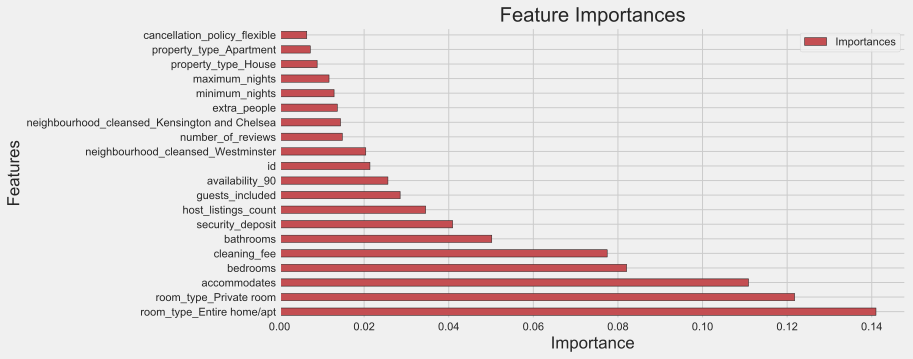

In [120]:
feature_importance_plot(X_train, best_random, 'rf_importance')

                        Importances
accommodates              26.135498
room_type                 16.764929
bedrooms                   7.875720
cleaning_fee               7.423024
neighbourhood_cleansed     6.501021
host_listings_count        5.421999
availability_90            4.618149
bathrooms                  3.467305
id                         3.145055
extra_people               2.936594
security_deposit           2.827568
number_of_reviews          2.666489
property_type              1.688960
minimum_nights             1.609611
maximum_nights             1.204679
guests_included            0.986183
host_response_rate         0.875026
cancellation_policy        0.764867
review_scores_rating       0.601925
step-free access           0.297687


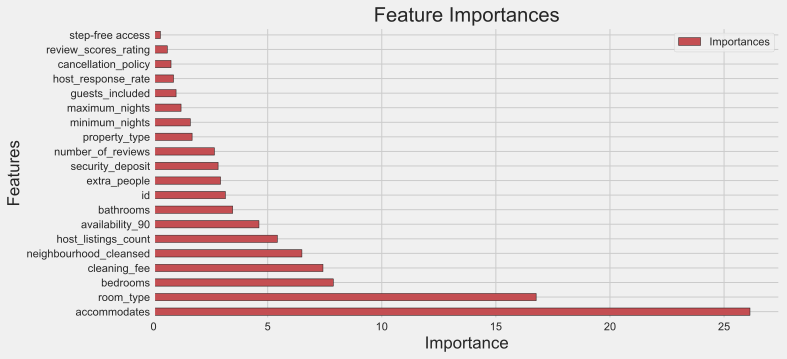

In [121]:
feature_importance_plot(X_train_cat, best_cb, 'cat_importance')

# Conclusions

* The demand for Airbnb increased exponentially over the years. 
* Demand increases along the year until August and slowly decrease.
* The cheapest month to book Airbnb is May.
* Richmond upon Thames borough has the highest average review score ratings.
* Our best model to predict the price is using Catboost which has a r2 score of 73.9%. This means that the model explain 73.9% of the variability in listing price. The result was not good enough. However, price is very different to predict correcly, and the remaining 26.1% may be explained by features that are not in the data. 